In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('./covid19_tweets.csv')

In [3]:
df.head()


,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


In [4]:
df.shape

(179108, 13)

### Task
- Text Preprocessing
- Sentiment Analysis
- Keyword extractions
- entiity extration

In [5]:
df.columns

Index(['user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'is_retweet'],
      dtype='object')

In [6]:
df['source'].unique()

array(['Twitter for iPhone', 'Twitter for Android', 'Twitter Web App',
       'Buffer', 'TweetDeck', 'Twitter for iPad', 'Africa Newsroom',
       'Blood Donors India', 'TweetCaster for Android',
       'Alexander Higgins', 'IFTTT', 'Hootsuite Inc.', 'Sprout Social',
       'Sprinklr', 'assarofficial', 'IAMBLOG2TWITTER', 'CrowdControlHQ',
       'COVID19-Updates', 'EveryoneSocial', 'Dynamic Signal', 'Instagram',
       'TweetCaster for iOS', 'GlobalPandemic.NET', 'Venrap Radio',
       'HeyOrca', 'Twitter for Advertisers', 'Paper.li',
       'Twitter Media Studio', 'Twitter for Mac', 'dlvr.it',
       'Cheap Bots, Done Quick!', 'Prof. Shanku', 'LaterMedia',
       'SEMrush Social Media Tool', 'Twitterrific for iOS',
       "Sebastian's Twitter Bot", 'Threader_client', 'COVID19FactoidBot',
       'PwC UK SMART', 'tweet pro stiff', 'UK COVID-19 Alerts',
       'Resistbot Open Letters', 'preprint-alert', 'ContentStudio.io',
       'Peeping Moon', 'TweetAutomaticos', 'Orlo', 'AgoraPulse Ma

In [7]:
df['source'].value_counts()

Twitter Web App              56891
Twitter for Android          40179
Twitter for iPhone           35472
TweetDeck                     8543
Hootsuite Inc.                7321
                             ...  
DataBlogger                      1
Dear_Assistant                   1
OnlyPultCom                      1
Washington Square Parkerz        1
Radiology: AI app                1
Name: source, Length: 610, dtype: int64

In [8]:
df['source'].value_counts().nlargest(20)

Twitter Web App         56891
Twitter for Android     40179
Twitter for iPhone      35472
TweetDeck                8543
Hootsuite Inc.           7321
Twitter for iPad         4336
Buffer                   2728
Sprout Social            1833
Instagram                1759
IFTTT                    1545
dlvr.it                   681
GlobalPandemic.NET        679
LinkedIn                  628
COVID19-Updates           625
Twitter Media Studio      596
WordPress.com             537
HubSpot                   513
Sprinklr                  497
FS Poster                 414
Dynamic Signal            391
Name: source, dtype: int64

<AxesSubplot:>

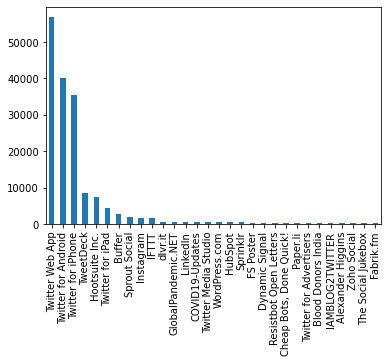

In [9]:
df['source'].value_counts().nlargest(30).plot(kind='bar')

In [10]:
df.head(5)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


In [11]:
import neattext.functions as nfx
# pip install nexttext

In [12]:
dir(nfx)

['BTC_ADDRESS_REGEX',
 'CURRENCY_REGEX',
 'CURRENCY_SYMB_REGEX',
 'Counter',
 'DATE_REGEX',
 'EMAIL_REGEX',
 'EMOJI_REGEX',
 'HASTAG_REGEX',
 'MASTERCard_REGEX',
 'MD5_SHA_REGEX',
 'MOST_COMMON_PUNCT_REGEX',
 'NUMBERS_REGEX',
 'PHONE_REGEX',
 'PoBOX_REGEX',
 'SPECIAL_CHARACTERS_REGEX',
 'STOPWORDS',
 'STOPWORDS_de',
 'STOPWORDS_en',
 'STOPWORDS_es',
 'STOPWORDS_fr',
 'STOPWORDS_ru',
 'STOPWORDS_yo',
 'STREET_ADDRESS_REGEX',
 'TextFrame',
 'URL_PATTERN',
 'USER_HANDLES_REGEX',
 'VISACard_REGEX',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__generate_text',
 '__loader__',
 '__name__',
 '__numbers_dict',
 '__package__',
 '__spec__',
 '_lex_richness_herdan',
 '_lex_richness_maas_ttr',
 'clean_text',
 'defaultdict',
 'digit2words',
 'extract_btc_address',
 'extract_currencies',
 'extract_currency_symbols',
 'extract_dates',
 'extract_emails',
 'extract_emojis',
 'extract_hashtags',
 'extract_html_tags',
 'extract_mastercard_addr',
 'extract_md5sha',
 'extract_numbers',
 'extr

### Remove some noise
- remove userhandles
- remove hasttags
- remove urls
- remove emojis
- remove special chars

In [13]:
df['text'].apply(nfx.extract_hashtags)

0                                      []
1                                      []
2                              [#COVID19]
3                              [#COVID19]
4         [#CoronaVirusUpdates, #COVID19]
                       ...               
179103                       [#WearAMask]
179104                         [#COVID19]
179105                                 []
179106                         [#COVID19]
179107                                 []
Name: text, Length: 179108, dtype: object

In [14]:
df['extracted_hashtags'] = df['text'].apply(nfx.extract_hashtags)

In [15]:
df['extracted_hashtags']

0                                      []
1                                      []
2                              [#COVID19]
3                              [#COVID19]
4         [#CoronaVirusUpdates, #COVID19]
                       ...               
179103                       [#WearAMask]
179104                         [#COVID19]
179105                                 []
179106                         [#COVID19]
179107                                 []
Name: extracted_hashtags, Length: 179108, dtype: object

In [16]:
df[['extracted_hashtags', 'hashtags']]

,extracted_hashtags,hashtags
0,[],NaN
1,[],NaN
2,[#COVID19],['COVID19']
3,[#COVID19],['COVID19']
4,"[#CoronaVirusUpdates, #COVID19]","['CoronaVirusUpdates', 'COVID19']"
...,...,...
179103,[#WearAMask],['WearAMask']
179104,[#COVID19],['COVID19']
179105,[],NaN
179106,[#COVID19],['COVID19']


In [17]:
df['clean_tweets'] = df['text'].apply(nfx.remove_hashtags)

In [18]:
df[['text', 'clean_tweets']]

,text,clean_tweets
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey @Yankees @YankeesPR and @MLB - wouldn't it...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,@diane3443 @wdunlap @realDonaldTrump Trump nev...
3,@brookbanktv The one gift #COVID19 has give me...,@brookbanktv The one gift has give me is an ...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel \n@kansa...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks @IamOhmai for nominating me for the @WH...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! https://t.c...
179105,@CTVNews A powerful painting by Juan Lucena. I...,@CTVNews A powerful painting by Juan Lucena. I...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for a..."


In [19]:
df['clean_tweets'] = df['clean_tweets'].apply(lambda x: nfx.remove_userhandles(x))

In [20]:
df[['text', 'clean_tweets']]

,text,clean_tweets
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey and - wouldn't it have made more sen...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,Trump never once claimed was a hoax. W...
3,@brookbanktv The one gift #COVID19 has give me...,The one gift has give me is an appreciatio...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel \n ...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks for nominating me for the challen...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! https://t.c...
179105,@CTVNews A powerful painting by Juan Lucena. I...,A powerful painting by Juan Lucena. It's a t...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for a..."


In [21]:
df['clean_tweets'].head(12)

0     If I smelled the scent of hand sanitizers toda...
1     Hey     and   - wouldn't it have made more sen...
2           Trump never once claimed   was a hoax. W...
3       The one gift   has give me is an appreciatio...
4     25 July : Media Bulletin on Novel     \n      ...
5         deaths continue to rise. It's almost  as b...
6     How   Will Change Work in General (and recruit...
7     You now have to wear face coverings when out s...
8     Praying for good health and recovery of   .\n \n 
9     POPE AS GOD - Prophet Sadhu Sundar Selvaraj. W...
10    49K+ Covid19 cases still no response from \n  ...
11    Order here: https://t.co/4NUrGX6EmA\n\n       ...
Name: clean_tweets, dtype: object

In [22]:
# Cleaning Text: Multiple WhiteSpaces
df['clean_tweets'] = df['clean_tweets'].apply(nfx.remove_multiple_spaces)

In [23]:
# Removing URLS
df['clean_tweets'] = df['clean_tweets'].apply(nfx.remove_urls)

In [24]:
# Removing URLS
df['clean_tweets'] = df['clean_tweets'].apply(nfx.remove_puncts)

In [25]:
df[['text', 'clean_tweets']]

,text,clean_tweets
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey and wouldnt it have made more sense to ha...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,Trump never once claimed was a hoax We all cl...
3,@brookbanktv The one gift #COVID19 has give me...,The one gift has give me is an appreciation f...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks for nominating me for the challenge I n...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020 The year of insanity Lol
179105,@CTVNews A powerful painting by Juan Lucena. I...,A powerful painting by Juan Lucena Its a trib...
179106,"More than 1,200 students test positive for #CO...",More than 1200 students test positive for at m...


### Perfoming Sentiment Analysis

In [26]:
from textblob import TextBlob

In [27]:
def get_sentiment(text):
    blob = TextBlob(text)
    sentiment_polarity = blob.sentiment.polarity
    sentiment_subjectivity = blob.sentiment.subjectivity
    
#     Getting sentiment
    if sentiment_polarity > 0:
        sentiment_label = 'Positive'
    elif sentiment_polarity < 0:
        sentiment_label = 'Negative'
    else: 
        sentiment_label = 'Neutral'
    
    result = { 'polarity': sentiment_polarity, 
                'subjectivity': sentiment_subjectivity, 
              'sentiment': sentiment_label }
    
    return result

In [28]:
ex1 = df['clean_tweets'].iloc[0]

In [29]:
get_sentiment(ex1)

{'polarity': -0.25, 'subjectivity': 0.25, 'sentiment': 'Negative'}

In [30]:
ex2 = df['clean_tweets'].iloc[10]

In [31]:
get_sentiment(ex2)

{'polarity': 0.0, 'subjectivity': 0.0, 'sentiment': 'Neutral'}

In [32]:
df['sentiment_results'] = df['clean_tweets'].apply(get_sentiment)

In [33]:
pd.json_normalize(df['sentiment_results'].iloc[0])

,polarity,subjectivity,sentiment
0,-0.25,0.25,Negative


In [34]:
df = df.join(pd.json_normalize(df['sentiment_results']))

In [35]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,extracted_hashtags,clean_tweets,sentiment_results,polarity,subjectivity,sentiment
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,[],If I smelled the scent of hand sanitizers toda...,"{'polarity': -0.25, 'subjectivity': 0.25, 'sen...",-0.25,0.250000,Negative
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,[],Hey and wouldnt it have made more sense to ha...,"{'polarity': 0.5, 'subjectivity': 0.5, 'sentim...",0.50,0.500000,Positive
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False,[#COVID19],Trump never once claimed was a hoax We all cl...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False,[#COVID19],The one gift has give me is an appreciation f...,"{'polarity': 0.0, 'subjectivity': 0.3571428571...",0.00,0.357143,Neutral
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,"[#CoronaVirusUpdates, #COVID19]",25 July : Media Bulletin on Novel,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral


In [36]:
df['sentiment'].value_counts()

Neutral     75490
Positive    74154
Negative    29464
Name: sentiment, dtype: int64

<AxesSubplot:>

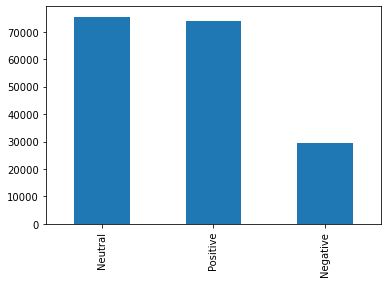

In [37]:
df['sentiment'].value_counts().plot(kind='bar')

<AxesSubplot:xlabel='sentiment', ylabel='count'>

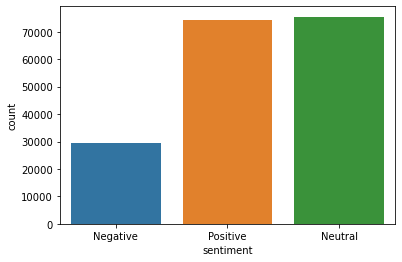

In [38]:
sns.countplot(df['sentiment'])

### Sentiment Extraction

In [40]:
positive_tweet = df[df['sentiment'] == 'Positive']['clean_tweets']
negative_tweet = df[df['sentiment'] == 'Negative']['clean_tweets']
neutral_tweet = df[df['sentiment'] == 'Neutral']['clean_tweets']

In [41]:
positive_tweet.head()

1     Hey and  wouldnt it have made more sense to ha...
6     How Will Change Work in General (and recruitin...
8             Praying for good health and recovery of  
12    👋🏻 — no one will be safe from until everyone i...
13    Lets all protect ourselves from Its real and t...
Name: clean_tweets, dtype: object

In [42]:
positive_tweet_list = positive_tweet.apply(nfx.remove_stopwords).tolist()

In [43]:
negative_tweet_list = negative_tweet.apply(nfx.remove_stopwords).tolist()
neutral_tweet_list = neutral_tweet.apply(nfx.remove_stopwords).tolist()

In [44]:
positive_tweet_list

['Hey wouldnt sense players pay respects A…',
 'Change Work General (and recruiting specifically) via/',
 'Praying good health recovery',
 '👋🏻 — safe safe commit ensure…',
 'Lets protect real numbers climbing fast Continent Lets n…',
 'Second wave Flandersback',
 'COVID Update: infection rate Florida following natural curve experts predicted initial cu…',
 'Good Patriots Volunteer Election Judge Polls open without…',
 'comprehensive review amp Analysis: key ways WASH help reduce transmission…',
 'crosses 2 lakh mark 150055 ppp recovered far positive today 6988/total…',
 'Actor father MrGKReddy tested positive 15/20 days s…',
 'safe place visit guests said hotel meticulous applying hand sanitation als…',
 'CEO live WSU talking “The effects Covid19 students”…',
 'Actionables healthy recovery',
 'understood hadnt missed meeting In…',
 'released new podcast episodes week: Technology Platforms Conduct Telehealth Visits C…',
 'reports 1142 positive cases 29 deaths Saturday Death toll rises 3

In [45]:
# Tokenization
for line in positive_tweet_list:
    for token in line.split():
        print(token)

Hey
wouldnt
sense
players
pay
respects
A…
Change
Work
General
(and
recruiting
specifically)
via/
Praying
good
health
recovery
👋🏻
—
safe
safe
commit
ensure…
Lets
protect
real
numbers
climbing
fast
Continent
Lets
n…
Second
wave
Flandersback
COVID
Update:
infection
rate
Florida
following
natural
curve
experts
predicted
initial
cu…
Good
Patriots
Volunteer
Election
Judge
Polls
open
without…
comprehensive
review
amp
Analysis:
key
ways
WASH
help
reduce
transmission…
crosses
2
lakh
mark
150055
ppp
recovered
far
positive
today
6988/total…
Actor
father
MrGKReddy
tested
positive
15/20
days
s…
safe
place
visit
guests
said
hotel
meticulous
applying
hand
sanitation
als…
CEO
live
WSU
talking
“The
effects
Covid19
students”…
Actionables
healthy
recovery
understood
hadnt
missed
meeting
In…
released
new
podcast
episodes
week:
Technology
Platforms
Conduct
Telehealth
Visits
C…
reports
1142
positive
cases
29
deaths
Saturday
Death
toll
rises
3806
reports
ANI
quot…
Venezuelas
Economy/Budget
tied
Oil
like
Loui

cases
of…
follow
true
freedom
fighter
Shivraj
Singh
Chouhan
Says
Completely
Healthy
Getting
Admitted
COVID19
Hospital
Bhopal…
ALERT:
Federal
Agents
Use
Tear
Gas
Clear
Portland
Protest
Global
Pandemic
News
|
tests
positive
CM
announced
Twitter
ha…
Dogs
sniff
saliva
1000
people
healthy
infected
youre
going
let
denial
old
man
run
country
fing
ground
hope
vet…
Surprised
need
thought
virus
disappeari…
14
day%
New
Cases
Florida
648%
growth
new
cases
14
days
Texas
545%
growth
new
cases
14…
Properly
stated:
Ladies
gentlemen
live
clown
planet
Tata
New
preprint:
Country
distancing
reveals
effectiveness
travel
restrictions
COVID19
According
data
Pakistan
successfully
flattened
curve
81%
Coronavirus
patients
hav…
New
preprint:
Anxiety
perceived
risk
COVID19
outbreak
Bangladesh
records
38
new
COVID19
deaths
Yesterday
conference
met
referees
gave
plan
safe
spec…
New
Study
Highlights
Impact
Pandemic
Families’
Mental
Health
–
NBC
Chicago
New
preprint:
analysis
mortality
Ontario
cremation
data:
Rise
cr

NEGATIVE
WORD
POSITIVE
POLICE
Update
▶️Total
positive:
8232
▶️Total
discharges:
6314
▶️Total
de…
Actor
Father
MrGKReddy
Tested
positive
15/20
Days
s…
going
Houston
visit
parents
new
they…
happy
baseball
60
game
season
causing
major
fantasy
league
anxiety
😩
Changing
r…
Nigeria
live
pandemic
year
says
DG
MIDDAY
BULLETIN
|
25
July
➡️38
new
cases1
recovery
amp
1
death
reported
today
till
9pm
▶️The
to…
India’s
poultry
industry
lost
13
billion
rupees
($182
million)
weeks
speculation
social
media…
Amazing
read
“A
child’s
brain
needs
words
lessons
organized
activities:
needs
love
friend…
politics
gets
way
pandemic
it’s
heartening
world’s
scientists
stand
each…
Honble
CM
Madhya
Pradesh
Shri
Shivraj
Singh
Chouhan
Ji
tested
positive
Praying
speedy
recovery
good
sitting
enjoying
pre
haunts
happening
globally
brought
large
profit
logistics
bus…
brought
fore
kinder
India
New
Sunday
Express
Magazine
finds
reading…
Good
old
British
common
sense
wear
mask
shop
staff
won’t
wear
🤷🏻‍♂️
good
old
conside…
m

arent
bad
good
idea
😷
Africans
capable
liberating
Africans
poverty
war
coronavirus:
vaccine
likely
wont
widely
available
months
2021
says
New
study
shows
microvascular
lesions
11/16
(69%)
patients
severe
👉…
Dear
Twitter
experts
charge
generated
conflicting
information
dont
you…
Shivraj
Singh
Chouhan
tests
COVID
positive
Vietnam
Lauded
Coronavirus
Fight
Local
Case
100
Days
READ
MORE:
drug
treats
cough
COVID19
Ehanire
discloses
advising
healthy
foods
righ…
real
man
afraid
tell
world
dating
real
man
points
gal
friends
Kind…
Barcelona
Legend
Xavi
Tests
Positive
COVID19
Fans
Wish
‘Midfield
Maestro’
Speedy
Recovery
(See
Tweets)…
want
hold
stimulus
package
selfish
reasons
hotel
prec…
Higher
government
spending
isn’t
ideal
“crowds
out”
business
investment
1
reason
im
thrille…
Republicans
forcing
$600
cliff
better
prepared
this…
Fascinating
amp
insightful
Rachel
Davis
Inspiring
confidence
amp
selfbelief
children
music…
😂
Thanks
fabricated
figur…
Thank
campaigning
swim
clubs
running
today
Americ

⬇️
peak
lockdown
(April/May)
allowed
o…
lagi
loh
1
hours
FREE
CP
Bio
DMCome
join
Isnt
strange
people
refuse
wear
masks
happy
wear
tinfoil
hats
Case
Study:
Psychological
Contract
Follow
latest
HR
news
insights
world
of…
Nurses
doctors
amp
health
professionals
frontlines
response
great
risk
infect…
patients
tested
positive
died
Saturday
deaths
death
to…
AlSadd
coach
Barcelona
captain
Xavi
Hernandez
tests
positive
ahead
Qatar
league
restart
patients
tested
positive
died
Saturday
deaths
death
to…
right
wing
fascists
power
saw
virus
way
seize
control
feb
stop
Facing
budget
shortfalls
nearly
100
Texas
mayors
plead
Congre…
READ
MORE:
best
thing
wearing
mask
able
lip
sync
want
public
transport
BREAKING
NEWS:
testers
town
battle
spike
new
normal
Learning
loss
real
death
friend
teacher
traumatic
set
years
Fr…
new
unfamiliar
territory
comes
running
business
time
COVID19
like
a…
Despite
Challenges
Primary
Care
Practice
Improves
Patient
Digital
Tools
Coronavirus
outbreak
latest:
July
19
2020
READ
M

health
leader…
result
prolonged
illness
persons
milder
outpatient
illness
including
young
adults…
Employee
Carleton
Lodge
tests
positive
COVID19
Worrying
stats
London
hospital
showing
significant
increase
stillbirths
lockdown
Authors
sugges…
Indias
testing
hits
record
high
420
lakh
samples
day
involvement
social
partners
designing
implementing
social
economic
measures
p…
design
business
corporate
flyer
postcard
design
24
Hours
Order
Me:
parents
ask
dont
perfect
needed
kin…
We’ve
stepped
older
people
response
We’re
taking
hot
meals
medicines
an…
Credit
⁦
team
Portobello
great
safe
system
place
attitude
civilization
right
with…
“
pandemic
biggest
public
health
crisis
100
years
lives
return
normal…
Hearts
minds
voices
great
way
explore
feelings
free
book
Activities
download…
youre
going
shutter
gatherings
significant
numbskulls
specifically
goo…
blessed
sweet
ji
reined
and…
Alkhidmat
Foundation
Khyber
Pakhtunkhwa
Women
Wing
Trust
conducted
antibodies
free
tests
Hayatabad
Children
Acad…
Dr

t…
newly
launched
UVC
sterilizing
system
Philips
product
kills
Corona
virus
kind
sur…
na
real
weapon
fashioned
shall
prosper
can’t
tell
original
wasn’t
invented
kill
Corona
throat
one…
Converse1100
Regular
Vans1500
Tribal
Vans
2500
interested
call/whatsapp
0719310965
Free
delivery
CBDWithi…
update
25
July
2020
398
new
confirmed
cases
330
new
recoveries
Blockchains
potential
role
historymaking
plan
deliver
COVID19
vaccine
|
World
Economic
Forum…
Football
Chinese
Super
League
kicked
2020
season
tonight
4month
delay
weekend
thing
sign
hear
project
regenerate
Scotla…
Interesting
voluntary
project
follow
pandemia
150
countries
collaborating
()
Love
sign
outside
matter
size
weight
goods
Hatonyan
great
limits
partner
with…
think
good
particularly
John
Roberts
doesnt
stop
spreading…
muddy
field
3rd
cidre
watching
amazing
live
band
scientific
lecture
Instea…
56
new
cases
reported
Bali
today
taking
total
cases
3114
Recoveries
rose
2408
a…
effected
Nikki
Hayley
great
(American
Tragedy)
story
wron

Countries
wear
mask
found
drop
case
of…
ask
ACCOMPLISHED
4
years
(other
bungling
pandemic
response
destroyed
relat…
detailed
report
recovered
patients
chennai
reporting
blood
clots
wor…
New
Healthcare
Marketing
Matters
post:
Lessons
SARSCoV2
Pandemic
Ready
Chief
Engagement…
New
Healthcare
Marketing
Matters
Post:
Reengaging
Patients
Post
COVID19
47
new
cases
reported
today
district
35
cases
belong
Cuttack
Municipal
Corporat…
went
phlebotomy
clinic
week
surprised
nurse
wore
mask
covering
nose…
new
old
man
blog
post:
Ways
Stay
Safe
SARSCoV2
(Coronavirus)
Surge
Enjoy
Going
Out…
new
old
man
blog
post:
AllTime
Favorite
Movie
List
Whats
List
Mother
fvcker
🤬🤬🤬🤬🤬
JFC
don’t
know
I’m
surprised
can’t
believe
it’s
practically
F’N
AUGUST…
Great
world
star
Sebastian
Lightfoot
Official
old
man
blog
update:
Ways
Wearing
Face
Mask
Fun
misleading
new
story
didnt
die
died
FAT
F**K
🤦🏾‍♂️
reckon
flu
uptake
numbers
fallen
(people
saw
scam)
needed
someth…
reports
398
new
cases
330
|
Puducherry
179
percent
pos

25/07/2020
12
pm)…
Join
Student
Recruitment
Team
learn
changes
we’re
working
light
of…
“The
cancer
care
fantastic
want
people
corner
feel…
reading:
Path
Integrative
Protocol
Multiple
Natural
Agents:
Interview…
happened
1st
case
got
amp
days
new
cases
‘…
Leo
rapidly
sound
bite
king
publicity
obviously
craves
Taoi…
programme
breaching
regulations
theres
good
reason
allow
be…
organ
body
hurts
🤢
13th
temps
normalized
feel
bit
energetic
💪
tell…
LORD
let
soul
captivity
devil
delivered
right
(Isaiah
49:25)
New
COVID19
Data
20200725
06:00:01
EDT
We’ve
confirmed
source
club
Al
Sadd
squad
underwent
tests
Xavi’s
p…
good
outcome
situation
finally
cars
blocked
arround
making
space…
world
women
averagedo
times
unpaid
care
work—cooking
cleaning
taking
care…
Feel
good
productive
start
weekend
basic
awareness
production
training
Thi…
🟧
Total
Confirmed:
15754490
🟩
Total
Recovered:
9059318
🟥
Total
Deaths:
640029
update:
20200725
10:00
(…
people
arrested
owners
1900
vehicles
penalised
Greater
Noida
Friday

families
wel…
Madhya
Pradesh
CM
Shivraj
Singh
Chouhan
says
tested
positive
(PTI)
Register
join
city
Amsterdam
know
drive
rehabiliaion
effect
survivi…
great
FREE
resource
written
Sadie
Hopson
help
cope
uncertain…
pandemic
created
havoc
higher
education
system
globally
Universities
colleges
bee…
notsorosy
hopes
reasons…
drawings
book
helped
people
cris…
Awesome
track
ashamed
opened
Public
country
increasing
number
new…
Like
fucking
14
Feb
Chevening
mistress
2
weeks
sort
divorce
the…
developed
new
contactless
touchscreen
vehicles
reduce
bacteria
virus
tr…
press
coverage
Miss
England
Virtual
Semi
Finalist
Lizzy
Vote
Livestream
website
yo…
original
Ritetek
Juice
Extractor
OGTMart
👇
people
lot
imagine
🤔😏
Far
“great
equalizer”
pandemic
intensifying
health
inequalities
v…
▪
ENTRY
BAN
NEW
FOREIGN
STUDENTS
allow
international
students
enter
taking
courses
online
onl…
Xavi
tests
positive
COVID19
🥺
DOH
records
2019
new
cases
1278
new
recoveries
20
deaths
Saturday
Total
number
confirmed
cas…
▪
COVI

today:
1067
Total
cases:
74858
New
recoveries:
1054
Total
recoveries:
54061…
observed
viral
load
correlate
age
particular
older
individuals
young
chil…
Best
Animation
Production
Compan
Went
morning
laid
social
distancing
observed
organisers…
amp
thing
Guys
y’all
food
high
tasting
like
3
Niggas
🙄
Rashi
Diagnostic
Center
NABL
Certified
Laboratory
Bangalore
provides
best
packages
health
che…
Ive
masked
gloved
shops
March
live
village
nece…
talk
Vshaped
Ushaped
recovery
bring
complete
guide
incor…
Good
morning
admin
yes
yes
tell
you’re
best
best
tipster
thanks
yest…
tax
dollars
like
better
pepper
spray
rubber…
LIVE
BLOG:
Austrian
coronavirus
testing
push
hotels
falls
far
short
target
via…
times
biggest
source
happiness
news
moved
No1⃣
the…
Coronavirus
updates:
Muppets
share
tips
Zoom
etiquette
visible
global
government
Project
proud
fouryearold
donning
unsure
knows
protectin…
unfortunate
true
culture
politics
confronts
science
culture
politics
trumps…
acceptable
bump
elbows
enjoy
soon
hope

need
people
ex…
greatest
number
discharged
time
mind
blowing
Las
Las
God
dey
us…
swear
cycling
taken
brain
Jeremy
lol
c…
Aside
reassessing
pandemic
allowed
clean
Facebooks
friend
list
(those
barely…
based
New
York
University
grants
10
outstanding
aiming
mitigate
Th…
📍India
records
highest
42
lakh
tests
single
day
👉Nearly
16
cr…
Thanks
God
keynote
speaker
International
Expert
Sharing
Conference
entitled
“The
new
normal
strategies…
Honble
Governor
appealed
recovered
persons
donate
plasma
great
humanitarian…
Great
opportunity
thanks…
Seeing
lot
people
proud
going
shop
wearing
mask
Like
badge
honour
p…
wear
mask
😷
particularly
important
protect
vulnerable
Covid19
people
like
b…
hot
today
Trending
Vattel
live
monitor:
Madhya
Pradesh
CM
Shivraj
Singh
Chouhan
says
tested
positive
latest
Journalism
Daily
Catch
massive
grand
opening
SALE
soon
stay
safe
stay
healthy
soon
Hey
India
Help
fight
looking
good
experience
AWS
API
Gateway
/
AWS
La…
tested
positive
𝐊𝐚𝐫𝐦𝐚
𝐡𝐚𝐬
𝐧𝐨
𝐦𝐞𝐧𝐮
𝐘𝐨𝐮
𝐠𝐞𝐭
𝐬𝐞𝐭
𝐬𝐞𝐫𝐯𝐞𝐝
𝐰𝐡

contrast
90%
outpatients
influe…
PTINews:
Arunachal
Pradeshs
tally
crosses
1000
mark
65
new
cases
active
cases
661:
Health
Dept
dark
circumstances
positive
effect
upping
willingness
seriousl…
Weekend
started
early
Hospital
quarantine
facilities
fast
reaching
capacity
Beijing
pledges
support
te…
Open
invitation
attend
crucial
webinar
‘Building
Accessible
Safe
amp
Inclusive
Indian
Cities’
prog
at…
3/6
spiking
Breaking
guidelines
sure
way
making
sure
leaves
perm…
July
24
New
Town
Development
Authority
(NKDA)
installed
collect
swab
samples…
Ask
large
range
products
more…
Nice
digest
recent
projects/news
celebrated
wedding
safety
precautions
bc
matter
know
Nollywood
biggest
movie
industry
world
finest
stars
actors
a…
energy
amp
money
classrooms
safe
spent
radically
reimagining
education
time
tha…
Billion
Dollar
Question:
anybody
seen
called
fair
election
Speech
spreads
If…
Dr
Alison
Tedstone
chief
nutritionist
Public
Health
England
said
current
evidence
clear
ov…
Im
proud
team
set
massive
c

summer
lovely
people
work
work
wear
regardless
Pl…
Covid
19
:
Doctor
New
STNM
emergency
ward
tested
positive
Emergency
ward
contained
week
Manipal
C…
understand
peaceful
protest
seeing
crowds
concern
Obviously
socially
d…
Young
strong
athletic
people
die
care
condolences
James
Doby’s
family
fr…
India
registers
49000
new
coronavirus
cases
24
hours
Doctors
innovation
check
patients
question
Doctors
work
😷(Whats
app
fwd
vide…
😠After
tested
positive
president’s
son
apparently
took
jet
duty
community
balanced
right
confidentiality
Best
ethics
case
study/analysis…
Despite
lifting
restrictions
threat
real
friend
Ikram
Qureshi
Ikram
Jeweller…
like
wear
bed
shower
taking
💩
I’m
genuinely
interested…
news:
Ohio
reports
1560
new
coronavirus
cases
2nd
highest
date
Friday
update
Qatar
deserving
best
standard
medical
treatment
Social
distancing
apps
Cut
public
transportat…
1968
new
cases
18
new
deaths
Philippines
[9:38
GMT]
Thanks
president
Bunker
Asskiss
doctors
Texas
forced…
*Singleday
spike
48916


got
quickly
control
Masks
Notice
it…
amp
leaders
simplest
fashionable
amp
sustainable
Apparel
Accessories…
documentary
“my
75
days
lockdown
journey
“
inspiring
story
Tell
love
lie😌😅😢
follow
back💞
try
reply
Dms
Trump
Admin
Secures
600M
Virus
Vaccine
Doses
Free
Americans
vaccines
wi…
Melbourne
regional
Victoria
interconnected
far
providing
goods
serv…
good
thing
come
pandemic
reported
Covid19
cases
weeks
June
READ
MORE:…
Watching
checked
Melbourne
household
wife
positive
an…
predictions
going
2020
future
predicted
He…
great
chance
given
save
environment
shown
limit
lifestyle
w…
meters
suppose
radiation
distance
clos…
🇻🇳
Vietnam
bans
imports
wild
animals
reduce
risk
future
pandemics
Vietnamese
government
“announc…
Fireplace
woods
available
free
delivery
Midrand
Tembisa
Kempton
amp
surrounding
areas
15
Kg
pack
R25
R20
w…
Artwork
Quarantine
😀
covid
active
active
covid
😀
Guess
high
time
explore
personal
fashion
creative
lens
TPlane
Rumours
room
great
clip
forgotten
key
workers
schools
Allana

create
narrative
It’d
nice
effor…
Home
care
people
suspected
confirmed
COVID19:
Discount
50%
paper
publishing
+
Webinar
participation
offer
great
flat
rates
deliveries
Close
consulate
wants
China
🇨🇳
visit
rn
fr
serious…
➖➖➖➖➖➖➖➖➖➖➖
➕
24465
New
Cases
➕
1155
New
Deaths
➖➖➖➖➖➖➖➖➖➖➖
➡️
15955910
Cases
➡️
643040
D…
Total
positive
cases
Police
stand
8232
including
1825
active
cases
6314
recoveries…
State
Govt
announced
provide
Rs
7500/
handling
disposal
positive
dead…
Best
treatment
given
govt
hospitals
Telangana
based
guidelines
issued
by…
Big
disappointments:
amp
Romney
like
Flake
love
$$$
amp
power
told
Ame…
group
teenage
girls
Afghanistan
built
ventilator
old
car
parts
help
country’s
fight
a…
Inaugurated
Covid
Kiosk
Automatic
Vending
Machine
Patna
JN
railway
station
passengers
trave…
away
week
long
break
Freeview
TV
Ive
watched
BBC
Sky
years
standard…
1106
new
cases
19
new
deaths
Ukraine
[8:55
GMT]
Madhya
Pradesh
Chief
Minister
Shivraj
Singh
Chouhan
tests
positive
COVID19
goes
quarantine


new
cases
Estonia
[8:44
GMT]
countries
world
struggling
longer
distance
sad
happening…
TV
soaps
prepare
air
fresh
episodes
July
27
spe…
People
complaining
they’ve
gained
weight
quick
fix
turned
cra…
person
gt40
years
old
suddenly
collapses
shouldn’t
3
differen…
damn
knew
f*cked
Hearing
person
love…
Live
concerts
events
canceled
Greece
summer
coronavirus
pandemic
C…
wicked
enemy:
Australias
coronavirus
success
story
unravelled
Indias
CM
test
positive
recent
times
world
leader
openly
suggesting
😲🤨
gt
age
powerful
tool
raise
dawned
going
untold
number
interns/student
teachers
fresh
college
grad…
Weekends
staying
Especially
wants
mingle
Knowing
“poo…
9/11
huge
manipulation
recent
history
ob…
Morning
happy
weekend
I’m
cashing
big
fixed
matches
l
bought
your…
Partnerships
Collaborations
critical
post
people
coming
together…
Bhopal:
ambulance
arrives
residence
Madhya
Pradesh
CM
tests
positive
for…
35yearold
positive
man
homeisolation
dies
suicide
Patna
Bihar
read
Thi…
✳️
MIDDAY
BULLETIN
|
25


gots
store
👀
Huge
thanks
picking
Grand
Opening
877
new
cases
38
new
deaths
Kyrgyzstan
[8:28
GMT]
info
brilliant
Reality
TV
Star
president
we‘re
“wave
one”
“Simultaneous”
wave…
3
days
1000+
confirmed
cases
saying
it’s
going
like
this…
➖➖➖➖➖➖➖➖➖➖➖
➕
17076
New
Cases
➕
982
New
Deaths
➖➖➖➖➖➖➖➖➖➖➖
➡️
15948521
Cases
➡️
642867
Dea…
Europe
countries
Far
East
past
peak
cases
deaths
ru…
city
centre
right
time
lockdown
March
Initial
assessment
screwed
Yes
test…
problem
narrative
“we
didn’t
know
better
time”
i…
Madhya
Pradesh
CM
Shivraj
Singh
Chouhan
says
tested
positive
Good
Morning
😷😷😷😷
buy
pint
milk
🐮
leech
sucking
penny
host
Thanks
Yahweh
drugged
Christians
Friends
Israeli
Defe…
Chief
Minister
Tests
Positive
self
amplifying
RNA
vaccine
Hes
actually
deadly
pandemics
plus
economic…
GREAT
BETS
WKNDamp
free
picks
disciples
cashing
summer
BEST
BETS
amp
free
picks
742%
wins
MLB
⚾️…
natural
capital
underpin
major
sectors
economies
African
countries
including
a…
temporarily
removed
large
parts
existenc

UK
USA
relative
obesity
amp
cardiovascular…
Lost
good
yesterday
virus
cautious
wear
mask
social
distance
early
March
went
UK…
139
new
cases
reported
Puducherry
today
till
10am
taking
total
number
cases
Union
Territ…
1320
new
positive
cases
reported
Odisha
taking
total
number
cases
24013
includin…
Total
positive
cases
Maharashtra
Police
stand
8232
including
1825
active
cases
6314
recoveries
a…
557
new
positive
cases
6
deaths
reported
Rajasthan
till
1030
today
total
number
cases
i…
Opposition
AINRC
legislator
N
J
Jayabal
tested
positive
MLA…
MADHYA
PRADESH
CHIEF
MINISTER
Tested
Positive
Absolutely
love
Brilliant
Morning
lessons
gorgeous
dog
wearing…
hope
counter
staggering
numbers
cases
80
MT
consignment
liquid
hand
wash
of…
claims
10
lives
3
Ganjam
2
Balasore
amp
Sundargarh
1
Gajapati
J…
perfect
week
⁦
Small
study
pandemic
tells
us:
Luckily
unli…
Hello
Suzanne
Let
ASAP
Thanks
reading
story
pos…
➖➖➖➖➖➖➖➖➖➖➖
➕
16199
New
Cases
➕
944
New
Deaths
➖➖➖➖➖➖➖➖➖➖➖
➡️
15947644
Cases
➡️
642829
Dea…
W

tests
positive
whilst
conclude
social
distancing
effective
reducing
transmission
went
ful…
Lancet
article
week:
actions
border
closures
lockdowns
high
rate
COVID19
testing
wer…
Boris
plans
start
obesity
ironic
cases
people
admitted
hospital
amp
i…
Today
reported
1320
new
positive
cases
taking
total
number
cases
24013
including
152…
emergence
huge
impact
global
industry
time
witnessing…
Wash
hands
frequently
thoroughly
soap
water
alcoholbased
hand
rub
kills
virus
may…
Latest
News:
CM
tests
positive
flow
“Give
raw
data
don’t
trust
way
ate
manipulated
People
making
proje…
lauds
special
talent
singing
Shape
amid
treatment:
brightened
day
…
Facemasks
comfort
blanket
necessity
people
spending
start
boostin…
Madhya
Pradesh
CM
tests
positive
care
Sir
Soon
Tired
old
job
Planning
start
business
greatest
career
opportunity
might…
CSA
COO
wins
appeal
suspension
‘ready
return’
|
Madhya
Pradesh
CM
tests
positive
Heres
said:
Stay
tuned
to…
➖➖➖➖➖➖➖➖➖➖➖
➕
16173
New
Cases
➕
944
New
Deaths
➖➖➖➖➖➖➖➖➖➖➖
➡️

02:30:01
EDT
Blood
Movement
Unity
wants
Stay
Safe
Social
distancing
Quarantine
Flatten
curve
reports
377
new
cases
states
tally
crosses
24000
mark
Follow
live
updates:…
Drug
users
face
withdrawals
unsafe
needles
jeopardises
harm
reduction
worldwide
new
study
shows…
Read
article
telemedicine
remain
popular
Here’s
interesting
story
new
breakthrough
tackling
journey
drug
discovery
mark…
Join
tell
governments
need
free
protect
people
threat
corporate…
talked
friend
kind
stranger
wind
nervous
…
standard
hospital
treating
patients
officially
opened
Harare
Thursd…
cases
deaths
counted
disappear
ALERT:
Activists
file
lawsuit
Trump
protect
protesters
Chicago
That’s
right
–
suing
protect
crimi…
Govt
Puducherry
reports
139
new
cases
Puducherry
today
till
10am
total
number
cases
U…
Dont
miss
webinar
“palliative
care
response
organized
partnership
with…
Update
:
2507
20
Thailand
reported
3
new
coronavirus
cases
Saturday
0
deaths
reported
total
now…
Okay
folks
pray
Gulf
Coast
area
hands
hot
spot
for

cases
reported
Puducherry
today
till
10am
taking
total
number
cases
Union
Territ…
60
year
old
Florida
shot
head
listed
death
think
finally
identified
th…
reports
159
new
deaths
24
hrs
Singleday
spike
48916
positive
cases
amp
757
deaths
24
hours
tomorrow
will…
*This
wont
deprive
breathing
comfortably
*It
wont
stop
slaying
effortlessly
*And
c…
lies
man’s
greatest
mistake
generally
develops
selfishly
development
eventual…
interferon
beta
drug
treating
patients
Southampton
Uni
success
Oh
amp
incidentally
makes…
time
struggling
stem
spread
social
gathering
violation
of…
⭕Singleday
spike
48916
positive
cases
amp
757
deaths
24
hours…
South
Korea
records
113
new
cases
overseas
High
Alert
Thrissur
Triple
Lockdown
Irinjalakuda
want
SC
stuck
apt
Fear
works
mysterious
ways
🤞🏻I
safel…
need
find
integral
unified
system
fit
natu…
Aurangabad:
40
people
test
positive
157
million
people
world
diagnosed
898
million
people
ha…
Public
Health
England
calls
action
obesity
Covid19
fight
interesting
terms
high

plus
FREE
WhatsApp
month
Plus…
total
4045
samples
tested
106
people
tested
positive
coronavirus
Daily
New
Cases
IndiaHIGHEST
Novel
Coronavirus
Daily
Cases
Daily
New
Cases
Cases
DayData
24/07/2020…
teams
started
early
preparation
weekends
food
hamper
blanket
distributions
Faridkot
inspector
general
Kaustubh
Sharma
tests
positive
SareeClad
Mannequin
Tracks
Customers
Sensor
amp
Offers
Sanitizer
Madurai
Technology
Good
Use…
Lol
Mara
God
Father
yena
reported
23
new
imported
case
bringing
total
225
New
research
identifies
6
potential
strains
COVID19
Singleday
spike
48916
positive
cases
amp
757
deaths
24
hours
Total
po…
Sadar
Hospital
Coxs
Bazars
key
government
medical
facility
district
capable
treating
its…
Elections
consequences
citizens
elect
underqualified
overprivileged
white
males
adore
t…
hack
live
Join
participants
hack
Stay
tuned
updates
Powered
by…
Kind
sums
public
opinion
early
election
Brutally
candid
assessment
flailing
administration
long
term
impact
PLAN
for…
(9/9)
+113
confirm

Confirmed:
Embassy
letters
needed
Immigration
’visa
extension’
Hello
East
Japan🍵😺
THC
(cannabis)
cures
🌿
success
rate
100
percent
(on
animal
testi…
India🇮🇳
ahead
bcome
stricken
country
world🌍
crowned
3rd
most…
chances
pay
credit
card
completely
pandemic
high
essential
items
i…
way
2
start
day
😋
Happy
😋
🥓
👨‍👩‍👧‍👧
~…
Buy
10
packs
amp
1
free
good
offer
combat
Thankfully
morning
lowest
hospitalised
cases
peak
10
confirmed
po…
best
way
prevent
spread
infections
decrease
risk
getting
sick
keeping
hands
cle…
Santati
Fertility
Center
IVF
Test
Tube
Baby
Center
Information
Visit
C…
Censorship
channel
renowned
sto…
dont
worry
going
place
UAE
strict
social
distancing
hygiene
guidelines…
🤔🤣🤣😷
Unilever
reports
ice
cream
sales
people
home
deodorant
sales
down…
Cities
Climate
Death
Traps
New
Republic
https://c
disrupted
tourism
trade
cut
remittances
pacific
island
countries
Learn
the…
“a
great
job”
view
steady
rise
cases
district
administration
declared
fourday
total
shut…
|
28
new
positive
cases
repo

new
record
Covid19
cases
Friday
July
24
78009
new
cases
Check
latest
update
📌Increase
COVID19
cases
24
hrs:
48749
dist…
predict
soon
businesses
posting
signs
read:
cover
mouth
nose
m…
74k
new
cases
1130
new
deaths
general
pro
life
point
birth
kids
Dont
c…
Human
trial
started
man
Delhi
got
indigenously
developed
Vaccine
shot
AIIMS
today
Apar…
3step
safety
check
staff
way
available
order
Today…
|
10
patients
die
Total
deaths:
130
United
States
breaks
record
new
daily
cases
78000+
New
UPDATE
sure
following
mother
accurate
date
inform…
National
directives
management
adopt
simple
healthy
habits
safe
other…
Statewise
details
Total
Confirmed
cases
(till
25
July
2020
8
AM)
➡️States
w…
remember
Johns
Hopkins
tracking
better
bangon
|
10
patients
die
Total
deaths:
130
Statewise
details
Total
Confirmed
cases
(till
25
July
2020
8
AM)
➡️States
w…
confirmed
17th
death
Saturday
84yearold
male
patient
died
Pamela
Youde
Nethe…
Singleday
spike
48916
positive
cases
amp
757
deaths
24
hours
Total
positive
c

density
650000
crammed
2…
Inviting
New
Issue
Release
Month
July
tally
State
crossed
24K
detection
1320
new
cases
24
hours…
recent
calamities
including
lackadaisical
attitude
environment
Ev…
¼
Americans
lost
savings
income
new
findings
NORC’s
COVID
Response
Tracking…
right
segment
rest
world
solves
denies
existence
Hushpuppi
sentenced
death
click
link
aee
reports
1320
positive
cases
24
hours
Quarantine:
887
Local
Contacts:…
Today
person
taught
sing
died
COVID
world
little
darker
Rest
peace
AW
Immigration
Customs
Enforcement
issued
updated
guidance
stated
new
international
be…
saw
Archies
Unique
Swastik
Rakhi
Thread
amp
RoliTika
Men/Boys
Set
2
…
encouraging
clinical
trial
results
promising
updates
a…
TEST
POSITIVE
COVID19
exclusive
report
needs
shared
thro…
Interior
Health
adds
new
locations
people
exposed
3
new
cases
Thailand
[5:49
GMT]
Big
B
thanks
fans
says
misses
Sunday
session
meet
greet
|
|…
48916
new
COVID19
cases
amp
757
deaths
reported
India
24
hours
1336861
total
positive
cases

exercise
suffering
effects…
Amid
Golden
Cards
Taro
Devi
amp
Darshan
Kumar
suffering
fro…
129
million
confirmed
cases
India
partners
continue
help
families
way
possible
fight
a…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
Surely
throw
book
Eve
Limberiou
aka
stunt
considering
serious…
company
provide
Group
Insurance
sufficient
sure
Policy…
Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
Covid19
postponed
PCS
let
leave
Ready
South
ready
PNW
rearview…
Singleday
spike
48916
positive
cases
757
deaths
India
24
hours
Total
positive
cas…
Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
Corona
follow
instructions
safe
daughter
Lifes
Greatest
Gift
Lord
times
everyday
angel
has…
Thanks
highlighting
stories
loved
ones
LTC
residents
months
n…
Florida
new
cases
capita
week
Florida’s
reported
cases
10%
1
week
ago
Lou…
deniers
anti
people
anti
people
die
amp
in…
send
50100k
“Federal
Agents”
cities
wether
want
support
of…
Singleday
spike
48916
positi

Direct
payments
💲
families
regardless
immigration…
High
temps
humidity
kill
virus
Ppl
hilarious
Wow
dying
GLOBAL
🌎
🔝
Casos
🇺🇸
4248327
🇧🇷
2348200
🇮🇳
1337022
🇷🇺
800849
🇿🇦
421996
🇲🇽
378285
🇲🇽
🇵🇪…
Im
rich
mother
fuckers
Beers
Experts
certain
N95
masks
valves
protect
user
don’t
prevent
person
spreading
COVI…
deserve
Trust
global
pandemic
want
thoughtful
party
charge
dont
want
T…
Latest
update
Malaysia
July
24
remember
normal
like
Sweet
Caroline
banned
Lol
😂😂😂
👏🏼👏🏼
Proud
Thank
service
primarily
enters
body
mouth
nose
Inhalation
contaminated
air
cause
victim…
Good
news
✔
international
👨‍🏫👩‍🎓:
new
international
students
allowed
enter
✈
🇮🇱
t…
interesting
community
today
saw
far
people
wearing
masks
amp
wonder:
is…
hope
checking
posts
best
indoor
tough
times
like…
manager
retail
difficult
best
times
today
told
fuck
called
faggot…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
Damn
Liars
TV
ADS
24/7
365
days
Year
Insusnce
Setup
injured
Party
Li…
hand
sanitizer
better
exp

people
primary
contacts/family
members
pos…
Humans
mutating
COVID19
virus
fighting
scientists
Natural
selection
survival
fi…
kinda
laugh
people
know
yell
Disney
needing
closed
don’t
feel…
Like
couples
Andres
Estrada
Victoria
Bruce
hit
rough
patch
start
2020
relationship…
Patience
help
human
stay
positive
healthy
mental
personal
health
level…
stop
spread
need
play
Help
protect
need
Introd…
charge
isn’t
win
it’s
bring
chaos
division
kill
Americans
by…
Walk
Dig
dance
line
Beale
Street
Love
music
one’s
wearing
mask
makes
sa…
social
distancing
businesses
adopting
virtual
payment
platforms
expand
new
r…
Apparently
completely
taken
Trump
cant
trust
comes
anymore
sad…
63
new
cases
2
new
deaths
Haiti
[4:25
GMT]
surge
4th
July
parties
right
Shit
like
zero
t…
👩‍🏫How
teachers
preparing
classroom
fall
question
Id
love
engage
educators
wh…
24%
transmission
rate
24%
high
factor
plans
🔥PS:
They’re
attaching
DNA
partially
knows
u
blown
wealthy
Republicans
want
oust
Trump
November’s
election
Republicans

looks
pandemic
happening
rig…
important
thread
read
time
virus
romps
happily
need
sharp
Seriously
hall
2…
Toronto
Blue
Jays
play
home
games
Buffalo
registered
total
35
lakh
cases
Friday
9615
individuals
tested
posit…
Latest
cases
USA
:
407735
Brazil:
2295374
India:
1337255
Source:
Happy
birthday
little
baby
girl
🎂🎈🎉🎉🎈
Rep
24/7/2020
don’t
think
Chris
grasping
concept
man
Stewie
doesn’t
know
he’s
talking
abo…
July
24
2020
Early
Reopen
Gov
Deaths
5653
Gov…
career
share
w
lost
jobs
fab
per…
virus
kill
people
depression
longer
open
busine…
stand
amp
fight
impact
big
world
amp
we…
Weekly
tracker:
Number
new
cases
increase
testing
levels
low
India
ci…
Don’t
JudgeYou
marked
Rev13:17
man
buy
sell
save
h…
case
Son
Man
come
served
serve
lif…
Black
Asian
ethnic
minorities
10
times
likely
stopped
searched
white
people
t…
gaps
charts
Gov
Tator
Tots
admin
claims
system
likely
(and
wh…
doubt
people
buy
turkeys
Yeah
need
sure
it’s
negative
guess
guidelines
change
suit
turdampco…
165/N
THREAD
day
117
(y

new
announcements…
NITRILE
GLOVE
#
Premium
NonLatex
Examination
Gloves
(avoids
latex
allergic
reactions)
#
Soft
comfortable…
Let’s
decongest
hospitals
video
👉
🖋
Sign
“Stop
Trumps
latest
attack
CDC
American
public
health”
I’ll
deliver
copy
officials…
start
pandemic
enforcing
use
masks
major
topic
debate
simple
y…
ltltlt
24
Hours
(10:07pmET
10:05pmET)
New
Record
78336…
international
projects
vaccine
represent
best
humanity
terms
scientific
expert…
posted
01/01/2020
Britains
Death
Knell
story:
today
total
number
confirmed
cases
421
996
total
number…
kissing
ass
Trump
losing
polls
dragging
d…
large
vacant
commercial
space
arent
using…
new
way
counting
infections
(polls
style
calculation)
going
cause
unprecedented
panic
amo…
stay
away
beautiful
country
medical
teams
hospitals
care…
live
Montreal
following
best
daily
local
updatesif
al…
Emily
makes
lot
love
passion
SHOWS
LOVE
hustle
inspiring
Em…
glad
colleagues
incredibly
important
work
Bronx
hits
great
depression
level
unemployment
rate
“S

👎
twentyseven
local
ca…
saying
going
block
religious
services
probably
shouldnt
opening
casinos
Pretty
simi…
today
moment
78009
new
cases
1141
new
deaths
⁦…
realno
matter
quacks
⁦
interviews
⁦
calls
reop…
Latest
count
confirmed
cases
worldwide
0130
GMT
July
25:
JHU
World:
15667461
US:
4106247
Braz…
won’t
allow
new
students
country
onlineonly
classes
👈
click
link…
need
shave
beard
protect
Covid19
Check
story
➡️
I…
racism
cost
Trump
chance
hero
quelling
pandemic
(1)
Helpful
(2)
Relevant
(3)
Contextual
stories
need
right
Heres
blog…
love
novel
CORONAVIRUS
COVID19so
kind
ustheemotionally
abusive
relationship
couplesfamilies
amp
r…
real
Pandemic
Thought
(Covid19)
Fear
real
enemy
manufactured
New
COVID19
Data
20200724
10:00:01
pm
EDT
Moraine
Lake
Banff
National
Park
+
5
places
world
pre
great
plac…
Combating
Misinformation:
Coronavirus
Worse
Flu
click
link:…
OMG
California
eclipsed
NY
cases
today
love
soon
spread
droplets
coughs
amp
sneezes
Physical
distancing
significantly
reduces
risk
of…


care
packages
as…
Adam
Cantor
Jackson
Lewis
practice
breaks
10
cost
saving…
🇨🇳On
Friday
Chinese
mainland
reported:
new
deaths
34
new
cases:
5
imported
cases
29
dome…
second
best
time
act
Governor
Brown
c…
Mahatma
Gandhi
said:
true
source
rights
duty
discharge
duties
rights
n…
New
Research
Report:
COVID19
Impact
Contact
Centers:
Media
Bulletin
status
positive
cases
Telangana
(Dated
24072020)
efforts
check
infant
amp
maternal
mortality
spectacular
Heres
let
our…
COVID19
crisis
forcing
people
aware
mail
dependent
it…
Georgia
Florida
new
Hosp
admissions
Arizona’s
new
hospitalisations
continue
climb
al…
Amazon
Google
Wish
remove
neoNazi
products
information
:
dont
forget
to…
Smithfield
Foods
says
plant
workers
socially
distanced
information
:…
Chevron
improve
diversity
ratio
amid
company
layoffs
information
:
dont
fo…
Tech
stocks
slide
dragging
SampP
Dow
week
information
:
dont
forget
t…
gold
safe
market
turmoil
information
:
dont
forget
to…
Bridgewater
Associates
lays
dozen
employees
infor

visit:
Trump
looks
use
executive
orders
agenda
coronavirus
READ
MORE:
Ram
Page
amp
Realistic
Gheb
TRANSCENDING
EP
Currently
🚨🇿🇦🔥(Artist:
Ram
Page)
🎨Art…
Reopened
Raleigh
private
school
reports
positive
case
Monday
day
latest
project
thats
finished
customized
reflects
the…
causing
drama
Maybe
best
backyard
records
1000
deaths
4th
straight
day
Trump
administration
stressed
need
for…
teachers
refuse
school
rioting
tonight
past
3
weeks
I’ve
60
courtesy
virtual
calls
colleague
Ambassadors
accredited
🇨🇦…
school
safety
concerns
parents
MASS
raising
preparedness
members
Thats
great
news
MDs
unpack
existing
prejudice…
New
York
TimesHyped
Korean
Report
Actually
Shows
Kids
Spreading
22
Ju…
come
pause
weekend
like
thank
nonprofit
charity
social
enterprise
workers…
people
incorrectly
think
affects
elderly
figure
huge
wakeup
Nearly
1/…
companies
face
issues
amid
GHJ’s
David
Sutton
discusses
preparing
mai…
Missed
issues
Situation
Report
Lists
13378853
confirmed
global
cases
(Novel…
possibility
reinfe

Spots:
MidAtlantic
Northeast
COVID19
Rebound…
news:
Coronavirus
Maryland:
Total
Cases
Climb
900
817K
Hospitalizations
Nearly
Flat…
Welp
Sunday
night
New
York
longer
highest
official
rate
infection
the…
Best
Things
Coronavirus
Pandemic
love
critter
masks
Proceeds
TELUS
support…
Death
5
year
old
Dallas
County
Officials
said
1450
Texas
children
age
18…
brotherinlaw
illustrated
awesome
book
Covid19
5
Healthy
Habits
children
adults
need…
ReUp:
Patient
Treated
Plasma
Therapy
Odisha
Cured
COVID19
Check
latest
Treatment
Guidelines
Updates
include
revised
recommendatio…
New
York
reports
9
new
cases
2
new
deaths
bringing
total
confirmed
cases
438425
32665
total
deat…
blushing
ooo
like
night
got
Montreal
airport’
Canada
🇨🇦
blushing
😊…
COMING
UP:
Right
there’s
huge
emphasis
businesses
follow
necessary
guidelines
co…
death
panels
thanks
rest
party
COVID19
patients
‘…
Birx
warns
11
major
cities
including
Indianapolis
Pittsburgh
Baltimore
need
aggressive
steps
miti…
thought
😶
ordered
😷in
public
place

RESOURCES
|
know
English
isn’t
language
created
a…
nation
continues
reopen
parts
experiencing
new
surges
cases
Experts…
new
cases
Interior
officials
report
27
new
cases
today
new
outbreak
Haida…
amp
Challenges
Associated
Rapidly
Onboarding
New
Preparation
Crisis
|
FYI:
THOUSANDS
grandparents
provide
FREE
grandchildren
b/c…
OPINION
mask
works
best
researchers
filmed
people
coughing
sneezing
different
scena…
Staffer
congressman
dies
nearly
400000
confirmed
cases
th…
Exactly
Sir
fact
Buharis
visit
Mali
Northerners
interest…
life
difficulties
overcome
🌟
volunteers
action
preparing
2000
care
packages
harvest
food…
Lady
Canada
Sophie
Grégoire
Trudeau
aims
help
suffering
mental
health
repercussions
of…
Like
mythical
namesake
Sherman
Phoenix
(
hub
Black
entrepreneurs
rose
fro…
need
$6000
3
nights
help
greatly
appreciated
ALERT:
Live
updates:
A’s
vs
Angels
season
opener
Global
Pandemic
News
|
…
handa
good
politician
solved
problem
today
announcing
bars
in…
can’t
politicize
baseball
united
perso

info
amp
inquiry:
🌐…
Portuguese
football
team
latest
victim
harsh
economic
reality
5
Strategies
Retain
Customers
Outbreak
Thank
community
supporting
patrollers
amp
showing
lights
night
‼️❤️
challenging
times
people
face
bereavement
able…
cant
use
creativity
use
Maya
Angelou
3500
people
volunteered
phaseI
human
clinical
trials
India’s
indigenouslydeveloped
va…
week
told
England
months
develop
effective
public
heal…
Follow
LATEST
coronavirus
updates
here:
Temporary
loss
smell
earliest
commonly
reported
indicators
Res…
Simple
tips
kids
active
safe
Coronavirus
pandemic
resulted
firms
cope
reduced
workforce
migrant
workers…
Great
resource
exploring
digital
toolkit
assess…
convince
kids
clowns
funny
killer
ones
horror…
people
need
protection
pandemic
sophisticated
white
collar
crime…
pandemic
takes
away
low
hanging
fruit
wave
hot…
right
hear
guys
worst…
Woman
cop
tests
positive
capital
Given
England
infection
levels
higher
Spain
I’m
surprised
arrivals
UK
to…
Im
hear
obesity
highlighted
major

WORLD
CONTINUED
WITH…
Sincerely
hope
week’s
obesity
strategy
won’t
descend
lifestyle
drift
ad
campaigns
amp
fatshaming
need
t…
It’s
important
remember
poses
real
risk
community
health
service
Know
symptoms…
fabulous
stars
shot
campaigns
home
pandemic
📸🤩
postCovid
world
ready
evolution
writes
Dr
Abdullatif
Alshamsi
president
ch…
Home
care
tips
suspected
confirmed
individuals
stay
home
stay
safe
Maybe
ask
mate
video
calling
followers
right
thing
w…
Neanderthal
DNA
Triggered
Initially
Set
Interesting
have…
businesses
built
reserves
deal
costs
reserve…
Whilst
read
Sunday
Papers
watch
news
employers
excu…
UK
government
website
lists
16
High
Consequence
Infectious
Diseases
WORLD
CONTINUED
WITH…
don’t
open
amp
let
life
continue
normal
that’s
exactly
ground
W…
128
new
cases
(REVISED
total:
2634):
hashtags
amp
(July
26
2020
16:59
HKT)
“
support
enable
continue
invest
ultimately
create
jobs
work
for…
reports
1147
new
cases
deadly
detected
Omani
citizens
raising
th…
Muscles
needed
survive
chest
d

3390
confirmed
cases
390
115%
international
travel
related…
Happy
Sunday
Pharm
pray
pharmacists
world
frontline
fighting
Covid19…
remarkable
progress
containing
emerging
recovery
cases
reached…
Illustrated
fact
testing
goes
positive
readings
deaths
falling…
‘tens
thousands
Brits’
huge
risk
Cool
Inconceivable
Austria
😲
sympathy
holiday
makers
Spain
surely
knew
taking
risk
going
memo
obtained
ABC
News
specify
patients
moved
state
border
a…
person
shot
amp
killed
protest
today
Texas
currently
hit
hurricane
of…
(
Update:
⁦
Authorizes
Diagnostic
Test
Screening
People
Known
or…
N
Korea
reports
suspected
infection
global
cases
16m
via…
unprecedented
impact
business
87%
1495
people
surveyed
impacted
need
for…
didn’t
need
people
need
know
lot
than…
FrankD
testing
kit
stands
fast
reliable
accurate
nucleicbased
kit
fo…
cute
treasuring
moments
growing
fast
positive
look
forward
evening
i…
find
strange
practicing
law
comfortable
wellheated
office
considered
demanding
occupation…
week
gt
changing
hu

distancing
Stay
home
stay
safe
Ive
strong
suspicion
people
went
holiday
abroad
confused
virus
wit…
thing
new
we’re
pandemic
toddlers…So
I’m
going
settle
baby
steps
⁦
Long
term
control
possible
perseverance
compliance
clear
guidance
strict
measures
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
big
congratulations
Colonel
thank
service
excellent
lea…
Great
science
Britain
helping
global
fight
🧬
🧬
🧬
Health
authorities
confirmed
7
new
cases
Saturday
bringing
total
number
known
in…
Reiterating
importance
wearing
masks
maintaining
social
dis…
New—Covid19
end
10
leading
cause
death
2020
CDC
statisticians
estimate
➡️
predict…
Thanks
Allah
Tala
cases
😔
IN:
today
reports
36
new
cases
Filipinos
Asia
Pacific
European
regions
no…
Bahaha
thank
laugh
true
Wear
mask
dont
maskhole
🤷‍♀️
…
Sikkim
reports
death
coronavirus
Thanks
Allah
Tala
guide
supports
managers
strike
right
balance
directive
compassionate
leadership
h…
July
26
2020
Breaking:
COVID19
cases
PH
surpass
80000
DOH

huge
numbers
people
survived
diagnosis
amp
the…
|
pay
cost
hospitalization…
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
positive
case…
25
jawans
19th
Battalion
tested
positive
days
July
23
7
te…
new
upcoming
“The
Economic
Consequences
Pandemic”…
think
article
good
focus
scientific
facts
1)
Durchseuchung
an…
federal
health
ministry
reported
Sunday
morning
705
deaths
48661
cases
pa…
mean
lot
care
numbers
Assuming
70
mill…
announced
quarantinefree
list
“great
news
holidaymakers”
3
weeks
ago
decided…
Eid
corner
pls
dont
stop
taking
precautions
wash
hands
amp
social
distan…
Face
masks
printed
face
spaecifically
Great
idea
IMF
fully
committed
supporting
member
countries
particularly
vulnerable
Learn
here…
reported
239
new
cases
Sunday
26
July
sixth
consecutive
day
number
o…
Thanks
recent
reforms
placed
fight
economic
shock
IMF
emergency
financing…
UK
continue
record
higher
numbers
new
cases
Spain
think
announcement
a…
Keeping
oneself
healthy
times
COVID19​
Chat
w

Code
👉🏻5050
100€
offered*
1st
dep…
9
drug
lords
reportedly
died
1
actually
alive
Hmmm
incident
reportedly
dying
actually…
leader
DPRK
Kim
Jong
Un
declared
state
emergency
Kaesong
border
city
reported
su…
That’s
smallest
daily
increase
investigation
count
fair
bad
news
health
ministry
reported
121
new
labconfirmed
cases
24
hours
bringing
the…
2
movies
cry
beautiful
job
movie
hope
contin…
President
Andry
Rajoelina
says
nation
win
launches
digital
mgt…
think
wants
Meryl
Streep
play
movie
that…
capping
GST
right
want
harder
people…
1593
positive
cases
998
patients
recovered
8
deaths
reported
Telangana
today
total
number
of…
Hmmmguess
pigs
fly
case🤐
North
Korea
declares
state
emergency
as…
Media
Bulletin
status
positive
cases
Telangana
(Dated
26072020)
Media
Bulletin
status
positive
cases
Telangana
(Dated
26072020)
Media
Bulletin
status
positive
cases
Telangana
(Dated
26072020)
hrbartender:
Change
Work
General
(and
recruiting
specifically)
via/
ProactiveTalent…
hrbartender:
Welcome
Workplac

Cam
Newton
win
New
England
bad
hes
getting
stuck
might…
cool
apps
stuck
home
Cool
fitness
amp
Wellbeing
apps
Doctors
amp
health
experts
written
begging
Let’s
wi…
Pay
week
🤑
thanks
esp
True
Life:
aggressively
checked
face
mask
Idk
that’s
good
bad
thing
gonna
wi…
Govt
gained
confidence
public
4
months
Unfortunately
state
govt…
today
cumulative
total
434
200
confirmed
cases
South
Africa
recorded
12
204…
New
18
positive
cases
reported
Saturday
Total
cases
risen
442
pandemic
began
people
*who
don’t
live
with*
inside
house
Opinion
|
Searched
Covid19
Data
Here’s
Couldn’t
Find
New
York
Times
438
New
Cases
Coronavirus
Recorded
Nigeria
Total
Infections
Near
40000
July
25
update:
6988
new
cases
reported
Tamil
Nadu
Chennai
cases:
1329
Total
cases
20…
large
protests
turn
high
cases
Thanks
lot
to…
“[Ask]
people
discuss
questions
as:
restrictions
freedoms
willing
accept
protect…
Global
number
cases
tops
16
million
half
Americas
Caribbean
order
embed
consent
Social
Media
cookies
New
19
positive
cases


kinda
ex…
unprecedented
impact
business
87%
1495
people
surveyed
impacted
need
for…
Low
levels
vitamin
people
risk
developing
new
study
Leumit
Health
Services
(LHS)…
plus
100%
taxi
loading
virus
happy
SA
long
time
examples
utilitised
opportunity
accelerate
authoritarian/
f…
ppl
Texas
deserve
better
leadership
BOARD
starting
lapdog
heat…
🇦🇪
Caribbean
sent
125
tons
vital
medical
aid
500000
rapid
tests
amp
1…
✍️📡
calendar
🔔stay
tuned
⏰
28th
July
attend
virtual
webinar
💻
older
persons
and…
NEGATIVE
word
2020
POSITIVE
Source:
WhatsApp
real
warriors
teachers
black/white
boards
quick
transi…
PEUs
provincial
labor
chairperson
Martin
Tabane
says
clear
planning
provided
completion…
real
okay
guys
I’m
superstitious
basically
possible
sure
2021
isn’t
worse
year
tha…
1
new
death
Bahrain
[7:41
GMT]
new
Covid19
cases
state
quarantine
survived
Covid19
Lockdown
5
easy
steps
Complete
observed
Hubli
State
govt
imposing
complete
lockdown
Sunday
till…
Kindly
follow
medical
advice
doctor
touch
case
emergenc

hand
dermatitis
We’ve
focused
lot
deaths
hospitals
highlights
important
issue
o…
Australia
Coronavirus
update
Sun
26
Jul
Total
Cases:
14403
Total
Deaths:
155
New
Cases:
453
Deaths
24…
necessary
app
phones
helps
protect
family
loved
ones…
Delay
disbursing
BKSS
aid
Sarawak
govt
urged
eligible
applicants
hav…
Stricter
rules
return
new
daily
infections
hit
triple
digits
necessary
to…
NEWS:
announces
hiring
wave
salespeople
support
commercial
la…
new
obsession
airports
Tom
Bradley
International
Terminal
going
150k
deaths
soon
people
masked
amp
distanced
wed
better…
Hand
hygiene
regular
sanitation
mobile
devices
UVC
light
proactive
ways
prevent…
Going
“back
normal”
won’t
work
normal
problem
IIPP
Director
writes
i…
NEWS:
announces
hiring
wave
salespeople
support
commercial
laun…
Worry
takes
lot
energy
Conserving
energy
key
challenging
times
Focus
positives
an…
disproportionately
impacted
women
minorities
older
workers
firms
hav…
I’ve
seen
photo
circling
social
media
today
applaud
clever
teach

Coronavirus
covered
Health
Insurance
Policies
Reach
info
9845684754
detects
1376
new
positive
cases
taking
total
number
cases
25389
including
15928
reco…
social
distancing
Apparently
doesnt
touch
minibus
drivers
register
free
tests
Monday
I’m
willing
bet
CDC
created
mess
flu
shot
makes
sense
elders
children
group…
father
recovered
completely
week
ago
Todays
world
Great
W…
Father
Good
Morning
Always😔💜🖤7
45
New
Cases
COVID19
Traced
Rayagada
Stay
Home
Stay
Safe
I’m
loving
QLD
introduction
QLD
gov
changes
years
ago
t…
believe
wrote
paper
high
school
moment
time
this…
Donkeys
silent
carrier
diseases:
don’t
signs…
It‘s
It‘s
act
responsibly
save
lifes
Maybe
ones
maybe
lifes
you…
Update
:
260720
Thailand
reported
9
new
coronavirus
cases
Sunday
0
deaths
reported
total
at…
6988
new
confirmed
cases
reported
24
hours
Info
from:
MoHFW
Tirumala
Tirupati
Devasthanams
Pedda
Jeeyar
tested
positive
admitted
private
hospi…
Odisha
cases
cross
25000mark
Death
toll
140
Total
Positive:
25389
Recovered:
15928

says
Patel
received
results…
Minister
Trade
Industry
Competition
Ebrahim
Patel
latest
minister
to…
Wonderful
Taco
Recipes
Try
Home
Social
distancing
rules
applied
1:00
pm
tdy
residents
confirmed
positi…
saw
Mahi
Combo
4
Rakhi
Crystal
Stones
Beloved
Brother
(Bracelet)
RCO1104778M
Australia
reports
453
new
cases
10
new
deaths
India
Tracker
(As
26
July
2020
08:00
AM)
Confirmed
cases:
1385522
Active
ca…
time
jails
fast
turning
hotbeds
gross
negligence
police
prison
o…
Pastors
waiting
end
order
perform
miracles
🤔
jah
neh
Uttar
Pradesh:
228
Inmates
Test
Positive
COVID19
Ballia
District
Jail
halting
operations
18
hours
infection
Homeland
T…
സംസ്ഥാന
തല
കണക്കുകൾ
(till
26
July
2020
8
AM)
➡️States
12100
confirmed
c…
IMPORTANT
CONTEXT
Philippines
plans
build
way
pandemic
bus…
happy
work
coming
jajpur
locked
15
days
t…
India
Tracker
(As
26
July
2020
08:00
AM)
Confirmed
cases:
1385522
Active
ca…
Impact:
New
rules
San
Francisco
Department
Public
Health
require
kids
10
years
w…
Brazils
deaths
86000
23

Fauci’s
pitch
accurate
advice
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
positive
case…
Singleday
spike
48661
positive
cases
amp
705
deaths
24
hours
Total
positive
case…
Cases
1385494
+48472
New
Deaths
32096
+690
New
Recoveries
886235
+36128
New…
fair
number
North
Dakota
people
Twitter
worried
situation
state
t…
shouldnt
play
smart
a$$
impressed
Trump
easily
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
positive
case…
|
10
developments
Sunday
morning
LNP
Govts
R
brilliant
economic
managers
Surpluses
away
Tax
Cuts
4
Wealthiest
amp
no…
🚨The
Oldest
Lowest
Slowest”:
Voting
Isn’t
Easy
Homeless
People
Texas👇🏽
dont
h…
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
positive
cases…
neighborhood
coming
life
amp
it’s
nice
wearing
masks
enjoying
wine
amp
great
DJ…
Andhra
Pradesh
101
years
old
woman
P
Mangamma
recovers
lose
power
during…
Scientists
Uncover
Evidence
Level
PreExisting
/
Immunity
Present
General
P…
case

State
regulator
announces
meetings
help
form
new
reopening
plans
bars
WKMG
News
6
amp…
clear
alternative
facts
lies
actually
kind
Kellyanne
spews
aka
sending
300
people
like
amp
retweet
$500$3000
through…
check
feed
stories
🤳
look
WHOs
latest
advice
stay
safe
from…
Invigorate
Fundraising
Intelligent
Virtual
Assistant
best
words
amazing
photo
op
hug
w
“We
gotta
idiot
office”
🙃💯🏆
(…
$QLGN
🔥Upgraded
STRONG
BUY
RAPID
TESTS
BEGIN
SHIPPING
ANYDAY
PR
EXPECTED
WEEK
🚀🌈…
legitimate
reason
excuse
social
isolation
far
long
🦠🦠🦠Week
Review
Policy
edition🦠🦠🦠
United
States
CDC
rough
couple
weeks
Dr…
South
Korea
getting
media
attention
successful
nations
containin…
number
deaths
USA
fast
approaching
probable
total
deaths
atomic
bomb
drop…
USA
7/24/20
Real
data:
total
4177847/146460
daily
65897/921
Prediction:
total
4209328/145876
daily
74329…
agree
real
possibility
right
already…
lowest
reading
illness
ER
nurse
reassuring
able
si…
lack
new
models
woo
buyers
biggest
woes
times
report:
Mason
Makais
2020


better
developed
nations
Follow
advisory
fight
workplace
safety
hands
Stay
alert
stay
safe
Patients
admitted
health
centre
doctor
admitting
Kavir
Mody
6yearold
gifted
painter
Mumbai
raised
Rs
54000
selling
24
paintings
don…
8
steps
guide
companies
returntowork
safely
Pradeep
Chavda
Director
at…
Isnt
amazing
rich
proven
planets
ignorant
people
new
Dumbassvirus19🙄
25
Jul:
1385L
cases
amp
32110
deaths
far
7d
avg
daily
growth
37%
AP
state
double…
06
NEW
patients
identified
yday
Total:
2770
Active
cases:
656
Recoveries:
2103
July
26th
Deta…
spending
billions
dollars
mindshare
rockets
dreams
mars
best
inte…
Today
learned
tested
positive
COVID19
breast
cancer
surgery
cancelled
Monday
an…
John
Young
Chief
Business
Officer
talks
House
Committee
Energy
amp
Commerce
Pfizer’s
ongoing…
address
vote
Right
adding
log
log
raging
voter
supression
fire
se…
DPRKs
official
acknowledgement
alarming
know
necessarily
strong
healthc…
Let
sink
people
dead
conflict
sin
Iraq
Afghanistan
combined
an…
6
Tips
Bette

humaneness
India
proved
New
Sunday
Express
magazine
begins
doffing
hat…
ICU
beds
Washington
County
80%
OHA
including
ICU
bed
%
its…
Helping
Hand
Foundation’s
representative
Mohd
Fareed
Ullah
reported
saying
receiving
c…
We’re
confident
administration
bang
job
dealing
natur…
authorities
locked
border
city
Kaesong
reporting
suspecte…
Diary
Homeless
Girl
Good
news
good
news
friendships
lost
Asking
people
wear
mask
good
greater
community
sure
brings
assholes
woodwork
do…
🇺🇸
vocal
deniers
How’s
“Blood
hands”
Smile
said
universal
language
humankind
covered
masks
thin…
compelling
data
Owner
turns
satisfactory
national
task
force
CO…
mass
pandemic
situation
3
months
lockdown
new
normal
protocol
God
Jesus
Lord
mer…
It’s
astounding
worried
America
map
US:
latest
cases
state
state
Claims
Safe
Given
Troops:
commercial
leadership
epic
soundbites
data
a…
Media
best
actual
truth
forget
trump
angry
Stand…
DMV
allow
drivers
renew
expired
licenses
online
Easy
fix
growing
problem
pro
athletes
mask
manage

people
New
York
MAIN
GOAL
ENSURE
ACCURATE
SIGNAL
TRADE
MAXIMIZE
PROFITS
AVOID
LOSSES
EXEMPTED
IN…
CryeLeike
4237560771
good
friend
Hey
maybe
restaurants
weren’t
worth
Massachusettss
24hour
data
5:30pm
ET
7…
people
enjoying
life
beaches
casinos
house
parties
social
distancing
masks
all…
it’s
impossible
accurate
data
hospitals
etc
paid
significantly
for…
coach
Eddie
Jones
interesting
views
Swing
Low
Sweet
Chariot
saga
probably
caught
mild
form
number
confirmed
cases
reached
221178
2500
new
cases
reported
the…
core
business
running
minimal
operational
cost
Mingles
Tsoi
(ParticleX)
Read
our…
return
bit
damp
squib
raised
questions
a…
state
right
Government
Tyrant
Dictator
Welcome
Game
Inf…
data
USA
complete
garbage
time
start
exposing
associated
money
trail
yes…
Thank
Governor
protecting
Minnesotans
amp
keeping
safe
pandemic
support
You…
Surface
disinfectants
like
bleach
chlorine
effective
cleaning
home
recommend…
Promising
COVID19:
cross
immunity
SARSCoVi1
gt
SARSCov2
👍😎
👋🏻
—
safe
safe
com

people
economic
consequences
Thats
forward
Young
Emp…
Paul
Murray
recorded
incidence
recorded
cook
Fort
Riley
Kansas…
thought:
long
virus
live
surfaces
assessing
written
assign…
posted
01/01/2020
Britains
Death
Knell
Note:
doesnt
specifically
refer
coronavirus/
think
easy
link
given
cont…
Women
girls
facing
online
harassment
violence
men
working
partners
t…
novel
FREE
❤️YOU❤️
ENJOY
🥰
Daily
Statesman
*Income
support
job
losses
victims
*
adjudged
best
President
Africa…
Chickenshat
Donnie
can’t
throw
ball
busy
combating
golf
course
Louisiana
officially
surpassed
New
York
state
COVID19
cases
capita
Monday
blues
school
meals
right
home
🏠🍲😊
provides
home
rations
learners
in…
amazing
investment
organization
goal
eradicate
poverty
remote
areas
helping…
Im
feeling
Sleepy
reading
📖
tweet
China
Civilized
457
new
cases
tally
8349
active
cases
4560
toll
rises
85
2
deaths:
Govt
bulletin
ALERT:
AP
PHOTOS:
Young
Israelis
play
leading
role
new
protests
Global
Pandemic
News
|
CARE
delighted
SHARE
team
W

quality
data
help
know
suitable
c…
Health
status
positive
cases
Telangana
(Dated
27072020)
lets
practice
wisdom
Lets
send
love
Lets
compassion
community
neighbors…
rising
cases
looming
fiscal
cliff
interrupt
economic
recovery
continue…
Labour
Tories
prefer
directly
informed
public
officials
responsible
Todays
report
shows
4
new
cases
State
amp
ZERO
deaths
ar…
1
Day
2
Experts
🏅
SAVE
DATE
AUG
15
2020
Limited
space
available
Register
F…
academia
PhD
mentors
best
humble
opinion
Vict…
Facebook
LIVE
Friday
31st
July
2020
4:00
PM
4:30
PM
Dr
Nisha
Iyer
Cons…
thread
great
middle
chaos
think
better
choice
German
researchers
found
properly
trained
dogs
able
sniff
infections
94%
succ…
India
reports
708
COVID
deaths
new
high
49931
cases
infection
70%
healthcare
workers
women
affecting
ph…
Happy
New
Week
Friends
Love
deep
dive
reporting
hell
contact
tracers
coping
dramatically
escalating
ca…
information
changes
guidance
people
shielding
Consumer
Pawan
Kumar
DJB
Narela
location
shares
Sarvajal
came
b

mul…
🎧
NEW
POD
🎧
spell
act
local
film
television
amp
theatre
joined
A…
Ashok
Gehlot
directed
officials
available
lifesaving
tocilizumab
injection
plasma
therapy
every…
Happy
birthday
special
pray
everyday
puts
smile
face
wish
f…
nutritious
diet
healthy
lifestyle
significant
building
strong
immune
system
fight
COVID19
…
National
conference
block
president
06
fresh
victims
JK
toll
324
Apprentice
Pandemic
Action
Corona
virus
pandemic
experience
taught
alot
new
things
like
knowing
real
OG
an…
fly
wall
(27/July/20)
locKDOWnbLOggerY
Important
reminder
people
suffer
severe
symptoms
weeks
months
moment
are…
staff
members
half
customers
wear
type
kilbarrack
coolo…
closed
schools
impacting
students
ways
right
now…
13
new
cases
Hungary
[7:39
GMT]
Good
morning
wet
amp
blustery
Abbey
Foregate
gift
shop
OPEN
9am
5pm
Teacher
Mikes
Battle
Gear:
1
shirt
2
shorts
3
socks
4
smile
Survived
todays
practice
online
class
Im
ha…
waiting
730
202
Apple
amp
usual
sign
amp
expected
fit
0740
despite…
Thanks
sharin

)
Ill
consulting
fre…
*were*
contacting
potentially
exposed
passengers
arent
Effective
March
27th
[airline]…
smile
hug
kind
word
change
trajectory
persons
day
lift
moods
fill
their…
covid
survivor
group
I’m
sad
funny
scary
happy
positive
includes
nurses/doctors
g…
||
8
deaths
amp
1473
new
cases
recorded
today
506
recorded
amp…
Professor
Peter
Newman
joined
Record
discuss
economic
instability
caused
CO…
ALERT:
Latest:
Korea
reports
25
new
coronavirus
cases
Global
Pandemic
News
|
Cleaning
clutter
doesnt
help
home
—
actually
improve
health
Practice
healthy
living…
New
cases
July
26
1473
Deaths
8
Cumulative
Total
cases
55532
Active
c…
adjust
New
Normal
Buy
Face
Shield
protect
Wear
Mask
Wear
shield
Stop
s…
Sources
VitamineD
Healthy
Life
Star
Homeopathy
Stay
Home
Stay
Healthy
Visit:…
find
fair
unfair
people
intentionally
unemployed
getting
$500
$1000
week
VS…
I’m
promotion
3
subs
❤️
reports
448
fresh
cases
24
hours
Total
number
cases
state
rise…
26July
Case
Progress
chart
key
states
13
state

second
phase
Discretionary
Business
Grants
Scheme
ends
Friday
July
31
Find
on…
Experts
urged
obese
overweight
people
precautions
higher
risk
c…
Sport
amp
Lifestyle
Biz
hosted
John
Fry
Success
Covid19
caused
short
longterm
global
challenges
including
significant
rise
worldhunger
and…
L’Oréal
SA
introduced
new
hand
sanitiser
natural
brand
donated
SA
Solid…
disruption
allowed
opt
free
paylater
o…
49931
new
cases
novel
single
day
pushed
India’s
tally
1435453
Monday…
stay
home
Wash
hands
self
care
routine
Pray
kind
Oh
most…
opinion
best
way
boost
staff
Morale
Ways
love
nigeria
Girls
:Babe
love
muchI
cant
😍😍
Guys
:
weyrey
guy…
Delhi:
44
pc
decline
COVID19
deaths
early
July
compared
early
June
Good
know
somebody
confirm
Community
Schooling
underway
Tangnar
Central
amidst
pandemic
Social
distancing
be…
time
golf
states
report
1000
deaths
fifth
day
straight…
2am
cat
best
bane
voice:
cared
took
mask
Peoples
Art
Theater
renowned
theaters
China
staged
special
Sunday
the…
Practice
safe
good
habits


Swan
Hill
(2)
Loddon
(2)
India
achieves
record
number
515472
tests
single
day
July
26
2…
Total
positive
cases
stand
1435453
including
485114
active
cases
917568
cured/discharged/migrate…
34
new
cases
Andaman
Nicobar
Islands
tally
324
active
cases
142:
Health
officials
Soroti
Main
Market
Nears
Completion
South
Africa
low
case
fatality
rate
far
compared
UK
adjusted
underreporting
Prof
Abd…
message
seems:
Hey
it’s
ok
I’m
approve
👍🏻
(3/3)
Read
story
an…
@
Fairton
New
Jersey
ltThreadgt
argue
right
send
children
school
pandemic:…
Coronavirus
Disease
2019
(COVID19)
situation
Thailand
27
July
2020
1130
Hrs
+4
New
Cases…
life
right
for🙄😏
Deputy
CMO
Prof
Michael
Kidd
providing
update
Nationally
549
cases
confirmed
today
“h…
B2B
social
groups
hunt
generating
real
qualified
leads
34
new
cases
22
symptomatic
amp
12
asymptomatic
Active
contact
tracing
conducted:…
Wait
wont
away
VACCINE
wont
AVAILABLE
MONTHS
MI…
Ruminate
Florida
Covid19
numbers
moments
draw
conclusions
Doja
Cat
Corona
Virus
positive


stay
connected
thou…
Greetings
CRPF
personnel
families
82nd
Raising
Day
p…
cases
India
crossed
50000mark
single
day
time
Sunday
taking
the…
healthy
mind
rulers
World
healthy
mind
rulers
World
honest…
Pro
Wrestling
taking
steps
survive
merging
form
new
company
t…
“You
need
work
belly
fat”
“Yeah
tummy
big
wasn’t
like
before”…
Seven
patients
die
death
toll
rises
147
“LIVE
Stream”
channel
haven’t
➡️
⬅️
It’s
$5
month
a…
Calls
Barnaby
Joyce
Federal
intervention
Victoria
akin
calls
6
year
old
allo…
tally
rises
26892
1503
new
cases
24
hours
1002
quarantine
centres
amp
501
lo…
Dear
Kindly
workplace
stay
connecte…
gone
away
know
extra
1000000
cases
4
days
(now
16000000
cases)
be…
pleased
Canada
supporting
response
plan
Closely
watching
context
Ken…
oh
wow
antigay
Arkansas
senator
claimed
hoaxnow
haswait
itCOVID
19
Karma
you’ve
👏🏼
news:
Sinclair
Postpones
Controversial
Coronavirus
7
deaths
reported
24
hours
Death
toll
rises
147
Im
happy
sports
coming
especially
cause
love
worry
cause
p…
preventio

(+379…
Odishas
case
tally
crosses
26000
mark
@
26892
1503
new
cases
Local
cases:
501
Ganjam:
491
Khurda…
อยากไปเที่ยวอีกจัง😘😘
Happy
Holiday
49931
new
cases
India’s
tally
crosses
14
lakhmark
HELL
Im
supporting
Blue
Trump
administration
destroyed
America…
COVID19
Testing
Update
26072020
:
details
visit:
ridiculous
ad
preying
senior
citizens
Start
pr…
New
Blog
Post:
sterilising
fluid
convenient
ec…
[
Southeast
Asian
countries
balance
public
health
concerns
economic
gains
want…
Hi
—
trigger
global
food
crisis
push
people
into…
(mostly)
(
great
leadership
good
SHARE
Tuesday
July
28
2020
application
process
begins
$15000
grants
available
Louisiana
businesses…
Self
help
booklets
people
intellectual
incls
info
feeling
d…
|
video
shared
social
media
showing
COVID19
patients
beds
hallways
hospita…
Exactly
wheres
Justice
people
Died
bc
Purposefully
let
t…
Daily
confirmed
COVID19
cases
line
starts
shoot
straight
upw…
COVID19
Stay
Home
Stay
Safe
answer
Lipstick
problems👄
Powerlips
Fluid
Comes
10
sh

engagement
local
nature
largely
influenced
organisations
response
culture
matter
ho…
COVID19
Status
July
27th
8AM
IST
emerging
new
hotspots
wit…
God
help
4
yrs
Trumps
idiocy
lead
deaths
827000
confirmed
cases
African
continent
took
123
days
case
of…
man
Daniel
Cameron
Att
General
invited
terrorist
group
state
march
test…
ur
Immune
System
Strong
Tracking
Live
updates:
Employee
engagement
local
nature
largely
influenced
organisations
response
culture
matter
ho…
Trump
quick
change
heart
wont
attendance
attempts
pacify
saying
becaus…
NCDC
Records
555
Fresh
COVID19
Cases
Infections
Hit
40532
believed
beginning
Covid
hoax
designed
derail
defeat
Trump
usher
in…
Wow
actually
can’t
imagine
it’s
stories
like
lives
friends’
family
members
it…
Spread
amp
youre
living
ps
skin
color
Lessons
experience
challenge
find
Zika
treatment
90
days
pivotal
dry
run…
pubs
schools
thisCoronavirus
outbreak
Shropshire
caravan
park
confirmed
far…
Chinese
mainland
reports
61
new
COVID19
cases
Inc
Announces
revenue
$

Crisis
Funding
Spinal
Cord
Injury
Communities
an…
Pennsylvania
state
needs
purchasing
tests
Manufacturing
tests
state
legislat…
live
going
yall
straight
Cams
mouth
inside
COVID
19
QUARANTINE
prison…
Community
Schooling
underway
Tangnar
Budgam
Central
Kashmir
amidst
pandemic
Social
distancing
bein…
visual
journey
amazon
gripped
I’ve
beautiful
columbian
b…
🔔Did
miss
webinar
share
new
growth
opportunities
connected
the…
1110
new
…
reports
Victorias
aged
care
facilities
banned
accepting
new
residents
insta…
midst
crisis
imperative
good
seeds
farm
inputs
reach
farmers
ti…
Subharti
University
offers
Value
Based
Education
students
learn
expert
guidance
leading
academic…
sunday
7/26:
united
states
recorded
1000
daily
deaths
days
straight
co…
Stories
read
today:
slams
experts
loot:
Mans
account
frozen
…
Exactly
I’m
impacted
layoff
April
looking
work
I’ve
s…
Coins
new
Toiletpaper
🤔
UNITED
WAY
GREATER
NIGERIA
NIGERIA
TEAM
SUPPORT
COMMUNITIES
IMPACTED
COVID19
Monkey
Village
Ik…
Stories
read
today:

Dont…
published
guidance
adjusting
public
health
social
measures
phase
respo…
Confirmed
cases:
California:
452869
cases
8452
deaths
Florida:
423855
cases
5972
death…
introduces
new
laws
making
tougher
Australians
50
borrow
buy
homes
lenders
likel…
COVID19
Testing
Update
details
visit:
Latest
update
figure:
won’t
stream
New
York
Yankees
games
season
all⛔️🔥
COVIDshortened
season
meant
fewer
ga…
Definitely
worth
moment
listening
good
able
hear
sentences
words
chosen
conve…
wear
mask
face
covering
social
contract
work
Update
Sunday
July
26th:
total
224
new
confirmed
cases
cities
o…
proud
managed
care
organisations
Global
Health
Healthcare
IAG
CoFo…
new
paper
Jaime
de
Souza
Júnior
Brazil
published
Collaborative
Working
Paper
Series
on…
DeSantis
Gaetz
Yoho
damn
thing
making
sure
people
Florida
infected
die…
States
began
outbreaks
time
grouped
graphs
Clearly
PREVENTING
outbreaks
the…
major
reason
cap
markets
shite
rampant
whilst
millions
unemployed
amp/or
facing…
fool
said
650k
deaths
650k
nu

intervention
managing
situa…
CM
directed
officials
available
lifesaving
tocilizumab
injection
plasma
therap…
➖➖➖➖➖➖➖➖➖➖➖
➕
8388
New
Cases
➕
379
New
Deaths
➖➖➖➖➖➖➖➖➖➖➖
➡️
16413954
Cases
➡️
652057
Deat…
Barron
Trumps
School
Resuming
Classes
Like
Normal
Fall
Despite
Trumps
Pu…
Visible
results
Union
Govts
effective
intervention
managing
situ…
Incredible
folks
spent
entire
lifetime
spitting
nonetheless
vote
in…
📍
Preventing
Workplaces
↗️Make
sure
workplace
clean
amp
hygienic
↗️
Regula…
can’t
fun
race
friend
racist
sincerely
hope
teachers
state
strike
Reopening
schools
is…
500+
new
cases
day
thats
trigger
total
lockdown
is😷
Exhortation
working
fas…
Morocco
returns
partial
coronavirus
lockdown:
Live
updates
READ
MORE:
night
phone
notification
COVID
count
Tonight
notification
said
busy
with…
scientists
developed
test
amp
aren’t
LA…
substantive
criticisms
WHO’s
early
(and
persistent)
mishandling
worth
read
(Th…
lives
lost
Prior
covid
women
dying
childbi…
I’m
helping
fight
–
need
268
people
app


wear
distance
enjoy
ti…
EPISODE
80
live
tomorrow
morning
happy
updates:
Chinese
cinemas
reopened
earlier
week
lowrisk
areas
clear
social
distancing
guidel…
running
free
nucleic
acid
testing
residents
local
community
driver
H…
30000
people
country
infected
nearly
1000
died
true
wouldn’t
nice
federal
state
leadership
decided
wanted
oh
don’t
know…
299
new
cases
Belgium
[3:39
GMT]
July
26
2020:
Coronavirus
Live
Infections
Deaths
Updates
Total…
Beautiful
pics
fabulous
species:
Clinicianresearcher
peopleyoung
amp
old
die
wash
hands
amp
avoid
cro…
years
ago
praised
operation
“the
foundation”
global
pandemic
early
warning
system
But…
learned
mother
good
friend
grad
school
died
wear
goddamn
mask
📣
New
Podcast
GSMC
College
Football
Podcast
Episode
68:
Michigan
State
Rutgers
14
day
Quarantine
on…
Media
saying
4
mil
cases
wants
seriously
doesnt
wants
t…
Good
news
Mumbaikars
–
active
corona
cases
city
reduced
17
cent
month…
9300
confirmed
COVID
cases
Florida
passes
NY
second
highest
total
9)
time
p

families…
LOOK:
Members
Alliance
Concerned
Teachers
join
SONAgKAISA
protest
demanding
safe
accessible
an…
form
schools
reopen
tend
social
amp
emotional
needs
students
Focus
on…
looks
like
family
window
visit
amp
took
minutes
begging
o…
Aerosol
deniers
ilk
chronic
Lyme
deniers
ME/cfs
deniers
Science
wins
eventually
Slo…
Donald
Trump
proven
DISASTER
Thanks
I’ll
chances
Biden
ha…
Glad
superstar
brought
aspect
needs
attention
short
amp
lo…
sure
simple
effective
way
prevent
spread
Thanks
“America’s
standing
world
low
ebbOnce
described
indispensable
nationthe
United
States
no…
Visible
results
Union
Govts
effective
intervention
managing
situation
Delhi
a…
😷pandemic
Trust
computer
close
friend
happens
friend
gets
si…
want
end
consistently
use
governmentapproved
methods:
1
Physical
Distancing
🧍‍♀️…
masks
work
come
cant
sporting
events
airplane
social
distancing…
MAJOR
ALERT:
campaign
camp
huge
work
sure
mail
ballots…
people
probably
drown
rhe
puppy
wear
mask
tbh
Lizzy
Rose
days
blathering
consp

View
latest
information
Bay
Area
California
and…
LOOK:
Members
join
protest
registered
demands
safe
accessible
amp
quali…
Best
marketing
speech
socialized
healthcare
chart
countries
socialized
healthcare…
worlds
best
tennis
players
flu
Mr
“Strong
focus
virus”
tweet
sir
personal
responsibilit…
come
conclusion:
COVID
significant
risk
players
life
2023
going
look
2020
Good
Ol
Days
frightening
real
leadership
legislation
aims
cut
oil
gas
coal
companies
reaping
billions
federal…
new
kind
love
note
(sigh)
Annnnd
it:
Louisiana
cases
capita
New
York
Arizona
right…
Listen
latest
Special
Edition
Podcast
Godfather
Discusses
Race
Protect
National
Security
expert
Dr
Jennifer
Hunt
ANU
new
piece
connecting
misinforma…
NSW
gave
clues
Dorothy
Henderson
Newmarch
House
=
deaths
It…
Victoria
experienced
worst
daily
jump
cases
532
positive
test
results
recorded…
“Strong
focus
virus”
🙄
tweet
sir
have…
young
man
know
recovered
shared
experiences
needs
b…
Thats
interesting
way
restrictions
save
lives
time
wom

today
cycling
great
way
tackle
obesity
increases
risks…
reply
times
vaccine
year
a…
risk
young
old
feel
look
healthyyou
infectious
Stay
S…
blood
groups
higher
risks
(
)
Maritime
Update
2027072020
far
2020
Libyan
Coast
Guard
rescued
6518
sea
incl…
Perfect
question
asked
“what
different
”
real
answer
from…
Lt
Gov
Girish
Chandra
Murmu
accompanied
Lady
Dr
Smita
Murmu
inaugurated
new
infrastr…
ALERT:
Latinos
worry
Californians
coronavirus
affect
poll
says
Global
Pa…
Sign
share
new
PCS
petition
fair
pay
UK
government
workers
3
said
imposing
smart
province
effective
today
till…
Galaxy
Generation
(
$GAXY)
provider
clear
plexiglass
barrier
Schools
guys
like
new
logo
Indonesia:
1525
new
cases
day
😫
Travel
Update
countries
added
UK’s
quarantineexempt
list
Latest
Guidance
UKs
4
years
old
Rohan
|
Corona
Pandemic
Real
Story
Helping
patients
achieve
best
quality
life
confirmed
cases
deaths
Western
Pacific
Region
10
Manila
time
28
July
👇
➡
For…
research
era
Free
access
new
discussion
paper
ETCISO
|
CI

cases
rose
28107
1215
new
cases
24
hours
informed
health
departm…
1215
new
Covid
cases
push
Odisha’s
tally
28K
famous
private
lab
Doctors
Diagnostics
Centre
Trichy
sealed
Corporation
complaints
faking…
Announcement
Tree
Hospital
specialties
Today
Tuesday
July
28
2020
information
3…
Weve
got
3
days
drive
weed—youve
got
3
days
left
visit
cabin
wins
I…
amp
registering
recent
increase
new
cases
Good
points
college
responses
struck
blaming
logic
electe…
5
main
reason
neet
iitjee
2020
b
postponed
🤞
decide
matters
life
students…
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
positive
case…
opportunity
fix
affairs
design
systems
inclusive…
:
studying
online
participate
discussion
forum
online
better
understand
course
mater…
20
emails
yesterday
telling
updated
NICE
selfisolation
prior
elective
surg…
companies
vulnerable
economic
turbulence
littl…
Umm
yeah
fortunate
saving
lives
galivizing
Medical
community
China
38%
Gold
Half
Amid
High
Prices
Dont
forget
join
LIVE
Twit

free
insurance
tries
pe…
|
companies
focused
digitalising
b…
given
current
fiscal
scenario
government
limitations
supporting
particular
sector
We…
Let’s
tar
aged
care
facilities
brush
amp
let’s
pit
acute
care
nurses
aged
care
nurs…
:
2️⃣4️⃣×7️⃣
toll
free
National
Helpline
number
1️⃣0️⃣7️⃣5️⃣
support
guida…
Researchers
BarIlan
University
Israel
found
average
plasma
vitamin
level
significantly
lower
amo…
cant
stop
laughing
Crap
Shapps
air
bridge
best
folks
UK
gone
away
Maharashtra:
138
policemen
found
Corona
positive
3
died
24
hours
taking
death
toll
97
tota…
positive
cases
fatalities
rising
Pune
Maharashtra
government
decided
open
ma…
GCC
countries
hardest
hit
cases
fatalities
Track
daily
know
social
media
companies
stop
interfering
free
speech
amp
sending
out…
Maharashtra:
138
policemen
found
Corona
positive
3
died
24
hours
taking
death
toll
97
tota…
Texas
study
says
saved
lives…
Good
Doctors
speaking
Economic
recovery
debts
left
right
centre
people
audacity
come
up…
UK
fall
covid
fata

tests
conducted
single
day
consecutive
days
26th
July
India
tested
t…
Funny
faked
Trumps
approval
rating
handling
sank
32%
Xinhua
reported
Furthermore
striking
majorit…
NOW:
Health
authorities
provide
update
South
Australia
story
600pm
Coronavirus
update:
New
York
Total
test
results:
5627149
412344
tested
positive
5214805
tested…
Coronavirus
update
US:
Total
test
results:
52252334
4275188
tested
positive
47977146
tested
negati…
series
Expert
Advisories
respond
Covid19
interesting
paper
Germany
based
cMR
100
pts
70
days
(2/3
h…
Pertinent
thoughtprovoking
read
Paul
Krugman
Nobel
Memorial
Prize
winner
economic
sciences
lot
of…
Facebook
leaving
links
Superb
Summit
“Access
Hydroxychloroquine…
Special
shoutout
genuine
bold
doctors
speaking
truths
DELAYED
INDEFINITELY
Thanks
video
website
want
watch
Fauci
ones
Tama
ang
kutob
Donita
Nose
confirms
tested
positive
COVID19
Read
more:
Biotin
2500
mg
DWatson
guarantees
healthy
skin
nails
Visit
Nearest
Branch
Home
de…
Bold
Look
Kohler
Come
visit
exc

Reach
info
9845684754
|
Sunday
India
saw
excess
50000
new
coronavirus
disease
cases
time
crossing…
Better
strategies
need
hour
Indian
institutes
redirected
resear…
Global
rise
new
daily
infections
averaging
200000
economies
chart
Demise
7
positive
patients
today
Toll
Reaches
154
Today’s
Cases:
1134
Cumulative
Positive:
37564
Patients
Recovered:
26…
Great
news
Victorians
experiencing
future
Thank
you…
vast
majority
Australians
(77%)
‘feel
good
health’
clear
majority
Australians
feeling…
FDA
CONTROL
amp
Facebook
complicit
censoring
videos
lost
loved
ones
job
busi…
Ka
Dum
Offer
Flat
50%
Frames
Pay
Frame
amp
ARC
Lens
Free
Visit
Nearest
ClearDekho
Store…
COVID19:
Win
Fight
Win
Future
5
core
questions
acc
Total
tally
crosses
28K
mark
1215
new
positives
today
Active
cases
touch
10545
re…
offering
services
When’s
pornhub
going
free
premium
quarantine
shot
funny
Cat
lovers
hearing
latest
news
😨😷
Boy
conservatives
sure
stick
number
daily
new
cases
South
Korea
stayed
30
second
consecutive
day
Tue

462
local
contacts
Samples
tested:
9113
Posit…
states
allowing
asymptomatic
exposed
tested
symptomatic
mobile…
True
Odisha
Tuesday
reported
1215
new
cases
taking
total
tally
state
28107
informed
IampPR
De…
GOVERNOR
DEPARTMENT
HEALTH
investigation
underway
better
spread
Lo…
Drifting
window
warm
summer
breeze:
unseen
young
man
says
beloved
O…
1215
new
cases
reported
Odisha
taking
total
number
cases
28107
including
17373
recoveries…
Vietnam
lauded
fight
high
alert
nation
recorded
local…
excellent
thread
latest
research
children
vectors
virus
i…
reports
1215
new
cases
Total
positive
tally
rises
28107
Jul
26
15337^5
1150dead
14
day
rolling
avg
amp
new
^
2631
^5
2533…
late
save
lives
Mr
President
sideeffects
t…
Launch
Mass
MicroTraining
Campaign
leveraging
successful
adoption
of…
UPDATE:
New
cases
Colombia
(+8125
tot
257101)
Kazakhstan
(+1526
tot
84648)…
roadmap
SONA
Thats
job
Congress
economic
ministers
Marcos
surprising
results
latest
Commerce
survey
practice
good
Sophya
Radio
|
Message
Th

Update
:
280720
Thailand
reported2
new
coronavirus
cases
Tuesday
0
deaths
reported
total
at…
little
tonights
games
beautiful
night
50%
Americans
earning
$30k
expect
young
Americans
lie
do…
Odishas
case
tally
crosses
28000
mark
@
28107
1215
new
cases
Local
cases:
462
Ganjam:
332
Khurda…
Toru
members
Japanese
famous
rock
band
infected
India’s
tally
mounted
1483156
country
added
97000
cases
days
citizen
surprised
technologically
ADVANCED
theres
TELE
medicine:…
volunteers
testing
vaccine
/
Second
there…
sites
India
ready
final
phase
human
trials
OxfordAstraZeneca
economies
resilient
continue
tackle
Coronavirus
pandemic
Lets
talk
abo…
Peoples
hands
touching
time
Watch
person
constantl…
Getting
moms
pills
ready
tomorrow
Heres
400mg
looks
like
yall
curious…
Estimated
200
thousand
eligible
HK
voters
lives
Guangdong
pool
large
pro
Beijing
t…
Weve
developed
comprehensive
Communication
Handbook
risk
communication
community
engagement…
WATCH
Testimony(
best
tread
work
early
Increase
body
cells
pH


MONEY
STEAL💸
South
Africa
responded
swiftly
t…
welcome
release
UK
Obesity
Strategy
targeting
advertising
unhealthy
food
amp
meal
deals
amp
action
o…
Hi
—
trigger
global
food
crisis
push
people
into…
Empowering
Leaders
Virtual
Summit
going
extraordinary
Lead
Times
Un…
main
strains
virus
–
B
C
E
hepatitis
B
C
c…
mask
mouth
reasons
don’t
have…
mother
recently
passed
month
aka
wanna
good
worl…
Chief
Presidential
Legal
Counsel
Salvador
Panelo:
Economic
recovery
plan
tackled
o…
Earlier
today
lectured
able
follow
Nitwitters
Timelines
my…
folder
OMG
old
gonna
happen
September
Ugh
ma…
Elearning
ADVANCE
FRESH
(
PSCRB
F
)
enroll
click
link
simple
keys
defeat
Protect
super
villain👇…
Thanks
initiatives
fight…
prevent
increases
“Airports
railway
stations
main
border
crossings
car
trav…
Noticed
today
Tokyo
metro
digital
ad
platform
says
wear
mask
refrain
talking
loudly
op…
extends
nonessential
travel
advice
holiday
islands
new
blow
Spanish
tourism
Nice
car
mean
time
needy
people
use
lended
money
Govt

bill
wouldnt
vote
start
frontrunners
Heres
quick
look
SWOT
analysis
ahe…
Mid
Day
COVID19
Mortality
rate
20
Counties
aggressive
approach
needed
th…
Great
interview
Incident
Manager
National
Control
Centre
ABC
RN
Thinking
PNG
more…
Remote
work
practices
setting
new
standards
business
worldwide
comprehensive
eguide
help
bus…
Singleday
spike
47704
cases
amp
654
India
24
hours
Total
positive
cas…
Water
misters
installed
planned
routes
help
cool
people
clea…
join
webinar
‘Managing
new
kinds
health
partnerships
beyond…
Im
sure
testing
🙄
|
Escorts
safe
wicket
thanks
Rural
India
affected
(via…
near
Id
like
study
deaths
including
politica…
Market
Size
Share
Impact
Analysis
Read
Here:
Key…
Hold
Atlantic
City
open
WTH
nvm
wanna
live
Theres
better
way
treat
FLUTD
diet
low
ashamp
w/herbs
difficult
likely
this…
PRESIDENT
TRUMP
RIGHT
Pass
Example
Tanzania
missing
article
provide
good
knowledge
natural
history
COVID19
Information
Positive
Cases:
29131
Recovered
Projected:
19168
and…
amp
passed
bill
fin

blame
fine
😡
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
positive
case…
important
thread
sacrificing
90%
locking
46
weeks
largely
eliminat…
killed
people
calling
hoax
New
paper:
preprint
symptom
clusters
isolated
predicting
treatment
regimens
claim
Zeldman
real
hope
continues
r…
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
positive
case…
Thank
forspeaking
stay
safe
need
voice
Twitter
keep…
honest
mapping
different
country
origins/clusters
Corona
virus
entered
spread…
Golden
Age
include
Tennis
Shoes
waiting
Hale
Bopp
Comet…
Spot
difference
👇
know
difference
sure
know
wear
face
mask😷
and…
China:
Xinjiang
sees
57
new
infections
mainlands
68
fresh
cases
Good
Morning
people
cure
pandemic
growth
online
shopping
exponential
generating
returns
cost…
|
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
positive
ca…
Mr
FINE
father
paid
breaking
pm
Narendra
Modi
best
India
love
best
wishes
28
July
1483157
Total
cases
4

retail
followed
major
economic
crisis
send
turnover…
Sutter
Health
uses
tech
Covid19
care
human
fantastic
example
smart
use
example
a…
digital
health
systems
stronger
resilient
response
Accenture’s
Globa…
Successfully
managing
risk
requires
right
investment
process
human
trial
vaccine
Bharat
Biotech
developed
formally
began
private
h…
Studentsera
Podcast
:
Freelancing
best
option
students
graduating
Arunima
Amani
happy
attend
online
classes
amidst
pandemic
😍
Distance
learning
fun…
comes
things
like
wants
Black
ppl
knowing
medicine
comes
things
like…
great
filmmaker
end
directors
going
spread
faster
than…
jeopardising
progress
eliminating
viral
read
the…
QNAP
NAS
devices
potentially
QSnatch
updated
latest
security
fixes…
Youtube
deleted
video
Doctors
speaking
successful
treatments
couple
h…
India
NR
Congress
general
secretary
N
Balan
68
dies
5
lakh
tests
conducted
single
day
consecutive
days
26th
July
India
tested
t…
Oh
good
thought
worried
rise
Hope
helps
Vancouver
Park
Board
voted
fav

Sask’s
leaders
aren’t
taking
latest
surge
cases
se…
Plus
Zelenkosaid
daily
YouTube
videos
office
treated
500
patients
(mostly
Kiryas
Joel)
for…
Covid19
Latin
America
|
BMJ
:
good
bad
diverse
response
sh…
update
Samples
Tested
15839
Positive
1610
GHMC
531
Discharge
803
Death
9
Najib
thank
wave
Covid19
unsurprising
damage
country…
goal
stay
healthy
2+
yrs
pandemic
rages
negotiable
Money…
00113/00114
CSMTSHM
Daily
Special
Parcel
Train
extended
upto
31122020
27720
time
discharged
pts
diagnosed
pts
7924
new
pts
found
8706
pts
discharged
based
contemporary
knowledge
hug
long
wear
masks
signed
MoU
Monday
promote
unimpeded
trade
cooperation
safeguard
multilateral
tra…
SIMPLE
people
mightve
cost
people
lives
…
hard
control
chart
5d
old
(I
update
weekly)
clearly
shows
devel…
Restaurants
15%
businesses
positive
employee
–
o…
00115/00116
CSMTMAS
BIWEEKLY
Special
Parcel
Train
extended
upto
31122020
need
fly
Mr
PM
action
needed
multiple
Newmarch
Houses
Vict…
integral
strategy
vital
today
pandemic
si

‘sociallydistanced’
holiday
–
Business
Traveller
Canadas
Wonderland
planning
reopening
parks
visiting
information
on…
Good
morning
welcome
629am
#
total
number
confirmed
ca…
Stay
safe
4
percent
world’s
population
account
25
percent…
Try
allow
LIKE
DO…
love
Governor
Sisolak
Thank
protecting
Nevadans
study:
Loss
smell
COVID19
patients
postulated
caused
direct
infection
olfacto…
SCCPSS
teachers
prepare
new
changes
online
learning
continues
childhood
Barber
come
home
family
Haircut
today
old
methods
coming
new
s…
4
percent
world’s
population
account
25
percent…
need
th…
instance
shows
multidisciplinary
treatment
approach
key
success
treating
Millions
Americans
facing
eviction
fault
Structural
racism
built
cris…
imagine
high
case
numbers
started
testing
41%
na…
4
percent
world’s
population
account
25
percent…
packed
science
COVID
info
Knowledge
power
truth
sets
free
we’re
failing
dismally
epidemiological
economic
fronts
……
shit
🦠
Best
real
docs
meeting
real
patientstheyre
touching
real
skin

House
pressure
Senate
Republicans
agreed
Monday
allocate
$175
billion
coronaviru…
Remember
people
fun
enrolled
online
degree
programs
😛
I’m
bit
bias
team
young
community
oriented
individuals
sorts
wonderful
Check
o…
income
disrupted
COVID19
live
NY
apply
RENTAL
ASSISTANCE
Applications
are…
RAGE:
Woman
MACES
😷Maskless
Couple
Enjoying
Picnic
🔥🔥👉⚡️
50000
diagnostic
kits
developed
Slovak
scientists
arrived
Nairobi
Kenya
yesterday
ESET
of…
long
thread
bulletin
named
Media
Bulletin
High
Court
Format
July
27
dated
July
28
St…
coming
45M
cases
pretty
quick
estimate
weekend
3
Detroit
summer
school
students
test
positive
COVID19
|
|
|
3
Detroit
summer
school
students
test
positive
COVID19
|
|
|
second
highest
new
case
count
Multnomah
County
date
thankfully
0
deaths
reported
t…
Thanks
nurses
RDs
PTs
PharmDs
OTsYou
real
hero’s
Thanks
frontlin…
reported
145
new
confirmed
cases
July
27
bringing
total
number
infections
city…
Latest
statistics
INCREDIBLY
SAD—Dr
Joseph
Costa
chief
critical
care
treated

lets
getting
better
Hong
Kong
govnt
strictly
following
path
great
motherland
Communist
China
take…
Yall
want
beach
stay
Forget
11Pm
announcements
casesthe
real
monsters
🙏
pandemic
supercharged
despite
offices
reopening
surveys
74%
em…
TNT
|
MEGHALAYA
|
Case:
RTPCR
report
says
positive
Pasteur
Institute
sh…
talk
amazing
job
curbing
virus
Michigan
helping…
kind
volunteers
Demetrius
“Paul”
Aubrey
—
despite
falling
hard
times
the…
director
confirms
members
family
tested
positive
LATEST
NEWS:
Tax
credits
renewals
deadline
31
July
2020:
don’t
miss
chance
check
award…
wearing
masks
LOL
Conservative
think
tank
leader
says
schools
reopen
Texans
dying
COVID19
elderly
Hisp…
dealing
COVID19led
risks
Yes
Bank
fight
memories
controversial
past
surv…
Choux
Pastry
versatile
use
discretionbut
remember
easy
app…
Good
Teachers
shouldnt
lives
line
b/c
fed
govt
incapable
formulating
natl…
skip
step
marine
1
Wow
powerful
energet…
report
spikes
Germany
Spain
countries
control…
smiling
mask
thinking
person
sm

cures
paid
exists
ni…
latest
El
Diario
de
World
Vision
LAC
Thanks
Mixed
takeaways
todays
data:
Highest
1day
jump
newly
reported
deaths
(+45)
spread
over…
information
Instagram
page
Goober
Gohmert
tests
positive
personification
ignorant
Republican
Nice
job
Irresp…
remember
distinctly
government
said
Ja…
Amid
Pandemic
Markets
witness
huge
rush
shoppers
ahead
EidulAdha
festival
3
new
cases
today
2
1
number
“likes”
tweet
(150K)
American
lives
lost
to…
Team
included
RC
Maria
Jose
Torres
Rep
Nonhlanhla
Rose
Dlamini
UNFPA
Rep
UNICEF
Rep…
Y’all
know
senate
goes
month
long
break
starting
Aug
7th
right
I’ve
following
stimulus
news
all…
session
timely
elections
corner
after…
High
school
football
tradition
South
fall
different
programs
ar…
New
episode
lets
whathappens
Kya
hacker
Help
karega
yaa
kuch
aur
hoga😂😂
ALERT:
GOP
congressman
frequently
refuses
wear
mask
tests
positive
Global
Pandemic
News
|
3
new
cases
today
2
1
Social
distancing
Quarantine
Flatten
curve
Greater
Manchester
businesses
emplo

bamboozled
think
death
rate
going
cases
de…
Thinking
Connect
Live
today
great
time
miss
seeing
smiles
Hoping
connect
a…
New
data
published
shows
big
impact
children’s
globall…
need
latest
resources
sure
check
COVID19
Hub:…
interesting
surveys
teens
feelings
adults
les…
NEW
POST
Ready
Social
Distance
Date
Add
Dating
Profile
ASAP
LINK
BIO
July27
Unlike
antibody
testing
rare
qPCR
test
diagnosing
early
i…
National
update
Canada
7
pm
yesterday
Confirmed
Cases
114994
+397
Active
Cases:
5948
+1…
Read
deepening
hunger
crisis
world’s
hunger
hotspots
creating
new
epicent…
llikely
going
challenges
guys
want
free
Better
hurry
Checking
‘s
twitter
chat
Great
topic
Fox
News
Claims
Called
COVID19
Hoax
|
NowThis
amazes
I’m
essentially
expected
believe
schools—where
students
going
better
able
navig…
Tips
Safe
Outdoor
Recreation
Oregon’s
Tualatin
Valley
Amid
COVID19
Amid
pandemic
huge
rush
customers
violation
SOPs
ahead
Eid
ul
Adha
Srinagar
Mask
No…
wonder
long
lakes
oceans
filled
single
use
masks
rubber

dying
Lol
yall
know
hospital
census
bed
count…
LOL
Yeah
shut
🤣
👻👻👻
IN:
Attorney
General
William
Barr
tested
found
twopart
series
outlines
key
considerations
companies
navigatin…
corner
helpful
info
know
Families
Coronavirus
Re…
We’ll
Wearing
Nice
family
members
test
positive
symptoms
time
city
hall
March
There’s
plexiglass
staff
councillor
seats
killed
Arkansans
inaction
Excited
panel
discussion
today
pharmacy
practice
level…
Censor
Americas
Frontline
Covid
Doctors
Defiance
Science
Live
Liberty
Report
with…
Thats
~
clearly
lot
research
needed
area
think
key
kee…
looks
like
scene
movie
apocalypse
showing
happened
world’s
iconic
cities…
want
thank
guest
todays
Instagram
live
session
time
great
educative
conversion
o…
kill
matter
old
healthy
Hi
guys
posting
friend
friend’s
mom
tested
positive
covid19
need
help
financially
ru…
registered
new
infection
cases
new
deaths
24
hours
The…
Rich
companies
alternative
minimum
tax
pay…
New
post
ECommerce
Adoption
Rises
Amid
share
B2B
com…
Trump
new
c

highest
pandemic
Force
Governor
prove
Validity
Positive
tests
Wearing
mask
necessary
stop
spread
protect
loved
ones
fro…
latest
volume
NERD
covers
different
plans
CV
health
t…
Re:
sports
gyms
restaurants
etc
rational
person
knows
“right”
thing
Right
wrong
aren’t
valued…
amp
abt
virus
💔💔❗
Mayor
Bowser
announced
updated
order
mask
wearing
Mayor’s
Order
masks
can…
Dr
work
alien
magic
on…
B
happy
vaccine
available
area
popular
vacationers
the…
Minstry
Hajj
Umrah
presents
social
distancing
it’s
finest
impact
people
underlying
conditions
wouldnt
health
healthcare
better
served
b…
Find
10
risks
business
world
here:
Success
USTDAfunded
assistance
helped
leverage
technology
amp
develop
Brazil…
Banks
Raise
Concerns
Compliance
New
Covid
Study
Read
more:
Join
National
Day
Action
Urge
Congress
include
hotel
priorities
relief
package…
Americans
sure
pay
lot
appearances
neglect
of…
Don’t
miss
Register
tomorrow’s
free
webinar
Join
expert
panel
chaired
Saxo…
approaching
communications
right
stories
sen

i…
Kudos
Dr
Faucithe
surgeon
General
urging
Americans
health
wellbeingin…
Enjoy
maskless
4
prevent
(sold
mostly):
unprecedented
global
pandemic
calls
help
challenging…
Southwestern
professors
Saroj
Dhital
Dirk
Early
explain
impacts
pandemic
FORT
HOOD
ENACTS
NEW
MEASURES
Travis
Harris
Tarrant
Dallas
Bexar
Counties
restricted
for…
Interesting
offer
limited
schedule
inperson
instruction
wise
somewhat
un…
10
days
newly
born
baby
early
Kiana
Nakhaei
26
yr
old
medic
died
tes…
Im
raising
money
NEW
HOME
(appartement)
want
help
click
donate
link
…
154000
Americans
died
65000
new
cases
24
hours
Stop
fe…
Miami
Marlins
contracted
18
positive
infections
grown
adults
67
page
health
safet…
Good
Glad
hear
tightening
rules
interesting
ideas
funders
incl
supporting
women
scientists…
sincere
deep
condolences
family
know
losing
beloved
Poodle
Caira
this…
Happy
small
dedicated
summer
intern
class
unusual
summer
session…
word
like
uncontrolled
problem
real
consequences
wonder
convin…
Want
know
truly
great
e

magic
outside
don’t
need
mask
that’s
simply
true
…
recommends
people
wear
cloth
face
coverings
public
face
masks
hot
commodi…
pandemic
continues
hurt
global
industry
leading
major
planemakers
report
net
los…
FCC
awarded
nearly
$440K
expand
telehealth
services
help
fight
said
took
28063
new
claims
week
ending
July
25
88%
increase
fr…
Scientists
London
immunizing
hundreds
people
experimental
vaccine…
Small
decline
confirmed
new
daily
cases
Fingers
crossed
trend
continues
🤞
however…
Stay
positive
latest
story
Magazine
started
interview
beach
late
February
COVID19…
JAMA
finds
school
closures
led
massive
doubledigit
decline
fatalities
sure
let’s
r…
NE
Journal
Medicine:
Reopening
Primary
Schools
Pandemic
think
bad
job
think
good
job
Check
latest
blog
post
wastewater
data
predict
cases
Shut
including
special
people
70+
year
old
prominent
Republican
advised
Tulsa
rally
went
caug…
latest
cureall
France’s
sevenday
average
new
cases
risen
1000
threshold
time
f…
NEW
Society6
👉
☆
👉
☆
Learn
apply
we

unemployment
insurance
wow
s…
Omar
heading
work
Hes
staying
safe
social
distancing
wearing
mask
washing
h…
acknowledge
passing
great
Republican
RIP
44641
new
cases
868
new
deaths
United
States
[21:23
GMT]
👍👏
Hospitality
students
PNG
🇵🇬
successful
cocktail
🍸
event
recently
adhered
to…
new
handheld
device
sends
electric
pulses
skin
nerve
opens
airways
combat
effects…
country
needs
reliably
accurate
quick
test
Trumps
January
and…
$748
million
relief
money
gone
fossil
fuel
debt
far
recovery
need
Fe…
PSA
newly
minted
6
year
old
reschedules
fall
sports
including
January
2021
assoc…
Boris
talked
rewarding
NHS
problem
Left
they’re
satiated…
body
needs
food
clothing
sunshine
bathing
drink
wants
pressing
pure
air…
proud
continue
mission
supporting
aid
want
point
mortality
rate
children
(03%)
500
times
higher
m…
clients
wants
buy
close
separate
transactions
return…
Pennsylvania
reports
29
new
cases
bringing
total
confirmed
cases
115853
7269
total
deaths
869…
Im
sort
wondering
people
party
(
lose


Tips
Tricks
Tools
amp
Templates
Help
Jump
Start
Job
Searc…
Governor
expanded
mandatory
mask
orders
8
counties
order
slow
spread
EPS
est
138$
9$
beat
going
2
trillion
dollar
company
like
handling
joke
Look
turned
deplorable
talent
students
Technical
Colleges
Country
wh…
Global
list
👏🏻
amp
claim
free
programmatic
r…
Recently
significant
father’s
prevents
working
problem…
signed
contract
secure
medicine
authorised…
Headline
➡
Danish
Crown
largest
pork
processor
Europe
announced
July
29
doz…
experts
run
errands
safely
Wrapping
head
150000
deaths
climate
change
economy
free
fall
unemp…
Director
General
warns
“young
people
invincible
updates:
🇬🇧Britain
reports
846
new
c…
pandemic
began
internet
usage
risen
70%
📕
Read
more:
Tune
interview
discuss
latest
response
efforts
testing
a…
10000
people
federal
prisons
tested
positive
reduce
incarceration
l…
helpful
tips
successfully
wearing
face
mask
hearing
aids
Thanks
bringing
trophy
🏆
hospitals
week
thank
staff…
Loved
fact
ensured
went
early
grave


total
confirmed
cases
426067
6400
total
dea…
says
announces
15
newly
reported
deaths
1304
new
cases
Ontario
Government
releases
plan
safe
reopening
schools
September
inform…
real
pandemic
dear
☝🏽☝🏽☝🏽
And…
time
deep
breath
wearing
mask
face
feels
hot
thinking
I’m
running
fever
I…
Wisconsin
governor
orders
masks
statewide
coronavirus
cases
spike
READ
MORE:
“Scientists
find
single
confirmed
case
teacher
catching
coronavirus
pupil
the…
need
pipette
shrimp
shells
good
maybe
small
cool
c…
Great
series
FREE
programming
VA
localities
Food
thought
hiring
new
lawyers
Adding
Talent
Covid
Important
Requirements
|…
worrying
young
people
getting
Don’t
use
hand
sanitizer
disinfectant
wipes
pets
special
pet
wipes
available
gentle…
told
good
friend
Herman:
Democrat
hoax
Masks
unmanl…
Buddy
dog
test
positive
COVID19
died
@
Miam…
LIVE
right
Join
amp
guest
below…
490
new
cases
7
new
deaths
Costa
Rica
[21:06
GMT]
new
protective
suit
Wow
look
Canada
restricts
internal
travel
provinces
SMART
Wed
n…
says
want

challenges
opportunities
local
solutions
Watch
Home
S…
Gov
Edwards
implement
state
wide
mandate
“no
water
disconnections”
like
others…
true
body
Christ
Donald
Trump
dont
heartened
interest
new
webinar
series
Forum
Fridays
timely
topic
our…
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
COVID19
deaths
38
new
cases
confirmed
tonight
comes
health
experts
it’s…
$TRIB
looks
busy
Jamestown
Immco
facility
Buffalo
waiting
f…
Heres
math
Cases:
40196
(500
new)
Tested:
528910
(4543
new)
Hospitalizations:
23…
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
Glad
got
hearing
“The
political
folks
believed
going
rel…
Essay
4
Reflection
Facing
global
human
likely
rise
fall
together…
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
Like
saying
far
settled


going
ready
reopen
safely
understand
implement
contact…
what’s
good
wit
gonna
shut
Bolivia
happy
receive
volunteers
help
country
recover…
FYI
HUGE
DEVELOPMENT:
51
Global
Studies
Find
HCQ
Effective
Treating
COVID19
16
Fi…
gonna
lie
kinda
hope
single
member
congress
gets
let
Darwin
sort
whos
right
indepth
look
Chief
Legal
Officers
role
transition
workplace
Absolute
great
study
think
paper
potentially
game
changer
Exciting
read
MEET
TEAM
open
ready
fight
Contact
TODAY
FREE
case
evaluation
Experimental
approved
drugs
mentioned
context
07302020
collected
t…
know
find
fact
sheet
pediatric
fantastic
resources
healthcare
p…
Cup
Final
taking
place
tonight
delighted
assissted
COVID19
testing…
Good
news
update
Brazil
WIDE
OPEN
need
operate
offices
a…
Based
Tory
standard
operating
policy
outliers
expect
new
BAME
review
into…
Follow
tips
help
attending
faithbased
services
amp
events
inf…
Weapon
purchases
ridiculous
waste
greatest
challenges
face
Canadians
health
crisis’
(…
UPDATES:
Residents
Great


elected
leaders
respond
energy
insecurity
crisis
urge
prote…
face
leader
thoughtfully
comes
solution
protects
people
charge
:
better
win
stop
chewing
gum
like
goat
kiss
buh
cant
kiss
Game
a…
(English
subtitles
available)
watch
video
2:52
3:32
welcome
watch
t…
Theres
lot
talk
new
stimulus
package
potentially
coming
effect
soon
Heres
info
5
p…
Covid19
plunging
old
confirmed
bullsh*t
considering
Time
Magazine
test
positive
in…
response
economic
impact
pandemic
State
Michigan
allocated
$100
million
o…
new
deaths
related
today
positive
note
600
new
cases
today
than…
face
unknown
future
t’s
important
realize
good
work
cultivate
relationships…
starts
tomorrow
Stay
tuned
week
QampA
Chair
FIGOs
Safe
Motherhoo…
Miss
partying
weekends
worrying
risk
Corona
Come
join
tonight
BIGO
Live
app…
good
hand
hygiene
wearing
gloves
promoting
health
immune
system
stop…
real
sad
record
today
globally:
292527
new
cases
reported
24
hours
That’s
3
new…
ALERT:
Fauci
optimistic
COVID19
vaccine
widely
available
Glob

added
drivethru
dates
week
parking
deck
Sunnybrook
Building
📅…
3/5
time
networking
virtually
given
unprecedented
opportunity
expand
our…
mention
I’ve
hospitalized
Monday
Interesting
perspective
hand
spreads
easily
amp
kills
people
faster
people
don’t
fear…
Parabolic
Projections
New
Daily
cases
United
States
7/31/2020
😊If
RETWEET
far
wide
😊
help
young
people
Lets
help…
want
able
hug
friends
family
tightly
moments
Great
British
Dilemma
schools
vs
pubs
😱😂
days
want
use
fingernails
sure
there’s
stuff
corners
mouth
New
cases
reported
Centre
County
today
🦠
update:
It’s
3
weeks
exactly
learned
contracted
I’m
feeling
better
ev…
Sarah
social
distancing
moving
closer
Gary
normally
case
done…
9
Things
Experts
Learned
Far
disease
changed
scientific
understanding
has…
wonder
refusing
wear
mask
actually
use
CPAP
machine
night
to…
Vipers
offseason
report
general
manager
head
coach
Jason
McKee
👤
|
Brieann
Knorr
(
📰
|…
death
person
Friday
tested
positive
raised
sever…
Live
stats
660
applications
=gt
31

face
mask
Eating
citr…
Sure
bud
like
stemmed
tide
BIG
got
Mexicans
pay
wall
BIG
Or…
Looks
like
gonna
live
test
equal
yellow
fever
gonna
fly
destinations
reality
check
article
Modern
Healthcare
TRP
Senior
Vice
President
shared
insight
current
sta…
Save
date
special
event
Chairman
August
5
at…
Governor
Hutchinson:
positivity
rate
right
10%
That’s
high
want
lower
lot
s…
infectious
disease
expert
Dr
Anthony
Fauci
said
Friday
incomplete
shutdown
factors
contribu…
downloaded
app
new
app
tell
users
near
t…
meeting
reps
learn
experts
safely
mitigate
districts
Jordan
yielded…
Held
productive
phone
President
discuss
strong
relationship
Senegal
amp
the…
Gov
Asa
Hutchinson:
752
new
cases
new
hospitalizations
total
507
11
pe…
New
report:
Georgia
summer
camp
260
infections
shows
schoolaged
children
vectors
ch…
Today
said
goodbye
wonderful
colleagues
redeployed
community
acute
hospitals
help
cov…
Check
latest
blog
post
Cindy
Mann
n…
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
Ne

children
staff
—
threequarters
tested
—
contracted
week
spen…
Yeah
right
completely
exposed
failings
sleazy
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
19
new
cases
2
new
deaths
Syria
[19:31
GMT]
“Kids
teens
don’t
amp
rare
occasions
it’s
mild
amp
bounce
quick”
What…
Says
women
married
man
cages
send
school
w…
Prevention
way
win
battle
initiative
awarded
7
contracts
support
range
diagnostics
greatly
amp
quickly
increase
th…
time
Eid
holidays142
Sudanese
nationals
stranded
safely
arrived
hom…
Free
Kashmir
india
Ontario
parents
fear
provinces
school
reopening
plan
government
feel
sacrific…
Amid
pandemic
communicating
importance
critical
Check
out…
Predatory
lenders
disproportionately
target
Black
Latino
people
loans
100%
APR
through…
Predicting
new
celebrations
come
year
GUFTAS
Grossly
underfunded
Film
Television
Arts
awards…
received
new
issue
😀
Check
stories
Georgia
Kremlin
how…
poster
boy
exact
person
MOE
Check
new
item
website
covering
Heres
guide
best
monetary
v

married
today
Stop
playing…
UVC
High
Power
Disinfection
System
features
lamps
emit
254nanometer
waves
scientifically
classifi…
SHARE
TF
OUTTA
TWEET
THREAD
Loving
watching
sharings
Topics
addressed
include:
Let
magic
EID
fill
lives
love
harmony
joy
amidst
Coronavirus
pandemic
misinterpretation
cases
caused
testing
magical
thinking
best
brazen
dishonest
worst…
COVID19
SPREAD:
new
study
finds
infected
children
host
10
100
times
virus
upper
res…
German
shepherd
Buddy
dog
infected
Covid
passes
away
51
new
cases
zero
deaths
reported
New
Orleans
yesterday
data
at…
Unemployment
Uncertainty
“I’m
scared
don’t
I’m
going
money
coming
in”
Will…
White
Rose
Cleaning
Services
awesome
preferred
vendors
working
Member
establishments
thoroug…
telling
shops
pubs
crowd
trains
office
absolute
coc…
experienced
Manager
technology
running
smoothly
contact
link…
DeSantis
far
Trump’s
ass
won’t
forward
guidelines
mask
orders
save
Floridians
nu…
guess
Rep
idea
children
noses
asymptomatic
adults
do…
Join
free
webin

evict
millions
renters
need
to…
registered
nurse
tackles
question
airborne
3part
series
transmission…
Restaurant
sector
Collapse
cant
recover
things
BAKU
//
City
Museum
amp
National
Art
Gallery
Heydar
fighting
w
word
Thanks
speaking
Safely
Join
2020
NIEA
Convention
Health
safety
Native
Communities
foremost
effo…
Bee
Gees
Stayin
Alive
(Official
Video)
winning
providers
facing
“chronic
underfunding
lost
revenue
increased
costs”
economic
effec…
Looks
like
Compliance
Officer
needs
training
federal
government
released
survey
today
showing
young
children
carriers
So…
Half
number
area
condos
sold
Q2
2020
compared
2019
thanks
says
Botox
effective
treatment
preventing
Congress
needs
bridge
significant
gaps
reach
electionyear
package
best
provide
relief…
looked
confirmed
cases
county
California
Southern
California
counties
high
Wow
safe
healthy
smart
buildings
outsmart
🌙
MUBARAK
🕋
Allah
Bless
Strong
ImaanGood
Deeds
amp
Relief
COVID19
pandemic
rememb…
Dr
Steven
Hinrichs
notes
team
successfully
po

👉🏼…
Manitoba
reports
6
new
probable
cases
today
bringing
total
415
70
active
cases
6
hospit…
download
Covid
Alert
app
protect
Available
IOS
adroid
Canada’…
followup
collaboration
free
antibody
tests
chair…
LIVE
STREAMING
TONIGHT
sing
songs
request
forget
troubles
bit
8p…
stage
reopening
speeding
permitting
process
ensure
safe
community
development:…
set
record
yesterday
172
new
deaths
reported
😒
sure
ahead
smoke
compromised
lung
capacity
sounds
like
good
combination
Singleshot
vaccine
proves
successful
primates
“This
led
robust
protection
aga…
Happy
Friday
Brown
County
weekend
plans
remember
stay
home
you’re
feeling
sick
is…
man
thought
hoax
got
needed
new
lungs
Hmmm
CDC
latest
study
summer
camp
basically
2/3
kids
tested
positiv…
Ready
kits
preparedness
plans
updated
Emergency
response
COVID19
environment
likely
take…
realize
responsible
understanding
power
continue
sto…
Social
distancing
mean
staying
inside
outside
enjoy
sun
flu
hardly
growing
number
patients
infected
report
debilitat

issue
outside
t…
Delighted
complete
latest
challenge
running
31
days
July
Staying
active
showing
support…
prayer
bhagwan
ram
recover
quickly
5th
august
watch
ina…
Glorimar
Pagan
24
weeks
pregnant
arrived
spring
ven…
Listen
Canadians
app
available
⁦
Download
Use
wear…
Cracking
Science
sound
COVID
Alert
notifies
users
near
gt15
mins
past
14
days
tested
positive
for…
THREAD:
Canada’s
new
voluntary
exposure
notification
app
appears
meet
5
recommendations
protect…
Impacts
real
access
basic
services
moral
guidance
etc
Seme
Youths
Ac…
74
new
cases
Maldives
[18:58
GMT]
Great
conversation
todays
virtual
Friday
w/
Friedson
covered
lots
timely
topics
slight
uptick
cases
remain
vigilant
ready
phase
2
neces…
guess
kind
people
listen
going
learn…
latest
WALL
STREET
GLOBE
™
amp
BOSTON
NEWSLETTER
EST
1704
downloaded
Super
easy
Here’s
interesting
fact
days
week
members
multidisciplinary
team
wore
face
mask😷
ap…
winner
years
championship
come
team
free
longest
scare
time
job
got
positive
test
(it
negati

businesses
band
mobilize
advertisements
It’s…
public
polling
place
hot
spot
fami…
changed
medical
science
dictums
professional
secrecy
meaning
u
disease
doc
wo…
Researchers
find
COVIDinfected
children
major
carriers
complicating
schoolreopening
debate…
Lebanon
brink
health
care
collapse
260
ICU
beds
2
weeks
from…
Sturgeon
calls
younger
Scots
think
twice
nights
new
Covid19
cases
surge
eightweek
high…
Damning
read
Incompetence
amp
politicallybased
decisions
led
lot
disease
amp
death
no…
Happy
Eid
Mubarak
Muslim
friends
offers
online
enjoy
this…
“We
followed
scientific
advice
guidance
opened
early
we’ve
opened
much”
—
Ashish
J…
new
eps
things
newsletter
pod
Todays
email
featur…
3)
seen
public
healthcare
education
critical
safe
from…
Brilliant
immunology
primer
generation
natural
vaccine
immunity
a…
enforcing
social
distancing
Endangering
lives
License
revoked
🤣🤣🤣🤣
best
meme
right
🙌🏼🙌🏼
Contractor
Survival
Stories
Hot
Spots
construction
company
execs
original
epicenter
t…
Remember:
face
cov

interdisciplinary…
GLOBAL
🌎
🔝
Casos
🇺🇸
4662076
🇧🇷
2625612
🇮🇳
1693879
🇷🇺
839981
🇿🇦
482169
🇲🇽
416179
🇲🇽
🇵🇪…
delay
definitely
w/
absolutely
politic…
Instead
weekly
roundup
thread
running
business
Today
marks
end
five…
woah
cool
ive
seen/heard
u
da
man
running
helpful
detailed
thread
new
COVID
Alert
apps
works
app😷
carlsbadcagov:
power
help
Wearing
mask
social
distancing
washing…
celebrate
hope
find
meaningful
ways
celebrate
family
fr…
Couple
weeks
Lebanon
ranking
124
Today
reached
100
We’re
playing
Smart
525
Hongasandra
amp
Uttarahalli
wards
gear
huge
swab
collection
campaign
10
AM3
PM
blan…
Northern
restrictions
announced
w/
hours
notice
amp
w/out
clear
guidance
Muslims
readied
Eid…
INDIA
July
31
11PM
New
Cases
:
55137
Total
Cases
:
1694705
Active
Cases
:
563158
Todays
Recoveries
:
34…
think
decide
New
Research
crisis
accelerate
enterprise
plans
👉…
BIG
thank
SEATSA
helping
fighting
producing
ventilators
masks
useful
devices…
program
country
time
of…
Im
proud
nurse
UHL
Erika
Shanley
Clini

Department
Health
(LDH)
reports
129
new
cases
0
new
deaths
Jefferson
Parish
finally
testing
building
residents
essential
workers
amp
increase
risk…
|
“We
need
look
statistics
closely
matter
case”:
Supriya
Shrinate
Spokesperso…
u
haven’t
read
piece
Vanity
Fair
highly
recommend
time
read
It’s
damning
it…
Sturgeon
calls
younger
Scots
think
twice
nights
new
Covid19
cases
surge
eightweek
high…
1147
new
cases
tally
42083
active
cases
11558
toll
rises
680
13
deaths:
Health
Dept
Pence
worried
Space
Force
horrors
forced
country…
Free
money
public
service
messages
platform
ads
amp
direct
customer
messaging
coz
take…
Listen
interview
Dr
Fauci
compare
wild
characterizations
int…
Positive
remarks
trial
question
USA
NIH
funded
similar
trials
Better
🎙️
Listen
programs
latest
podcast
episode
featuring
Dr
Thomas
Fekete
d…
midea
bull
shit
good
job
times
LOVE
baseball
bubble
gotta
shut
Years
living
blogger
adept
keeping
distance—long
bef…
business
changes
temporary
82%
plan
continue
work
making
what…
Wet

Treasury
yields
drop
record
Q2
economic
contraction
sent
fiveand
20year
yield…
Exactly
watched
tape
need
correc…
Recommendations
effective
infection
control
protocols
practice
management
modifications…
friend
posted
university’s
reopening
couldn’t
agree
investigating
possible
clusters:
•large
lifeguard
party
Falmouth
•a
high
school
grad
par…
🚨Florida
breaks
daily
record
257
new
deaths
breaking
record
4th
day
row
+
another…
◼️◻️
general
board
member
taken
General
Assembly
ha…
override
new
comp…
224
cases
recorded
today
number
surprising
wave
seri…
counties
Central
WA
tipping
point
risk
level
according
latest
key
metrics
from…
Faeroe
Islands
active
cases
novel
coronavirus
disease/COVID19
Ontarios
contact
tracing
smartphone
app
available
download:
Visiting
Parks
Recreational
Facilities
Staying
physically
active
best
ways
mind
and…
Mask
Resistance
Pandemic
Isn’t
New
—
1918
Americ…
wear
mask
Keeps
safe
love
them…
Excited
recognized
Readers
Choice
Awards
Return
Work
Solution
honors…
$RGLS
70

soft
drinks
awesome
Norwich
Testing
Initiative
Deposited
2nd
sample
trial
mo…
Great
spot
it’s
change
pubs
get…
past
announcing
specific
action
today
consider
onnotice…
Updates
improvements
dashboard
provide
greater
context
state
county
and…
Awesome
news
congratulations
👏
👏
👏
High
screening
necessity
right
t…
business
meeting
Return
Work
Safely
Protocol
FREE
SMALL
BUSINESSES
See…
sprayed
able
stop
spread
of…
Also:
CDC
Black
amp
Latinx
ppl
3x
likely
contract
white
ppl
important
piece
Neha
Jain
poor
Bill
Montgomery
lived
long
Kirky
quit
watching
good
smh
Fauci
optimistic
vaccine
widely
available:
Going
live
Premier
talk
madeinOntario
app📱
CDC
list
approved
cleaning
products
Soap
water
awesome
don’t
fal…
installed:
simple
instructions
satisfying
navigation
looks
great
visually
doesnt
run
foreground…
Exciting
early
results
larger
promise
fundamentally
understanding
help
the…
honor
profiled
especially
work
team
effort
students…
chief
medical
officer
Dr
Mark
Steffen
leaders
share
important
re

R
Small
Burbank
Businesses
told
approved
but…
Despite
gubernatorial
pardon
letters
Congress
amp
pandemic
ICE
refuses
free
Ousman
Darboe
I…
affecting
economic
resiliency
communities
nationwide
Results
new
Fed
community
devel…
Despite
gubernatorial
pardon
letters
Congress
amp
pandemic
ICE
refuses
free
Ousman
Darboe
I…
data
HUGE
component
public
health
decisions
recently
hosted
public
health
ta…
11823
new
cases
230
new
deaths
Brazil
[18:03
GMT]
CALIFORNIA:
Yesterday
recorded
**half**
confirmed
reported
positive
cases
previous
day…
frequently
lost
marginalized
populations
If…
“
showed
supply
chain
strong
needs
flexibility”
Read
ho…
According
CDC
Black
amp
Latinx
ppl
3x
likely
contract
white
ppl
NE
2
le…
CDC
Director
Robert
Redfield
admitted
Rep
Blaine
Luetkemeyer
Hospitals/Doctors
putting…
Despite
gubernatorial
pardon
letters
Congress
amp
pandemic
ICE
refuses
free
Ousman
Darboe
I…
MLB
games
postponed
positive
tests
time
it’s
multiple
positive
cases
th…
pandemic
changed
world
know
includes


Im
kind
surprised
White
House
hasnt
tried
tell
eating
Goya
beans
cure
craving
return
preCOVID
normal
world
:
normal
real
abnormal
in…
right
total
number
tests
testing
and…
Texas
Major
Error
Wuhan
Coronavirus
Numbers
Counted
Deaths
error
…
cases
arguing
masks
months
pandemic
TRUMP
RIGHT
Hurry
Watch
Dr
Stella
Immanuel
Seriously
Giving
Shar
Truly
Living
Giants
help
company
best
humanity
safest
m…
Good
job
ignoring
continue
protesting
looting
need
reach
1M
ca…
Surely
supporting
implementation
removal
We…
busy
looking
cure
talk
Cummins
🤣🤣🤣🤣🤣
Luciferians
want
create
new
normal
humanity
living
f*ck
Boris
Johnson
personally
responsible
deaths
45000
people
Lock
Murderer…
Wisconsin
reports
1062
new
cases
13
new
deaths
bringing
total
confirmed
cases
54002
947
total
de…
Local
FOX
News
wants
alert
theyre
best
chances
contracting
greater
Chica…
America’s
handling
COVID19
complete
disaster
leadership
the…
competition
related
market
forces
demand
supply
right
d…
Loving
mega
sad
watching
holidays
like


pandemic
Join…
Wow
fast
infection
Day
1
Trump
wants
school
Its…
OK
folks
I’m
visiting
Whistler
week
expect
eat
Apparently
book
my…
folk
Cdn
celebrities
promote
useful
(Pain…
younger
daughter
second
coworker
test
positive
got
tested
came
back…
Best
thing
Ive
seen
today
website
monitoring
mask
wearing
Latest
Global
cases
=gt
Confirmed:
17902735
Recovered:
11264444
Deaths:
685800
cant
gather
crowd
sure
bec
fears
he…
New
lie
parts
corona
virus
Quarantine
15
case
reducing
risk
|
Real
Time
Bi…
selflessly
save
premature
babies
that’s
right
thing
Decrease
Number
Positive
Covid19
Cases
Lagos
–
Babajide
SanwoOlu…
Interesting
serology
survey
Kenya
nationwide
seroprevalence
52%
~9%
Mombasa
Nairobi
The…
Honestly
think
seeing
sports
year
maybe
exciting
like
200
deaths
24hr
period
time
double
previous
high
Americans
Dr
Fauci
way
conclusions
important
treat
ac…
Hot
Mess:
Letter
Pre
Self
|
deaths
shut
follow
Media:
worry
problem
marginalized
communities
peop…
Speaking
HUBs
Bob
Jellen
explains
new
TV
fi

delay
contacting
GP
organise
test
i…
Thats
interesting
good
report
tough
effects
tourism
Uganda
In…
like
leaders
listen
Doctors
lip
service
lin…
Public
trust
amp
Proportion
crowdsourcing
participants
expressing
high
levels
trust…
different
kind
carpark
familiar
trend
Friday
—
patients
hospitals
(+/
Thursday):
123
confirmed
(+3)
30
suspected
(+4)…
you’re
told
evacuate
Hurricane
don’t
delay
leave
quickly
Check
local
officials
avai…
reporting
rolling
7day
average
positive
tests
431
day
rolling
7…
Alaska
news
reporting
Dr
Bruce
Chandler’s
message
confirmed
repeat
infection
of…
Wonderful
maybe
unexpected
“benefit”
appears
chance
parents
spend
time…
Today
good
day
Oadby
lockdown
lifted
socially
distanced
trip
visit
parents…
lovely
Poona
city
childhood
Med
school
glad
it’s
playing
role
tackling
i…
credited
economy
blamed
legislators
gettin
company’s
76
employees
test
positive
cases
ruled
TY
keeping
Marylanders
safe
strict
state
plan
reop…
knew
2020
season
wasn’t
going
league
isn’t
enforcing
s

newsthe
committee
decided
cancel
place
bas…
Thanks
Marie
Piantedosi
follow
Ive
insanity
needs
stop
stuck
home
reports
doctors
UK
prescribing
➕
➕
treat
early
st…
priority
White
House
admin:
ban
cuz
foreign
policy
far
mo…
News
Greenfield
Central
student
positive
case
makes
national
news
😐
Story
right
Biden
pick
VP
Recordings
available
Alumni
Virtual
Series:
Career
Development
COVID19
Era
YouT…
“I
remember
moment
vividly
–
truly
didn’t
know
going
Innovative
research
ac…
rise
deaths/day
happening
measure
ratio
deaths
the…
responsibility
TN
safe
contain
Stop
passing
buck
dumping
r…
saved
3
million
lives
thanks
scientists
amp
TY
via…
interesting
infection
rates
2
wee…
surprised
student
tested
positive
day
class
Love
Panhandling
taken
level
Guy
fishing
pole
cup
practice
social
distancing
w…
better
people
start
peopl…
8120
2020
little
humor
laughing
Enjoy
covidart
covidartmuseu…
arent
home
brave
anymore
Spreading
positivity
organisations
newsfeed
great
way
keeping
community
engaged
during…
scr

surprised
level
Ignorance
obviously
heightened
community
transmiss…
I’ll
INVESTING
400
people
like
amp
retweet
$750
$1500
PayPal
Cas…
Mulligan
Man
isn’t
getting
POTUS
term
don’t
offer
best
protection
heat
bo…
Excellent
piece
Read
Key
Hurdles
Coronavirus
Vaccine
Clear
WSJ
broadcasts
resume
allow
people
choose
intermission/halftime
activity
for…
2016
Cried
Election
Fraud
came
Trump
Russian
Mole
Trump
Sti…
Mexico
COVID19
deaths
world
Brazil
United
States
dont
testing
Including
testing
White
House
staf…
Seeing
people
fun
groups
public
like
visited
ghosts
Christmas
Past
P…
Health
Ministry
reveals
1165
new
cases
total
50979
35
patients
died
(1959
+
2)
33…
People
looking
connection
Share
moments
people
care
on…
260
campers
test
positive
COVID19
stay
Georgia
YMCA
camp
|
PBS
NewsHour
thread
underscores
point
need
consider
deaths
calculating…
Filling
census
form
help
sure
resources
need
fight
publ…
10
Indians
die
consuming
sanitizer
water
soft
drinks
||
date
latest
news
sniffles
Today’s
numbers


positive
24
hours
best
question
answer…
thing
Im
interested
n
saving
right
azz
bankruptcy
amp
foreclosure
tornadoes
amp…
latest
wear
cup
like
27%
people
die
we…
wake
American
families
forced
face
hunger
pandemic
set
a…
providing
tribal
risking
lives
loved
ones
lives
a…
work
provincial
territorial
regulated
sector
Check
latest
information
private
sec…
watching
cast
LCD
rebroadcast
2016
fantastic
Real…
leaders
action
protect
children’s
right
adequate
diets
an…
Hubby
let
house
time
March
bc
getting
car
McDs…
hasnt
taken
Gov
suggestion
use
New
York
anti
bubble
Play
M…
piece
paradise
nice
view
stuck
home
backyard/minijungle
Canada’s
Alert
app
available
download
Ontario
Good
morning
Twitter
😊
checking
hope
okay
❤️❤️
Gohmert
super
spreader
things
changed
wasnt
bad
probably
mind
best
try
thats
what…
Good
evening
dear
friends
Im
live
[Ger/Eng]
update
|
english
deutsch
teatime…
Moving:
Rab
Khair
Karen
blessings
Gujjar
Bakarwal
Indian
Army
soldier
gifted
protec…
Madrid
(
Euro
capital
deaths
Newsc

Hub
includes
200
campaigns
use
governments
NGOs
help
peopl…
Women
children
likely
experience
issues
wake
Congratulations
Lagosians
Church
reopens
Sunday
7th
August
certain
conditions
read
info
th…
Going
Gunners
Think
Deserve
“
Downgrades
COVID19
Deaths
Automation
Error”~Sara
Carter
Makes
wonder
automat…
“When
vanquished
migration
before:
powerful
tool
lift
up…
💡
insightful
breakdown
data
Great
piece
visualisation
good
quality…
“People
need
hear
health
information
language
best
understand
best
choice…
latest
Wet
Coast
Daily
Thanks
Northwest
Chinas
Xinjiang
Uygur
Autonomous
Region
reported
31
new
confirmed
cases
Friday
patients…
Noooooo
miss
dude
Best
wishes
Dan
amp
thank…
Right
you’re
probably
focused
keeping
healthy
flu
season
corner
…
Good
Luck
(Us…
Health
CS
Mutahi
Kagwe
willing
fight
invisible
enemy
cartels
politicians…
Eish
Im
glad
Bey
able
shoot
hearts
content
came
messed
travel
🤦🏻‍♀️
Attention
New
Yorkers:
Seek
care
fear
Use
health
services
related
b…
testing
amounts
2
cover
fact

isnt
safe…
man
brought
135CR
Indians
rarest
moment
tears
smile
…
good
day
Happy
people|
Happy
celebration
people
reacted
way
reacting
TikTok
pandemic
woulda
ole…
Improve
legs
flexibility
premium
leg
stretcher
𝐄𝐧𝐣𝐨𝐲
𝐅𝐫𝐞𝐞
𝐒𝐡𝐢𝐩𝐩𝐢𝐧𝐠
info:
…
Live
Virtual
Office
Hours
Dr
Sean
Parsa
MD
FACS
Bring
questions
listen
hear
ans…
photos
people
cry
tomorrow
let
enjoy
last😂😂😂
🚨🚨⚠️⚠️Please
mind
5
employees
tested
positive
you…
UK
banned
new
measures
🇬🇧
comfortable
chat
fine
new
threadampdelete
but…
“Ensure
isolate
immediately
experience
flu
like
symptoms
“It
individual
action
st…
Chandigarh
records
28
fresh
cases
3
deaths
Yep
Older
kids
infect
parents
risk
factors
co
morbidities
infections
sigh
supposed
large
gatherings
people
households
o…
Page
Conscious
Cut
Closer
WGB
Week
Review:
Winning
Pandemic
good
book🤔
“Exponential
like
nuclear
reactor
gone
supercritical
MOH
:
72163
confirmed
cases
beginning
pandemic
(527
new
cases
midni…
season
makes
past
August
15th
I’d
surprised
Cards
positive
Saturday
game


got
)
understand…
WTH
examples
collective
failure
need
4000+
dea…
Breaking:
45
new
cases
confirmed
‘An
Absolute
Travesty’:
Home
Health
Advocates
LastDitch
Effort
Delay
Review
Choice
Demonstration:…
urgency
great
Bill
want
pass
WEE…
Kids
cant
shoes
tied
avoid
tripping
expecting
social
distance
wear
mask
all…
NEW
VIDEO:
3
Keys
Success
Yeah
gonna
spy
gather
intel
American
citizens
Americans
lmao
Wouldnt…
impact
COVID19:
early
measure
impact
pandemic
w…
Calm
Saturday
afternoon
reading
Barron’s
WSJ
eating
lunch
Trump
wants
unemployed
like
millions
unemployment
ignores…
know
it’s
media
stop
saying
normal
robust
economy
it’s
s…
Regardless
race
color
religion
countryrepublican
Democrat
problem
Need
strong
healthc…
International
medical
school
graduates
need
easier
path
practice
Thanks
fo…
huge
secondary
impact
American
children
affectef
Impacts
COVID19
childhood
malnutriti…
dropped
donuts
hospital
heroesThank
frontlines
pande…
MAGA
cult
new
Jim
Jones
koolaid
Thanks
turning
red
states
Better
wa

deadlier
age
group…
Ask
people
visibly
upset
simply
talking
possibility
different
approach
to…
New
Normal
🙂
Whene
Kids
Living
pandemic
procedures
Sterilizing
hands
way
life
pandemic
ignored
magic
don’t
🧵22/22
Time
action
Covid19
Rakshabandhan
tell
sister
instead
handkerchief…
awesome
I’m
glad
didn’t
miss
appreciation
segment
Than…
majority
people
working
remotely
ensure
workers
prepared
💻
Learn
→…
Close
contact
early
exclusive
helps
baby
thrive
woman
supported…
Scientists
examining
chances
healthy
people
catching
train
carriage
single
infectious
p…
Prosper
Lockdown
appropriate
house
arrest
thoughts
planning
econ…
people
Actually
trying
protect
(via
masking
amp
social
distancing)
NEW:
emergency
committee
highlights
need
response
efforts
long
term
–
Statement
MypOV:
contact
tracing
failing
states
Government
reports
1600
today
74
deaths
771
positive
tests
thi…
according
CDC
year
575000
people
died
world
wide
(
l…
Thanks
sharing
piece
important
work
including
valuable
gui…
COVID19:
West
Be

fresh
cases
tally
35758
428
people
succumbed
to…
It’s
funny
Chief
Medical
Officer
Pete
Evans
(who
pro
choice
remember
this)
decides
vac…
mean
tell
don’t
feel
safe
school
Brilliant
essay
do…
FA
cup
final
played
fans
stands😌
1020%
people
wearing
masks
public
believe
dangero…
honest
pleasure
far
b…
Dashboard:
1136
New
cases
875
Discharged
24
Deaths
reported
26303
Tests
carried
t…
Domestic
Violence
Doubled
Lockdowns
New
Study
Finds
reports
pandemic
worsened
sex
trafficking
near
Peru…
Safe
safe
mantra
welcomes
commercial
flights
March
rela…
Ive
written
cathartic
blog
following
months
(First
blogpost)
Id
welcome
observations
refinements…
couple
ARRESTED
walking
apparently
“violating
order”
Ive
heard
know
(many)
people
saying
understanding
Trump…
thought
semiCapitalistic
compromise
Create
new
insurance
plan
sell
businesses
want
reopen…
Oh
places
will/won’t
go:
It’s
like
listening
Dr
Seuss
character
explain
new
guidelines
Staying
informed
important
especially
right
easy
forget
time
away
24hr
n

Recoveries
reported
today
total
positive
cases
Andaman…
Louie
Gohmert
says
he’s
taking
hydroxychloroquine
treat
COVID19
That’s
pretty
winwin
the…
opinions
certain
doctors
allowed
😏
convicted
murderer
terebea
williams
prison
life
Absolutely
disgustin…
hospitals
looting
money
form
testing
Especially
Private
hospitals
looting…
Large
countries
Middle
East
Pakistan
Egypt
Saudi
reporting
cases
deaths
hope
is…
Good
news
bad
Sununews
$300/week
stipend
ends
today
NH
nursing
home
workers
UNH
plays
h…
thinking
future
vaccine
hesitancy
article
offers
possibly
helpful
refere…
Amazing
story
Dr
Joseph
Varon
ICU
team
unit
Houston
United
Memorial
Med
Center
G…
Good
morning
reminder
middle
pandemic
arent
doing…
Update
9
new
infections
today
total
50
currently
active
cases
b…
🔹
developing
vaccines
Covid19
differ
normal
drug
development
🔹
effective
vaccines
be…
vital
protect
TY
cure
successful
stopping
virus
track
Boris
Johnson…
|
45
new
fatalities
death
toll
pandemic
city
rose
6395
new
episode
boys
link


a…
lol
referred
mass
awakening
composed
FAR
RIGHT
CONSPIRACY
THEOR…
oneday
increase
1244
cases
8
new
deaths
reported
State
Health
Department
business
=gt
shame
:
)
wants
dose
particular
tweet
general
answering
opposition
leader
o…
01The
Destruction
Jerusalem
Great
Controversy
(1911)
Ellen
G
Whi…
guess
people
positive
isolation
use
aircondition
c…
thought
fit
old
deck
18’
x
12’
SUV
Africans
plan
less…
Major
League
Baseball:
macho
men
ain’t
studyin
Corona
(Thumps
chest
amp
slaps
highfive)
Rona:
Um
Ha…
don’t
need
believe
going
fantastic
fantastic
wou…
Young
people
holding
house
parties
way
think
larger
space
allowed
feel
confident
safe
distance
experience
today
was…
guidelines
extremely
important
amp
set
place
help
nature
illness
please…
hoping
short
lived
series
(a
bit
surprising
I’ve
seen)
lawyers
Netherlands
representing
people
want
infected
Thanks
advance
schools
thought
1)
Major
League
Baseball
*should*
stringent
sa…
Lauren
amp
fast
work
building
community
daughter
Sophie
all…
Kuwait

regional
multilateral
orgs
amp
partners
f…
meanie
Dems
going
win
Ive
lied
cult
getting
sick
dying
It…
I’m
helping
fight
–
need
40
people
app
COVID
estimate
Duval
County
Pl…
151499
dead
4473974
cases
1000
dead
yesterday
1200
dead
today
USE
5
COMMAS
FFS
💀
💀💀💀💀💀…
It’s
crazy
people
people
mask
s…
think
point
people
won’t
“get
it”
reactions
pretty
across…
📖
healthy
nutritious
food
possibility
sustainable
future
resilienc…
Americas
affected
highest
reported
numbers
deaths
world
the…
employees
work
home
printers
staging
comeback
(via
Commend
starting
Covid
Care
Homes
locations
protect
employees
amp
workers…
Democratic
cities
enemy
leave
poverty
huge
factor
recklessness…
star
meant
shine
world
unique
way
💫❤️
Happy
New
Month
Fam…
275
new
cases
reported
24
hours
Delaware
reports
89
new
cases
bringing
total
confirmed
cases
14877
585
total
deaths
Tripura:
Member
Tripura
State
Legislative
Assembly
Sri
Dhananjoy
Tripura
found
COVID19
positive
Pr…
Trump:
Schools
open
time
Democrat
hoax
GOP:
Absolutel

“Da…
Good
summary
available
videoconferencing
platforms
looking
tech
game
d…
Forget
pencil
casesgo
mask
cases
“new
norm”
Personalized
Pencil
Case
Kids
Gifts
K…
love
Mark😊
Thank
for…
worse
deaths
reported
r…
New
York
disrespect
great
Governor
killing
thousands
POTUS
talking
banning
🤣🤣
yes
important
right
Simple
effective
functional
fitness
👍
training
fit
🥊
home
garden
c…
finished
making
630
sandwiches
homeless
St
Vincent
de
Paul
friends
directo…
unfortunately
preventative
measures
respected
we…
imagine
Trump
cared
stopping
stopping
TikTok
evidence
value
mask
help
w…
Total
confirmed
deaths
million*
🇬🇧
679
🇪🇸
608
🇵🇪
583
🇮🇹
581
🇸🇪
569
🇫🇷
464
🇺🇸
463
🇨🇱
495
🇧🇷
435
🇲🇽
362…
research
free
Wyoming
reports
43
new
cases
bringing
total
confirmed
cases
2769
26
total
deaths
entire
USA
filing
class
action
lawsuit
elected
representatives
chose
to…
Apparently
large
number
Calgarians
underlying
medical
conditions
prevent
wear…
offer
premium
travel
solutions
supporting
urged
travel
a…
Health
Minister
anno

10
2
pm
Raleigh
County
Beckley
ARH
Southern
Clinic…
TRY
AMAZON
PRIME
DISCOUNTED
MONTHLY
OFFERING
:
Enjoy
benefits
Prime
50%
regular
monthly
pr…
Roundup:
Check
popular
content
past
week…
expected
housing
market
nosedive
KeyCorp
CEO
Christopher
Gorman
said
th…
COVID
19:
New
Rules
Gatherings
North
continue
search
solutions
look
globally
country
unique
circumsta…
5
year
old
Aryanna
W
describes
experiences
‘computer
school’
Learn
du…
update
rate
transmission
steadily
increasing
week
now…
dont
wait
months
phase
3
trials
vaccines
finish
safe
vaccines
and…
Perfectionism:
perfect
route
depression
found
Looks
like
latest
optout
2020
season
important
article
Arizona
school
superintendent
district
suffered
loss
s…
yes
know
(Im
saying
it)
articles
state
y…
Lets
clear
continuous
wave
masks
lockdowns
meetings
businesses
mixing
different
age
g…
excellent
thread
Great
job
Anne
join
hands
fighting
economy
benefit
nation
“lock
hard”
weeks
Federal
Reserv…
Ventured
mall
weekend
time
6
months
saw
Stocked…
a

built
trust
love
support
friends
thankfu…
work
sure
know
San
Diego
huge
homeless
amp
drug
issue
morning
when…
slow
spread
practicing
good
hygiene
social
distancing
wearing
mask
gett…
Social
media
important
Marketers
predict
social
media
look
like
in…
Update:
313
new
cases
reported
reflecting
new
diagnoses
occurring
past
seve…
Update:
313
new
cases
reported
reflecting
new
diagnoses
occurring
past
seve…
Update:
313
new
cases
reported
reflecting
new
diagnoses
occurring
past
seve…
Telemedicine
changed
way
practice
medicine
forever
I’m
glad
continue
offer
servic…
New
COVID19
Data
20200802
05:00:01
pm
EDT
Touchless
CheckIn
Protect
Watch
latest
video
easy
use
touchless
checkin…
Read
blog
find
salespeople
successfully
approach
leads
coronavirus
pandemic:…
FREE
CASE
EVALUATION
team
evaluate
case
FREE
Contact
today
Uk
Government
needs
clear
strategy
deal
Mixed
messages
resulted
Update:
313
new
cases
reported
reflecting
new
diagnoses
occurring
past
seve…
People
wide
range
symptoms
reported
–
rang

TH…
Broad
community
transmission:
130
cases
linked
parties
Interesting
pans
reminder
humans
need
natural
world
survive…
political
suicide
Canadian
politicians
contemplate
reopening
border
right
gtgt
Can…
IMF
Bribing
countries
EXTREME
LOCKDOWNS
Round
coming
right
half
million
cases
confirmed
according
countrys
health
mini…
USA
deaths
country
world
with…
Wow
ultimate
sides
handled
better…
Update
1st
August
2020
💠65
new
infections
confirmed
Lagos
total…
prepare
—
land
job
—
virtual
career
fair
Scientific
team
member
proposes
“social
bubbles”
contain
virus
spreading
Cyprus
need
stay
home
excellent
treatment
Hydroxychloroquine
new
study
determined
distinct
types
Corona
virus
Youre
right
dont
kids
Im
saying
ways
work
home
online
school
T…
sure
support
ur
words
love
sign
advanced
directive
saying
shou…
Oer
148000
downloads
far
consider
downloading
app
Pennsylvania
reports
169
new
cases
1
new
death
bringing
total
confirmed
cases
118038
7293
total…
team
case
wins
World
Series
detail
worthy
ment

pride
Vancouver
health
emergency
lose
sight
and…
quarantine/pandemic
success
folded
fitted
sheet
•
Better
luck
time
tell
decentsized
county
decent
number
cases
039%
CFR
from…
pedoslayer
Volusia
County
tested
positive
works
hard…
recovered
COVID19
patients
left
heart
damage:
study
shows
Americans
intentionally
honestly
knew
this:
Hey
cant
help
feel
sad
people
didnt
listen
early
stop…
conspiracy
hoax
people
dying
option
innocent
deaths
hundreds
thousand
America
Corona
said
theyd
hurricane
wearing
mask
day
longer
surprised
stupi…
time
start
focusing
online
presence
Trump’s
coronavirus
signals
‘unhelpful’
–
Fauci
READ
MORE:
Kevin
stop
tweeting
(assume
paying
you)
useful
to…
latest
brief
created
collaboration
focuses
public
amenities
time
re…
COVID
19:
New
Rules
Gatherings
North
COVID
19:
New
Rules
Gatherings
North
“Most
new
cases
Marion
(53)
Multnomah
(48)
Washington
(47)
counties”
goes
Maryland
⁦
new
book
Baltimore
riots
surviving
cancer
c…
Thread:
Apparently
better
Sunday
Americans
dying

(~7
min)
year
start
28th
year
educator
time
school
preparations
include
upda…
[DMWR]
OK
Existing
Despite
uncertainty
outside
want
maintain
level
cont…
fighting
war
losing
colleagues
COVID19
makes
reality
real
Prof
NanaAkyaa
Yao
theres
Tool
Id
recommend
right
itd
Unbounce
Sign
amp
20%
off…
Legendary
Statesboro
High
Basketball
Coach
Lee
Hill
passed
way
losing
fight
Facing
crisis
Abbott
charts
lonely
middle
course
fine
line
gray
area
threading
ne…
India
backs
hydroxychloroquine
virus
prevention
amazing
results
fighting
war
losing
colleagues
COVID19
makes
reality
real
Prof
NanaAkyaa
Yao
hope
motherfuckers
freeing
astronauts
doesn’t
fucking…
fighting
war
losing
colleagues
COVID19
makes
reality
real
Prof
NanaAkyaa
Yao
figures
person
Bob
amp
Doug
doctor
taking
temperature
Welcome
Florida
imagine
market
explode
uncertain
times
latest
post
misled
people
blood
hands
Hope
cash
worth
Save
th…
plot
people
didn’t
believe
real
because…
astronauts
test
positive
😳
Bravo
player
real
power
gives
food
tho

“Get
terms”
WTF🤦🏻‍♂️
today
total
number
confirmed
cases
511
485
hospitals
hospital
located
near
major
metropolitan
area
prepared
intake
Mass
Casualty
sit…
famosissimi
Ninja
Covid
😷
famous
Covid
Ninjas
It’s
actually
time
action
UAB
treating
123
patients
today
119
yesterday
new
high
Don’t
let
vaccine
large
scale
Tuskegee
Experiment
🧪
🧫
killed
lot
people
Boston
Bomber
Bombshell
Dr
Fauci
Admits
President
Trump
Saved
Lives
Response
President
Trump
good
job
left
hates
Replay
Better
second
time
childhood
dream
serve
greater
joy
frontline
fight
against…
Excellent
read
friends
elder
abuse
worse
by…
today
cumulative
total
511
485
confirmed
cases
South
Africa
recorded
8
195
n…
Looks
like
timing
leave
perfect
they’re
perilously
close
red
line
on…
Welcome
landstay
safe
childhood
dream
serve
greater
joy
frontline
fight
against…
childhood
dream
serve
greater
joy
frontline
fight
against…
Benjamin
Alvarez
·
Aug
1
Germany
experiencing
strong
increase
n…
Sask
reports
8
new
cases
COVID19
record
testing
up

“260
children
amp
staff
members
tested
positive
4
outbreak
spread
days
summer
camp
i…
Appalling
good
news
come
USA
whilst
government
floods
media
scare
stories
a…
Curious
ppl
download
app
Fascinating
data
post
DoBu
door
opener/button
pusher
ready
distribution
campus
return
Americans
can’t
handle
couple
weeks
lockdown
hell
think
live
in…
Astronauts
capsule
splashed
Gulf
Mexico
water
landing
spac…
Trump
recommenced
amp
profit
60
year
old
drug
that’…
Diagnostic
accuracy
signs
amp
symptoms
determine
patient
presenting
primary
care
hospital
setting…
staying
home
best
way
stop
evict
millions
renters
need
to…
great
blog
illustrating
Occupational
therapy
technology
supported
patients
and…
Americans
learning
testing
key
public
good
–
like
clean
water
antimalaria
measures
–
wit…
protect
community
Follow
simple
healthy
habits
p…
Apple
psa
athletes
installing
new
Apple/Google
codevelope…
Theres
hours
footage
disrespecting
women
left
right
mention
flauting
wi…
Making
masks
good
instructions
⁦
makin

friend
loved
pandemic
tell
G…
Learn
steps
taking
stay
safe
Major
League
Soccer
completed
signing
Ugandan
international
from…
Senator
youve
100
days
didnt
alarming
numbers
Quite…
Important
thread
Dear
sure
voters
district
forget
voted
adding…
latest
numbers
Williamson
County
showing
changes
24
hours
according
to…
Lawmakers
franking
privileges
don’t
stop
nearly
$900000
Mail
recently
delivered…
:)
albeit
Im
certain
disappearance
clumsy
job
amp
ministry
obfuscation
w…
New
video
uploaded
channel
🤩💪🏾
week
Im
testing
core
strength
stabili…
team
discussions
demand
physical
presence
team
members
strictly
adhere
social
dista…
downloaded
app
Super
easy
straightforward
Highly
recommend
o…
Great
photo
Julie
resonance
Spanish
flu
Gotta
banging
infectious
dis…
🍲
Emergency
food
delivery
🤰
Provide
pregnant
women/new
mothers
counselling
📚
Distribute
books
learning
amp
play
mate…
compassionate
open
grief
important
🌱🎍
COVID19:
access
right
support
package
created
infographic
help
determine
init…
heard
kil

1)
Amit
Shah
Union
Home
Minister
2)
Banwarilal
Purohit…
Dont
light
tweets
Im
family
checks
tested
negative
for…
getting
tired
KOPs
statements
Great
people
an…
Higher
cases
Blacks
Hispanics
Racism
cant
solved
civil
rights
movements
Sources
of…
Actually
Trump
help
minorities
President
Obama…
Crew
members
countries
high
risk
quarantined
came
Norway
amp
worked
nor…
Karnataka
Chief
Minister
BS
Yediyurappa
Tested
Positive
Hospitalised
2
owners
‘lift
up’
come
brilliant
plan
build
traffic
area
Wonder
thing
crew
given
step
capsule
test
kit
putting
smile
twist
Hopefu…
Left
wing
White
antiPRC
activists
right
wing
(especially
ordinary…
gov
helping
average
economic
relief
excluded
relief
total
585
confirmed
deaths
Herman
Cain
caught
Trump
rally
wearing
masks
practice
social
distancing
month…
Given
impending
potential
onslaught
amp
new
cases
schools
reopen
THIS:
help…
New
cases
leveling
Hospitalizations
rising
Deaths
increasing
Trump
controls
data
Gyms
open
fast
food
chains
continue
benefit
pandemic

6
weeks()
hard
Let
learn
avoid
this…
Uttar
Pradesh
BJP
chief
Swatantra
Dev
Singh
says
tested
positive
daily
reminder
apparently
epidemic
you’re
allowed
run
busin…
Instagram
Social
Media
Growth|Marketing
Agency
Sevices
Workeefy
Garage
Clean
Organized🗑️🗑️
Register
Book
now:
$10
O…
Conservative
think
tank
leader
says
schools
reopen
Texans
dying
COVID19
elderly
Hisp…
primary
component
zinc
inhibits
RNA
polymerase
activity
coronaviruse…
1000
plus
108
Ambulances
amp
thousands
Rtc
Buses
look
CORONA
positive
patients
are…
best
wishes
speedy
recovery
Kuddo’s
Birx
HIV
efforts
strongly
criticize
she’s
sat
hands
listeni…
feels
worker
right
It’s
pretty
simple:
expanding
access
abortion
especially
we’re
focused
saving
lives…
regime
sending
work
amid
high
rate
fatality
hand
taking
ppl…
Peter
Webber
New
normal
test
arrival
Magna
Graecia
Film
Festival
Real
facts
people
increased
cases
ZERO
testing
loser
is…
Karnataka
CM
tests
positive
hospitalized
Right
500+
people
line
test
centres
outside
large
build

Chief
Minister
tested
positive
coronavirus
👍
Feels
like
lived
year
4
months
says
children
age
18
10%
3477
newly
reported
cases
Fr…
SEMESTER
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified
We…
Americans
land
die
hours
America
find
mo…
negative
economic
impact
COVID19
businesses
consider
options
su…
Good
read
explains
situation
technology
rapid
testing
Thread
Have…
|
Handheld
Vagus
Nerve
Stimulator
new
Handheld
device
sends
electric
pulses
skin
to…
Breaking:
Chief
Minister
BS
tests
positive
PA
Dept
Health
announced
nearly
$23
million
federally
funded
contract
Insight
Global
recruit
hir…
need
blood
donors
July
urgent
Lead
example
someone’s
lifeline
ma…
5
delicious
food
taste
Bali
🌸
Summer
Florals
🌸
⁣
⁣
THX
hv
supported
—
generosity
help…
Karnataka
CM
BS
Yediyurappa
tests
positive
Says
hospitalized
precaution
rec…
Shri
ji
tested
positive
today
wishing
speed
recovery
amp
serve
p…
time
months
Bangalores
curve
showing
signs
flattening
New
cases
new
recoveries
t…
Sunday
morning
walks

million
d…
National
lockdowns
blunt
anti
instrument
huge
economic
social
costs
av…
needs
education
vaccines
work
honest
possible
effects
If…
possible
COVID19
makes
affordable
housing
needed
Don’t
hope
it’s
clean
KNOW
it’s
clean
Ga
Commercial
Cleaning
🟧
Total
Confirmed:
17852451
🟩
Total
Recovered:
10598297
🟥
Total
Deaths:
679742
update:
20200802
18:00…
July
busy
month
government
released
47
reports
range
topics
including
fed…
mother
trying
continue
professional
pursuits
home
Watch
here:
Nurses
excellent
decision
makers
advocates
policy
makers
given
opportunity
says
people
communicate
want
desire
theyre
comfortable
act…
lead
teams
challenge
working
important
a…
Real
people
pretend
Rig
Operator
NOBLE
Corp
Files
Chapter
11
Best
Buy
Co
Inc
joins
big
retailers
changing
usual
Black
Friday
weekend
strategies
the…
fighter
jets
safe
pandemic
sure
talking
Number
infections
Africa
fast
approaching
million
mark
countries
report
steady
spike
in…
required
building
care
ethical
sensibilities
precautio

COVID19
era
Scientists
seeing
positive
envir…
exposing
fallacies
societies
built
1The
lie
free
markets
deliver
h…
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
amp
line
Vaccine
available
live
TV
cases
37000
787
new
infections
fantastic
chat
w/
uplifting
speaking
leadership
thinking
h…
honestly
couldn’t
care
emissions
point
im…
Trump
sycophant
medical
license
pulled
amp
bought…
Nadeem
Baig
MD
Allied
Digestive
Health
New
Jersey
talks
adapting
endoscopy
practice
reopen
d…
Colleges
Revise
Fall
Plans
Latest:
American
University
Penn
William
Mary
An…
Interesting
Article
COVID19
Cross
reactivity
infection
responses
great
read
cares
children
17000
people
protested
Berlin
coronavirus
measures
Berlin
people
plandemmic
for…
sums
rest
world
figured
control
wallow
R…
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
Accurately
Tracks
Health
Care
Workers
Lost
Stays
Night
Cataloging
Dead…
Important
cabinet
meeting
Wednesday
union
cabinet
tested
isolate
needed
s

pop)
growth
rate
2%
1300
new
cases/day…
8/21
Turkey
reported
996
new
cases
Aug
02
(12/100000
pop)
growth
rate
04%
980gt1000
new
cas…
7/21
United
Kingdom
reported
771
new
cases
Aug
02
(116/100000
pop)
growth
rate
02%
650
n…
6/21
Germany
reported
240
new
cases
Aug
02
(03/100000
pop)
growth
rate
03%
660gt710
new
c…
5/21
Portugal
reported
238
new
cases
Aug
02
(23/100000
pop)
growth
rate
04%
200
new
cases/da…
4/21
Greece
reported
110
new
cases
Aug
02
(103/100000
pop)
daily
growth
rate
06%
85gt120
new…
3/21
Italy
reported
295
new
cases
Aug
02
(049/100000
pop)
daily
growth
rate
01%
310370
new…
better
help
critical
stop
platforming
o…
Excellent
messaging
Bonus
points
accurate
visual
persuasion
Masks
slow
spread
lower
chances…
2/21
Switzerland
reported
342
new
cases
Aug
02
(4/100K
pop)
growth
rate
06%
205280
new
cases/…
seeing
deathssorry
know
downloaded
COVID
Alert
app
action
protect
city
amp
help
stop
spread…
learn
online
free
pay
lakhs
Hey
incompetent
probably
golfing
today
continue
ignore
n

deaths
dying
rich
people
money
940000
confirmed
cases
African
continent
600000
recoveries
amp
20000…
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
Illinois
Department
Public
Health
reporting
1467
new
cases
14
deaths
today
New
Totals:
181943
case…
Good
creating
safety
rule
face
masks
sticking
theyll
tur…
ignore
FACT
CURI…
Id
LOVE
know
adversity
tough
times
shes
faced
verses
average…
puts
Elijah
higher
risk
Elijah
amp
Martina
limit
wa…
Tell
Congress:
expect
pass
relief
legislation
help
corporations
protect…
help
pass
meaningful
relief
legislation
robust
boost
expansion
un…
help
pass
meaningful
relief
legislation
robust
boost
expansion
of…
learnt
little
Noor
Mogas
5yrold
tiktok
star
father
tested
positive
Praying
the…
ask
everyday:
compliant
new
normal
dont
understand
s…
total
15830
confirmed
deaths
Public
Health
England
calls
action
obesity
Covid19
fight
Youre
responsible
death
150000
failures
that…
homage
video
Plaza
de
Redonda
falling
love
spot
Watch
video
read
w…

citizens
play
significant
role
efforts
contain
th…
know
Private
hospitals
care
general
public
management
amp
staff
amp
them…
Dear
Mr
Erickson
Respectfully
there’s
clear
mechanistic
reason
monotherapy…
Think
vital
donations
haven’t
happened
reduction
we’re
seeing
blood
donation
during…
pandemic
follow
safety
measures
ensure
safety
loved
ones
Vis…
India
tremendous
problem:
happy
share
global
health
related
MOOC
MOOC
loving
community
pens
responsibilities
task
force
smooth
resumption
cricket
wef:
Research
shows
effective
materials
face
masks
consider
legend
said
goodbye
die
THC
Positive
“Legenda…
day
free
promotion
book
Finding
Happiness
covid
19
Thanks
and…
wef:
Seasonal
flu
reports
hit
record
lows
amid
global
social
distancing
India
tremendous
problem:
New
guidelines
international
passengers
healthcare
Thailand
include
presence
new
emergency
services
buildings
I…
Latest
update
Secretariat
Basel
Rotterdam
amp
Stockholm
conventions
concerning
impact
of…
HK
govt
claimed
3
private
Laborator

brought
operational
challenges
creates
new
issues
CFOs…
NFL
cancel
2020/2021
season
won’t
easy
wen
u
80
players
locker
roomwith
mov…
🚜The
current
pandemic
profound
impact
agrifood
sector
✅
helps
create
sm…
Masks
new
underwear
stepped
mask
wore
mask
days
cant
st…
welcoming
donations
supplies
donations
complimentary
testing…
stop
cant
*spin*
death
cant
deny
155000
dead
cant
*posit…
United
Nations
Secretary
General
Antonio
Guterres
says
coronavirus
pandemic
created
largest
disruption…
love
idea/approach
think
planning
adventures
Good
job
time
th…
guy
sound
like
hide
a…
///////////////////////////
—
Family
Ties
Parents
spend
twice
time
children
50
years
ago…
📣Tune
06/08
12h00
Brussels
time
learn
new
ENC
study
cooperation
w/
❗️
democracy
trend
rampant
completely
deleted
bombarded…
think
toothless
tweets
people
testing
positive
virus…
Today
work
9th
February
177
days
ago
Invoice
2020/02
prepared
😱
Wish
luck…
didnt
know
getting
new
season
TF
FINE
YOUNG
MAN
OPEN
CELL
LET
BOY
OUTTA
JAILLLLLL
fa

reduced
pleasurable
activities
job
loss
financial
inse…
Great
interview
goes
journalist
job
properly
Swans
faces
tel…
promise
smile
maskswhen
aren’t
dropping
f
bombs
Ethereum
business
working
unique
ETH
Bot
marketing
system
React
message
interested
⬇⬇…
Tuesday
reported
1384
new
cases
taking
states
tally
37681
people
succumb…
Live
session
starting
w/
strategic
recovery
series
focusing…
wonderful
LIVE
WEBINAR🤩
life
need
know
achieve
high
time
known
cure
m…
San
Marino
active
cases
novel
coronavirus
disease/COVID19
creative
ways
employers
provide
meaningful
support
working
parents
showing
that…
Awa
ran
e
Thats
basket
rotten
tomato😅
absolute
importance
safety
efficacy
vaccine
compromises
two…
midst
pandemic
women
India
tied
threads
love
protect…
improved
reporting
cause
death
important
step
realtime
data…
administrations
response
pandemic
directly
blame
americas
downfall
Pandemic
1000
new
cases
confirmed
past
day
1000
new
cases
confirmed
past
day
Death:
54
yrs
old
patient
Calconda
succumbs


daughter
going
school
it’s
safe
that’s
Offices
working
spaces
resuming
new
approach
following
hygienic
practices
extremely
i…
major
hotspots
India
far
continue
awareness
meetings
Baidoa
partners
healthy
IDP
co…
feel
isolated
right
come
different
ways
creative
Shift
perspective…
Tracking
|
Aug
4
2020
(12:30
pm
IST)
Live
updates
👇
Kenya’s
major
exports
coffee
horticulture
tea
set
turbulent
times
ahead
new
report
analysis
alarming
economic
findings
outlines
wa…
“The
job
guilt
feel
home
excel
home
fe…
Nano19
ready
protect
COVID19
Sales
Sales
Sales
Toyota
Avalon
011/012
Interested
buyers
DM
🙂
Fear
mental
poison
prodigiously
interferes
progress
soul
master
intellectual
f…
Sir
tell
wave
controlled
ended
co…
world
suffering
overcoming
(H
Keller)
Great
father’s
perseverance
faced
interviewees
don’t
know
the…
CDC
USA
reports
lowest
number
new
cases
(47576)
July
6
(46329)
way
man…
Prepare
100
day
action
plan
contain
tells
officers
important
800
deaths
everyday
worsthit
country
pandemic
47
million

amp
data”
th…
data
shows
markedly
increased
risk
healthcare
workers
dedicated
COVID19
wards
need
t…
current
Coronavirus
situation
major
consequences
employment
situation
labor
market…
Waterlogged
Mumbai
wait
time
genuine
reason
able
cuz
r…
slaughtering
tomorrow
fresh
pork
available
taking
orders
0739855280
tomorrow
delivery
Regards…
democrat
governor
NY
praises
Trumps
administration
phenomenal
accomplishments
Victorians
need
kind
perspectiveI
think
agree
situation
find
could…
theyre
safe
week
warned
readers
cautious
new
vaccines
highlighting
how…
Urgent
Update:
worrying
news
received
Jau
prsion
news
mentions
prisoners
got
isolated
due…
honest
initial
reaction
thoughts
place
great
jo…
hoping
improvement
lot
sooner
It’s
dragging
reports
1384
fresh
cases
24
hours
Total
number
cases
state
rises…
data
shows
markedly
increased
risk
healthcare
workers
dedicated
COVID19
wards
need
t…
warned
effective
track
trace
system
needed
prevent
2nd
wave
Ho…
Stay
Safe
Travel
Reducing
Risk
COVID19
Infectio

lockdown
South
Africa
⁦
Media
Bulletin
status
positive
cases
Telangana
(Dated
04082020)
Life
Gets
Normal
want
date
Bae
watch
anywh…
residents
support
Bet
feel
proud
Great
episode
economics
revealed
preferences
people
justifying
killing
peo…
tally
increased
1855745
52050
people
testing
positive
d…
think
government
world
considered
going
live
long
term
with…
watch
interviewing
Embarrassing
cases
deaths
tota…
Colombia
reports
10199
new
cases
367
new
deaths
stop
Good
Vibes
🎧📽🔊
Big
ups
Check
New
Video
feat
Wow
believe
interview
Thank
pressing
questions
We…
fake
news
Quoted
tweet
new
article
amp
countries
use
opportu…
Honestly
physically
hurts
torn
frantic
laughter
pure
shock
cant
explain
g…
number
COVID19
cases
continued
rise
globally
affected
countries
world…
Boeing
clears
air
social
distancing
Onboard
Sounds
like
good
idea👍
Assuming
course
actually
effective
time
introduce
speakers
webinar
today
Children
safe
schools
hav…
Japan
reports
1998
new
cases
setting
new
daily
record
581
new
recov

cant
people
considerate
of…
We’ve
long
throwing
open
windows
home
health
reasons
makes
sense
fresh
air
and…
excellent
read
doesnt
pull
punches
Lays
blame
countries
amp
parties
way
ready
good
news
bs
end
“Its
learning
about…
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
Indias
tally
rises…
excited
announce
15th
edition
Stay
tuned
details
inch
closer
towar…
📍It
important
correct
knowledge
amp
precise
information
guidelines
issued
Go…
Wow
like
new
cloth
face
masks
store
selling
well…
Stay
Home
Stay
Safe
Eat
Healthy
📍Points
remember
buying
essentials
➡️Carry
shopping
bag
➡️…
Griffith
Business
School
experts
Professors
Tony
Makin
discuss
possible
economic
policy
respons…
Easy
forget
Zika
pandemic
new
Texas
research
uncovered
Zika
mutation
responsible
quick…
Odishas
case
tally
crosses
37K
mark
@
37681
1484
new
cases
Local
cases:
595
Ganjam:
+288
Khurda:…
home
quarantine
system
abt2b
implementedI
voiced
times
media
cont
wi…
washing
hands
social
distancing
wearing
mask
cow

land
ligh…
🎧Listen
joint
special
age
infected
coronavirus
90%
gargling
recovered
povidoneiodine
4
times
da…
putting
hashtags
people
amp
receive
isnt
politics
guys
288
new
cases
reported
Nigeria
twitter
vs
flu
frail
people
love
humanity
know
numbered
I…
(7/7)
+34
confirmed
cases
nationwide
past
24
hours
(14423
total)
people
worn
masks
beginning
(instead
arguing)
situation
realize
time
Patient0
triggers
alert
novel
virus
a…
Great
share
policy
goals
fellow
NIEA
members
endorsed
statement
reaffirms
importance
internatio…
Wow
watching
foreign
TV
coverage
debacle
USA
Fascinating
information
provid…
death
toll
climbed
38938
803
fresh
fatalities
reported
24hours
data
upd…
saw
color
coded
bar
chart
thought
skit
realized
real
fathom
t…
Thanks
vote
😀
3rd
wave
in…
reality
hits
home
kids
pandemic
era
live
pushed
public
health
sectors
brave
new
world
authorities
ordered
people
wear
face
masks
outdoor
public
places
major
cities
the…
country
1855745
infections
deadly
virus
affected
18
million
people
g

▶️
Ac…
mean
tell
havent
figured
effectively
wear
mask
102
years
hope
2021
better
year
rightRIGHT
half
people
received
hospital
treatment
found
suffering
a…
sure
ton
misinformation
packed
multiple
color
filled
graphs
al…
saw
old
photo
1st
compassion
w/this
homeless
man
shows
why…
reports
1286
fresh
positive
cases
24
hours
takes
cases
68946
Recove…
message
people
governments
clear:
gt
Vaccines
remdesivir
dexamethasone
lenzilumab…
It’s
extraordinary
feeling
set
director
assembled
amazing
cast
cre…
biggest
world
sense…
Lighthouse
Youth
Center
staff
kids
showing
appreciation
especially
times
like
th…
companies
reconsider
way
operate
fix
weaknesses
lack
poor…
1030am
update
551
new
+ve
8
deaths
reports
73
32
24
17…
551
new
positive
cases
8
deaths
reported
Rajasthan
till
10:30
today
Total
number
c…
Great
recap
MSC
Cruises
protocols
Tests
pax
masks
provided
daily
MSCcontrolled
excu…
day
saw
high
school
peeps
prattling
termed
stu…
✅Get
new
Leads
Reach
new
customers
Enhance
Sales
Marketing
Locall

Report:
New
Cases
:
1423
New
Recoveries:
1…
great
initiative
encouraging
farmers
protect
a…
Respected
ji
36
hours
hospitalised
in…
Language
like
reputable
media
outlets
#
rocksoli…
Karnataka
chief
minister
Siddaramaiah
tests
positive
urged
recently…
Utah
number
new
cases
reached
lowest
July
29
dropping
2
days
row
the…
9
succumb
Death
Toll
rises
216
Media
Bulletin
status
positive
cases
Telangana
(Dated
04082020)
want
socialistic
way
economic
inequality
practiced
pande…
love
win
cos
strong
battery
life
4025mah
rear
cam…
people
getting
shot
amp
killed
city
getting
killed
🙄
$BA
guys
cases
number
today
dropped
50%
Great
sign
safe
co
casinos
(
play
India
Tracker
(As
4
August
2020
08:00
AM)
▶️
Confirmed
cases:
1855745
▶️
Ac…
Reposted
wear
mask
leaving
home
today
Wearing
face
masks
appropriately
help
pr…
COVID
forcing
act
socially
teach
happy
b…
situation
4
August
2020
Thailand
reported
1
new
confirmed
cases
people
repatri…
FINALLY
SCIENTIFIC
questioning
mask
claim
effective
halting
spread
of…

delivery
Wakad
Pune
love
quality
however…
Read
great
article
political
191819
San
Francisco
mask
man…
americans
start
wearing
face
masks
home
dr
says
wearing
mask
home…
Announcing
Checkin321
Better
Way
Staying
Line
ALERT:
California
elementary
schools
reopen
meet
state
waiver
rules
Global
Pandemic
News
|…
Announcing
Checkin321
Better
Way
Staying
Line
52K
new
Covid
cases
803
deaths
India
24
hours
Oh
wow
shocking
thing
exchange
POTUS
saying
“a
good
relationship”
South
Korea…
offers
free
funeral
travellers
infected
Official
Ministry
Health
Stats
Aug
3rd
Active
Cases
6941
/
586K
Confirmed
Cases
…
Lets
clear
Republicans
dying
federal
response
Legionnaire…
residences
UAE
freedom
practice
religion
thanks
civil
rights
applied
sharin…
hires
best
people
Bad
Grades
Jared
Kushner
draining
rev…
NEW
EPISODE
🥳🥳🥳
QB
competition
starts
presser
Foles
Mitch
Eddie
Goldman
out…
Edelstein:
“I’ve
hatred
Chareidim
issue
It’s
READ
her…
52050
new
(
cases
803
deaths
24
hours
overall
caseload
stood…
simple
things

etymology
offers
clue
stake
gre…
Nice
piece
important
maintain
6
feet
apart
open
bars
n…
Current
chief
ministers
Karnataka
tested
positive
admitted
hos…
Donald
Trump:
Treasury
cut
TikTok
deal
information
:
dont
fo…
Whats
going
TikTok
information
:
dont
forget
share
subscribe…
India
registers
52050
new
COVID19
cases
death
toll
touches
38938
trying
eliminate
lower
income
people
Thinks
itwhy
aren’t
wealthy
sending
their…
said
hopes
dies
painless
amp
fast
respected
he…
UPDATE:
Latest
spread
Coronavirus
Live
map
dashboard
here:
becamea
big
fan
oppo
product
day
held
friends
oppo
phonei
re…
India
reported
singleday
spike
52050
positive
cases
803
deaths
24
hours
taking
total
num…
comments
new
lockdown
CM
underwent
test
members
family
tested
positive
virus
Confi…
response
map
developed
ANU
CartoGIS
Australia
Pacific
Security
College
FYI
2nd
DAILY
REPORT
AUGUST
3
2020
CONFIRMED
CASES:
4725436
TOTAL
FATALITIES:
156646
trump
KEEPS
LY…
newly
god
started
dictate
Dr
Birx
✍🏽
Remember
Trump
suggested
i

screw
dense
not…
India
recorded
52050
new
coronavirus
cases
Tuesday
taking
total
number
infections
to…
India
52050
new
cases
amp
803
deaths
24
hours
Total
cases
3159%
Active
cases
58629…
1
development
remains
crucial
issue
formulating
economic
financial
policies
po…
Death
Reported
Goa:
29
yr
old
patient
succumbed
ESI
Hospital
Strong
words
come
pain
stop
Today
Bangkok
👉well
live
w/
exploring
strategic
portf…
UK
announced
2
accurate
rapid
day
tests
today
90
minute
test
going
use
process
of…
BIOREGULATIONS:
Pune
based
received
approval
Drugs
Controller
General
India
(
to…
Media
Bulletin
status
positive
cases
Telangana
(Dated
04082020)
World
300k
new
confirmed
cases
/
day
(real
infections
more)
7k
deaths
/
day
New
Podcast
(8/3/20):
Attempts
Sabotage
VP
Search
Remember
Liberal
MSM
blasting
locking
dont
coverage
no…
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
Indias
tally
rises…
media
panic
porn
⁦
positive
roller
coaster
control
OpEd:
relief
action
Washin…
Follow
Busin

hospital
said
80
doctors
hospital
agains…
study
model
estimated
official
social
distancing
policies
37%
Good
morning
welcome
629am
last…
Georgia
reports
2200
new
Covid19
cases
total
195435
People
office
planning
vacations
involving
planes
large
events
couple
weeks
the…
Missed
live
webinar
hosted
Prof
Joel
Negin
global
response
pandemic
Catch
di…
I’ve
thinking
bit
today
current
social
contract
band
fight…
Trump
heads
club
surges
jobless
benefits
expire
Vietnam:
infections
confirmed
August
4
morning
Helpful
tips
remember
Stay
safe
healthy
Schools
need
open
safety
comes
Dr
Anthony
Fauci
director
Natio…
Ok
cleaned
waiting
Jumanji/jinn
moment
wish
Covid
away
PLUR
earth💟☮
93336
individuals
infected
Punjab
till
10
pm
August
3
2020
139
new
cases…
showing
great
business
amp
repaying
New
survey
reveals
83%
restaurants
pay
rent
July
37%
paid
rent
all…
Tom
Fitton
w/
Daily
Caller:
NEW
DEVELOPMENTS
Cash
Lawsuit
amp
YouTube
Absentee
Ballot
Request
Form
(complete
w
instructions):
this:
measures
better

spread
Wearing
mask—combined
with…
|
August
continue
battle
India
far
hitting
possible
peak
pandemic
whi…
China
country
world
created
pandemic
situation
would…
new
virtual
series
presented
GBTA
Technology
Committee
showcase
the…
gonna
right
Avoidable
harm
immigration
detainees
laid
bare
Europe
colleges
facing
COVID19
pandemicinduced
reckoning
new
semesters
enrollments
dow…
States
countries
States
deaths
capita
country
States
h…
📍It
important
correct
knowledge
precise
information
guidelines
issue…
original
post
said
cousin
Battle
Creek
worried
Houston
Family
amp
friends
else…
260
employees
Georgias
largest
school
district
tested
positive
exposed
like
power
scared
killing
America
stop
spread
ENTIRE
WORLD
Build…
Fact
check:
Trump
briefing
Trump
falsehoods
coronavirus
mailin
voting
READ
MORE:…
“Teachers
strong
resilient
amp
creative
situation
don’t
think
‘Donors
Choose’
wa…
“special
health
accomodation
centres”
need
nice
state
clearly
Quarantin…
Family
Service
agencies
adapted
meet
Ontaria

DeWine
tests
positive
NYC
opening
streets
allow
greater
social
distancing
Stay
uptodate
Open
Street…
latest
parenting
column
makes
case
theres
time
influence
school
looks
Sep…
👉
12
million
unemployed
👉
25
mill…
proud
serve
Nebraskans
providing
PPE
need
combat
happy
to…
hope
join
noble
cause
motivating
Texans
stay
healthy
fit
d…
News
flash
positive
goes
people
avoid
meeti…
Hundreds
trials
disrupted
number
starting
decline
t…
Office
Legislative
Auditor
General
published
review
recommendations
Utah’s
testing
tur…
OH
Gov
Mike
Dewine
tests
positive
tested
ahead
President
Trump’s
visit
state
Ohio
Governor
Mike
DeWine
tested
positive
COVID19
Governor
Ohio
tested
Positive
confirmed
cases
skyrocket
state’s
federally
recognized
American
Indian
tr…
team
prepared
handle
unique
issues
likely
arise
handling
claim
D…
high
prices
2020
rush
Ohio
Governor
Mike
DeWine
tests
positive
Guess
hell
turning
Gov
Ohio
tested
positive
Important
piece
amp
Families
important
healing
absence
pa…
Gets
Major
Good
News

Massachusetts’
new
travel
advisory
went
effect
travelers
arriving
Massachusett…
|
Pune’s
recovery
rate
587%
17k
isolated
home
city
gets
beds
available
(reports…
Nearly
32
million
Americans
work
amp
waiting
Congress
pass
stimulus
bill
dedicated
booking
cancellation
charges
have…
Youre
type
person
doesnt
excited
Millions
cases…
NHS
Test
Trace
system
operation
sure
distancing
infection
contro…
July
Hidalgo
County
reported
600
deaths
—
Houston
area
times
larg…
ALERT:
Alyssa
Milano
thought
dying
tested
positive
Covid19
antibodies
Global
Pandemic
News
|…
Wednesday
August
5
case
numbers
City
Boston
are:
✅
14377
confirmed
✅
10391
reco…
Congress
far
apart
negotiations
stimulus
bill
haven’t
closed
gap
since…
15
billion
dollars
new
FBI
building
included
Covid
relief
bill
negotiation
left
eager
goodbye
2020
longterm
impacts
pandemic
a…
Unemployment
Insurance
Foster
Business
Dynamism
explains
latest
research
coautho…
list
recalled
sanitizers
here:
recorded
highest
daily
number
new
cases
June
raisin

158254
2544
cases
fr…
circulating
post
public
response
beennot
good
Seriously
why…
Grateful
VoiceOver
cool
thermal
camera
solution
fight
Covid19
Stop
spread…
6805
new
cases
(including
2544
Bengaluru
Urban)
93
deaths
5602
recoveries
reported
Karnataka
in…
want
schools
open
won’t
damn
thing
stop
super
spreader
events
Missouri
the…
Check
new
Free
access
far
weve
talked
Indias
tally
crossed
million
mark
Maharashtra
Andhra
Pradesh
reporting
10000…
Clean
jets
+
customer
service
=
larger
market
share
lower
cash
burn
sets
NPS
coronavirus
strategy
fo…
Don’t
quick
judge
COVID
Deaths
Location:
data
shows
people
dying
home
(n=14773)
ED…
know
voting
mail
isnt
safe
way
away
sacred
thing
country
offer…
QUICK
SIGNATURE:
Tell
Congress
include
immigrants
relief
package
vi…
Update
old
friend
Emily
(please
ignore
hashtags
want
people
possible
this)…
yall
noticed
person
ask
u
vote
person
decided
win
putting
per…
good
thing
scabs
office
don’t
ask
food
boxes…
reflects
infrastructure
response
Data
major
chall

National
update
Canada
7
pm
yesterday:
Confirmed
Cases:
118187
(+395)
Active
Cases:
643…
insights
provided
including
older
adults
clinical
trials
Join
discussion:…
Chris
Murray
reflects
experience
w
data
real
time:
1
Need
constantly
update
model
n
think…
National
update
Canada
7
pm
yesterday:
Confirmed
Cases:
118187
(+395)
Active
Cases:
643…
70%
small
businesses
digital
tools
useful
crisis
Study
Professional
courses
carrying
Continuing
Professional
Education
(
credits
encouraging
news
coming
PMI
UK
construction
industry:
Fastest
rise
construction
out…
VACCINE
ready
October
November
expect
it…
National
update
Canada
7
pm
yesterday:
Confirmed
Cases:
118187
(+395)
Active
Cases:
643…
latest
case
information
available
ISDH
website
updated
number…
National
update
Canada
7
pm
yesterday:
Confirmed
Cases:
118187
(+395)
Active
Cases:
643…
China
responsible
Millions
Global
Citizens
MURDER
Thousands
INDIA
the…
Streetspace
programme
important
avoid
transmission
o…
don’t
know
answer
question
wine
vo

Chaudhary
Himachal
Pradesh
Power
Minister
tests
positive
took
oath
state
minister
in…
Skyjets
Dino
Reyes
Chua
goes
new
normal
COVID19
buster
“new
phase”
state
federal
govs
minimum:
1️⃣
Close
indoor
dining
bars
fed…
Supporting
partners
coordination
w/
donation
worth
USD…
play
preventing
spread
wearing
public
people
that…
vaccine
ready
Nov
3
says
noting
wouldnt
hurt
prospects…
Great
article
Californias
middle
path
approach
working
time
t…
New
cases
Minnesota
spiked
200
past
24
hours
according
data
provided
Socioeconomic
disparities
determinants
affect
acute
amp
lifelong
wellness
response
amp
recovery
hometowns
need
help
DIRECT
r…
395
new
positive
cases
217
Discharges
amp
6
deaths
reported
state
today
total
of…
Day
97
providing
free
tests
responders
wouldn’…
spreads
droplets
saliva/mucus
tests
instead
penetrated
almos…
Im
tested
Negative
family
members
4
9
tested
Positive
Stay
Home
Stay
Safe
🙏🏻
response
amp
recovery
hometowns
need
help
DIRECT
r…
stressful
times
good
sleep
important
boost


health
care
workers
contracted
Dr
Sheppard
Chair
ped…
🟧
Total
Confirmed:
18851834
🟩
Total
Recovered:
11394076
🟥
Total
Deaths:
708540
update:
20200806
16:00…
Listening
special
reporting
posting
100
cases
153
cases
reported
Cases
Mykonos…
talked
longtime
friend
legendary
DFW
sports
radio
engineer
Ted
NicholsPayne
ho…
Thoughts
prayers
(Crickets)
cant
straight
face
SCREW
NRA…
New
analysis
data
Gavi
Vaccine
Alliance
published
press
release
shows
lowerinco…
open
new
people
new
ideas
Navigating
Covid19
achieve
Supply
Chain
50
released
latest
whitepaper
its…
Great
advice
“We
plan”
amp
“It
work
out”
Thank
sharing
Yesterday
increase
280
infections
(Weekly
infection
avg:
323)
6888
m…
Decision
major
American
retailers
close
stores
Thanksgiving
highlights
shift
Let’s
step
today
whos
health
irrevocably
taken
believe
theres
worth
risking
th…
majority
poll
workers
elderly
districts
facing
shortage
Check
yo…
exposed
weaknesses
global
food
system
food
reach
Technology
set
th…
difficulties
leading
facili

Brandon
Burton
today
1:00
PM
CT
newest
major
updates
COVID19
safety
recommendat…
face
coverings
mandated
check
tips
CDC
sure
youre
yo…
American
people
looking
Congress
significant
action
response
amp
widespread
unemploymen…
Pulse
oximetry
key
tool
dealing
consequences
kind
bias
built
oxime…
Pakistan
prepares
ease
Corona
virus
lockdown
new
SOPs:
》Tourism
Resorts:
8
August
》Restaurants/Commun…
South
Florida
death
toll
craters
surging
straight
days
Disease
outbreaks
affect
Today
disease
outbreak
rural
forest
barely
36
hours…
threatens
obscure
attention
worlds
gravest
crimes
want
clear:
Myanmar
re…
Let’s
play
fun
game
Post
best
representation
2020
far
Here’s
submission
Touching
new
ideas
Im
looking
forward
event
need
successful
schooling
starting
j…
India
Crosses
2
Million
positive
Cases
today
challenges
address
protecting
endangered
remains
priorit…
welcome
action
like
know
+
civil
society
share
input
on…
sad
reality
Trumpers
fine
demented
kiddypeeping
old
bigot
serial
rapist
ad…
Polish
v

support
important
step
sure
efforts
protect
communities
from…
wearing
mask
wont
kill
wearing
sincerely
doesn’t
want
lockdown
anymore…
Supporting
development
new
treatments
priority
especially
leading
significant…
Easily
hide
nefarious
behavior
Trump
Mask
Latest
COVID19
Cases
amp
Status
KSA
announced
MOH
KSA
today
(06082020)
Statistics
Credits:…
started
telling
funeral
went
week
friend
high
school
died
He…
good
information
episode
Definitely
worth
listen
⁦
12
million
filed
Unemployment
benefits
week
pandemic
5…
Dr
Mary
Favier
says
number
GPs
sent
patients
straight
hospital
something…
best
article
Ive
read
far
inept
response
(amp
article
c…
greatest
costs
crisis
inequalities
education
school
closures
hav…
Don’t
let
girlfriends
ruin
games
Buy
game
codes
instead
check
great
deals
Life
lockdown
whats
post
quarantine
checklist
enter
new
phases
lockdown
sure
p…
single
day
lockdown
stands
sharp
memories
great
team
possible
serve
co…
Releasing
migrants
immigration
detention
temporarily
suspendi

school
💙🏫…
Catch
latest
news🗞️
🇰🇷KBS
focuses
expanding
info
reach
disaster
broadcasting…
It’s
utter
disgrace
Policing
meant
policing
NHS
best
Society
bit
hit
miss…
9
newly
reported
deaths
total
1784
127677
total
cases
+1190
newly
reporte…
Cheers
Papa
ones
smile
passed
laughter
instilled
life…
fan
definitely
fully
supporting
athlete
teacher
health
professional
an…
160
local
authorities
cases
100000
residents
reported
7
day…
New
podcast:
enforcement
wake
programs
pivot
mitigate…
reports
63
deaths
24
hours
highest
day
day
grand
cere…
Incredible
reminder
living
history
right
collecting
personal
items
reflecting…
big
jump
daily
cases
153
new
cases
announced
11
arriving
travelers
N…
interested
important
article
regarding…
fine
Rs
10
lakh
“chasing
profits
exploiting
fear
panic
general
public
projec…
lovely
exposition
immunology
dummies
like
Bonus:
Great
prose
amp
dash
humour
Beautiful
piano
playing
moves
Ill
tuning
donation
to…
Florida
7650
new
cases
120
resident
deaths
associated
124
non…
re

demon…
Day10
782020
Join
live
Webinar:
Nursing
Care
COVID19
Date:
August
7
2020
Time:
13:00
14:40
For…
8/6
PUI
report
indicates
positive
cases
location
Avon
Park
431
La…
busy
Badasankha
market
Puri
regulated
follow
pr…
Sweden
model
Sweden
continues
proof
right
AMAZING
thread
Ed
wrapping
Thanks
following
Check
mo…
looking
new
licence
plate
slogans
Heres
pandemic
times
O…
Scottish
Governments
latest
Newsletter
read
improve
transparency
help
decis…
policies
practices
gave
OK
de…
5%
install
rate
available
Need
Hello
DR
Instruments
offering
PPE
(Personal
Protective
Equipment)
help
stay
safe
school
star…
power
importance
grassroots
action
clearer
via…
testing
update
Good
news
Press
release
morning
==gt
Imagine
kids
going
school
person
sent
home
quarantine
weeks
57
times
sem…
Right
Fired
sound
like
Find
express
FREE
July
people
likely
wear
time
women
older
adults
living
suburban…
Toyota
quarterly
loss
years
$TM
Day10
782020
Join
live
Webinar:
Nursing
Care
COVID19
Date:
August
7
2020
Time:
13:

hastilydeveloped
vaccineTrump:
COVID19
vaccine
ready
right
around…
~
Clean
Download
share
image
here:
funding
gone
diagnostics
vaccines
basic
research
Looking
US$64…
latest
analysis
compare
RampD
funding
response
previous
outbreaks
State
Cabinet
decides
extend
ongoing
Statewide
complete
curfew
till
15th
August
v…
important
ESPECIALLY
face
added
stress
pandemic
consideratio…
current
count
patients
state
479779
Today
newly
11514
patients
tested
posit…
Highest
daily
new
cases
deaths
reported
far
7734
new
cases
221
death…
quick
reference
thread
contains
departments
latest
updates
upcoming
deadlines
announce…
light
initiative
Gandhi
Smriti
Darshan
Samiti
conducted
RTPCRantigenantib…
Join
SADAG’s
Online
QampA
TOMORROW
1pm
2pm
Educational
Psychologist
Chris
Uitzinger
unpacks
Stud…
We’ve
stayed
home
months
endless
zoom
meetings
designed
online
instruction
fly
hopes…
financial
decisions
quickly
came
comes
sorti…
*Citra
Modern
Triangle
5W
LED
Wall
Sconce
Light*
[home
decor]💫
👉
check
🔥💯
👉
Check
d

highest
singleday
spike
6805
fresh
cases
tally
rises
158
lakh
93
fatalities
push…
Raise
glass
enjoy
day…Cheers
Dont
forget
y…
Facebook
Twitter
Google
😅😅😅😅🥳🥳🥳🍹🍹🍹
DONALD
TRUMP
KIDS
IMMUNE
GOOD
NE…
Im
kind
hoping
negative
day
awaiting
results
test
50%
clinicians
experienced
burnout
new
sister
br…
Amidst
crisis
need
broadband
evident
look
this…
situation
deeply
unsettling
amp
vulnerable
adults
support
but…
past
decade
120
closed
pushing
brink
ru…
guy’s
business
model
genius
fair
Can’t
work
old
fashioned
way
picks
fights
th…
surging
nationwide
there’s
concern
safely
chair
created
ti…
Stop
local
market
week
affordable
fresh
produce
man…
Lockdown
Recovery
Brighton
Coming
Town
Near
Soon
protest
action:
232
protests
July
South
Africa
–
highest
tally
January
2013
ISS
Today…
unemployment
set
rise
unprecedented
levels
need
shape
inclusive
spending
policies
amp
e…
people
struggling
rent
expiration
CARES
act
best
luck
hope
people
fight…
need
know
common
questions
answered:
way
talk
pandemic
matters


Reflections
Pandemic
Shapes
Inequity
Academy
on…
unacceptable
demand
real
measures
people
safe
given
d…
Latest
News
Brief
–
Aug
5
2020
Death
Toll
350
Cities
Exceeds
+82600
Iran’s
oil
industry…
professor
amp
computational
psychologist
talk
work
tracking
impa…
Barbers
Norwich
offering
complimentary
beer
haircut
😂😂
Great
news
‘Drive
Services’
growing
Help
focus
content
AASLD’s
August
20th
webinar
“The
Trainee
Early
Career
Experience
Hepatology
durin…
important
impacting
kids
ways
dont
fu…
1150
patients
recover
Total
recoveries
State
reach
26887
cruise
line
turned
away
summer
concerns
wants
stops
Buck…
commit
trimester
WA
schools
remote
learning
Leaving
t…
Vice
President
General
Secretary
Head
Grassroots
Ahmed
Shareef
Participated
Wome…
read
Social
Prescribers/TL
Worker
adapted
supporting
clients
through…
:
We’ve
worked
major
tech
companies
counter
myths
rumour
reliable
evidencebased
a…
Genuine
question:
kids
dont
catch/get
transmit
Thats
important
regard
to…
creative
ways
employers
provid

thinking
corona
It…
theres
better
dedicated
booking
cancellation
charges
this…
ALERT:
Watch
live:
COVID19
response
group
calls
state
open
schools
safely
Global
Pandemic
News
|…
choice
hotly
debated
virtual
inperson
instruction
fall…
Look
great
examples
regards
pandemic
agreed
point
fresh
opportunity
year
aspirants
session
2021
submitte…
New
protocol
led
aims
determine
longterm
health
impacts
sending
it…
completely
daft
🤪🤪🤪Any
president
pandemic
plan
mitigate
place
think
celebrities
JanSept
photo
grid
understand
paved
new
ways
sell
amid
pandemic
consumers
liking
changes…
Podcast:
“Its
strict
here”
Irish
Italy
Good
boy
Doug
nice
lapdog
1st
Amendment
right
promote
Quack
cures
7
members
48
members
tested
positive
Migori
CS
Kagwe
purveyor
gloom…
Interesting
article
discussing
novel
effected
impacted
indu…
Young
designers
taught
art
design
sewing
su…
3/9
disrupted
physical
operations
settlement
organizations
delivering
services
Names:
Remembering
New
Yorkers
Lost
COVID19
CITY
IMPORTANT
FORGE

Living
face
masks:
stow
reuse
disposables
|
⁦
time
stop
learningits
time
creative
Laurie
Guest
from…
830
new
Madhya
Pradesh
tally
36564
active
cases
8716
toll
rises
946
17
deaths:
Health
Dept
planted
grown
flowers
child
Perfect
timing
learn
Zinnia
symbol
enduranc…
Dear
friends
pray
comfortable
needs
met
entire
wor…
positive
development
sure
action
recovered
please…
Speaking
funding
supporting
research
means
supporting
hundreds
thousands
p…
New
tool
realeased
measuring
impact
sector
We’re
thrilled
team
Today
announced
new
suite
projects
aimed
fig…
wary
reform
proposals
context
shows
weakening
multilateral
syst…
changed
home
working
find
recent
white
paper
available
here:…
361
+ve
confirmed
152
discharged
amp
total
death
198
Democratic
Gov
Janet
Mills
great
job
Public
health+
med
experts
agree
Mainers
dese…
new
series
national
survey
data
compiled
amp
CAMH
showing
changes
perspectives
around…
creative
ways
employers
provide
meaningful
support
working
parents
showing
that…
Today
185
milli

wasting
money
security
detail
instead
continuing…
Love
Alabama
Principals
sense
humor
creativity
Best
public
service
announcement
kids
Sending
prayers
good
thoughts
Jordan
Peterson
quick
complete
recovery
🙏🙏🙏
NORTHERN
IRELAND
Announced
Friday
COVID19
DEATH
DETAILS
0
new
deaths
announced
death
toll
recor…
case
missed
3
weeks
“Rebuilding
Frontline
Insights:
COVID19
New
Reality”…
virtual
schooling
COVID
mean
new
device
home
lot
great
sugges…
Radically
Reimagined
New
School
Year
~
wants
deal
truth
1
Trump
let
pandemic
slip
away
kind
control…
different
buyers
look
right
thanks
𝐋𝐢𝐯𝐞
Mr
Naveen
Seth
Principal
Director
welcome
speakers
amp
Commenced
Virtual
Conference
I…
“A
clever
person
solves
problem
wise
person
avoids
it”Albert
Einstein
Remember
shop
workers
safe
answer
Unprecedented
times
unprecedented
measures
–
wealth
tax
comp…
Intriguing
RNA
serology
prevalence
data
40000
health
care
137%
seropositive
i…
hardships
inflicted
mental
health
hardest
talk
bro…
MDs
took
oath
2
serve
PPL
poison

July
webinar
80%
poll
respondents
said
clear
strategy
manage
re…
Knowing
‘
events
cause
cases
policies
banning
gatherings
closed
spaces
reg…
Covid19
deaths
Death
toll
23
82M
r/o
Sec
7
62M
r/o
Sec
39
amp
77M
r/o
Sec
45
4…
proudest
moment
far
teacher/educator
pandemic
Western
Canadian
provinces
reported
hundreds
new
cases
coronavirus
Hutterite
colonies
r…
Kildare
factory
suspends
operations
following
80
confirmed
Covid19
cases
Walking
cycling
amp
vehicle
better
car
shares
right
need
travel
car
wi…
Today
Purple
Heart
Day
remember
amp
honor
brave
men
women
wounded
gave
l…
Read
list
backtoschool
supplies
necessary
children
states
plan
reopen
schools
in…
6PM
07
August
2020
DOHCordillera
reports
10
new
recoveries
15
new
confirmed
cases
1
death
reco…
According
large
majority
governments
failed
adequate
measures
mitigate…
Early
action
key
managing
impact
8
steps
leaders
respond
in…
NY
face
budget
cuts
~20%
economic
impact
according
Gov
Cuomo
state
Se…
“They
looking
new
ways
engage
audiences
cre

SSRajamouli
amp
Producer
Pray
Speed
Recovery
lucky
got
hell
reports
highest
singleday
spike
67
new
cases
1
death
today
(August
7)
10
patients
were…
Untrue
Cases
Ontario
(for
example)
steady
decline
kind
misinform…
Clinical
Review
Large
Cohort
Fulltime
whistle:
Douglas
Ross
quit
football
refereeing
minister…
Vancouverborn
writer
whos
riding
crisis
rural
new
book…
Interesting
perspectives
new
German
public
aware
global
issues
new
data
s…
Good
morning
friend
Texas
dealing
loved
it’s
looking
good
h…
listened
latest
episode
uptodate
information
recent
Coronavirus
topics…
Good
News
months
sees
1000
cases
day
984
Video
Interview:
Peter
Yapp
offers
insight
best
practices
protect
customer
data
organization
systems
t…
WALES
Public
Health
Wales
7
deaths
Number
suspected
COVID19
deaths*
reported
PHW
Announced
Fri…
Producer
DVV
Danayya
tested
positive
soon
sir
:
New
Centre
Europe
Thanks
important
piece
calling
governments
better
job
measuring
how…
COO
Patrick
Canagasingham
joined
important
conversa

probably
thought
ok
lol)
Good
news:
today
people
understand
uncertainty
research
how…
mi5
mi6
numbers
hahahaha
Gavins
fowke
numbers
Hit
Elderly
Left
Die
Warnings
piled
years
nursing
homes
vulnerabl…
4480
new
cases
86
new
deaths
United
States
[15:31
GMT]
Brian
sleep
night
like
Airbnb
continues
scam
loyal
customers
couldn’t
travel
b…
“These
pets
providing
needed
relief
happiness
world”
number
dog
influe…
“These
pets
providing
needed
relief
happiness
world”
number
dog
influe…
Canada
Placed
Vaccine
Order
Don’t
Expect
‘Silver
Bullet’
B4
feds
announc…
OffG
(and
others)
warned
EXACT
thing
happen
called
conspiracy
theorists
(and
wors…
“These
pets
providing
needed
relief
happiness
world”
number
dog
influe…
77%
Indians
satisfied
PM
Modis
handling
crisis
Dont
Godi
media
IndiaToday…
State
Michigan
joined
forces
help
strong
healthy
mind
workbook
awardwinning
Virtual
Divide
available
September
2020
“I
turned
lemon
life
given
lemonade
happy
gaining
traction
industry”…
governments
represent
80%
world’

Use
technology
create
innovative
collaborate
adapt
learn
Program
Directo…
wouldnt
wish
oddly
enjoying
coffee
breath
mask
today
Tamil
Nadu
records
5883
fresh
cases
118
fatalities
raising
infection
tally
290907
death
toll
4808:
Health
dept
Update
newly
190
detected
amp
103
cured
cases
24
hrs
BMC
area
8th
Aug
2020(till…
America
cases
rest
world
Great
weather
great
comedy
amazing
food
superb
beer
(
told
😌)
Pizza
😍…
Wise
words
gt
amp
special
agent…
testing
positive
pay
medical
expenses
(s)he
infected
Grenada
active
cases
novel
coronavirus
disease/COVID19
Latest
update
health
department
Teachers
need
flexible
available
adaptable
Program
Director
incompetence
administration
president
particular
doomed
Trumps
pandemic
RTPCR
test
considered
gold
standard
testing
virus
important
t…
America
cases
rest
world
Latest
DiscoverCovid
Discovered
IMPORTANT:
00:01
Sun
9th
August
green
amber
Passengers
arriving
f…
Gwinnett
Georgia
goes
virtual
online
learning
260
staff
members
tested
COVID19
positive
w…
is

don’t
leave
DC
new
bill
includes
Dedicated
funding
needed…
Thank
purchase
amp
sharing
great
shot
wearing
1
masks
1
too…
people
working
including
DrCorsino
DrGonzalezGuarda
✳️
1544
patients
recovered
discharged
882020
districts👇
560
f…
weekend
plans
think
actions
inadvertently
affect
loved
ones
good
d…
models
models
date
exception
high
risk
bias
concerns…
reflections
life
video
battle
introduction
engaging
book
ex…
Dashboard:
1101
New
cases
1135
Discharged
23
Deaths
reported
26272
Tests
carried
out…
good
time
people
read
reread
Gift
Fear
Listen
instincts
the…
Till
hits
family
member
it’s
real
F1
invertation
F1
Drivers
race
weekend
old
racing…
Second
wave
Covid19
New
Zealand:
KiwiIndian
community
need
know
Trinidadian
Prime
Minister
says
despite
explosion
cases
August
10th
general
election
N…
Social
Distancing
Health
Behavior:
CountyLevel
Movement
United
States
COVID19
Pandemic
Is…
don’t
leave
DC
new
bill
includes
Dedicated
funding
nee…
deaths
confirmed
test
registered
Scotland
24
hours


sucked
it’s
great
use
Covid19
excuse
innate
mind
learn
failures
dont
learn
success…
Odisha
MP
Suresh
Pujari
Tests
Positive
Covid
19
Fathers
needed
TV
appearance
Monday
able
help
contact
anniebelasco
😷
Wash
hands
putting
mask
😷
nose
mouth
secure
chin
😷
Try…
17
new
cases
Norway
[14:46
GMT]
appeal
super
fans
survivors
Plasma
Donation…
“The
idea
repealing
raise
revenue
pipe
dream
great
majority
properties…
Hot
🤬
take:
Absence
evidence
evidence
absence
novel
problem
left
extrapolation
co…
DEATH
WW2
absolutely
Neccessary
conduct
exams
time
Parents
body
moves
Supreme
Court
ensu…
ALERT:
Coronavirus
Likely
‘Superspread’
Flu
Global
Pandemic
News
|
developed
guidance
🇨🇦’s
public
health
experts
stakeholders
support
K…
burden
austerity
+
falls
greatest
Women’s
shoulders
Wouldn’t
if…
reports
8
positive
cases
Saturday
follow
on:
|…
kids
TRANSMITTED
AEROSOLS
ERGO:
PHYSICALLY
DISTANCE
I…
wake
antibody
test
like
good
time
reup
pos…
outbreak
profoundly
altered
traditional
hiring
process
Learn
champion…
c

NCIS:
New
Orleans
Loretta
COVID
Case
Prove
Personal
—
Shock
Says
CCH
Pounder…
What’s
happening
latest
thing
giving
real
anxiety
It’s
deal
w
PPE
all…
like
female
leaders
Iceland
Taiwan
New
Zealand
Finland
Denmark
ha…
New
habits
formed
Life
times
Avail
best
speaker
award
Submit
abstract
today
join
happy
covid
patient
treated
Consult
Online
Download
Virinchi
Health
app
:
Available
App
store
:…
Interesting
Future
Cell
Accelerating
Learning
Regions:
amp
offering
technology
amp
support
businesses
time
easy
decision…
463
new
cases
449
recoveries
tally
reaches
24390
20200807
Distance
actual
new
cases
maximum
country
Welcome
life
points
dont
matter
Thats
right
points
like
spo…
Order
copy
straight
publisher
website
📕Xulon
Press
State
Health
Department
reports
5883
new
positive
cases
118
deaths
Tamil
Nadu
today
Total
number…
Immigrant
workers
forefront
fighting
pandemic
immigrants
havent
received
fi…
255
new
cases
6
new
deaths
Serbia
[14:28
GMT]
Certified
2020
Webinar
Best
Professionals
boost
kno

PM
Inaugurates
Rashtriya
Swachhata
Kendra
Says
Mission
Important
Fighting
Indiana
schools
opened
plan
better
work
held
directly
responsible
November
Feckles…
tell
saw
Cocoon
getting
old
appealed
young…
I’m
thinking
weeks
I’ll
able
pick
Harley
Davidson
Road
Glide…
Enjoy
staycations
ya
lads
😞
County
lockdown
virus
spikes
year
far
😭
knew
free
low
cost
shipping
forever
regardless
spreading
fast
safe
flatten
curve
maintain
etc
I’m
thinking
weeks
I’ll
able
pick
Harley
Davidson
Road
Glide
cheap
grieving
widow
changes
social
distancing/isolation
reduced
pleasurable
activities
job
loss
financial
inse…
latest
genetic
lottery
infection
blog
page
labsno
wifino
electricityno
workshopno
maintenance
universities
like
demanding
fe…
sure
wear
mask
weekend
help
prevent
spread
staff
Jefferson
County
Public
Schools
sprang
action
COVID19
began
operating
65
meal
sites…
Tracking
COVID
Cases
Better
Safeguard
Students
Educators
FINALLY
Karla
Collin
married
TODAY
“great”
American
Petri
dish
length
days
attendee

Juhu
beach
cleaning
drive
M…
staring
test
RIGHT
Brentwood
Mobile
Unit
walk
tested
3109
Brownsvil…
Denver
hospitalizations
don’t
think
flatten
locking
people
camps…
607
samples
tested
31
new
cases
detected
31
12
at…
Thoughtful
haunting
amp
poignant
images
resilient
strong
start
height
amp
recovery
fro…
27/
Sign
receive
email
updates
Committee
continues
learn
impac…
New
Yorker
new
term
“shesession”
recall
correctly
WHITE
WOMEN
threw
support
behind…
district
wise
break
cases
reported
today:
986
cases
4…
Welcome
restaurant
industry
maybe
people
help
stop
spread
wearing
ma…
District
UPDATE
08082020
POSITIVE
CASES6222
NEW
CASES197
ACTIVE
CASE…
Buy
cool
art
mask
$1199
plus
shipping
reports
267
new
cases
Keeping
Albertans
safe
essential
Especially
employees
customers
Cleaning
disinfecting
proper
use…
question
related
restrictions
impacted
large
contracts
D…
symptoms
positive
virus
test
past
weeks
qualify
free
saf…
virus
causing
human
construct
lab
natural
mutation
once…
July
signed
new
law
per

follow
reflect
minutes
a…
brilliant
solution
times
homes
TVs
radios
broadcast
classes
ch…
Milbank
asks
total
failure
vs
powerful
amp
advanced
nation
earth
brought
low…
Mask
enjoy
life
outside
safely✌️Click
link
bio
amp
enjoy
s…
establish
right
window
phase
passengers
run
test
virus
inform
individ…
U
dont
win
elections
saying
hoax
kids
die
said
sound
like
legend
live
Boston
even…
U
dont
win
elections
saying
hoax
k…
incredible
service
based
true
experience
professional
knowledge
Covid19
change
higher
education
sector
permanently
GENs
DRUG
amp
VACCINE
CANDIDATE
TRACKER
keeps
275
potential
therapeutics
development
a…
1️⃣
Mask
wearing
2️⃣
Hand
washing
3️⃣
Social
distancing
best
tools
fight
until…
need
help
find
right
loan
funding
business
Sally
Johnston
joined
the…
Seaweed
extract
potential
natural
antiviral
Wendy
Parker/
says
effort
like
painintheyouknowwhat
you’re
right
b…
Available
collaborations
raising
amp
issues
region…
WALES
Public
Health
Wales
1
death
Number
suspected
COVID19
deaths

like
face
coverings
amp
Queuing
shops
amp
n…
190
new
cases
reported
138
quarantine
cases
52
local
cases
(Bhubaneswar
Mun…
GETTING
LIED
LAUGHING
EASY
CONT…
Effect
ICC
Women’s
2021
(New
Zealand)
Postponed
till
February
–
March
2022
ICC…
What’s
better
reading
good
book
Helping
process
buy
ebook
20%
purchase…
New
blog
offers
snapshot
3
key
approaches
countries
protect
improving
policies
i…
Republicans
think
unemployed
Americans
live
$…
Tullamore
District
real
hunger
games
ring
Interesting
article
morn
Wash
Post
possible
blow
DeWine
false
+
troub…
Covid
Recovery
new
website
designed
help
recover
longterm
effects
coronavirus
otherw…
pleased
work
amend
vaccine
protocol
include
people
Good
morning
check
latest
episode
discuss
New
COVID19
Data
20200808
08:30:01
EDT
595
new
cases
6
new
deaths
Uzbekistan
[13:30
GMT]
Mask
little
proudly
wears
mask
washing
hands
health
center
c…
rise
elected
leaders
act
youngest
vulnerable
children
safe
W…
good
coming
virus
hope
interested
getting
tested
elearning


list
tell…
nation
shown
complete
faith
leadership
Hon
PM
surv…
majority
Americans
receiving
colorectal
cancer
screenings
early
50s
Find
new
The…
COVID19
Business
Impact
Study
yielded
surprising
results
resiliency
busines…
1
3
amp
3
15
South
Asian
Country
😳😲😯
Threat
neighbours
Hospital
cleaners
porters
amp
catering
staff
unsung
heroes
Tell
pay
fair
wage…
Basic
Business
Communication
session
existing
businesses
early
stages
i…
hotspot
thanks
stopped
but…
symptoms
follow
guidelines
selfisolate…
NJ
sacrificed
fool
kill
people
stupidity
ok
3/
said
want
live
life
amp
Im
prepared
die
it’s
natural
isn’t
Dr
amp
youre
doin…
Keeping
calm
carrying
⁦
⁦
190
positive
cases
reported
Bhubaneswar
24
hours
early
April
crushing
souls
got
fig
tree
Brooklyn
deck
came
th…
206
new
cases
1
new
death
State
Palestine
[13:19
GMT]
Hon
MP
Shri
Suresh
Pujari
ji
tested
positive
prayers
quick
recovery…
🔒
they’re
telling
“might
prevent”
Facebook
“be
Able
to”
REVIEW
OPEN/UNLOCK
Account
😠👎
number
WANT:
test
rapid
tests
s

Like
BC
grateful
Dr
Henry
weeks
messagingparents
unduly
anxious
theres…
Heres
COVID19
information
08/08/20:
Total
confirmed
cases:
19377302
Total
deaths:
721312
Total
recover…
Mumbai
slums
faring
better
USA
Physician
leader
Marie
Ann
Gonzales
Here’s
clean
help
Texas
bounce
from…
PostCOVID
Outlook
gtgt
New
Normal
…
Looking
Lot
like
Old
Check
latest
piece
o…
things
going
challenge
effective
vaccine
understand
a…
Whats
problem
w/
known
created
dis…
Scientists
study
coronavirus
outbreaks
minks
Europe
READ
MORE:
clearest
complete
description
Ive
read
know
affects
bodies…
right
health
regardless
live
money
need
a…
campaign
Gandagi
Bharat
Chorho
glad
including
children
pre…
Update
newly
detected
amp
cured
cases
24
hrs
BMC
area
8th
Aug
2020(till
9am)
F…
calling
symptoms
related
complete
survey
support
the…
“We’ll
pressure
Joe
Biden
gets
elected”
Uh
okay
…
campaign
Gandagi
Bharat
Chorho
glad
including
children
pre…
amp
person
individually
immedia…
“Identifying
virus
exposure
ideally
help
lead
d

fans
shambles
social
distancing
amp
infected
in…
699
people
tested
positive
testing
7175
samples
24hrs
far
virus
load
stands
at…
highlighted
huge
disparities
age
race
ethnicity
income
Cl…
SubDistrict
3
includes
Laudium
12136
confirmed
cases
8357
recoveriesSub…
observed
young
people
countries
contributing
resurgences
gathering
parties…
warns
young
people
resist
urge
party
order
help
prevent
new
infections
Young
people…
Young
people
invincible
Lets
measures
protect
loved
ones
👏
h…
Aberdeen
Kildare
Lockdown
maybe
sheep
bat
time
Honestly
leadership
MFM
clearly
exceeded
expectations
way
they’ve
handled
impa…
gap
jobless
rate
whites
Blacks
widened
straight
mon…
Exactly
know
single
event
ie
generation
permanen…
administration
stopped
caring
time
realized
deadly
t…
want
rich
rich
dont
need
reuse
N95
masks
change
frequently
😎…
699
tests
positive
important
attend
test
advised
likely
away
Future
course
depend
on:
length
immunity
effectiveness
va…
National
Steering
Committee
confirmed
21
new
cases

caricature
based
Thank
entertaining
wor…
Multi
system
inflammatory
syndrome
post
majority
need
ICU
care
rarely
fatal…
🗣We
demand
transparency
deserve
truth
comprehensive
plan
defea…
Alhamdullilah
great
great
great
news
Inshallah
work
divide
£40
million
nearly
9
million
school
pupils
UK
Im
sure
impac…
➡️Among
countries
1
Lakh
reported
cases
peaked
plateaued
time…
LGANews:
Councils
need
time
flexibility
distribute
funding
businesses
discretionary…
latest
Special
Report
discuss
managing
amid
Jorge
Padilla
David
Sev…
379
new
cases
28
new
deaths
United
States
[12:19
GMT]
point
fun
Sweden
run
lot
statements
from…
assignment
year
2
it’s
worth
40%
year
it’s
approx
12
weeks
late
(thanks
amp
I…
Singaporeans
live/work
arent
able
return
home
marking…
Parliament
ratifies
new
State
Emergency
Assembly
Republic
today
ratified
new
phase
State…
2
intercession
particularly
keenly
invoked
Fourteen
Holy
Helpers
prayers
Lord
relied…
People
living
HIV
advanced
disease
low
CD4
high
viral
load
taking
a…
Here’s

provided
challenges
team
worked
we…
events
emotional
enraged
nurses
HCAs
cleaners
lab
technicians
amazing
NHS
staf…
hit
466
new
cases
overnight
12
people
die
including
man
30s
as…
Great
session
Interesting
topics
risk
vaccines
strategies
by…
Union
Minister
Tests
Positive
Becky
McCrone
RN
Intrepid
USA
Ashtabula
OH
spoke
News
5
Cleveland
important
role…
Check
stories
inspiring
staff
response
latest
edition
of…
isnt
taxpayer
funded
vaccine
free
square
meter
reports
462
cases
bringing
daily
tally
400
confirmed
record
1607
new
claim
love
America
proof
dont
Theyll
spreading
state
state
Indian
Medical
Association
says
196
doctors
country
succumbed
far
requests
PM
attention…
updated
guide
include
Coronvirus
section
Download
free
guide
issuing
executive
order
morning
sun
appear
shed
light
warm
the…
COVID19:
Uganda
Registers
13
New
Cases
Total
Rises
1267
COVID19
End
Rich
World
2021
Says
Bill
Gates
billionaire
philanthropis…
nation
shown
complete
faith
leadership
Hon
PM
surv…
Cc
clearly
wearing
m

new
positive
cases
40185
overall
cases…
nation
responsible
allowing
state
Israel
created
Palestine
causing
years
o…
13
new
cases
Uganda
[11:40
GMT]
Italy
Regione
Veneto
8
Aug
8:00
update
New
positives:
30
Tot
active
cases:
1228
hospital:
29
I…
Published
3rd
July
2020
Early
treatment
Hydroxychloroquine+Azithromycin+Zinc:
84%
lower
hos…
Immigrant
workers
forefront
fighting
pandemic
immigrants
havent
received
fi…
Lets
beat
wearing
mask
mild
discomfort
help
save
lives…
illuminating
thread
particularly
linked
articles
Denial
cognitive
dissonance
exceptionali…
Older
adults
(60
amp
above)
people
underlying
health
conditions
higher
risk
📈
catching
amp
developing…
TODAY
(8
Aug)
places
wear
protect
you…
That’s
point:
work
I’m
healthy
20something
recover
f…
Nah
sleazy
govt
solely
focussed
trousering
money
possible…
said
drain
swamp
didnt
know
meant
kill
Americans
possible
virus
🦠
DIRECTLY
causes
bilateral
lung
disease
(classic
ARDS)
amp
INDIRECTLY
stops
blood🩸t…
love
amp
great
messaging
Nigeria
g

08131322223
w…
10
days:
explosion
STDs
amp
coming
town
near
news:
Promising
Covid19
treatment
offers
test
run
vaccine
distribution
COVID19
Reports
08/08/2020
10:16
(UTC)
Confirmed
Cases:
19374243
Recovered:
11764398
Deaths:
721828
visiting
dont
forget
new
rules
face
coverings
place
apply
public
in…
Deceased
passenger
tests
positive
TimorLeste
active
cases
novel
coronavirus
disease/COVID19
indoor
settings
higher
risk
Covid
–
restaurants
safe
Good
morning
millions
Twitter
followers
u
friend
min…
Ancora
lockdown
mirati
nel
Regno
Unito
Coronavirus
live
news:
UK
recalls
home
tests
safety
concerns
a…
reports
1122
new
cases
yesterday
totally
fine
need
break
💕
Suggests
19
AfroTech
graph
demonstrating
spread
56
year
old
primary
cas…
Continuing
spread
fear
community
nice
job
isnt
COVID19
WHATS
NORMAL
NEW
NORMAL
doubt
questions
clients’
financial
p…
tests
NEGATIVE
thanks
prayers
love
Congratulations…
Health
care
workers:
1413
deaths
mainly
men
(708%)
doctors
(514%)
General
practitioners
men…
Amer

hold
ruling
party
opposition
officially
marks
end
Social
Distancing
oth…
OLD
SWAN
LANE
ditches
trees
verges
single
workman
seen
site
1
corespondent
OUR…
SAR
Sunday
reported
72
new
cases
63
local
transmissions
said
regions
Cent…
undergone
fresh
test:
official
Reason
successCLOSED
BORDERS
fools
heading
sun
holidays
illegal
migrants
com…
dedicate
30000th
Tweet
unsung
s…
fascinating
article
gives
amazing
insight
staff
tac…
Saints
responsible
demonstrating
Love
God
daily
virus
🦠
created
poin…
Wearing
mask
mandatory
Creating
noise
optional
ppl
adept
making
noise
re…
100
days
New
Zealand
got
rid
virus
keeps
spreading
world
7
countries
territories
categorized
latest
travel
advisory
lowri…
1893
new
cases
65
new
deaths
Indonesia
[10:07
GMT]
Yesterday
saw
34
year
old
cry
middle
street
‘there
people’
impact…
wonderful
Job
👍
Lockdowns
dont
work
harm
good
intelligent
civilization
fall
tests
undertaken
people
Ramtha
came
direct
contact
infected
Im
guessing
supportive
disagree
timing
comms
New
Zealand

100
days
cases
in…
Hi
—
trigger
global
food
crisis
push
people
into…
[HAPPY
year
grapple
global
pandemic
join
saluting
coura…
ok
165070
deaths
agrees
Krump
is…
BS
lie
hospitals
overrun
cases
bu…
happy
know
honourable
HM
ji
recovered
almighty
shower
blessing…
Ka
pai
Aotearoa
100
days
community
transmission
good
mahi
👏🏻👏🏻👏🏻
Old
Gold
2K17
coronavirus
Europe
concern
anymore
Im
seeing
people
holiday
crowded
beaches/bars/clubs
joins
encouraging
responsibility
stay
safe
from…
catalyst
change
recover
better
shifting
consumption
amp
production
patterns
towa…
72
new
cases
4
new
deaths
China
Hong
Kong
SAR
[9:50
GMT]
want
talk
important
month
psychiatric
hospital
cont…
9/8
72
confirmed
cases
63
local
cases
24
unknown
sources
stay
healthy
UPDATE:
New
cases
Japan
(+324
tot
48076)
Armenia
(+225
tot
40410)
Singapor…
8cmPvt
amp
prices
good
30%50%
hope
like
itsqyggm
suspect
plan
Positive
days
test
Home
Minister
Amit
Shah
conducted
far:
Ministry
Home
Affairs
(MHA)
Official
0
new
cases
=
good
news
importa

Home
Minister
Amit
Shah
conducted
far
Covid19
Hit
Elderly
Left
Die
Fiji
New
Zealand
countries
Earth
100
days
cases
in…
kills
flu
virus
apparently
flu
virus
authorities
inflating…
Contact
tracing
formed
vital
countries
response
—
passenger
tests
positive
f…
~
medicine
helped
recover
quickly
Dont
Work
|
Worlds
Epidemiologists
Look
amp
SIAEC
forecasts
dim
outlook
clear
recovery
pathway
India
handled
best
possible
manner
got
curious
district
faring
compared
Newzealand
results
interesting
New
Zealand
Fiji
Vietnam
contries
free
100
days
Heres
how…
Pls
dont
Tharoor
population
numbers🙂
Population:
Fiji:
09mn
New
Zealand:
48mn
2
cou…
Bali
recorded
59
new
cases
today
total
cases
rise
closer
4000
mark
Total
cases
today
37…
Congrats
New
Zealand
amp
Fiji
don’t
understanding
good
Federal
Government
looks…
6/6
Arizona
reported
1054
new
cases
Aug
8
(14/100K
pop)
growth
rate
07%
1200
new
cases/day
fo…
5/6
California
reported
7574
new
cases
Aug
8
(19/100K
pop)
growth
rate
13%
7000
new
cases/da…
include


Happy
communities
world
amp
tribal
peoples
live
ecosyst…
yes
proud
highest
death
rate
europe
good
work
morons
~
fierce
fearless
women
enjoy
day
sections
society
New
Zealand
Vietnam
contributed
manage
spread
the…
said
pretty
chill
day
(easy
social
distancing)
eve
busy…
Lake
Naivasha
Panorama
Park
reopened
compliance
Health
Safety
Protocols
up…
September
gonna
shortly
I’d
sure
kids
g…
Definitely
true
people
dont
believe
masks
working
want
freedom
dont
a…
run
country
ground
Putins
happy
saying
Ch*na
Virus
lik…
gathering
Gods
people
Exciting
Church
amp
getting
blessed
debacle
discomfited
“She
[HilaryAGodwin]
cautioned
virus
circulating
effective
vaccine
widely…
rise
total
number
patients
reported
today
new
153
pati…
test
Home
Minister
Amit
Shah
conducted
far:
Ministry
Home
Affairs
(MHA)
Official
49
new
cases
reported
today
ministry
intent
exa…
sensors
record
unprecedented
drop
human
activity
pandemic
sweeping
effect
ha…
maturity
Christ
follows
choices
respond
unction
mature
C…
Read
new
sto

day
Queensland
records
new
cases
health
authorities
finally
confident
weve
dodged
a…
day
Queensland
records
new
cases
health
authorities
finally
confident
weve
dodged
a…
day
Queensland
records
new
cases
health
authorities
finally
confident
weve
dodged
a…
day
Queensland
records
new
cases
health
authorities
finally
confident
weve
dodged
a…
day
Queensland
records
new
cases
health
authorities
finally
confident
weve
dodged
a…
day
Queensland
records
new
cases
health
authorities
finally
confident
weve
dodged
a…
CORRECTION:
test
Home
Minister
conducted
far:
Ministry
Home
Affairs
(MHA)…
68
positive
cases
reported
hours
20
cases
detected…
Today
marks
100
days
community
transmission
COVID
New
Zealand
honestly
couldn’t
proud…
worth
reflecting
accelerated
quarantine/business
travel
track…
test
Home
Minister
Amit
Shah
conducted
far:
Ministry
Home
Affairs
(MHA)
Official
95yrs
Young
Gran
outstanding
woman
speak
downstairs
bedroom
win…
admit:
Denmark
exactly
number
cases
capita
Germa…
GFC
generally
fai

🏆
Friendly
🏟️
Goodwill
Hall
148
days
o…
CMP
728
Looks
strong
head
800830
Levels
verry
short
term
period
eye…
incredible
story
people
Warsaw
Ghetto
beat
typhus
removed
list
safe
thirdcountries
advising
members
reimpose
travel
restrictio…
adult
runs
country
Search
emotional
intellectual
compatibility
partner
amid
published
new
guide
help
organisations
set
recovery
strategy
post
Check
out…
test
conducted
far
MHA
official
told
ANI
clarification
comes…
Im
tired
anxiety
dreams
Im
safely
housed
Imagine
trying
sleep
refu…
IMF
fully
committed
supporting
member
countries
particularly
vulnerable
Learn
here…
IMF
providing
emergency
financial
assistance
debt
relief
member
countries
facing
economic
impact…
Trade
barriers
aren’t
answer
address
persistent
global
imbalances
according
new
IMF
External
Sector…
Women
lose
jobs
safety
net
likely
work
informal…
economic
measures
governments
taking
respond
Key
actions
taken
196
countries
listed…
Economies
large
current
account
deficits
high
share
foreign
cur

world
going
unprecedented
time
Read
blog
know
unique
lessons…
Health
Minister
says
1404
fresh
cases
16
death
reported
Delhi
A…
Google
3
digit
number
(eg
368)
type
new
cases
hit
search
button
that…
Nepotism:
Ace
Magashule’s
sons
benefited
tenders
worth
R27m
Khusela
Diko’s
husband
awarded
COVID19…
📍Home
Isolation
Guidelines
(for
mild/pre
symptomatic/asymptomatic
cases)👇…
Satyendar
Jain
Delhi
Health
Minister
informs
yesterday
1404
new
cases
amp
16
deaths
reported
Delhi
th…
India
reports
biggest
single
day
spike
cases
Read
more:
crave
Jesus
amid
w/
data
recent
large
increase
cases
Co
detail
i…
times
uncertainty
enemy
business
hesitation
act
indecisive
risk
adve…
set
free
going
pss
early
evening
curfew
countries
implemented
looking
like
good
idea
atm
isn’t…
🇲🇦
Morocco
records
higher
daily
cases
1345
new
Infections
Despite
reaching
double
digits
confirmed
cases
daily
stop
fulfilling…
little
months
festival
committees
city
brainstorming
ways
en…
Day
said
Tegnell
got
spot
👍
Sweden
pilloried
wo

ICU
ventilators
Nepalese
Army
mark
support
fight…
profit
sale
goes
Charitable
Foundation
AdVita
()
helps
people…
Yesterday
1404
new
cases
amp
16
deaths
reported
Delhi
taking
total
tally
144127
1130
people…
12
new
cases
Sint
Maarten
[7:48
GMT]
Good
morning
sweethearts😊☕️☕️
mealting
away
day
here👇
fantastic
Sunday
lovelys
Stay
safe
ta…
“One
12
Australians
drinking
alcohol
day
outbreak”
according
new
Alcohol
an…
OK
Im
blocking
words
twitter
feed
filter
white
noise
far
go…
miss
church
worshipping
listening
word
yes
online
service
okay
house
of…
Early
morning
distributions
taking
place
Mafikeng
today
continue
meet
amp
engage
communities
Ga…
3
layered
filtered
masks
recommended
Adult
kids
available
multiple
colours
5
star
🌟
r…
Drop
handles
lets
magic
gaining
simple
cough
landed
journalist
ICU
testing
positive
destroying
Free
State
sure
hell…
reports
cases
increasing
Delhi
reason
people
outside
Del…
surely
taken
account
“the
government
discharged
people
wi…
Union
minister
Arjun
Ram
Meghwal
te

210
the…
District
reports
29
new
positive
cases
Today
total
tally
560
good
bad
eggs
remains
sterling
force
underscored
this…
IFP
founder
leader
Mangosuthu
Buthelezi
tested
positive
corona
virus
91
years
old…
Prior
calling
Absurdity
Alpha
Male
Mentality
likes
Trump
Johnson
P…
Morgan
Hardy
investigating
economic
impacts
crisis
women
working
in…
Jeri
consider
voice
help
young
peace
advocates
Rwanda
amp
Congo
af…
DISTRICT
REPORTS
6
NEW
POSITIVE
CASES
24
HOURS
TOTAL
POSTIVE
CASE
:391
leader
clown
100
days
Free
1/
half
Britons
definitely
vaccination
🤪
16%
definitely
unlikely
20%
wo…
assessing
Canadas
success
failure
comparing
results
New
Zealand
and…
Happy
CORONA
awareness
album
LYRICS
✍️
VOCALS🎤
StJ…
livid
racism
experienced
patients
paying
patients
fight
their…
1)
paper
bag
2)
7
washable
masks
recommended
3)
2
years
Maybe
there’s
didn’t
know…
📍Follow
Appropriate
Behaviours
safe…
Trendy
Mother
Daughter
Ankara
Designs
Fear
ethical
strategy
stockintrade
authoritarian…
PROBLEM
CHURCH
RESUMES
t

God
Baker
MG
Wilson
N
Anglemyer
Successful
elimination
Covid19
transmission
New
Zealand
N
Engl
J
Med
2020…
smart
leadership
country
New
Zealand
beat
USA…
Trumps
repeated
lie:
Trump:
Ive
(blank)industry
president
and/or
Obama
Truth:…
4
new
deaths
China
Hong
Kong
SAR
[7:02
GMT]
hear
TRUE
u
need
laugh
girls
great
|
district
reports
58
new
positive
cases
Total
cases:
915
Active
cases:
258
cases
rising
Papua
New
Guinea
major
operator
week
closed
14
days
wor…
pandemic
compounding
precarious
situation
Indigenous
Peoples
find
themsel…
“Through
new
partnership
DEMA
HHS
offering
free
diagnostic
COVID19
testing
sites
high…
Canadians
abroad
register
➡️
able
contact
case
emergency…
time
700000
Tests
day
Aug
8th
Tests
719364
T…
[Weekend
Recap]
epic
rivalry
Gojek
amp
Grab
era
pandemic
Southeas…
companies
taken
basic
steps
protect
remote
workforce
…
District
reports
106
new
positive
cases
24
hours
total
tally
1009
cases
Sunday
•
Confirmed
284121
•
Active
17791
•
Deaths
6082
•
Recovered
260248
…
Headin

Great
campaign
Study:
Current
patients
infected
mutated
Check
artwork
talented
artist
Memphis
woman
barely
recoveri
1734
new
cases
14
die
1075
quarantine
659
local
contacts
Samples:
16093
Positivity
rate:
1…
looking
corporate
flyer
company
profileAn
eye
catching
flyer
successful
busi…
Lines
like
common
learned
effectively
implement
soci…
District
reports
342
new
positive
cases
24
hours
total
tally
6445
win
128
seats
543
seats
election
held
today
according
Rajasthan
detects
596
fresh
positive
cases
6
deaths
taking
total
positive
cases
deaths
51…
Assam
n
Andhra
Pradesh
r
opening
colleges
Live
wid
virus
new
normal
major
fire
reported
Vijayawada
10dead
fire
broke
COVID
Care
Centre
Hotel
Swarna
palace
was…
Benefit
Boys:
video
benefit
boys
calling
teacher
fine
girl
surfaces
online
(video)
–
Fixednaija
Blo…
Social
entrepreneurs
globe
need
access
technical
financial
support
grapple
impa…
👉
Samples
Tested
16093
👉
Positive
Cases
1734
(Khordha
342
Ganjam
22…
“Here’s
strong
women:
know
raise
them”

9
2nd…
Read
todays
edition
Peninsula
Business
(August
9)
latest
updates
Welp
coworker
tested
positive
COVID
outta
work
Hazard
Pay
Thanks
👍🏼…
clear
modernization
utilities
gre…
enjoying
virtual
concert
Covid19
testing
India
increases
exponentially
new
high
70000
tests
24
hours:
Health…
Looks
like
going
need
new
outbreak
free
empowered
human
beings
awa…
Indias
recovery
rate
improves
6878%
August
9
2020
Steady
improvement
Indias
COVID19
recov…
“We
want
schools
2
open
safely
happening
want
schools
2
open
r
teachers…
Solidarity
Trials
hydroxychloroquine
arm
stopped
basis
evidence
showing
greatly
reduce…
comes
outrageousness
behavior
hysteria
4
lives
totally
unconcerned
callous…
HOTFlixx
Rating:🔥🔥🔥🔥🔥
💬
READ
MORE:
Read
todays
edition
Peninsula
(August
9)
latest
updates
here:
Betterthanexpected
jobs
data
seen
easy
gains
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
New
Zealanders
enjoying
nearnormal
precoronavirus
lifestyle
social
distancing
spectators
allow…
coronavirus


measures
rather…
Shout
came
majorly
tonight
hotel
great…
Let
Bill
Gates
Vaccine
children
chil…
Gift
colleague
Neighborly
love
fosters
health
Sadly
longer
model
prevention
—
amp
getting
stage
guaranteed
:
ultraviolet
disinfection
lamp
kill
new
coronavirus
Hong
Kong
facing
severe
situation
Chinas
legislature
decide
arrangements
handl…
dealt
expats
severe
blow
companies
affected
closures
ill…
Hey
happy
handling
frown
alon…
best
Democratic
aspects
American
society
came
Democrats
resisted
GOP
They…
look:
Sturges
create
new
epicenter
20
lakh
cases
reported
far
India
list
countries
number
cases…
dont
know
story
(food
year
old
issue)
Hes
clearly
line
(scre…
EKU
releases
statement
kicker
quits
says
coaches
aren’t
keeping
players
safe
COVID19
it’s
okay
unpaid
athletes
health
risk
$$
t…
latest
piece
correspondent
Kaori
Shoji
reporting/interview
Defen…
sure
enjoy
bhabhi
Papad
including
M…
2029
age
group
leading
BC
confirmed
cases
|
appropriate
funds
National
Emergency
Great
resource
small
business

rarity
recommending
interven…
colleague
Fredy
discusses
safe
hygiene
practices
indigenous
community
leaders
Peruvian
Amazon
Go…
Experts
possible
athletes
play
football
safely
pandemic
—
right
protec…
Tune
discussion
Engr
Robert
Dizon
August
11
10:00
Zoom
Facebook
Live
shares…
Land
DYSTOPIA
right
Trump
extends
coronavirus
relief
talks
Congress
falter
READ
MORE:
64399
new
cases
861
deaths
reported
24
hours
215
lakh
infections
India
total…
Success
usually
comes
busy
looking
Dont
afraid
good
for…
1st
scrimmage
today
04
ECRL
Austin
Sting
Played
80
min
90°
weather
Whoop
W
40
2nd
scrimma…
number
goverment
world
family
maintain
social
distancing
save
india…
Dr
Ashraf
Sahab
Pampore
Pulwama
lost
battle
Hospital
Srinagar
Real
Corona
Warriors…
Science
trusting
americans
read
NZ
PM
success
hoping
western
media
notice
great
citizens
Israel
getting
tired
corrupt…
Today
special
day
lets
look
indigenous
pe…
Good
coronavirus
support
regimen
friend
colleague
⁦
Thank
⁦
impo…
tested
positive
Today
8/8/20
l

amp
rights
th…
reports
highest
number
cases
early
Assam
conducting
4
times
test
Odisha
Population
Assam
312
Crore
Odisha
437
crore…
12
new
cases
5
new
deaths
Haiti
[4:36
GMT]
case
Newfoundland
St
John’s
area
Toronto
flight
It’s
clear
flights
spreading…
fortunate
voices
calm
collected
man’s
Thats
good
hear
large
country
Hope
stays
way
Glad
th…
People
struggling
covid19
EbuGamer
like
help
free
money
Good
luck…
August
8
Texas
reported
6959
new
cases
compare
9539
Saturday
a…
8)
weeks
schools
reopen
Quebec
steps
prevent
lessen
impact
second
wave…
Happy
55th
Birthday
Singapore
Search
Leopard
Shipped
beautiful
Colorado
😍
close
win
title
greed
borders
wide
open
North
Cyprus
cheapest
corona
vaccine
available
India
Rs
225
price
b…
know
dont
natural
disaster
on…
||
12
deaths
amp
1982
new
cases
recorded
today
463
recorded
amp…
Huge
fire
accident
took
place
Swarna
Palace
Hotel
Ramesh
Hospital…
Alyssa
Blackface
Milano
got
triggered
right
got
caught
lying
Covid…
:
fire
broke
hotel
Vijayawada
early
mo

COVID19
cases
C…
taking
extra
measures
protect
staff
clients
continue
work
safely
SIMPLE
👩‍🍳👨‍🍳
series
best
tips
easier
cooking
home
reports
23
new
cases
mainland
Trump’s
coronavirus
claim
leaves
Anderson
Cooper
astonished
–
CNN
Video
READ
MORE:
Great
effort
taking
teaching
learning
skills
forward
times
way
can…
crumble
assault
willingly
pushed
Apparently
youve
forgotten
position
begin
7…
Cheers
women
generation
great
things
individual
niches
sectors
spaces
We…
narrative
wanes
success
the…
Im
pretty
sure
economy
took
big
hit
like
everybody
Theyve
admitted…
world
live
Updated
Wardlevel
data
positive
coronavirus
cases
DC
Visit
infor…
conscious
exposures
ground
hosting
meetings
grassroots
people
government
Represen…
Indigenous
peoples
face
great
challenges
–
display
remarkable
resilience
Check…
causing
havoc
Brilliant
advice
urdu/hindi
people
uk
doctor
Explain…
Especially
golfs
imagine
weekend
fun
vicariously
throug…
Gov
Justice:
numbers
slowly
getting
better
8
deaths
Mercer
County
nursin

tweet
News
Aug
10
2020:
100
people
arrested
Magnificent
Mile
looting
spree
…
Hospitals
providers
asking
Congress
time
repay
forgive
$100B
Medicar…
COVID19
healthcare
compliance
presents
new
challenges
hospitals
amp
healthcare
providers
question
to…
Real
Gold
low
pay
balance
612months…
August
10
update
Total
cumulative
confirmed
cases:
61516
New
Cases:
624…
began
introducing
online
activities
favorite
among…
President
undergoes
successful
brain
surgery
removal
blood
clot
day
is…
Lockdown
pupils
parents
opportunity
excited
finding
y…
Professional
design
clothes
masks
high
quality
50%
discount
purchase
donates
$
1
childre…
fight
Team
Canada
approach
Government’s
Safe
Restart
Agreement
includes
investm…
Ebola
fresh
memories
religious
leaders
compelled
use
media
to…
scheme
increases
high
street
footfall
sustainable
man…
know
nurses
love
recent
quarter
challenging
enormous
understatement
can…
Im
happy
covid19er
lol
July
eventful
month
–
pubs
shops
hotels
reopened
vast
majority
people
w…
Cost

whaaat
diploma
Cracker
Jack
box
t…
Colosseum
level
bull💩
right
Entertain
rich
poorer
allies
suffering…
Join
TONIGHT
CEO
TV
Live
discuss
Happened
School
share
insights
cope
t…
complete
Day
Wise
Positive
Cases
Chennai
Total
Cases
110121
Aug10:
976
Aug09:
989
Aug08:
986
Aug…
ability
sit
think
correct
right
decisions
requires
selfrestraint
patience
todays
(8102020)
cases
great
state
Oklahoma
New
cases:
397
Deaths:
2
Recoveri…
💕
Hi
friends
💕
🤔
know
keeping
hydrated
helps
ensure
bodily
functions
able
place
as…
seeing
number
new
daily
cases
decline
consecutive
days
logged
107
new
infecti…
Lastly
Micha
Benoliel
Nodle
expressed
“I
think
adapt
learn
live
Covid19
to…
NEW
FAIR
PAY
CAMPAIGN
ANNOUNCED
amp
launch…
New
Zealand
reaches
100
days
single
COVID
case
way
happens
widespread
buyin
scien…
world
need
realize
China
enlarging
power
ways
know
abo…
NEW:
new
cases
Niagara
today
keeping
regions
higher
daily
totals
bringing
regio…
High
hopes
initially
inexperienced
high
office
right
choice
wld
run
bal

stop
spread
of…
life
line:
Pastor
AR
Bernard
survives
says
controversial
drug
saved
life
i…
America
needs
safe
needs
college
football
excited
collaboration
report
important
t…
Love
quote
trying
times
Ive
learned
people
amp
priorities
Im
reminded
that…
odds
Meet
8
remarkable
babies
born
lockdown
lawmakers
seek
return
home
relief
deal
Americans
continue
hurt
economic
and…
Flat
Rock
DPS
worker
tested
positive
requiring
quarantining
department…
know
virus
surfaces
interact
environments
better
we’re
able
decrease
s…
love
URL/title
website
Hehe
guess
Judge
lest
ye
judged
thing
total
crock
shit
right
I…
‘Holiday
read’:
early
commentary
gripping
gripped
yesterday’s
case
demographics
indication
“young”
“white”
offers
ab…
Vomit
Yeddy
got
admitted
day
Aug
2nd
Vomit
55
yrs
old
Yeddy
77
yrs
o…
resume
open
online
COVID19
briefings
tomorrow
information
➡️
RetroMullet
MulletClipping
Video
2
2020
MulletClipping:
Wont
lose
lives
economic
depre…
Preorder
Nitrile
Gloves
shipped
theyre
stock:
Companies
act

increase
262
infections
(Weekly
infection
avg:
311)
8970
m…
announced
Broad
Agency
Announcement
focused
solutions
modeling
path
recov…
know
testing
Canadian
society
levels
revealing
strengths
amp
weaknesses
individuals
amp…
“Sex
workers
strong
tradition
working
community
safe
supported
healthy”
✊🏼❤️…
timeline
fixed
Ministry
reopening
schools
majority
states
not…
comments
NYS
Legislature
Residential
Health
Care
Facilities
amp
Covid19
available
blog…
August
10TH
Report
⠀
Active:
78
Confirmed
Cases:
552⠀
Recovered:
463
Deaths:
11
Tested:
3603
Await…
newly
released
KPMG
Financial
Reporting
KPMG
professionals
discuss
financial
reporting
i…
Nearly
7000
children
contracted
including
118
hospitalizations
according
repor…
Lockdown
Recovery
Brighton
Coming
Town
Near
Soon
recruit
social
prescribing
link
workers
combat
loneliness
isolation
fuelled
the…
President
declares
city
hotspot
+
news
weeks
“One
team
fight
education
system”
General
Colin
Powell
United
States
approaching…
puts
fuel
tank
autom

thought
comparing
masks
determine
best
fit
protection
Gallup
poll
FDAapproved
free
tidbit
good
news
the…
Thanks
Im
learning
epidemiology
amp
traffic
engineering
similar
builtin
problems
uses
acad…
Weve
enjoyed
introducing
diagnostic
testing
team
signing
final
word
our…
sending
500
people
like
retweet
$1200
$3…
help
light
way
healthier
communities
today
future
increasing
transp…
It’s
amazing
people
Northallerton
don’t
understand
wear
face
mask
sh…
confirmed
ICC
Men’s
T20
World
Cup
2020
postponed
held
Austral…
shortcuts
Teachers
parents
local
biz
shouldnt
fight
global
pandemic
Go…
statistic
truthfully
Horrifying💔
VankaPro☀️🌊🌊🌊
Register
latest
5part
series
“Today’s
New
Rules
Readiness”
thoughtleaders
share…
said
Good
news
need
new
article
Masks
M…
103
new
cases
1
new
death
Republic
North
Macedonia
[16:52
GMT]
Quick
update:
pandemic
despite
images
amp
news
large
gatherings
amp
parties…
Wheres
bothsides
says
/
interfere
Pa…
Secure
Checkin
makes
test
amp
trace
easy
Ideal
business
venue
event

children
color
higher
risk
new
CDC
report
reveals…
Nearly
100000
children
tested
positive
weeks
July
according
new
report
from…
Wear
maskwash
handsstay
safe
Shop
unique
face
masks
designed
visit
store
t…
Lets
enjoy
life
directly
Radical
abandonment
selfinterest
=…
Heres
new
store
Aventura
Mall
Great
new
business
opportunities
products
services
sprout
by…
Prosecutors
providing
roadmap
better
life:
⁦
explains
Dallas
County
devising
new
st…
in:
set
announce
cancellation
fall
sports
tomorrow
source
close
th…
Showing
continuous
signs
curve
stabilizing
Chennai
recorded
976
positive
cases
whopping
1…
Hey
August
12
WindsorEssex
Stage
3
following
positive
local
trends
key
pub…
viewership
😂😂
ICYMI:
excellent
/
colleague
cited
Covering
pande…
***
2020’s
Latest
accessory
***
shopping
👨…
TRIPLE
number
deaths
Filipino
healthcare
workers
Philippines
n…
⚫️🇧🇪🇧🇪
Belgium
world’s
highest
coronavirus
death
rate
5700
nursinghome
residents
died
accord…
(Btw
happy
actually
trending
spelt
correctly
Wow)
Calf
f

week
lives
works
Prince
William
County
Manassas
o…
NEW
gt
DC
updates
list
highrisk
states
require
14
days
selfquarantine:
AL
AK
Newly
adde…
commitment
deliver
exceptional
services
extends
courtroom
confer…
🛴Unagi
launched
monthly
yearly
escooters
Los
Angeles
New
York
City
👉The
company…
Latest
Research
Points
Children
Carrying
Transmitting
Coronavirus
Researchers
new
studies
anecdotal
re…
News
Use
Week
8/10
💚💙
Resources
amp
info
use
WEEK
sure
follow
you…
windows
school
school
windows
don’t
screens
July/August
Issue
LIVE
content
examines
i…
following
New
Zealand’s
lead
cases
Complete
lockdown
the…
willing
accomplices
Trumps
reckless
deadly
behavior
Thats
reelect
MI
Dems
like…
🗣
INDUSTRY
NEWS
posted
answers
frequently
asked
questions
controlled
substa…
9181
new
cases
925
cases
Mumbai
new
song
“quarantine”
phenomenal
old
school
love
Fighting
breath:
medical
oxygen
industry
failing
African
hospitals
Great
report
puts…
following
New
Zealand’s
lead
cases
Complete
lockdown
i…
☝️
Friendly
remin

megatesting
site
near
Atl
airport
⚉
N
Paulding
HS
switches
t…
wearing
mask
protect
Here’s
it’s
vital
new
paper
finds
lowincome
countries
1
26
jobs
home
a…
Wearing
mask
important
prevent
spread
important
wearing
proper
mask
and…
new
POV
finds
4
areas
public
service
agencies
focus
continue
transforming
way…
☎️0714943964
New
arrivals
youpromisedtomarryme
kahush
Markets
calm
economic
challenges
loom
here’s
chief
investment
officer
sees
sur…
crisis
organizations
coming
support
community
highli…
good
luck
dont
look
west
Manitoba
Sask
Alberta
BC
◀️(which
week
aft…
11
deaths
1173
fresh
cases
reported
state
today
till
830
pm
total
case
tally
rises…
wonder
superspreader
event
going
right
going
cause
noticeable
uptick
de…
Karnataka
Reports
4267
new
positive
cases
today
taking
total
number
cases
182354
1243
cases
fr…
latest
council
statement
regards
updates
advice
(for
10/08/2020)
available
view…
Odisha
Capital
reported
133
new
cases
24
hours
(also
known
Social
Distancing
app)
uses
Bluetooth
techn

enforcing
masks
felony
new
Illinois
law
Global
Pandemic
News
|…
I’m
thinking
dental
clinic
needs
evaluated
like
10
air
exchanges
per…
now:
clear
Tory’s
political
arm
effectively
decided
up…
milestones
wish
wed
reached:
Alabama
Ohio
South
Carolina
Virginia
just…
student
gotten
suspended
place
was…
essential
days
theyre
cool
ones
designed
amp
buy
i…
Packing
stuff
sad
likely
returning
person
instruction
year…
city
London
perfect
destination
Enjoy
wondrous
sights
step
whe…
97000
American
children
tested
positive
coronavirus
weeks
July
86
child…
Today
10
August
seen
18489
confirmed
cases
(cumulative)
death
toll
stands
a…
Latest
figures
UK:
10th
August
2020
Cases:
311641
(+816)
Deaths:
46595
(+21)
Tests
Processed:…
POCKET
SPRAYS
amp
dozens
custom
sanitizer
options
available
online
Color
custom
imprints
Fast
Shi…
United
States:
97000
children
tested
positive
coronavirus
weeks
July
held
responsible
163604
Americans
died
4%
worlds…
families
facing
financial
burdens
Community
Action
Partnership


choose
receive
free
FDA
approved
vaccine
E…
sectors
rebound
arts
amp
culture
normalize
amid
ongoing
restrictions
large
gathe…
7665
new
cases
80
deaths
reported
Andhra
Pradesh
24
hours
Total
number
c…
supporting
2nd
project
panAfrican
bank
help
strengthen
💪
econom…
making
light
situation
right
reminding
ofte…
Thanks
staywe
find
ways
facilitate
car…
Shop
best
steelbird
dashing
flip
face
shields
Krishna
Accessories
House
best
price
protect
y…
“There’s
lot
work
good
respectful
people’s
lives
need
us”…
Nearly
100000
Children
Tested
Positive
COVID19
2
Weeks
July
latest
update
(
Children
Present
Classic
Symptoms
economy
collapsed—driven
deeper
underlying
structural
vulnerabilities
dictated
de…
Jails
prisons
affected
clusters
recent
study
found
shortterm
c…
Nice
breakup
spread
nook
corner
Uncertainty
reality
moment
Lovely
gesture
appreciate
hard
work
ongoing
battle
against…
Garlic
WONT
repel
mosquitoes
eat
lot
amp
rub
skin
naturally
e…
changes
occurred
acute
procedures
amp
benefits
amp
limit…


corona
vaccine
According
President
Putin
vaccine
completed
clinical
trial
effective
Floris
Zoutman
present
new
evidence
labor
market
effects
of…
Amazing
mask
Crisis:
Transhipment
North
Sea
Canal
Ports
10%
Remember
tune
tomorrow
4:00
pm
hear
Devin
Thompson
presentation
Breathing
Easy
Managing
Ai…
Grand
Ayatollah
Naser
Makarem
Shirazi
insisted
crowded
Muharram
rituals
amp
mourning
ceremonies
held…
New
staff
found
Kirkbrae
aged
care
home
chaos
union
says
know
works
effectively
forms
strong
immunity
repeat
passed
needed
checks…
President
Vladimir
Putin
said
Tuesday
country
world
regulatory…
good
News
god
Prime
Minister
capable
person
efficient
reassuring
quick
G…
New
stock
replenished
FBA
Russia
approves
vaccine
use
Putin
says
daughter
inoculated
People
don’t
understand
like
them…
Kia
kaha
Thinking
friends
family
colleagues
(particularly
fa…
Putin
claims
Russia
developed
coronavirus
vaccine
far
know
vaccine
new
corona…
Hi
World
it’s
New
Zealand
yeah
uh
um
Catch
today
130pm
fabulous
I’ll
sh

Iranians
died
from…
rise
1000
daily
confirmed
cases
means
government
failing
suppress
virus
ow…
BREAKING
NEWS:
Russia
Says
Developed
Working
COVID19
Vaccine
President
Putin
says
fam…
COMING
SOON
latest
video
going
live
website
tomorrow
eyes
peeled
update
T…
Russian
President
Vladimir
Putin
claimed
country
developed
vaccine
added
that…
Home
ending
lockdown
thats
certainly
way
celebrate
100
days
community
transmission
😂
Russia
developed
vaccine
offering
sustainable
immunity
coronavirus
disease
Presi…
|
🔴04
arrivals
UAE
reported
positive
Covid19
raising
total
Sri
Lanka
2875
going
away
limit
damage
wear
masks
social
distance
Govt
mis…
positive
cases
facilities/laboratories
inside
Kathmandu
Valley
July
1
2020
Government
data…
Brighton
amp
Hove
Labour
backing
campaign
urgent
action
address
fuel
poverty
UK…
Congrats
country
world
grant
4
new
community
cases
New
Zealand
Auckland
going
level
3
lockdown
midday
tomorrow
for…
speed
moving
roll
highlights
determination
win
global
race
f…
deep
breat

donation
safe
convenient
live…
health
ministry
given
regulatory
approval
worlds
developed
by…
*so*
fortunate
caliber
thoughtful
evidence
based
discussion
economic
amp
soci…
Russias
vaccine
proves
legit
(apparently
hasnt
undergone
clinical
trials)
wont
b…
🌐
Covid19
App
Development
Webinar
|
Friday
Aug
28th
🌐
Interested
total
solution
contact
tracing
Simpl…
actually
jagged
flicking
n
thought
Woah
truth
ABC
days
nailed
to…
Thanks
sth
Auckland
😂
CoronaTotalitarianism
Invasion
New
Normals
New
Normal
society
wan…
strongly
condemns
attack
sure
tune
weeks
webinar
evolving
role
technology
times…
Stay
safe
Wash
hands
stay
6
feet
apart
Learn
fri…
Do’s
Don’ts
mask
wearing
important
continue
practicing
wearing
masks
washing
sanitizing
h…
Don’t
miss
great
interview
hear
valuable
insight…
President
says
Russia’s
Health
Ministry
approved
world’s
–
hi…
Russia
country
register
vaccine
China
country
release
tickborne
novel
politicians
shit
Christianity
Lords
vain
points
need
Democrats…
things
attracted
w

like
calculus
people
transmission
makes
sense
in:
NZ’s
PM
announced
4
new
cases…
surprises
Trump
anymore
mental
deterioration
astonishing
W…
Putin
says
Russia’s
Health
Ministry
approved
world’s
vaccine
–
daughter
vaccina…
hope
Russian
Vaccine
works
like
said
world
needs
dose
right
lost
too…
coronavirus
vaccine
registered
Russia
Russian
President
Vladimir
putin
daughter
vacci…
Cook
Island
New
Zealand
bubble
happen
year
discovery
community
cases
Covid…
Protect
Early
morning
Whaaattt
🥺🥺🥺🥺
Thats
best
man
🧢
[Free
Download]
COVID19
Fundraising
Template
Kit
Nonprofits:
Win
BounceBack
Land
online
course
written
John
Hattie
Stephen
Cox
practical
tips
dea…
conditions
mean
home
🏡
school
🏫
families
tips
adding
feminism
the…
given
dream
given
power
true”
(Richard
Bach)
Auckland
needs
stay
outside
stay
away
Ardern
says
Theyre
expected
cases
outside
Waiting
Phil
execs
world’s
country
register
vaccine
Russian
President
Vladimir
Putin
announced…
Prof
Anuj
Kapoor
(
coauthors
article
titled
“Overcoming
M

2
vaccine
large
scale
safety
efficacy
data
pending
balance
ethical
t…
congratulate
government
people
good
job
sold
a…
taking
different
format
year
huge
thanks
wonderful
ru…
fun
times
corona
season
need
stay
safe
hope
sees
Russia
country
approve
COVID19
vaccine
says
Putin
NZ
PM
giving
press
conference
right
Auckland
confirmed
community
based
transmission
PM
has…
Stay
safe
Tamaki
Makaurau
got
Level
3
kicks
tomorrow
3
days
Covid
Return
New
Zealand
100
days
community
transmission
Auckland
Alert
level
3
time
Catholics
physically
alienated
church
Chair
asks…
Great
News
(
)
LOOK
|
Tuesday
Watch
2987
new
cases
reported
Department
Health
(DOH)
August
11
20…
Motherstobe
dont
need
worry
visiting
hospital
pandemic
thanks
PulseNmore…
Dan
Andrews
week
Id
announced
complete
2nd
cycle
stage
3
restrictions
amp
stage…
youve
captive
long
Youre
supposed
leading…
Putin
giving
dose
Covid
19
vaccine
daughter
Wow
New
Zealand
case
community
transmission
102
days
Auckland
going
immedi…
welcome
2020
⁦
Launch
+
S

cases
family
New
Zealand
linked
travel
Source
currently
kn…
Earlier
Government
postponed
exam
cases
increasing
cases
growing
than…
NZ
PM
Director
General
health
confirm
4
cases
outside
managed
isolation
quarantine
facilities
Staying
warm
fixes
@
Sanctuary
Lakes
Point
Cook
V…
country
register
country
approve
vaccine
says
President
Putin
It’s
huge
NEWS
🔥
registered
COVID
Vaccine
it’s
vaccine
registered
use
It’s
register…
data
—
stop
panic
end
total
isolation
|
TheHill
truth
win
fear
lies
Or…
GOOD
NEWS:
Russia
developed
COVID19
vaccine
according
Pres
Vladimir
Putin
Russia
President
Vladimir
Putin
announced
registration
use
world
Covid19
vaccine…
Looking
window
Ive
noticed
birds
know
real
Theyre
social
distancing
quiz
night
interrupted
live
broadcast
Prime
Minister
pub
Groans
expletives
all…
dedicated
booking
cancellation
charges
have…
share
communities
deserving
workers
know
theres
chance
a…
New
Zealands
Prime
Minister
Jacinda
Ardern
announces
countrys
1st
community
Covid
19
case
102
days

worldwide
says
Russia
says
vaccine
global
race
true
power
on…
Social
distancing
norms
vanished
minds
people
Guwahati
citizens
clearly
seen…
NEW
PODCASTgtgt
discuss
impacted
har…
great
news
2020
dedicated
booking
cancellation
charge…
going
thats
probably
thing
99%
sure
Athens
lovely
took
seriously
notice
lack
🇪🇺
flags
think
saw
may…
exactly
planning
finally
speak
looting
violence
streets
And…
claimed
developed
vaccine
daughter
h…
Local
company
Ideas
Cartel
developed
countrys
compliant
workout
pods
pods
acti…
Thanks
publishing
guest
piece
businesses
need
putting
digital
transformation
at…
UK
researchers
King’s
College
London
identified
distinct
types
distinguished
o…
Positive
post
📮
Cervical
screening
morn
assumed
backlog
push
into…
registers
1st
says
vaccine
developed
Gama…
BREAKING:
Russia
developed
‘first’
coronavirus
vaccine
according
Russian
President
Vladimir
Putin
heard
important
people
high
places
Trump
count
total
compared
t…
new
cough
fever
loss
taste
smell
FREE
test
ne…
Nigeri

peop…
California
health
official
resigns
amid
revelation
giant
coronavirus
record
backlog
Thank
charitable
donation
supply
charity
PPE
masks
St
Vinc…
impressed
efficiency
drive
testing
impressive
operation
fast
results…
light
latest
outbreak
community
Election
postponed
15
years
kind
press
conference
social
distancing
Police
allowing
Media…
bit
slow
spread
Lova
Renée
9yo
important
advice
wear
c…
Watch
|
10
states
beat
Covid
India
win
PM
tells
Chief
Ministers
Russia
announces
worlds
Covid19
vaccine
Putins
daughter
gets
vaccinated
Free
State
Province
Stats
10
August
2020
DOH
records
2987
new
cases
280
new
recoveries
19
deaths
Tuesday
Total
number
confirmed
cases…
Putin
says
Russia
approved
says
vaccine
Putin
said
daughters…
Indian
hockey
team
forward
Mandeep
Singh
players
tested
positive
has…
Amazing
feat
waiting
updates
amp
results
praying
crisis
impact
workers:
Young
people
aged
1524
af…
Im
pretty
sure
think
walking
priorities
changed
🤔
Weve
spent
time
home
year
focusing
hobbies
an…
Gr

monthly
review
latest
publications
available
Enjoy
read…
—
Putin
announces
daughter
vaccinated
reports
day
0
cases
3
confirmed
hospital
discharges
24
hours
Toda…
10
Aug
Zone
wise
Active
cases
analysis
Chennai
Visit
Facebook
page
instant
updates…
Especially
today
try
granted
blessed
time…
pointing
fact
perfect
time
ventriloquist
😂
😂
things
love
limited
need
survival
Russian
President
Vladimir
Putin
says
Russia
developed
coronavirus
vaccine
|
Agence
FrancePresse
BREAKING
Russia
creates
coronavirus
vaccine
Putins
given
daughter
Breaking
Putin
announces
registration
vaccine
Russia
announces
worlds
vaccine
Putins
daughter
gets
vaccinated
ALERT:
Dear
Abby:
She’s
sweet
men
office
Global
Pandemic
News
|
talking
cat
run
road
huge
case
Cyril
gvt
looted
R500bn
M…
eat
prepared
packaged
thats
important
Russia
developed
coronavirus
vaccine
says
Vladimir
Putin:
news
agency
AFP
Older
investors
Gold
Younger
ones
Bitcoin
Older
people
prefer
bonds
millennials
digital
natives
f…
says
registered
vaccine
wo

Join
virtual
MultiManager
Forum
Hear
latest
t…
pandemic
placed
enormous
pressure
govs
mount
effective
response
protect
citizens…
dont
think
real
watch
changed
family
members
life
forever
⚠️☣…
Yes
woman
win
vote
nengi
Summer
Garden
blooms
brighten
day
good
wake
businesses
need
online
ready
digital
Latest
Treasury
figures
96
million
workers
12
million
firms
furlough…
report
highlights
health
inequalities
experienced
people
minority
ethnic
back…
okay
tired
okay
okay
sad
okay
WIL…
GOOD
NEWS:
Shepp
Villages
residents
Maculata
place
tested
negative
resi…
Information
previous
interactive
webinars
including
links
recordings
available
website…
Food
amp
gtgt
Check
new
guidance
local
authorities
support
recovery
resilience
p…
Researchers
found
people
know
pandemicrelated
stress
exhibit…
◾
2268675
total
confirmed
cases
◾
1583489
cases
cured/recovered
◾
25281848
samples
tested
H…
ethical
strategy
stockintrade
authoritarian
scared…
timely
wellresearched
article
dissecting
medications
amp
neutraceuti

New
normal
post
Nepean’s
experience
…
Prof
writes
InSight+
…
unit…
bigger
virus
isn’t
COVID19
it‘s
Hindutva
extremism
lives
safely
minds
caste
Hindus
control
gov…
Disinfect
car
amp
minimise
risk
*FREE*
car
sanitization
Standard
Car
Service
enquiry
+91
9…
period
probably
best
time
people
married
save
useless
extravagant
costs
bles…
🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡
Thats
rich
coming
Lil
Kim
LMAO
tripping
proves
superiority
auto
racing
rodeo
real
sports
idiocy
those…
Covid19
Updates(INDIA)
updated
:
11/08/2020
11:43:34
Todays
Report:
New
Cases
:
3860
New
Recoveries:
2…
ask
*not*
trashtalk
NZ
overseas
media
🤷‍♂️
Sure
criti…
PM
tells
CMs:
States
play
important
role
fight
PUTIN
SAYS
RUSSIA
REGISTERED
CORONAVIRUS
VACCINE:
RIA
Correct
NATIONAL
underestimate
infectious
R0
amp
occurred
countries
b…
Stoney
baloney
good
date
tonight
week
wait
|
People
helping
fight
says
PM
Live
Updates:…
Todays
tweet
abt
mid
August
Chief
ministers
haryana
delhi
start
extraordinary
preparation
to…
said
place
education
job
daily
nec

Delhi
phase
huge
problem…
Medical
masks
best
cotton
good
bandanas
worse:
Study
Georgia
Case
Study:
COVID19
Response:
Right
Decisions
Right
Time
Prioritizing
Right
Health…
BREAKING
:
Phase2
clinical
trial
indigenously
developed
begins
Nagpur
today
Hyderaba…
Evidence
Summary
87
available
Resource
Hub
👉
week…
rich
countries
protecting
children
crisis
New
Report
Car…
Stay
safe
⬇️
|
nearlyinvisible
city
leaders
spread
Now…
Registration
ISAF
Digital
2020
open
JM
join
meeting
completely
free
charge
Learn…
HoCo
elementary
school
entire
second
grade
teaching
staff
with…
useful
distraction
government
presided
ne…
Devotees
throng
temple
light
lamps
amp
offer
prayers
Krishna
Janmashtami
outside
temple
p…
6
weeks
number
cases
globally
doubled
20
million
confirmed
cases…
New
understanding
new
paediatric
disease
PIMSTS
help
doctors
assess
younges…
Labour
announces
strategy
dealing
makes
good
points
Phase2
clinical
trial
indigenously
developed
begins
Nagpur
today
Hyder…
Nearly
aware
government’s
failu

lessons
learnt
countries
thank
IBPC
Dubai
featuring
Virtual
Networking
Meet
great
pleasure
showcase
Blue
Cro…
Wear
Mask
Maintain
Social
Distancing
Sanitize
Hand
frequently
launches
new
global
map
journalists
latest
MDU
journal
live
issue
explain
protecting
claims
vital
We…
great
consumer
shift:
charts
shopping
behavior
changing
via…
Thousands
small
claim
support
study
reveals
Read
latest
at…
retweeted
hastag
good
interview
ranging
widely
COVID
situt…
lead
significant
disruptions
programmes
subSaharan
New
research
in…
English
councils
win
funding
digital
solutions
shared
COVID19
challenges
👉
Global
cases
passed
20
million
Global
Total:
20084876
New
Cases:
227842
Growth
Rate:
134%
sectors
impacted
CoHead
Asian
Economics…
Hoping
cooler
day
Wales
today
Looking
forward
day
fabulous
coworking
whilst
adapting
our…
mean
executive
order
qualifies
America’s
greatest
serial
killer
indepe…
UK
firms
taken
significant
levels
new
debt
–
forecast
st…
8
deaths
1896
new
cases
cases
Philippines
reach
139

trail
Covid
vaccine
|…
JampK
recorded
470
new
positive
cases
102
division
amp
368
province
las…
🙏
Good
news
Positive
patients
📢
📢
We’re
calling
lively
texts
edition
explore
questions
like:
has…
observed
scrutinized
applauded
world
considerably
more…
Yes
act
mandatory
Cheap
option
avoids…
INNOCENT
GIRL
GOING…
investment
key
releasing
people
povertys
grip
boosting
economic
rec…
Great
meet
Finnish
Foreign
Minister
Riga
excellent
bilateral
relations
discussed
upcoming…
1What
students
affected
covid
appearing
Jee
main
exams
Neet
2What
stude…
AUTOMATIC
HAND
SENSOR
SANITIZER
DISPENSER
STAND
Infrared
sensing
designed
provide
quick
sanitizer
deliver…
Responsible
retail—Being
great
means
good
It’s
time
retailers
execute
purpose
See…
worlds
dangerous
country
worlds
famous
tourism
destination
survived
Pakistan
open
tou…
Kindly
refer
following
link
list
health
facilities
build
publicprivate
cybersecurity
partnership
modern
era
high
demand
=
cut
time
process
extended
2h
Order
5
kits
14:00
receive
24

new
cases
130
new
deaths
Russia
[8:41
GMT]
Delighted
18173
supported
and…
Yes
essence
NZ
response
matched
speed
scale
Exactly
do…
140
new
cases
reported
Czech
Republic
Monday
lowest
weekday
increase
nearly
a…
China
Reports
44
New
Coronavirus
Cases😷
|
Russia
launching
vaccine
know
little
Read
todays…
System
updated
include
quick
comprehensive
support
in…
OPEN
APPLICATIONS
Culture
Recovery
Fund:
Grants
programme
Open
arts
cultural
organisations
England…
Excellent
informative
research
come
talking
Chelsea
defeat
Like
normal
thing
shaping
future
building
good
halfyear
results
presented
today
New…
Mossel
Bay
taxi
leaders
raised
frustrations
scrapping
old
taxis
Inyathi
Siyaya
philosophising…
instead
making
bold
statement
fortify
time
t…
Fluffy
microfiber
pillows
@
Ksh
1000
pair
(
Negotiable
depending
quantity)
Bales
available
0724454512/0…
wishes
come
true
Nand
Gopal
shower
blessings
yo…
brothels
punters
refused
rubberup
staff
willing
wo…
clarify
know
changes
madeWe
strong
community
charge
p

Shri
govt‘s
steps
fight
Survey
want
provide
business
clean
fresh
hygienic
office
environment
employees
clients
an…
interesting
visual
happens
viral
particles
subway
the…
President
Pranab
Mukherjee
critical
ventilator
undergoing
successful
brain
surgery
for…
Geelong
Spoonville
arrived
😱🙌
find
Carbine
Drive
St
Albans
Park
Geelong
Australia…
happy
😷🤳raising
fight
Today
ch…
interested
HR
Management
software
development
Query
contact
us:sales
fed
want
enjoy
brunch
deep
rooted
guilt
shame
Da…
Nigeria
blessed
numerous
natural
minerals
rich
soils
multiple
locations
Nigeria
where…
[NEW
PREPRINT]
Implications
life
different
perspectives
(academic
social
mental
etc…
Recently
embarked
realtime
Covid19
tracking
map
find
interesting
welcome
a…
moment
wins
week
tell
play
players
test
positive
important:
Dublin
cases
occurring
clusters
hospital
staff
D…
know
young
person
struggling
Related
Problems
Worrying
research
showing
impact
current
particularly
for…
It’s
thank
🙏🏽
bed
shortage
cases
dropped
surp

individuals
complyin…
Poet
tests
positive
Vaccine
officially
general
access
cause
people
control
dont
want
ou…
Excellent
tips
build
customer
loyalty
especially
challenging
times
thoughts
getting
normal
better
teachers
returning
work
today
including
Director’s
wife
Rachel
sake
future
o…
finish
Register
world
awaits
success
Partic…
Happy
entered
sectors
including
health
amp
education
soared
Philippi…
Nashville
TN
council
member
wants
charge
people
murder
attempted
murder
WEARING
MASK
W…
EdTech
social
enterprise
acquired
(GMI)
augment
personalised
adaptiv…
Bravo
read
new
editorial
Blame
isnt
strategy
glaring
examples
o…
able
archival
research
felt
good
interesting
fact
pigs
[NEW
EPISODE]
G’day
Policyheads
10th
episode
featuring
explaining
impact
C…
3
new
cases
Latvia
[8:10
GMT]
Good
news
Honble
CM
Karnataka
Ji
recovered
returned
h…
reported
25%
new
cases
day
recorded
entire
pandemic…
Spain
fears
economic
collapse
rates
Covid19
explode
4000
new
cases
day
amp
580
clusters
acr…
Trump
admin
w

station
installed
lobby
area
Keeping
staff
learners
Lowcost
drug
dexamethasone
‘significantly
lowers’
death
rates
patients
hospitalised
severe
respiratory
c…
lockdown
restrictions
ease
UK
economic
activity
beginning
recover:
economy
bounce
where…
college
student
virtual
thesis
defense
w/o
fam/
friends
honestly
stunk
big
thanks
to…
businesses
adapting
processes
pandemic
important
audience
youre…
build
better
world
Let’s
start
putting
women
amp
men
equal
footing
Check
t…
160
new
cases
7
new
deaths
Armenia
[7:59
GMT]
Americans
wonder
nations
closed
borders
virus
isnt
click
happy
Stupid
people
think
shortterm
BEST
CASE
SCENARIO
is:
Short
term:
kid
survives
school
that…
suffering
heat
hope
cute
panda
gif
distracts
short
Stay
safe
🐼😷…
♻
optimistic
👌
safe
calm
fashionable
😷
Live
Updates:
730000
People
Lost
Jobs
UK
Lockdown
Began:
fasttracks
development
vaccines
it’s
important
remember
stop
th…
Dr
Anthony
says
chances
highly
effective
not…
20
million
people
infected
Coronavirus
Lets
continue
s

Dominos
Pizza
getting
raw
material
looks
like
pizza
d…
scares
message
young
people
nearly
invincible
and…
Thanks
Makes
sense
yearly
February
had…
lies
bigot
money
launderer
[
]
good
friends
with…
Apart
New
South
Wales
amp
Victoria
eliminated
righty
BBC
News
…
End
User
Experience
Hybrid
work
place
training
thrive
new
economy
platform
T…
OPEN
APPLICATIONS
Culture
Recovery
Fund:
Grants
programme
Open
arts
cultural
organisations
England…
pandemic
generating
vast
quantities
new
day
right
hands
data
will…
power
killed
goodbye
right
Farewell
yo…
Singleday
increase
60963
corona
cases834
new
fatalities
news:
new
branded
face
masks
arrived
Looking
premium
face
masks
brand
Drop
message
f…
reaction
porno
films
follows:
minutes
want
home
screw
first…
Kindly
refer
following
link
Nagar
Child
care
major
challenge
Currently
South
France
hugely
impressed
locals
attitude
Covid
1…
Day
141
Isolation:
Despite
promise
rain
hot
Looks
like
day
front…
Understanding
nuances
remittances
Africa
likely
impact
COVID

New
testing
SA
dropped
significantly
42
450
1
Aug
11
483
11
Aug
(73%)
New
cases
d…
10
walayat
cases
recovery
trends
7
days
running
average
race
vaccine
underlining
new
global
order
recent
years:
it’s
many…
infrastructure
brave
new
world
~
~
Shopping
:
Special
Offers
/
Face
Masks
little
proudly
wears
mask
wake
pandemic
Bangladesh
💙
Children
need
hav…
world
looking
fingers
crossed
effective
new
Let
hope
tha…
novel
long
read
including
sluicing
factcheck
examination
Cummings
analogy
the…
Im
proud
Today
join
urge
Members
Congress
action
k…
Morrison
responsible
private
aged
care
quarantine
siiting
D…
Coronavirus
stay
safe
Tune
today
120820
WomenRadio
917
with…
bravely
said
Lord
Kirlhope
Tory
peer
amp
leader
UK
Conservative
MEP
delegation
HMG
wish…
distributing
face
masks
refugees
host
communities
measures
taking
pr…
critical
function
networks
help
fulfil
providing
thought
unprecedented
t…
NSW
taking
huge
risk
mandating
masks
Gladys
gambling
lives
Doesnt
wan…
Looking
answers
clinical
question

require
participation
young
peo…
restrictions
place
Ido
access
lab
normal
circumst…
UK
officially
recession
time
11
years
UK
economy
suffered
biggest
s…
32
million
students
🇯🇴
including
large
number
refugees
impact
UN
V…
know
developed
provide
access
related
research
outputs
softw…
China
leading
way
postCOVID
world
state
contactless
retail
options
far
ahead…
Nearly
15
million
people
Italy
coronavirus
antibodies:
study
new
blog
Lena
Antinoglou
lockdown
relations
local
refugees
becom…
Young
talented
music
painting
poetry
Showcase
talents
relation
preventing
your…
Tests
completed
96
hours
departure
kicked
lets
kick
New
Zealand
•
kind
safe
lets
g…
Imagine
dying
couldn’t
afford
pay
oxygen
alive
companies
se…
Live
Broadcast
Skytg24
Barcelona
(Spain)
12082020
changing
experience
safe
transfer
luggages
destination
n…
know
colleagues
anxious
return
work
strategies
sentiment
backed
Workplace
Experie…
Professor
Andreas
Kaplan
amp
Professor
Francesca
Pucciarelli
look
restored
bright
s…
struck
sole

demanding
release
political
prisoners
time
Let’s
thing
—
include
“I’m
caring
high
risk”
synthetic
nanobody
stem
pandemic
Read
todays
daily
bri…
important
essays
written
year
Britain’s
performance
crisis
b…
worldwide
count
known
COVID19
infections
climbed
past
20
million
yesterday
half
fro…
Germany
records
biggest
jump
new
coronavirus
cases
early
Today
youth
majority
frontline
workers
supporting
r…
Globally
growing
consensus
humanitarian
response
needs
locally
rooted
focused
The…
year
pandemic
important
practice
emotional
aid
watch
talk
and…
deep
insights
lead
successful
life
series
webinars
truly
mindstimulating
worthwhile
Register:…
lawmaker
Senator
Shehu
Sani
called
Minister
Health
Dr
Osagie
Ehanire
consider
newly
d…
Working
following
new
lockdown
measures
fastest
way
lifted
Visit…
✏️
comparison
COVID19
classes
Royale
High
(Just
pretend
girl
the…
Recorded
60963
New
Day
Clean
hands
stop
spread
COVID19
–
wash
go⁣⁣
NZ
braces
Christchurch’s
hospitality
businesses
cautiously
optimistic
la

amp
good
share
family…
need
test
places
available
today
drivethrough
mobile
testing
units
Royal
Agri…
travelling
sure
youre
washing
hands
frequently
normal
20
seconds
wi…
official
UK
figures
important
widely
publicized
helping
and…
NEW
BLOG
team
invited
philosophy
lecturer
write
guest
post
trust
exper…
🗣️
50%
Bangladeshi
40%
Black
African
key
workers
havent
received
adequate
PPE
📻
Tune
53601
new
cases
reported
24
hours
tally
reaches
2268
Lakh
reports
🦠…
need
know
coronavirus
right
Read
NASAs
Earth
Science
Division
recently
selected
new
projects
aim
answer
regionaltoglobal…
Reopening
schools
“too
early”
developing
countries
undermine
gains
far
curbing
spread
o…
✔️
Provided
$87
million
ASEAN
member
states
fight
✔️
Collaborated
1000+
joint
health…
G7
counties
excess
death
table
biggest
recession…
Ph🇵🇭
93
new
Deaths
Total
Deaths
2404
Confirmed
cases
143749
today
Aug12
2020
Indonesia
reports
1942
new
cases
79
new
deaths
Dedicated
Health
amp
Making
Feel
Better
Positioning
Youth
benefit
incre

more:…
CORONAVIRUS:
Russia
develops
“first”
vaccine
Content
Manager
streamlined
social
media
governance
for…
📢
Success
story:
Adapting
Feedback
Mechanisms
Cambodia
📢
prioritizing
gathering
feedback
sugg…
know
new
cases
⁦
nex…
Thanks
game
happy
Thanks
boss
Ease
lockdown
mean
outbreak
guidelines
ar…
4211
new
cases
92
new
deaths
Philippines
[9:11
GMT]
NEW
discussion
paper
importance
plus
getting
control
no…
French
holding
new
article
explains
la…
interesting
morning
descrepencies
counting
cases…
Better
try
remain
glass
half
times
tough
positive
energy
flows
contagious
sprea…
hope
voluntary
work
safe
hoping
turned
paid
work
the…
Social
distancing
failures
constantly
tfl
buses
tubes
🙄
important
learn
amp
repeat
mistakes
Whats
Mahendra
Singh
Dhon…
Busy
morning
people
isolating
waiting
test
results
needing
urgent
shopping
support
Pandemics
leadership
social
ethics
•
recent
article
published
Journal
Prospects
(UNESCOIBE)
•
Educa…
sort
public
health
response
required
swift
decisive
action
commu

complete
amp
utter
mismanagement
teetering
brink
years
bro…
magnitude
downturn
compared
financial
crash
clear
let
young
people…
Great
article
change
working
life
office
home
interesting
m…
Green
resilient
evenhanded
actions
transformation
amazing
list
recovery
plans
solve
problems
a…
story:
ways
outsmart
1
Governments:
test
isolate
amp
treat
patients
trace
amp…
Good
morning
Check
big
win
Lightning
watching
TD
Yes
agreed
18
year
old
thinks
hes
pretty
invulnerable
Covid19
friends
bought
Gov…
Happy
pandemic
resulted
severe
economic
social
impacts
w…
Japanese
government
cautious
approving
importing
vaccine
developed
approved
by…
good
thread
light
cases
including
thoughts
testing
taking
place…
NHL
5
OT
game
long
gave
time
tell
17
lies
example
said
th…
International
Health
Art
Festival
adopts
competitive
approach
order
benefit
different
br…
sheds
light
landscape
abortion
access
France
the…
Excellent
interview
common
sense
Ireland
need…
editing
wedding
looking
forward
amazing
weddings
we’re
b

responsible
citizen
utmost
important…
💬
President
🇷🇺
vaccine
forms
stable
antibody
cellular
immunity
🔶
know
well…
6
new
cases
Faeroe
Islands
[8:41
GMT]
mayor
LA
gangsta
🤣🤣🤣
link
bio
Grant
fund
new
activation
📍Wear
face
mask
😷
➡️Wearing
mask
makes
responsible
citizen
utmost
important…
Happy
Krishna
Janmashtami
2020
Contact
details:
+91
8076728918
📷
threat
real
safe
The…
goes
students
gear
unregulated
summer
fun
Read
mo…
SUCCESS
social
media
says
feeling
like
failure
(like…
Awesome
community
support
marginalized
crisis
Thank
pandemic
far
tweets
presenting
facts…
struggling
outbreak
grapples
issues
bat…
UPDATE:
New
cases
Japan
(+230
tot
50587)
Armenia
(+201
tot
40794)
Latvia
(…
10
Digital
Transformation
Trends
2020:
Post
Covid19
Assessment
PSC
locks
Rizal
Memorial
Philsports
staffer
tests
positive
virus
Premier
League
Championship
manage
close
season
Superleague
Scottish
football
cant
make…
Yesterday
ended
102
day
streak
community
transmission
bac…
remains
unmitigated
disaster
virus
sweep

simplistic
UK
damage…
latest
Daily
Thanks
vaccine
clinical
trial
expands
Bahrain
opening
new
centres
aiming
6000
volunteers
for…
22
new
cases
Hungary
[8:24
GMT]
Morning
customers
stand
chance
WIN
Campaign
tshirt
Follow
competition
i…
FREE
WEBINAR
focus
setting
dreams
goals
Retirement
provide
proven
direction…
Took
5hrs
190miles
night
saw
accidents
motorways
know
it’s
hot
everyone’s…
Great
today
delivering
HSE
Compliant
Emergency
Aid
Work
course
hope
yo…
Got
chair
thats
gonna
need
body
fat
burning
muscle
building…
Weve
added
videos
video
library
view
here:
Happy
lets
spirit
engaging
Global
actions
😍
amp
need
commi…
BREAKING
Fielding
Coach
Dishant
Yagnik
Tested
Positive
COVID19
Wishing
Speedy…
Live
infectious
caught
air
1266
new
corona
infections
🦠
Germany
🇩🇪
today
temperatures
rising
st…
SAVE
DATE:
🗓️34
November
|
virtual
event
Join
forum’s
special
session
possible
impacts
o…
KwaZuluNatal
SA’s
epicentre
active
cases
German
Spanish
coronavirus
mobile
apps
action
60%
adoption
required
eff

3
USA
+54…
actually
know
word
“unprecedented”
meant
2020
Got
message
loud
clear
🦠
😷🌧
⛈
👉Top
5
countries
share
~46%
deaths
far
(074M)
👉Daily
new
deaths
5
countries
lea…
👉Total
cases
world
gt20M
Share
5
countries
~60%
👉Daily
new
cases
5
countries
with…
Odishas
crossed
50000
mark
reported
highest
single
day
spike
1876
fresh
cases
in…
claims
great
artist
Discovered
1963
nightclub
absolute
mustread
members
on…
New
video
OTV:
Management
Odisha
Congress
BJP
Allege
Massive
Scam
New
video
OTV:
Russia’s
Vaccine
Know
1st
Vaccine
New
video
OTV:
Fatality
Rate
India
Fallen
2%
Rajesh
Bhushan
Secretary
Health
Ministry
Fielding
coach
Rajasthan
Royals
Dishant
Yagnik
tests
positive
quarantining
14
days
Countries
quarantine
list
constant
threat
lockdowns
protect…
Argentina
reports
7043
new
cases
240
new
deaths
logic
systemic
sexism
men
(incarceration
poverty
police
violence
school
segregation
social
str…
Hey
New
Zealand
fact
guy
tell
right
thing
do…
Berejiklian
Govts
given
greater
powers
meet
challenges
f

income
U
need
shop
business
U
wor…
Fielding
coach
Rajasthan
Royals
Dishant
Yagnik
tests
positive
quarantining
for…
risk
transfer
market
remained
strong
despite
market
volatility
created
opportunity
for…
excuse
ignorant
corporate/political
authoritarian
rulingclasses
gull…
fun
latest
British
Landlord
Association
Daily
Thanks
Here’s
look
spread
active
cases
disease
killed
746000
people
worldwide:
Thats
good
analogy
lockdown
UK
economy
fine
print
cost
vaccine
latest
edition
online:
issue:
Mental
health
th…
Key
takeaways
Victorian
Premier
Daniel
Andrews
latest
coronavirus
press
conference
celebrate
young
generations
commitment
building
inclusive
amp…
Trump
said
feelings
changed
amid
certainly
feel
differently
good
relationship…
Belgium
makes
wearing
face
masks
public
mandatory
nationwide
battles
o…
Lets
Celebrate
Birth
Lord
Krishna
Fervor
amp
Enthusiasm
Young
people
faced
challenges
2020
want
amp
e…
Dark
Fairly
Tale
Atalanta
Kids
face
mask
|
100%
Cotton
Comfortable
Easy
Breathing
|
2
pcs
S

passed
away
0920
today
21st
death
Maldives
King
Saud
Medical
City
celebrated
finally
closed
Isolation
Ward
big
congratulati…
District
reports
31
new
cases
24
hours
total
tally
754
Remember
environment
improved
quarantine
Earth
opportunity…
481
new
cases
138
recoveries
5
deaths
reported
Puducherry
today
taking
total
number
cases…
heard
athome
hologram
machines
new
communicate
pandemic
Phone
boothsized
machines
b…
systematic
changes
ensure
strict
implementation
control
measures
wants
sus…
Wooow
Happy
land
blessed
tourism
aspects
pandemic
debilitating
disruption
cultural
life
Australians
known
only…
10
year
old
elementary
school
student’s
mother
murdered
mom’s
exboyf…
a)
Health
Prevention
Section
b)
Health
Emergencies
Section(Coronavirus
Special
Section)
High
Places:
Jewish
Connection
people
think
sexual
health
advice
sustainable
long
term
Stay
Home
Stay
Safe
Kia
Kaha
New
Zealand
🇳🇿🇳🇿🇳🇿
VOI
Dawah
Legacy
Donate
now…
wants
review
safety
data
📣Total
number
tests
conducted
far
Lagos
stands
69

rich
getting
richer
day
UK
economy
plunges
records…
risking
disease
death
hear
good
dead🤷‍♂️
Thank
helpful
materials
update
interested:
cases
continue
fall
SA
largely
driven
significa…
Lk
country
suddenly
occup
seek
compliance
w/the
New
Order
round
castigatin…
lets
look
early
treatment
symptoms
honest
results
tired
c…
Georgia
reports
14
new
cases
coronavirus
4
recoveries
Access
success
story
crisis
wrote
govt
today
asking
tempo…
NEW:
staff
state
urgently
asked
personal
protective
equipment
heal…
essential
recent
Backed
decades
experience
managing
familys
wealth
sharing
insights…
Better
suffer
Study
Fatigue
absolutely
love
“At
Timpson
we’ll
help
look
best
times
tough
you’re
unemployed
a…
actually
kind
interesting
theres
new
time
confines
lockdown
seen
stay
home
than…
contrast
rising
number
daily
new
COVID19
cases
globally
daily
deaths
appear
remain
flatlined…
Wow
blend
📍Wear
face
mask
😷
➡️Wearing
mask
makes
responsible
citizen
utmost
important…
USA
economic
questions
EU
–
policies
diffe

Youth
Day
Shout
young
people
stepping
helping
stop
spread
of…
(
)
service
rubber
stamp
deranged
Emperor
longer
appreciated
by…
amplifying
stories
youth
driving
global
action
Sisters
Farah
amp
Aya
🇯🇴
are…
🟧
Total
Confirmed:
20292486
🟩
Total
Recovered:
12588119
🟥
Total
Deaths:
741380
update:
20200812
06:00…
New
road
projects
set
boost
local
economies
struggling
p…
return
New
Zealand
wakeup
Professor
Mike
Toole
tells
a…
NEW
based
reports
Professor
Elisabeth
Krecké
dilemmas
ECB’s
monetary
policy…
Got
symptoms❓
➡️
high
temperature
➡️
new
continuous
cough
➡️
loss
change
sense
s…
new
track
encouraging
young
people
t…
face
value
appears
avoided
catastrophic
health
crisis
predicted
gove…
Look
appreciate
beauty
present
moment
find
especially
great
nature
(tree…
Air
New
Zealand
requires
face
masks
flights
Auckland
closes
lounges:
District
reports
81
new
cases
24
hours
total
tally
1569
pandemic
affecting
lives
young
people
Find
herehttps://tco/CPBEO4ZtKV
Telangana
Reports
1897
Fresh
Cases
amp
9
De

GMT]
Awesome
news
New
infections
2500
day
amp
active
infections
rapidly
dropping
excellent
way
bringing
world
helping
fight
☺️
reports
1876
cases
new
high
taking
tally
cross
50000
1182
quarantine
694
local
cas…
Ease
lockdown
mean
outbreak
guidelines
ar…
follow
Ricks
tweets
response
federal
amp
state
agencies
responsible
4
Testing
Newton’s
laws
physics
lol
roll
ball
the…
means
people
times
…
interesting
read
makes
ask
panicking
Wishes
family
Happy
Janmashtami
Great
catch
w/
members
team
began
Stay
tuned
exciting
news
fall
i…
good
)
💡
ruined
Wednesday
night
completely
potentially
covid
19
hope
spend
t…
Circular
economy
important
c
Fall
2020
Spring
2021
Fall
2021
Doesnt
matter
DOORMAT
Good
ri…
Lord
Krishna
life
Joy
Prosperity
shower
blessing
lot
happines…
Arts
festival
Moray
ready
host
events
provide
creative
opportunities
pandemic
Survey
finds
parents
nervous
kids
vaccinations
COVID19
|
|
|
Survey
finds
parents
nervous
kids
vaccinations
COVID19
|
|
|
update:
Odisha
reports
highest
single

Market
person
code
tracing
app
ACTUALLY
private/secure/trustworthy
best
interes…
India
Tracker
(As
12
August
2020
08:00
AM)
▶️
Confirmed
cases:
2329638
▶️
A…
reported
5
new
cases
raising
total
3356
new
cases
Thai
men
fro…
friend
nurse
treating
patients
major
Dallas
area
hospital
lost
coworker
Coronavirus…
wants
review
Russian
vaccine
safety
data
decided
legal
action
news
channel
Odisha
spreading
malicious
informat…
need
healthy
means
drinking
plenty
water
glass
💧
Thank
positive
meeting
today
look
forward
working
improve
integrated
tra…
Apparently
Herr
cant
count
1
case
15
cases
disappea…
Todays
total
positive
till
1030
595
96
38
28
5
74…
popular
coronavirus
myths
conspiracy
theories
shared
25
languages
world…
insisted
children
immune
catching
American
Academy
Ped…
Mask
on😷
little
proudly
wears
mask
Mathare
Kenya
vaccines
medicines
stop…
India’s
effective
reproduction
number
123
183
March
India’s
overall
figures
c…
Minimising
testing
delays
supplementing
testing
contact
tracing
effectiv

economy
continue
slump
amp
harm
Amer…
figure
far
higher
average
mortality
rate
nationwide
19
cent
Carla
Vizzotti
He…
Virtual
Events
Better
Live
Events
Zoe
Price
It’s
particularly
im…
good
read
supply
crisis
offsets
soft
demand
fallout
market
seen
moving
steady
new
normal
ot…
📚Essential
reading
interested
science
New
briefing
currently…
Wow
CVS
Pharmacy
CVS
clean
stores
employees
test
positive
covid
19
fantastic
opportunities
young
people
(aged
1630)
struggling
find
work
social
distancing
thing
theyll
lose
entire
life
strongly
believe
away…
paper
use
intelligent
PPE
found
here:…
Want
help
researchers
understand
impact
⏱️
Got
5
minutes
👉
Join
pro…
latest
OFFICIAL
information
guidelines
relating
Coronavirus
visit
both…
Coronavirus
COVID19
Pandemic:
Real
Danger
“Agenda
ID2020”
Health
Ministry
conducts
68964
additional
tests
announces
277
new
cases
179
recoveries
deaths
ALERT:
new
antiobesity
coronavirus
campaign
nightmare
eating
disorder
sufferers
Global
Pandemic
News…
Buy
local
New
cases


CIO
needs
know
Working
home
transitioning
emergency
response
t…
Hope
Worldwide
Storm
video
gt
​
​
​
Greetings
Karnataka
celebrate
Haapy
Deepavali
14
Nov
victory
desires…
ready
2nd
wave
Covid19
Amazing
high
quality
washable
masks
15%
discount
use
code
MASK1…
sense
saying
gibberishy
statisticy
things
day
Thanks
to…
world’s
Phase
III
trials
inactivated
vaccine
United
Arab
Emirates
reached…
New
COVID19
related
arrival
procedures
passengers
Doha’s
Hamad
Airport
great
opportunity
contribute
bit
fight
Volunteer
yours…
Good
conversation
Foreign
Minister
Heiko
Maas
Discussed
situation
vaccine
coope…
case
Greek
island
migrant
camp:
official
support
amp
challenge
loved
ones
safe
Hot
bedding
workers
serfdom
work
permit
claims
petrified
workers
copy
an…
Can’t
wait
till
things
normal
happened
2020
Stay
safe
❤️
Info
guide
runningamp
ideally
place
participants
running
sideamps…
‘A
Smoking
Gun’:
Infectious
Coronavirus
Retrieved
Hospital
Air
Airborne
virus
plays
significant
role
com…
Sign
petition
prote

control
mea…
accurately
chance
winner
like
Love
reports
277
new
cases
Clear
comprehensive
introducing
terms
havent
seen
discussions
policyrelevant
scienc…
said
Vijay
given
right
Phone
tapping
patients…
Funny
funny
interesting
thing
downgrading
death
numbers
politically
conceivably
be…
Check
new
service
help
residents
Cloud
coffee
amp
chat
–
virtual
version
BetterOff
sessions
we…
w/
doctors
struck
coronavirus
amp
refusing
work
Kumar
named
official
the…
Cheers
guys
🍻
Soon
India
country
highest
cases
world👏
Thanks
bel…
29%
SMEs
kept
calm
carried
action
needed
according
Purbeck
Insu…
Hey
Gav
understand
you’re
concerned
pupils
given
unrealistically
high
pass
marks
th…
New
article:
coronavirus
+180
new
citations
news:
Doctors
Seeing
Heart
Inflammation
Young
People
Coronavirus:
People
Risk…
interesting
read
suggests
“high
growth
Europe”
2020
electric
hybrid…
interesting
article
looks
impact
future
insurance
an…
Policy
amp
Technical
team
producing
monthly
blog
brings
latest
news
insight
resour

test
results
2
days
proving
way
effective
countries…
sure
wish
based
beautiful
picture
said
hard
guess
wis…
week
great
guests
insightful
discussions
chatted
stellar
lineup
about…
Government
needs
Nigerians
function
Resumption
safe
on…
responsible
domestic
cleaner
heres
precautions
Im
taking
outbreak…
Latest
News
amp
Reviews
Universities
Africa
UniAfrica
Thanks
Rise
amp
Fly
🔮⚡🏋🏾‍♂️🙏🏼💜🙂
Kes
positif
mengikut
negeri
(setakat
13/08/2020
12
pm)
Confirmed
cases
state
(as
13/08/2020
12
pm)…
everybody
wearing
masks
train
socially
acceptable
fart
worry
*asking
frien…
stay
safe
folks
quarantine
people
technology
people
intellectual
need…
Government
media
spread
great
deal
information
easy
understand
Coronavirus
updates:
students
accepted
UK
university
degree
courses
amid
Covid19
pandemic
Thumbs
Denzel
good
creative
times
recent
paper
unique
reseach
experience
GD
Goenka
School
Varanasi
asked
sharing
photo
mask
created
School
kids
proud
annou…
Outbreak
food
factory
confirmed
health
authority
DOH
re

fight
amp
Today
we…
joint
appearance
Biden
Harris
tear
Trump
BLM
protests
New
Zealand
reports
new
coronavirus
cluster
country
battles
fresh
outbreak
READ
MORE:
Jokers
words
ring
true
pandemic
thats
way
cookie
crumbles
LARI
excited
announce
new
research
paper
accepted
Journal
Medical
Ethics:
Carnage
of…
interesting
article
highlighting
importance
Agtech
modernising
agriculture
end
2020
the…
Ram
Temple
Trust
head
Nritya
Gopal
Das
tests
positive
shared
stage
PM
Ayodhya…
number
unemployed
Australians
actively
looking
work
surpassed
1
million
time
la…
brands
stay
relevant
COVID19
era
latest
blog
post
look
marketing
strategies
wil…
Remember
dont
wear
mask
clean
safe
Interesting
short
chat
Covid
reaction
dangers
Virus
philosopher…
Ah
like
humans
locked
Tell
em
right
le…
warn
government
university
entry
exam
than…
Philippines
reports
4002
new
cases
23
new
deaths
Promoting
review
article
modern
vaccinology
Client
Journalist
World
Cup
🏆
Round
16
🇬🇧
2
Daniel
Andrews
said
“significant
growth
cases

P4
Hasnt
lot
happened
time
Boy
Child
excited
remain
edge
Working
home
okay
dont
feel
productive
usual
strange
time
you…
remote
support
goals
CIOs
2020
gt
SIMPLE
STEPS
WIN
⚽Order
fixed
match
now⚽
⚽Make
payment⚽
⚽Submit
confirmation
admin⚽…
51
new
cases
amp
24
recoveries
reported
today
taking
tally
3687
including
1257
active
cases
238…
3906
fresh
infections
total
number
cases
climbed
33916
said
state
health…
174000th
death
confirmed
USA
couple
days
mean
times
more…
protect
ones
love
Hats
Health
workers
lines
combating
to…
Stop
bc
parents
dining
table
house
literally
doesn’t
fit
doors
ho…
reminds
global
interdependencies
create
vulnerabilities
exacerbated
by…
30%
super
deal
following
designs:
Note
December
1st
prices
Normal
som…
sure
adverts
compliant
old
fo…
RECOVERIES
SINGLE
DAY
August
12
2020
reported
recoveries
globally
single
day
wit…
Invest
real
estate
actually
force
know
dont
perceive
value
a…
“Leaders”
lot
braced
amp
“leaders”
had…
15
new
cases
Malaysia
[10:14
GMT]
Retweet
help
li

year
like
rememberyou
d…
stats
showing
common
preexisting
condition
deaths
involving…
Thanks
additional
funding
Gaddum
support
bereaved
children
young
people
aged
518
ha…
Lets
help
protect
teenagers
infections
providing
Vertopia
Stay
Safe
Pack
pack
co…
“This
pandemic
acted
like
LSD
nonspecific
amplifier
that’s
underneath
surface…
HS2
searching
specialist
contractors
deliver
high
voltage
systems
UKs
new
highspee…
staff
employees
Type
l
Medical
available
Contact
Promotional
+
Branded…
higher
risk
illnesses
spread
diseases
including
Corona
Virus
areas
people
little…
Thanks
additional
funding
Gaddum
support
bereaved
children
young
people
aged
518
enh…
Shared
Medical
Mask
tips:
Avoid
touching
face
Don’t
overtuck
mask
chin
Use
disposa…
sharing
examples
India
world
street
vendors
buyers
follow
social
distancing…
news
norm
mass
media
coverage
forced
creative
their…
news
norm
mass
media
coverage
forced
creative
their…
rounds
🔥
Round
21
kicks
today
we’ve
got
all:
🐎
Twohorse
(or
3🤔)
ra…
New
COVID

1amp2
🇬🇧
trials
c…
Making
positive
difference
communities
good
times
bad
proud
organisation…
Leftists
FEAR
power
amp
control
Theyve
taken
citizens
hostage:
w…
Watch
|
Ram
Temple
Trust
head
Nritya
Gopal
Das
tested
positive
treated
Medanta
Gur…
We’re
honoured
welcome
Prof
Roberto
Lorusso
who’s
joining
week’s
conference
behalf
A…
stories
5am
ET:
*
says
22000
city
layoffs
necessary
*
spike
in…
Overall
Case
Fatality
Rate
Covid19
EVIDENCE
BITE:
known
answer
likel…
beat
nice
meal
long
branch
meetings
remember
normal
life
world
hit
explore
new
tracker
uses
realtime
key
donors
bein…
🇷🇺
Russias
breakthrough
vaccine
caused
meltdown
certain
Western
media
combat
misinforma…
Menstrual
Hygiene
poor
good
effects
womans
life
career
general
health
education
life…
Check
latest
video
👇
Mini
flat
Agungi
Rent
850k
Caution
Agency
Legal
10%
08030966993
interested
mates
‘Industry’
effective
actionones
hi…
ex
vice
chair
+
ex
educational
comittee
member…
trust
chief
Mahant
Nritya
Gopal
Das
tests
positive
shared


2020
Read
Guess
right
answer😋
…
cases
🇭🇰
(August
13th)
•
new
cases:
69
•
local:
65
(32
linked
33
source
yet)
•
imported:
4
•
Days…
Amazing
diligently
worn
masks
avoid
Effective
training
complemented
learnings
contact
tracing
critical
in…
Thank
Lorna
Claire
supporting
aid
fund
sup…
isolate
impact
air
pollution
deaths
developed
statistical
model
compare
deaths
among…
~
means
powerful
Rum
Russian
Deputy
Prime
Minister
Yury
Trutnev
tested
positive
incident
reception
identification
centre
islands
the…
view
pandemic
restrictions
large
religious
congregations
permission
be…
1981
new
cases
(Including
267
274
131
)
1673
Recoveries
rep…
2020
leader
survey
brought
fore
importance
social
issues
unem…
DISTRICT
REPORTS
8
NEW
POSITIVE
CASES
24
HOURS
TOTAL
POSTIVE
CASE
:481
IN:
reports
spike
cases
Filipinos
abroad
57
new
confirmed
cases
ne…
need
evolve
like
city
love
evolved
leading
international
city…
Good
morning
changed
safety
measures
buses
seats
taken
drivers…
Covid
Join
candid
conversations
toda

Lithuania
[9:19
GMT]
Business
Ideas
Low
Investment
High
Profit
Nritya
Gopal
Das
president
Ram
Mandir
Trust
tests
positive
support
amp
challenge
loved
ones
safe
6
practical
tips
help
reopen
pubs
safely
support
reopen
open
learn
about…
postponed
interview
relation
12
childcare
early
learning
centres
closing
with…
business:am
stories:
•
confirms
bookings
shift
capacity
cut
•
advice
consensus
‘breaki…
states
account
40%
country’s
nearly
5
million
Covid19
cases
READ
MORE:…
EFCC
wizkid
link
bio
good
music
Eid
holidays
brand
new
episode
Click
watch
inside…
delivery
mnandi
achaar
available
kheswa
Pakistan
shops
0658144929/0817960653
mnandiachaar441…
Lets
sign
autumn
study
major
antibody
study
found
34
million
people
England
6%
pop…
Acrylic
Offering
Info👉…
Worth
reading
lost
love
💖💖
agree
cooperate
production
amp
marketing
world’s
registered
vaccine
Come
join
Campaign
win
Benefits
link:
Webinar:
opportunity
look
free
brought
live
f…
explain
appreciate
economic
effects
Bu…
support
nd
challenge
l

escaping
quarantine
lockdown
person
Queensland
convicted
breaking
rules…
support
amp
challenge
loved
ones
safe
thought
exactly
measures
place
improve
overall
health
citizens
definit…
pandemic
certainly
driven
students
online
learning
founder
CEO
Byju
Raveen…
IGHS
software
easy
connect
health
care
provider
comfort
home
office…
support
amp
challenge
loved
ones
safe
support
amp
challenge
loved
ones
safe
support
amp
challenge
loved
ones
safe
Philippines
147526
cases
4002
additional
confirmed
coronavirus
infections
Thursday…
support
amp
challenge
loved
ones
sa…
12
million
individuals
recovered
world
Better
use
roof
space
“sponge
city
initiatives
lowering
VAT
organic
food
healthy
suppliers
just…
latest
COVID19
Daily
News
Thanks
97000
children
tested
positive
Covid19
weeks
July
report
says
support
amp
challenge
loved
ones
safe
from…
Morning
Nugget
Enjoy
beautiful
clip
start
day😘
Title:
Artiste:
MercyMe
Follow
l…
Delighted
announce
latest
exhibitor
contract
services
provider
focus…
Head
read
l

looking
spike
mental
health
stressors
i…
study
shown
severe
hypovitaminosis
frequent
patients
acute
respirat…
response
South
Sudan
involves
coordination
local
authorities
communityled
action
widespr…
Thanks
Statement
connected
primary
school
High
level
household
transmission
impact
returning
schools
significant
hav…
Useful
informative
thread
th…
12th
August
attended
wonderful
Webinar
Lets
Escape
COVID
19
Organized
osbsg
Infor…
3906
+ve
cases
reported
far
12th
August
Taking
total
count
Ac…
Happy
independence
day
🇺🇦
Ukraine
records
record
high
1592
coronavirus
cases:
security
council
Reuters
editing
wedding
looking
forward
amazing
weddings
we’re
booked
year
b…
Scientific
corona
virus
India
updates
clubs
want
significantly
reduce
players´
salaries
upcoming
season
dem…
latest
2810
new
cases
followed
(1499)
amp
(943)
current
Bulawayo
amp
national
stats
looking
good
lets
observe
health
protocols
reduce
spre…
ICMR
Releases
:
13
August
2020
08:00
Confirmed
cases:
239663…
Thank
fabulous
staff
c

government
reducing
death
toll
5000
fool
real
total…
Rossendale
records
low
rate
like
thank
following
guidance
It’s
imp…
Ambulances
new
batteries
wipers
improved
safety
💯💯
human
hair
blonde
water
curls
Going
20k
pere
fake
zone
👌👌
worrying
food
Current
outlook
economic
recovery
recommendations:
IMF
estimates
40%
global
current
account
defic…
trust
chief
shared
stage
PM
ceremony
tests
positive
Aerial
View
Beautiful
Parts
Abia
State
(Pictures)
⚠️
New
cases:
0(last
24h)
🦠
Total
cases:
1089
🏥
Hospital
Total
tests:
705622
🔴
Total
lives
lost:
6
⏰
update…
Latest
count
cases
worldwide
0130
GMT
Aug
13:
JHU
World:
20532835
US:
5193266
Brazil:
3164…
Wonderful
acknowledgement
important
role
volunteers
this…
Good
morning
come
buy
Im
selling
DM/comments
08126659997
affordable
Deliv…
Stressless😅🤣😅🤣
Stress
free
Loll
big
watla
wakhutsa
Maara
we…
latest
analysis
trends
details
rapid
rise
fraud
finds
that…
COVID19
NEWS
:
Find
PrimeThought
making
📍🌍
VISIT:…
I’m
enjoy
Trump
•
20000
heinous
lies
•
Great
Depr

stage
PM…
Read
herd
immunity
“Salafists
kind
amp
peaceful
“We
accept
adminstrative
capital
“The
funneled…
305
new
cases
push
Puducherry’s
tally
6680
45
new
cases
2
new
deaths
Hungary
[8:31
GMT]
mmm
havent
good
orgy
ages
😉
shifts
amp
germs
☠️
Damn
😷…
existing
legal
mechanisms
like
granting
bail
parole
administrative
leave
early
relea…
fun
Dont
miss
Email
paulacarter
update
current
situation
remember
•Wear
mask
•Observe
social
distancing
•Wash
hands…
Salford
parks
loved
people
pandemic
kind
parks
litter…
want
sure
residents
understand
exactly
contact
testing
tracing
works
Wa…
New
COVID19
Data
20200813
03:30:00
EDT
Mahant
Nritya
Gopal
Das
chairman
Shri
Teerth
Kshetra
trust
tested
positive
for…
read
report
Here’s
handy
summary
from…
general
industry
Malaysia
registered
steepest
halfyear
drop
recent
years
bore
f…
forced
employees
work
home
employers
werent
prepared
safe
asking
comes
funeral
homes
attends
funeral
service
held
i…
Check
key
themes
regulatory
agenda
insurance
banking…
Good
morn

person
charge
breaks
2m…
Mabuti
nang
sigurado
Strike
Revilla
goes
selfquarantine
Bong
tests
positive
COVID19…
fiasco
biggest
hoax
world
seen
Maryada
Purushotham
Sri
Rama
😢
watch
BJPRSS
intellect
Right
decision
taken
right
time
Amazing
e…
sooner
humanity
learns
function
easier
smoother
transition
new
era…
Revolutionise
way
sanitise
work
area
building
Comac
provided
creative
innovative
solutions…
examples
companies
taking
advantage
pandemic
profiteer
tough
track…
𝗦𝗔
🇿🇦
569k
cases
432k
recoveries
259
newly
recorded
deaths
𝗚𝗹𝗼𝗯𝗮𝗹
208m
total
confirmed
cases
137m
recoveries
74…
“Its
set
important
manage
network
ensure
competitive
edge”
says
B…
Pay
attention
British
Columbia
applies
new
cases
today
weve
since…
entered
new
era:
era
oneness
Australian
women
(in
general)
horrid
people
Cunts
lot
Apart
Margot
course
Thanks
making
fantastic
year
economy
health
August
s…
learn
blows
grow
powerful
painful
GAPC2021
Cape
Town
opportunity
reflect
success
South
Africa/other
countries
charting
n…
Nritya
G

Post
Assessment
OPINION:
Han
Phoumin
Senior
Energy
Economist
explains
time
right
promote
qual…
registers
record
number
1981
new
cases
24
hours
taking
states
tally…
time
ago
shared
preliminary
version
Knowledge
Graph
got
positive
feedback
f…
policy
responses
largely
differ
possibly
overcome
disparitie…
lifted
amp
business
creates
new
normal
don’t
worry
delayed
delivery
vehicles
to…
Roadside
Assistance
whilst
protecting
staff
Unlike
commer…
news
norm
mass
media
coverage
forced
creative
their…
China
outbreak
Urumqi
Xinjiang
15Jul12Aug
807
locally
confirmed
cases
(including
1
Kashgar
19Jul)
92…
businesses
overcome
current
challenges
quickly
post
Paul
Roehrig
offers
thoughts
via…
pandemic
effected
major
tech
business
amp
societal
trends
bringing
future
closer
Smart
virtual
route
conduct
traditional
December
music
festival
Chenna…
homeless
people
Watch
film
find
follow
latest
news
fi…
Great
article
taps
toilets
regular
cleaning…
authorities
working
educational
institutions
determine
optimal


chose
2
risk
lives
invisible
virusThen
they/som…
Ram
Janmabhoomi
Trust
Chief
Mahant
Nritya
Gopaldas
Tests
Covid19
positive
CM
Yogi
Takes
Health
Details…
Ram
Temple
Trust
Head
tests
POSITIVE
shared
stage
PM
Modi
Vipers
offseason
report
general
manager
head
coach
Jason
McKee
👤
|
Brieann
Knorr
(
📰
|…
Breaking:
Ram
Mandir
Trust
chief
tests
positive
soon
Mahanth
ji🙏
WantedProfessional
liar
care
facts
amp
unnecessary
deaths
Successful
applicant
Dominic
Cum…
Prime
Minister
Jacinda
Ardern
(
said
Tuesday
(11th
August)
new
cases
th…
Sails
Motion
Wicken
Corn
Mill
provides
vital
flour
supplies
Vital
information
Covid19
piece
Posts
Net
EUR
227
million
HalfYear
2020
17
cases
community
transmission
new
cases
employees
at…
TONIGHT:
Inside
apartment
block
thats
technically
New
South
Wales
accessible
Queensland…
Mahant
Nritya
Gopal
Das
tested
positive
today
shared
stage
PM
Modi
August
5…
TDS
wrapped
quiet
period
🥱
expect
good
news
maybe
today
tomorrow
explained…
Ram
Janmabhoomi
Trust
Head
Nritya
Gopal
D

smal…
Australia
play
3
T20s
amp
3
ODIs
vs
England
IPL
Heres
Schedule
👍
Best
Hand
Blender
India
2020
100%
Copper
Motor
HighQuality
ABS
Body
Sleek
amp
Strong
design
Long
Power
Cord
Easy…
changes
social
distancing/isolation
reduced
pleasurable
activities
job
loss
financial
inse…
ALERT:
New
Zealand
imposes
12day
lockdown
biggest
city
battles
fresh
outbreak
Global
Pandemic
News…
striking
facets
explosion
factcheckers
boost…
dont
vaccine
critically
important
quarantine
is…
evidence
spread
aerosolised
particles
tests
Bir…
Exclusively
Marketed
Mice
Hospitality
Services
Pvt
Ltd
information
visit:
fast
open
San
Marino
active
cases
novel
coronavirus
disease/COVID19
data
mean
you’re
testing
1
4
positive
asymptomatic
mild
cases…
initial
jobless
claims
fell
1mio
time
March
chart
Good
thread
(and
single
mention
beavers
anywhere)
9
deaths
amp
1921
new
cases
recorded
today
356
recorded
GHMC
amp
1565
districts…
FREE
ACCESS
Measuring
Economic
Risk
COVID19
week
105
million
meals
discounted
government’s
sc

Read
Morehttps://tco/v9Hd4LDVj2…
New
Editorial:
:
Blame
isnt
strategy
NIGERIA
RECORDS
373
NEW
CASES
DEATHS
Risk
price
pay
opportunity
ACTION
separates
BEST
REST*
*Do
today
othe…
New
COVID19
cases
NSW
likely
10
times
higher
official
figures
expert
warns
Good
calculations…
People
don’t
fly
flight
got
cancelled
March
it’s
6
months
b…
23
new
cases
Georgia
[7:55
GMT]
5
months
quick
relationship
think
it’s
right
choice…
Air
pollution
correlated
studies
showing
particulate
matter
in…
simultaneous
rise
risk
creativity
agenda
great
paradoxes
today
lockdown…
Covid19
skrewed
Like
different
now😶👌
1921
new
cases
reported
24
hours
Telangana
amp
9
deaths
reported
can’t
services
increased
pricing
justify
rises
cases…
ready
Nervous
thats
good
shows
care
$MNPR
Nice
hedge
encase
massive
red
market
day
comming
guys
real
deal
n…
latest
Diabetes
Expert
Daily
lockdowns
lead
free
trade
Good
food
medicinal
feed
Try
*months*
stuff
ups
amp
inaction
realistic
amp
effective
plan
65553
New
Cases
India’s
Tally
24Lak

real
necessary
Fun
easy
popular
Wearing
mask
slow
spread
common
countries
world…
NEW
ARRIVAL
2008
MERCEDES
BENZ
C300
PRICE
N29M
Call/WhatsApp
08032809157
🔵
Leadership
science
determination
contain
COVID19
New
Zealand’s
PM
China
saw
35
COVID19
positive
cases
total
suspended
airlines
brilliant
sand
art
stop
Meegwetch
paramount
issue
blocked
Nations
woman’s
voice
year
tag
my…
Meegwetch
paramount
issue
blocked
Nations
woman’s
voice
year
please…
roads
man
walk
dagwood
dog
long
weekend
Wastewater
endusers
face
particular
challenges
comes
COVID19
News
article
Thanks
amp
maybe
putting
risk
guinea
pig
bros…
IMPACT
PLEASURE
TREASURE
CERTAINLY
COME
DAY
want
insight
effectively
managed
economy
elected
r…
Happy
73rd
Independence
day
Pakistan
Aproaching
Tory
irony
laugh
hard
Average
age
who’ve
died
70+
(more
half
80+)
UK
life
expectancy:
8…
Testing
return
isnt
straightforward
sounds
Transport
Secretary
Grant
Shapps
says
govt
is…
Developed
SAFE
Phase
Results
records
singleday
spike
66037
new
COVID
ca

ha
ban
chi…
Whats
favorite
quote
Positivity
comes
man
wanted
UV
light
internally
possible
cures…
interested
flipping
cash
Hmu
Im
money
guaranteed
October
second
wave
coming
thanks
feckless
Trump
outbreak
reported
Diamond
Princess
Cruise
Ops
world
come
to…
Indias
caseload
surpassed
24
lakh
Friday
64553
people
tested
positive
day
recover…
[Mobility]
Restore
trust
rebuild
revenues
increase
resilience…
left
operators
cha…
layers
existenceNow
COVID19
survival
meant
navig…
husband
teaches
public
school
New
Brunswick
Canada
t…
Better
planning
saved
lives
New
Zealand
locking
people
Canada
bringing
new
cases
airlines
B…
India
reports
1007
COVID
deaths
64553
fresh
cases
infection
looking
university
options
wanted
schools
cities
ranked
10
wor…
know
Natural
forces
true
healers
disease
(
🟧
Total
Confirmed:
20907410
🟩
Total
Recovered:
12995523
🟥
Total
Deaths:
755612
update:
20200814
06:00…
*Thx
4opp
2talk
abt
latest
measures
amp
highly
fluid
situation
incl
4the…
advise
loved
ones
signing
Care
is…
Bl

=
50
total
0
deaths
Locations
gt
Taftanaz
Camp/alBab/Bab…
half
smart
suck
10
districts
active
active
cases
Friendly
reminder
America
today
like
rescuing
deer
try
help
tries
kick
head
time…
push
reopen
schools
children
treated
like
adults
responsible
health…
South
Korea
CDC
live
briefing
14th
August
2020
turned
good
want
know
vaccine
research
field
update
dat…
|
live
Tukyusa
Bulamu
Handwashing
important
safety
becau…
India
reports
1007
COVID
deaths
64553
fresh
cases
infection
Day
21
navigate
uncertainties
life
changes
transitions
better
it…
easily
overcome
quarantine
stress
following
easy
process
maintain
healthy
lifestyle…
main
rules
adhered
wearing
face
masks
practising
physical
distancing
us…
Holy
shit
powerful
Worlds
Develop
claims
Chairperson
Heres
Wh…
Join
available
mindful
extraordinary
disruption
business
anxiety
causing
PM
says…
putting
students
school
isnt
bright
idea
best
economic
response
strong
health
response
Going
hard
early
economy
runs
80%
Alert
Leve…
todays
biggest
out

Q2/2020
Installations
Slump
205
MW
Lowest
Q3/2014
Thanks
:…
Kenyans
issue
know
global
challenge
major
concern
governmen…
deaths
13/8
1284
(expected
1270)
Texas
NC
higher
expected
AZ
Florida
lower
7
days
1…
Political
vital
development
country
Personal
interests
Presidential
aspirants
shou…
Assisted
living
home
livens
coronavirus
restrictions
best
mask
contests
READ
MORE:…
reports
highest
332
fresh
cases
president
killed
citizens
53
incarcerated
people
state
prisons
died
93%
considered
high
medical
ris…
Report
|
13th
August
2020
records
120
new
cases
93
re…
British
Virgin
Islands
active
cases
novel
coronavirus
disease/COVID19
cynic
envision
holidaymakers
catching
lift
constant
s…
𝗖𝗼𝗿𝗼𝗻𝗮𝘃𝗶𝗿𝘂𝘀
𝘄𝗼𝗿𝗹𝗱𝘄𝗶𝗱𝗲
𝗹𝗶𝘃𝗲
𝘀𝘁𝗮𝘁𝗶𝘀𝘁𝗶𝗰𝘀
🌎
🇺🇲
🇮🇳
🇮🇹
🇫🇷
🇨🇳
🇬🇧
Total
Cases:
21068933
New
Cases:
+11321
Deaths…
Stricter
quarantine
measures
countries
safer
whilst
signing
deal
vaccinat…
MAINTAIN
DISTANCE
safe
distance
2
meters
away
reports
1921
fresh
cases
24
hours
Total
number
cases
state
ri…
available
🗓️📲
🔗
complet

jewelry
market
2020
covers
following
types:
Fine
Jewelry
Fashi…
colossal
statue
Jesus
Christ
summit
Mount
Corcovado
Rio
de
Janeiro
Direction
way
walking
routes
hospital
campus
Helping
safe
environment…
sense
normal
isnt
coming
anytime
soon
born
new
normal:
new
kind
soci…
CoronaVirus
Latest
Updates
Andhra
Pradesh
Telangana
India
10:30
14th
August
2020…
Chinese
mainland
reports
30
new
cases
Canada
🇨🇦
supporting
response
Ethiopia
Kenya
Malawi
amp
Senegal
$36
mil…
near
end
paramount
note
putting
mask
aint
favour
but…
Good
morning
☀️
Infection
rates
increasing
day
important
wear
masks
distance
o…
Fantastic
piece
Poonawalla
family
Adar’s
audacious
gamble
vaccine
pays
e…
dos
donts
stay
mentally
healthy
stressful
circumstances
information
tips
ca…
I’ve
consumed
plastic
water
bottles
paper
grocery
bags
past
months
the…
records
97
new
locally
contracted
cases
total
number
infections
nears
5000
mark…
ALERT:
New
Zealand
probing
outbreak
source
extend
lockdown
Global
Pandemic
News
|
–
COVID19
Fatal

Facts
data
reveals
largely
ineffective
lockdowns
USA
world
T…
efficacy
safety
levels
vaccine
developed
Russia
treating
COVID19
patients
predictable…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
voti…
1921
new
cases
1210
recovered
cases
amp
9
deaths
reported
Telangana
August
13
till
8
pm
taking
the…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
voting
sta…
36
succumb
toll
crosses
700mark
Punjab
🧙🏼‍♀️
ADVERTISER
WITCHDRAWAL
033
🧙🏼‍♀️
Thanks
rejecting
Rupert
Murdoch’s
l…
Artificial
intelligence
invents
new
recipes
potential
drugs
Read
story
late…
Join
amp
4
months
details:
New
COVID19
Data
20200814
12:30:01
EDT
SUTHERLAND
HOSPITAL
COVID19
CLINIC
|
sent
wonderful
photographer
Jane
capture
images
Sutherland…
plan
relief
walk
away
isn’t
moment
cou…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
voting…
Hello
Sharing
FREE
friendly
book
read
w/your
little
ones
explaining
download
here…
simple
truth
Canada
affordable
housing
problem
increase
population
important

Day1Cassh
Love
Prod
Dmac
We’re
proud
following
bringing
numbers
an…
Posted
withregram
•
Update
August
13⁣
⁣
355
new
cases
4312
total⁣
⁣
Biggest
takeaway:
We…
smart
prepared
organizations
economy
new
ebook
by…
Daily
confirmed
Cases
Year
Virus
Better
calling
helping
people
stay
safe
Wishing
good
health
best
Hope
staying
safe
Lets
pray
this…
WEEK
SATURDAY
thanks
clear
presented
sector
new
opportunities
world
increasingly
reali…
🇲🇾
unkindest
cut
Compassion
left
planet
pLandemic
removes
humane
reasonab…
Took
heels
class
amp
I’m
BEAT
definitely
need
start
training
🙌
highly
advisable
maximum
effort
Coronavirus
critical
point
weeks
Flu…
64553
new
COVID19
cases
amp
1007
deaths
reported
India
24
hours
2461190
total
positive
cases
6…
Especially
true
–
best
empathy
patience
spread
positivity
Great
read
update
coronavirus
map:
Tracking
United
States
outbreak
2020:
Deny
Contracting
Mild
Fever
reported
2500
new
infections
second
day
row
Thursday
highest
sin…
“The
UK’s
strategy
far
focus
suppressing
t

Nov3
EOD
eg
early
voting…
Whoops
proof
pandemic
read
tea
leaves
vaccine
public
release
right
herd
immunity
obtained
of…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
voting…
Early
treatment
hydroxychloroquine
(HCQ)
works
patients
stealing
Benjains
abou…
confirmed
COVID19
death
requires
viral
test
probable
death
death
certificate
lists…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
vo…
unprecedented
times
reflection
cyclic
market
driv…
New
popup
testing
site:
Sebastopol
Clinic
Cnr
Hertford
St
Tuppen
Drive
Sebastopol
Open
9am
4…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
vo…
happy
it’s
unbelievable
Random
tags
Jaws
Acquisition
28
billion
targeted
SPAC
w’
high
level
team
loading
warrants
while…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
ava…
worries
wait
theres
soon
Tomorrow
adding
couple
layers
t…
wasnt
warned
early
ha…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
votin…
Better
skilled
healthhygiene
aware
Domestic
Workers
ready
serv

retailers
specialize
alternate
amp
rebellion
popular
/
teenage
communist…
6
mustknow
daily
bulletins
day
Beamed
Thanks
Money
Bums:)
New
Arrived
101
Inch
Android
9
Customized
WiFi
Tablet
PC
Good
Price
Fall
shots
*critical*
year
sure
available…
Museums
charging
admission
new
topic
field
especially
relevant
mon…
New
discovery
mask
Taco
Bell
bag
mask
face
time
alive
Second
World
War
United
States
said
lead
world
economic
development…
Check
SMILE
Available
3
days
noise
deafening
music
cuts
restores
calm
following
pandemic
quick
reminder
to:
1)
Maintain…
🙏🙏🙏
11:11
🙏🙏🙏
Wishing
Praying
Outbreak
END
SOON
SOON
Surrender
T…
following
pandemic
quick
reminder
to:
1)
Maintain…
schools
close
outbreak
millions
kids
losing
access
needed
meals
help…
sitting
discussing
death
decay
new
rot
good
wha…
China
gifted
7
batches
106
tons
medical
supplies
Pakistan
help
Pakistan
fight
Long
Li…
3
ways
COVID19
transforming
advanced
analytics
AI
Watch
Good
Life
Project
diverse
group
community
members
sharing
collecti

instit…
Telehealth
Items
Guide
available
support
practitioners
use
temporary
MBS
telehealth
items
f…
SPREAD
COVID
LOVE
TRUMP
BETTER
ECONOMY
NU…
*Today’s
Update
Thread*
(tests
cases
deaths
%
testing
positive
o…
Loving
trend
Utah
days
consecutively
rolling
average
new
c…
Im
proud
Today
join
urge
Congress…
Im
proud
Today
join
urge
Congress
to…
1stDayAsAContactTracerDebriefing:
1
Holy
cow
lot
new
cases
2
Stay
home
but…
Im
proud
Today
join
urge
Congress
to…
know
fact
ACTIONS
democrats
willing
let
elderly
people
die
(Cuomo
/
Whitmer
nursi…
NEARLY
1500
Deaths
day
USA
curiosity
people
refused
COVID19
seriously
‘the
flu
kills
people…
renowned
tourist
destination
San
Diego’s
events
hospitality
industry
uniquely
impacted
Real
Estate
Investors
Buy
Properties
COVID19
Pandemic
Burnsville
Center
mall
goes
foreclosure
MOA
making
mortgage
payments
Maplewood…
Curious
people
died
Influenza
year
people
hospitalised
influenza…
😂😂😂How
sleep
night
assholes
Can’t
believe
supporting
guy
Sav…
Latest
update
figu

lakh
patient
India
responsible
Republicans
political
issue
addressing
threat
appropriately
day
rose
03%
second
week
gains
amid
growing
confidence
demand
starting
pick
d…
Hair
Piece:
Trump
Cant
Talk
Deaths
He’s
Busy
Changing
Shower
Regulations
Fix
Mane
(…
lockdown
restrictions
led
unprecedented
number
employees
home
world
See…
actually
important
know
resistance
develop
protease
inhibitors
(+
see…
476
new
cases
Kazakhstan
[3:15
GMT]
Falkland
Islands
active
cases
novel
coronavirus
disease/COVID19
Latest
DiscoverCovid
Discovered
note
real
plan
students
safe
example
DOT
bases
decisions
contemporary
events
instead
antiquated
opinions
t…
Thanks
young
ppl
BC
second
wave
truly
districts
Uttar
Pradesh
recording
100
new
cases
past
24
hours
th…
Free
25Page

Job
Search
Guidebook
Brand
New
Tips
Tricks
Tools
amp
Templates
Help
Jump
Start
Job
Searc…
2/
Dallas
County
crossed
800death
threshold
13
new
deaths
reported
Thursday
county
rec…
1/
Hey
y’all
daily
roundup
latest
news
affecting
metroplex
state


normally
meme
BUT:
whos
good
boy
latest
COVID19
affects
cancer
patients
We’re
excited
WA
State
COVID19
amp
Cancer
Rese…
Thank
GREAT
conversation
Navigating
is…
Hey
hubby
busy
racist
lying
birth
certificates
post…
COVID19
Quarantrivia
Dr
Pixel
brilliant
Article
worth
reading
infectious
disease
specialist
We’re
lucky
community
par…
struck
nearly
99
cent
Australian
homes
businesses
able
connect
NBN
allowi…
Okay
theres
Covid
vaccine
entering
phase
3
trials
1
sign
30000
t…
President
said
Thursday
best
tribute
leader
Cuban
Revolution…
Spain
italy
Germany
UK
New
Zealand
(both
hav…
know
turns
testing
necessarily
lead
cases
knew
different
priorities
fragile
states
necessarily
aiming
mimic
countries
better
infrastructu…
1388
new
cases
57
new
deaths
Bolivia
[2:56
GMT]
tease
what’s
ahead
tomorrow
episode
30
High
school
amp
college
🏈
coaches
discuss
t…
home
Florida
right
interested
in…
Excellent
Harish
Hande
Jeff
Prins
resilience
inclusion
co…
Sure
American
death
165000
talk
talk
number
commit…
pro

KILLED
meatcutters
find
cut
meat
watched
powerful
new
ad:
look:
1440
minutes
day
person
died
minute
1
p…
Deaths
quadrupled
young
July
wasnt
partiers
and…
Reality:
Gov
Kristi
Noem
notes
South
Dakotans
died
accidents
COVID19
Hospitalization
(H)
confirmed
cases
steadily
rose
2133%
4/13
dipping…
Newcastle
Public
Schools
announces
student
tests
positive
Parents
students
direc…
ALERT:
Susan
Rice:
Trump
Sends
Troops
Streets
Cities
Attack
Peaceful
Protesters
Global
Pande…
Latest:
21070023
confirmed
cases
amp
752763
deaths
82
countries
10000+
26
100000+
17
250000+…
examples
mask:
amp
able
to…
local
organic
grocer
kind
buy
morning
coffee
pick
piece
fruit
know
m…
Cases
rise
EUROPE
Dont
European
countries
mandates
didnt
age
well…
103
new
cases
South
Korea
[2:31
GMT]
ALERT:
Donald
Trump:
Joe
Biden
Wants
Lock
America
Basement
Mask
Mandate
Global
Pandemic
News
|…
believe
young
people
like
shy
away
agribusiness
think
outside
box
change
our…
🇨🇳Chinese
mainland
reported
30
new
confirmed
cases
Thursday:


shur
grand
👍
mask
Right
hero
Freedom
city
right
Gobshites
ey…
increase
testing
capacity
100k/day
New
machine
amp
method
boost
capabilities
preparing
for…
38
new
cases
1
new
death
DR
Congo
[10:20
GMT]
pleased
let
know
completed
Covid19
Training
ensure
Hut
safe
all…
elderly
voters
helped
Donald
Oval
Office
2016
terrified
conv…
Villa
Park
excited
like
kid
Christmas
patient
Gary
Mark
produced
videos
magic
tricks
friends…
Taking
proper
care
mental
health
important
Stay
connected
friends
amp
family
d…
Political
vital
development
country
Personal
interests
Presidential
aspirants
shou…
SOPs
schools
video
originally
Intlebto
available
page
at:…
Excellent
choice
review
UK
gov
review
newspapers
reporting
major
orga…
road
waiting
Know
country
different
route
Visit
new
places
comfortable
Try
d…
suitably
qualified
explain
good
bad
positive
negative
Scrapped
Replaced
New
Body
Muppets
Different
Organisation…
found
striking
association
body
mass
index
(BMI)
risk
death
patients
(…
day
record
55
million


reset
respects
ma…
Stay
Calm
Stay
Safe
Stay
Home
more:👇👇
Visit:
Phone
No:
01135213270
01127674395
Ad…
New
Zealand
passed
laws
kids
wife
mother
Police
powers…
blood
thinners
fall
developed
brain
bleeds
hematoma
word
p…
heavy
censorship
hurting
people
proves
hurts…
High
death
rates
African
countries
sky
high
rates
hiv
infecti…
Heres
random
thought
break
room:
GOOD
NEWS:
476
million
indigenous
people
i…
intentioned
post
wrong
levels
assumes
person
dropping
litter
educated…
want
hear
children
teenagers
young
adults
experience
global
pandemic
S…
CRIMINALS
Deliberately
pushed
Fraud
world
killed
people
“Commoncoldf…
Learn
Power
BI
Build
Coronavirus
(Covid19)
Report
Strong
report
resign
Monday
Good
News
children
died
cheerful
info
Chinas
patent
granted
August
11
State
I…
People
living
challenging
period
exceptional…
Strict
enforcement
preventive
measures
important
fight
COVID19
New
surges
throw
chaos
Puy
du
Fou
+
1
day
counting
days
huge
spike
figures
reckon
…
best
comes
testing
COVID19
Update

1307
active
cases
2635
recoveries
a…
Total
positive
cases
Himachal
Pradesh
stands
3995
including
1307
active
cases
2635
recoveries
amp…
2187
new
cases
reported
15th
August
Bihar
taking
total
count
active
cases
state
3…
@
Update
day
2187
+ve
cases
reported
far
15th
August
Ta…
remind
sad
loss
majority
actuarily
borrowed
time
far
succ…
cant
Dido
Harding
believe
talk
talk
new
specialist
body
replace
Public
Health
England
staff
test
positive
cases
days
came
contact
1…
112000
RECOVERIES
DOH
logs
additional
40397
new
recoveries
citing
data
reconciliation
efforts
adjustme…
Bowling
alleys
reopened
yesterday
photographer
got
nice
shots
young
family
enjoyin…
groceries
delivered
people
65
have…
New
cases
increased
279
Sunday
fivemonth
high
mainly
surge
churchre…
Latest
Song
🔥
latest
stats
hugely
unsettling
greatest
line
defence
behaviour
and…
confirmed
suspected
symptoms
start
4
days
interested
taking
pa…
New
COVID19
Data
20200816
04:30:01
EDT
latest
OFFICIAL
information
guidelines
relating
Corona

saying
“Schools…
2187
new
cases
reported
15th
August
Bihar
taking
total
count
active
cases
state
3…
doctors
fought
line
defeat
left
previo…
dont
feel
like
live
free
country
anymore
5
months
Covid19
infected
world🌎😥
INDONESIA
TESTING
NUMBERS
✓With
9k+
resulted
2000
new
cases
✓Its
weekend
sense
urg…
curfew
killed
famous
Mtwapa
night
life
New
approved
plans
reopen
private
schools
Abu
Dhabi
👏👏👏
affordable
saliva
based
test
approved
Hoping
end
ordeal
nearer…
Update
day
2187
+ve
cases
reported
far
15th
August
Tak…
Click
download
translated
versions
COVID19
‘Stay
alert
stay
safe’
campaign
posters
Bengali…
long
Healthy
Life
Theres
lot
@
fast
pace
needs
CEOs
approach…
Follow
Zelenko
Protocol
Info
early
COVID…
knows
appears
healthy
65…
cell
mediated
robust
highly
specific
Wondering
based
highly
selective
viral
epito…
INDONESIA
NUMBERS
✓4th
straight
day
2000
cases
testing
individuals
b…
COVID19
Reports
16/08/2020
08:07
(UTC)
Confirmed
Cases:
21439354
Recovered:
13461570
Deaths:
771241
World
numbe

Koreas
infections
jumped
fivemonth
high
279
Sunday
mainly
surge
churchrela…
showing
Victoria
cases
socioeconomic
disadvantage
remember
disadvantaged
wi…
14
million
people
recovered
COVID19
worldwide
Lets
continue
stay
safe
visit…
young
people
infected
Stay
indoors
maintain
hand
hygiene
amp
social
distancing
consume
hea…
easier
lockdown
lesser
economic
impact
3
things
easily
productive
season
want
useful
😊
prayers
family
🖕🏾
prayers
families
lost
loved
faile…
Seriously
going
Dido
Harding
charge
new
organisation
person
responsible
di…
New
report
highlights
impact
COVID19
restrictions
young
people
autism
person
survive
covid
dengue
heart
attackbrain
hamrage
phenomena
treated
soo…
“So
recession
going
dramatically
directly
exacerbate
wealth
inequality
doubt
that…
tRump
like
played
18
brother
lay
dying
hospital
Funny
golf…
Drs
sindh
province
fought
line
defeat
left
previous
jobs
serve
i…
words
needed
Join
online
1045am
Pray
Rev
Dr
Martin
Fair
7pm
Social
distancing
helps
limit
spread
maintain


poses
unique
risks
elderly
amp
disabled
Improving
care
systems
amp
leveraging
technology
reduce
is…
Ive
found
confusion
terms
tests
example
use
saliva
not…
7671
active
cases
VIC
279
new
cases
Tragically
16
people
died
amp
thoughts…
reason
catching
madebychinesevermin
Sars2Covid19
lack
EYE
protection
Wear
sunglasses
prot…
Right
dont
feel
like
choice…
globally
21
million
cases
770K
deaths
Death
rate
35%
3
Brazil
India
ha…
Odisha
tally
surge
60050
343
new
cases
Follow
live
updates:
It’s
riot
professors
ask
buy
textbook
30$
Study
previous
edition
integr…
$$
$$$
obviously
$$$
supporting
$$$
hopes
they’ll
$$$
special
$$$
gift
from…
Feel
like
government
absent
completely
second
wave
200
new
cases
amp
complete
silen…
mayor
Greater
Giyani
Local
Municipality
Basani
Shibambu
visited
village
monitor
pilot
sa…
actually
says
newsworthy
important
MSM
eerily
silent
glad
Covid
cases
arent
rise
Scotland…
EU
UK
numbers
trended
Spain
France
recording
new
cases
d…
5
Rupay
k
wafer
k
sath
mask
gift
derahi
ha

province
fought
line
defeat
left
previous
jobs
serve…
Aware
Safe
assistance
Tollfree
numbers
Dial
104
181…
Medicine
delivered
doorstep
FLAT
15%
(New
User)
|
Use
Code:
CKMED
Shop
Now…
online
voting
monthlong
poster
design
contest
concluded
5
o…
beach
series
local
economic
boosts
peak
tourism
season
cured
patients
reported
Cambodia
August
16
total
number
reco…
great
day
ahead
fam
Remember
maintain
social
distancing
use
sanitizer
wash
hands
wear
face
ma…
2020
far
😎
Cover
cough
clean
hands
Learn
at:
Got
symptoms❓
➡️
high
temperature
➡️
new
continuous
cough
➡️
loss
change
sense
s…
remote
events
time
successful
experience
ACM
cc
Mum
dying
home
best
offered
little
help’
left
families
struggling
with…
Significant
changes
202021
company
cars
tax
August
16
11:00
41663
cases
coronavirus
confirmed
34584
recoveries
818…
young
population
biggest
strength
capable
resisting
young
soldiers
are…
lets
talk
unemployment
rate
India
right
highest
time
a…
New
COVID19
Data
20200816
03:00:01
EDT
[Weekend
Recap

updates
Darbhanga
world…
211
new
cases
2
new
deaths
Kyrgyzstan
[7:30
GMT]
Physical
activity
benefits
body
amp
mind
➡️It
reduces
high
blood
pressure
➡️It
reduces
risk
heart
disease
diabet…
Thanks
people
joined
family
thanks
appreciate
support
advisi…
Good
time
retirement
think
want
play
received
international
match
but…
Latest
data
confirmed
cases
06:00
GMT
August
16:
World:
21460392
🇺🇸US:
5361165
🇧🇷Brazil:
3…
today
crossed
major
milestone
fight
50000
tests/day
mark
Commend
relent…
feel
like
6Lack
hasn’t
gotten
hype
deserves
6pc
hot
ep
Literally
song
🔥🔥🔥
latest
MissionBased
Organizations
News
Thanks
background:
formed
wake
200+
volunteers
run
kitchen
work
chefs…
confirmed
new
case
reported
new
case
yesterday
midnight
yesterday…
Legit
second
ate
apple
like:
lol
got
nipples
303
new
positive
cases
death
recorded
force
24
hours
Total
po…
Pune
Update
:
Total
positive
cases
:
122397
Total
Deaths
:
2957
Total
discharged
:
93565
Total
samples
te…
wont
away
miracle
Democrat
hoax
cant
normal
Scho

🚗
use
Sherpa
bus
ser…
New
COVID19
Data
20200816
02:00:01
EDT
Thank
forgetting
💙
Thanks
kindness
UNHCR
donors
partners
1968
forcibly
displaced…
love
MZANZI😂😂😂😂😂😂
687
new
cases
13
deaths
reported
Total
number
cases
60666
includi…
211
new
cases
2
new
deaths
Kyrgyzstan
[7:00
GMT]
Splitting
team
WFH/onsite
hybrid
“the
big
thing”
Check
pros
cons
best
practices…
🟧
Total
Confirmed:
21460392
🟩
Total
Recovered:
13447588
🟥
Total
Deaths:
771074
update:
20200816
06:00…
remind
suspect
mild
symptoms
kindly
selfi…
African
countries
confirmed
cases
risen
fivefold
past
2
months
1
million…
Lets
right
week
news
Russian
vaccine
‘Sputnik
V’
came
article…
Want
tell
friend
shared
true
Check
video
find
ou…
Good
reporting
shape
public
discussions
lead
effective
decisionmaking
making
importa…
reopening
registration
Americans
eligible
$500perchild
payment
available
unde…
Researchers
found
likely
order
symptoms
appear
followed
musc…
384
new
cases
amp
4
deaths
reported
today
taking
total
number
positive
cas…
Covid1

Rupert
Murdoch’s
lies
ha…
9
10
days
India
reports
60000
cases
Spike
63489
cases
944
deaths
reported
in…
Im
packed
ready
4
operation
stupid
f
n
pre
op
appt
Rental
car
check
food
drive
Check…
Remember
Singaporeans
Actually
Miss
Know
risk
getting
Learn
factors
risk
stay
safe
Learn…
Absorbing
COVID
shock
stand
solidarity
global
community
fight
pandemic
entailing
economic
c…
super
careful
Russia’s
vaccine
why:
📌No
phase
3
Phase
2
fully
published
📌🇷🇺
tried
to…
Sepoy
Ramu
Laxman
Sakpal
(Retd)
accorded
warm
farewell
INHS
Asvini
primary
naval
healthcare
centre
in…
Modi
sarkar
rising
cases
Plz
utmost
priority
to…
Father
Good
Morning
Always😔💜🖤7
Malaysias
success
flattening
curve
maintained
works
to…
People
find
testing
sites
COVID19
including
3
newly
added
sites
wants
tested
Please…
Shops
closed
Let
stay
strong
fight
63000
new
infections
India’s
COVID
tally
nears
26
lakh
mark
thing
Closer
Nature
Appreciate
Furry
friends
Welcome
Level
2
Welcome
hell
Rise
cases
guaranteed
173
new
cases
1
new
death


let’s
kill
think
that’s
reasonable”
contrast
obedient
actors
economy
—
rest
—
idea
future
look
like
and…
Whats
thing
amp
got
training
break
🟢…
comparative
advantage
lies
natural
capital—the
environment
government
currently
facing…
173
new
cases
1
new
death
Uzbekistan
[5:59
GMT]
cute
bots
putting
twitter
thanks
giving
laugh
bots
ke…
heart
goes
loved
Robert
Trump
*trumps
broken
golfed
whin…
Covid19
Daily
Statistics
Confirmed
Cases:
5313252
Total
Deaths:
168452
Total
Recoveries:
1796326
New
Conf…
🚨
New
Episode
Alert
🚨
Carew
Papritz
discuss
surrounding
reopening
schools
Trump
plays
golf
brother
dies
think
cares
/
Oh
1200
di…
cute
kandi
mask
COVID
approved
Im
gonna
sew
fabric
world
spark
change
amp
storms
bri…
stupid
super
spreader
brought
D614G
mutation
(which
likely
10x
infectious)
Malaysia
Stupid/idiot
Political
vital
development
country
Personal
interests
Presidential
aspirants
shou…
lot
thoughts
death
Robert
Donnies
little
brother
rest
peace
Second
S…
office
desk
decor
real
listen
Dr
F

😶😶
😑
👉
Total
Samples
Tested
746608
👉
New
Positive
Cases
63490
👉
New
D…
Latest
Coronavirus
stats
Punjab
Active
cases
Punjab:
6768…
Federal
Reserve
expanded
Main
Street
Lending
Program
(
address
liquidity
needs
of…
admitting
patients
experienced
doctors
trained
medical
staffs
ca…
It’s
rare
it’s
hot
9pm
San
Francisco
jacket
Wish
s…
Pandemic
Archive
Artist
Harper
Bizarre
(aka
Sarah
J
Harper)
Lets
clear
dealing
organized
pneumonia
(the
prevailing
injury
pattern
COVID…
baby
reveal
attended
initial
guess
right
Oh
long
baby
com…
dont
support
language
certainly
understand
Options
vaccine
free
world
hundreds
trials
Oxford
vaccine
uses
spike
protein
amp
adj…
can’t
continuously
society
wellwishers
action
bring
wishes
fruition
Snapshot
Confirmed
Cases:
107674
(9166/mil)
105%
(108803
Sun
109943
Mon)
Hospitalizations:…
day
156
went
2
far
rockaway
beach
today
convenient
w/
ferry
definitely
bi…
Fresh
faces
202021
Penticton
Vees
👤
|
Jason
Jhutti
(
📰
|
📷
|
Cheri…
Doctors
tell
Mirror
hospitals
haven’t
rec

where…
🔥
NEW
CONTENT
ALERT
🔥
return
major
league
baseball
topic
Thats
Opinion
Replying
situation
nd
exam
authorities
trying
conduct
exam…
Legit
Switching
Rechargeable
Batteries
(
AA
AAA
)
best
investment
life🤷🏻‍♂️🤘🏻
…
Aggressive
sample
collection
quick
results
2hours
amp
faster
medical
attention
wa…
GLOBAL
🌎
🔝
Casos
🇺🇸
5529789
🇧🇷
3317832
🇮🇳
2589208
🇷🇺
917884
🇿🇦
583653
🇵🇪
525803
🇲🇽
517…
New
Zealand
reports
13
new
cases
active
cases
climb
69
Thanks
recorded
talk
comfort
home
(my
kids
room
exact)
instead
traveling…
look
companies
innovative
technology
ensure
safe
return
work
🏢
Read
👉…
1
trump
dozen
said
theyre
point
feel
comfortable
leaving
magical
time
right
165k
amp…
Media
Bulletin
status
positive
cases
Telangana
(Dt
16082020)
Texass
24hour
data
5:30pm
ET
8/15/20
New
tests:
39635
(10%
vs
7d…
im
living
rockin
cliches
time
right
posted
noght
wedding
with…
know
Donald
Hollinger
looked
cute
beard
Girl
🤷🏿‍♀️🤷🏿‍♀️
Saturday
night
age
of…
dedicated
people
officials
politicians
utmost
contain
de

170000
people
died
Im
registered
Harris
Co
TX
voter
plan
voting
early
cant
thanks
State
TX
be…
proposing
worked
extremely
Definitely
worth
considering
trying…
Check
dashboard
time
slider
Search
easy:
click
Data
icon
type
s…
thousands
given
loved
ones
died…
relevant
today
4/
New
York
doctors
seen
promising
results
medicinal
signaling
cells…
2/
like
amplify
points
great
strides
forward
doctors
scientists
public…
Newscorp…
asking
important
questions…
mouth
Hes
OK
losing
kids
opening
school
m…
came
fitting
fronts
2020:
PBA
endorsed
corrupt
president
NYPD
losing
citizens
trust
divisivenes…
better
right
wayif
state
gets
wrong
people
dying
period
nursing…
High
School
Junior
head
family
trying
raise
money
funeral
dad
dies
COVID19…
Woe
missed
fine
print
kind
feel
didnt
die
natural
causes
odd
timing
don…
irresistible
nature
truth
asks
wants
libe…
reports
new
imported
case
Saturday
said
Fujian
Provincial
Health
Commission
Sunday…
GETTING
going
NORMAL
LIED
LAU…
Absolutely
24
new
cases
Turks
Caicos

Mass
State
Tops
114K
14
Deaths
Reported
news:
Pa
Health
Dept
Reports
850
New
Coronavirus
Cases
Increasing
Statewide
Total
123800…
choose
live
die
Pandemic
irrelevant
live
die
sense
Love
Latest
updates:
🇺🇸US:
535
million
infections
169000
deaths
🇧🇷Brazil:
4000…
LIED
LAUGHING
EASY
TO…
Fascinating
view
postpandemic
life
robots
facial
recognition
masks
restrictions
students…
prolonging
pain
amp
small
busine…
people
willing
use
places
w/make
coffee
like
Trump
brother
hospitalized
New
York:
Sources
ABC
News
LIED
LAUGHING
EASY
TO…
Yes
applies
Globally
🌍
America’s
“poor”
=
world’s
richest
🤔
I’m
arguing
W…
Trump
want
published
Illinois
New
cases
1828
Total
cases
205851
additional
confirmed
deaths
7726
deaths
begin…
true
love
historical
novels
realize
LIVING
Nazi
Germany
amp
current
North
Korea…
Day
6
power
home
sitting
outside
Watching
cars
Wishing
life
normal
Wha…
I’ve
walked
neighborhoods
great
City
talking
people
helping
total
strangers
clearing
streets
dis…
04
NEW
patients
identified
yday
🔴

performers
Great
news
Evidently
seen
light
directive
putting
‘The
Black
Death
vivid
example
critical
juncture
major
event
confluence
factors
disrupting
e…
“The
tragedies
demonstrated
capabilities
indispensable
flourishing
shar…
Latest:
21594406
confirmed
cases
amp
767974
deaths
82
countries
10000+
27
100000+
17
250000+…
support
healthcare
workers
fighting
Great
message
Chinese
volunteers
willing
chance
vaccines
outside
trials
Mortality
rates
low
India
aggressive
testing
early
detection
coupled
quick
isolation
and…
1)
Redmile
13F
Buys
2Q20
Big
chunks
co
$GNMK
7%
(new)
$CLDX
5%
(new)
$DVAX
5%
(new)
$ATRA
2%
$LMNX
2%
(new…
workers
losing
houses
cars
pandemic
struggling
payments…
California
seen
600000
coronavirus
cases
READ
MORE:
years
TrueNAT
diagnose
Tuberculosis
COVID
situation
TrueNAT
used…
OPINION:
“OF
late
commentaries
saying
words
Philippines
f…
Interesting
CDC
provisional
death
counts
county
lists
counties
10+
deaths
includes…
Hi
Hope
youre
staying
safe
saw
rendition
Cinema
Paradi

list
sure…
Masks
mandatory
public
damn
pubs
shouldnt
opened
place
yo…
wants
New
Zealand
grab
opportunity
leave
great
useful
You’re
ABSOLUTELY
correct
Cdr
prescribe…
Roadmap
distribute
Indians
ready:
|
fab
workshops
partners
dropped
5
yo
school
morning
week
4
parents
including
wore
mask…
Wake
African
Continental
Free
Trade
Area
Track
Digital
Tec…
half
million
confirmed
cases
fifth
highest
number
infections
w…
Build
Business
strategy
Erudite
Web
Solutions
Utilize
expert
knowhow
achieve
business
goals…
‘Guidance
opening:
schools’
recommend
teaching
resou…
Bonjour
Twitter
Going
old
lockdown
habits
on:
shopping
early
+
cle…
Morrison
needs
accountable
(just
like
Trump)
comments
found…
Playing
remarkable
terrifying
account
effect
person
Jill
young
fit
spo…
Learning
students
stay
safe
home
learner
champion
great
revision
book…
dramatic
gyms
opening
Im
gonna
able
work
time
5
mo…
Pontifical
representative
expresses
solidarity
gratitude
charitable
work
f…
Pontifical
representative
expresses
solid

sector
effective
amp
proficient
crisis
shown
us…
greatest
gifts
time
Partner
help
improve
quality
educatio…
Hello
nice
ask
wear
mask
etc
bus
following
social
distancing…
Noma
walaipeople
mingling
funds
telling
social
distance
Susanta
Singh
Minister
test
positive
tested
positive
Corona…
NEW
Stories
human
spirit
rising
times
adversity
stories
rea…
led
unprecedented
grocery
demand
Merchant
Solutions
team
stopped
worki…
happened
–
nature
UK’s
future
economic
amp
political
relationship
EU
be…
3
Govt
approved
labs
testing
particular
lab
nonfunctiona…
Minister
tests
positive
led
unprecedented
grocery
demand
Merchant
Solutions
team
stopped
worki…
Aerosol
transmission
occur
particularly
indoor
locations
crowded
inadequately
ventilated
where…
Highest
single
day
recoveries
reported
57584
patients
getting
cu…
nursery
staff
proud
parents
children
taken
new
HampS
procedures
i…
Welcome
brand
week
people
Dont
tired
trust
process
awesome
week
ahead
safe
delivery
👉👉usa
Canada
England
contact
👇👇
👻
Snapch

absent
silent
Guess
tell
truth
life
depended
Markie
knows
Post
Offices
matter
then…
delivering
membership
association
clients
quick
look
work
c…
1984
ARRIVES
Here’s
Dystopian
Global
Social
Credit
System
Like
I…
impacts
inperson
events
love
use
engage
audience…
opinion
whos
favorite
Ghanaian
artiste
“We
seeing
impact
business
women
profound
closing
shop
due…
Pretty
excited
going
office
today
thought
I’d
probably
the…
Learn
results
survey
impact
horticultural
indus…
wef:
3
steps
emerging
markets
recover
COVID19
Learn
best
salon
Gurgaon
offering
completely
safe
hygienic
services
outlets
know
mor…
wef:
2015
Tour
de
France
teach
social
distancing
wef:
Social
distancing
left
visually
impaired
particularly
isolated
–
it’s
time
reach
out…
93
new
positive
cases
death
recorded
force
24
hours
t…
*Happy
Monday
increase
cases
panic
attacks
psychotherapist
ear…
hard
lockdown
(transiently)
eliminated
New
Zealand
prevented
deaths
(amp
just…
Good
news:
pharmaceuticals
company
based
Intech
Tenerife
regi

vacation
season
Europe
authorities
countries
reimpos…
Textile
footwear
companies
confident
cope
wave
Lady
recovers
“Whilst
acknowledging
clear
imperative
firm
action
combat
protective
measures
r…
Mr
Travel
ready
travel
precautions
Book
Himachal
Tour
Travel
Later…
outbreak
hits
Super
Rugby
Aotearoa
finale
Soldout
finale
cancelled
New
Zealand
election
delayed
weeks
amid
recent
outbreak
•
Update:
week
Numbers
(as
17
August
2020
@
9
CAT)
reporting:
•
313
new
+cases…
Social
distancing
ass
monstrous
gathering
proves
China
deceived
attacked
entire
world
this…
Im
students
media
want
huge
grade
inflation
madeness
n…
Dr
Rashid
Buttar
clearly
explains
covid
tests
deaths
flat
ye…
new
Covid19
measures
come
effect
Valencia
Seeing
woman
knows
hustle
kind
sexy
new
package
protection
measures
spread
came
effect
Monday
morning…
looking
fast
efficient
dentistry
Weve
special
measures
place
sure
treat
you…
steps
safe
care
security
sense
kind
active
COVID19:
1️⃣
Regularly
check
sitting
posture
working
home…

total
number
of…
2244
new
cases
1550
recoveries
reported
Odisha
16th
August
Total
number
cases
stands
6229…
pray
greatness
years
ahead
Aah
2nd
3rd
waive
virus
:)
smart
people
upending
lives
millions
social
workers
important
Children
deserve
b…
Usa
n
infections
declined
Eu
infection
continued
risenot
good
Italy
God
forbid
goes
food
bank
you’re
real
saint
$$
YOU…
respond
crisis
new
normal
reports
2
new
cases
24
hours
Total
number
cases
sta…
examined
new
White
House
advisor
response
pandemic
experience
latest
Greg
Louie
Principal
Saratoga
High
School
discusses
during…
smart
prepared
organizations
economy
new
ebook
by…
update
COVID19
response
financially
supporting
Cambodia
Thank
s…
900
passengers
joined
Shine
class
action
cruiseship
operators
pattern
promoting
unproven
cure
worrying
Keeping
date
try
best
normal
opening
hours
extended
slightly
🥳🥳
Remem…
Wise
words
old
man
chair
tune
Dr
Vernon
Coleman
Forbidden
Truths…
latest
HIV/AIDS
News
Day
Daily
Newspaper
visit
read
subscribe
share
at…


winners
Accessing
trusted
amp
verified
information
vital
order
protect
pandemic
like
latest
wishes
soon
dear
Balu
sir
absence
proper
modes
travel
increasing
cases
risky
conduct…
pandemic
forced
quickly
new
innovation
couldnt
access
audience
at…
New
Coronavirus
strain
detected
Mauritius
‘Ten
Times
Deadlier’
present
v
good
news
students
parents
schools
teachers
public
health…
Today
Dutch
schools
open
high
community
transmission
safety
standards
guidelin…
seeing
week
schools
children
transmit…
Chonburi’s
Public
Health
chief
confirmed
recent
deaths
caused
pneumonia
initially
diagn…
We’re
pleased
announce
deaths
going
people
coming
life
God
bless
week
Costus
spectabilis
smoothie
nice
taste
good😋😍
Nigerias
national
plant
avai…
sudden
unexpected
shock
requires
immediate
action
shift
longterm
sustainability
g…
great
big
bravo
work
guide
repair
fractured
economic
system
Pertinen…
ready
welcome
participants
1st
person
course
(advanced
stats)
un…
avid
viewer
Youtube
broadcasts
love
interview
…
Ba

capital
times
💰
Join
fireside
session
wjshel
Accel…
good
thought
start
monday
gives
country’s
vaccine
patent
New
study:
risk
mortality
associated
disproportionately
affects
men
people
under…
Update
time
24
hours
active
patients
India
gone
down…
case
people
disillusioned
(many
aware
misu…
goes
deep
showing
world
works
strong
session
finish
despite
rolling
stat
loss
FY20
writedowns
CEO
Steve
McCan…
📍Minding
minds
Dont
panic
infected:
Remember
peopl…
Prayers
love
Sharon
Stone
loved
ones
include
million
suf…
relaxed
quarantine
imposed
August
18
hope
REAL
vaccine
for…
Whats
best
way
raise
capital
times
💰
Join
fireside
session
share
noticing
Aviation
Tourism
Industry
post
Ms…
93
new
positive
cases
Maharashtra
police
backjust
little
different
great
time
weekend
enjoying
weather
and…
interesting
blasts
couple
politicians
failure
adequately
deal
the…
Woman
SA
quarantine
hotel
tests
positive
coronavirus
travelling
India
OER
Africa
proud
founding
signatory
Open
COVID
Pledge
Education
commits
peop

1
Sundergarh
Puri
Rayagada
Ganjam
Cuttack
amp
Bargarh
Health
Dept
Health
wealth
need
special
health
care
urge
government
provide
inclusive…
Prime
Minister
Jacinda
Ardern
postponed
elections
17
October
new
outbreak
in…
16August
Fatalities
Progress
chart
key
states
2
states
(ND
PR)
alltime
high
(7da…
743
new
cases
662
recoveries
amp
10
deaths
reported
today
total
number
cases
rises
47…
cameras
catch
shoppers
violate
social
distancing
rules
Abu
Dhabi
launched
remote…
speed
Japan’s
recovery
record
economic
contraction
largely
depend
quickly
uptick
in…
epic
super
saiyan
chad
scrap
baby
Jared
leto
joker
obey
seal
Ramtha
city
near
border
following
largest
daily
rise
months
coronavi…
Feels
like
early
1980s
bagging
way
protect
new
“ga…
894
new
cases
2006
recoveries
amp
10
deaths
reported
Telangana
August
16
taking
total
number
of…
Anti
antibodies
B
cells
amp
cells
capable
recognizing
virus
appear
persist
months
a…
needs
backseat
Time
normal
people
stand
dont
need…
thank
Ericsson
donation
Person

deaths
Trumps
new
antilockdown
adviser
influence
Tories
changing
policies
Centers
Disease
Control
Prevention
suggests
test
positive
RECOVER
do…
wise
point
reading
Meadows
system
thinking
approach:
«
flu
virus
attack
set…
People
disability
greater
risk
contracting
of:
🔹
Physical
barriers
access
hygi…
District
reports
194
new
positive
cases
Today
total
cases
rise
4130
Covid19
Daily
Statistics
Confirmed
Cases:
5403213
Total
Deaths:
170052
Total
Recoveries:
1833067
New
Conf…
reports
10
deaths
4
Khurda
1
Sundergarh
Puri
Rayagada
Ganjam…
*And
importantly
👉dont
procrastinate
making
Moves
bring
total
financial
freedom
life…
1/
FAQ
abt
“herd
immunity”
Here’s
short
thread
relevant
links
punchli…
10
die
virus
death
toll
rises
353
Bargarh1
Cuttack
1
Ganjam
1
Khurda
4
Pur…
announced
world’s
named
‘Sputnik
V’
vaccine
raises
concerns
among…
people
going
holiday
pandemic
seriously
worried
about…
Bengaluru
happy
decline
COVID19
mortality
rate
Video
Link
►
Indias
coronavirus
positive
cases
reaches
26476

distancing
…
Photo
Ned
Nwoko
carrying
Success
Mark
Angel
comedy
spark
social
media
(photos)
–
Fixednaija
Blog…
feel
youre
going
money
grab
taking
advantage
day
a…
Georgians
haven’t
seen
effective
leadership
Gov
Brian
Kemp
team
landmark
point
our…
best
laugh
amidst
drama
Yah
tells
controlled
opposition
s*it
693
new
cases
10
deaths
reported
Total
number
cases
61989
including
14451
a…
Malaysia
detects
Coronavirus
strain
10
times
infectious
great
rest
day
fatigue
lot
work
black
screen
California
surpasses
600000
coronavirus
cases
–
Live
READ
MORE:
Sweater
dresses
offer
Free
Size
CallWhatsApp
0718133956
Location:
RNG
Plaza
1st
Flr
F20
Malaysia
Finds
Infectious
Strain
Seen
Europe
need
protect
you…
interpreted
imaginations
image
nations
create
great
image
Nations
mind
daily
kn…
Scientists
Signs
Lasting
Immunity
Mild
Infections
China
grants
countrys
COVID19
vaccine
patent
CanSino
Africas
COVID19
death
toll
passes
25000
mark
confirmed
cases
near
11
mn
PhilHealths
corruption
leads
Voila
welcome


great
chip…
😀❤️😀
professional
design
amazon
product
listing
images
currently
flying
planes
positive
persons
Skopje
Turku
Your…
New
York
UNACCEPTABLE
Gouging
good
people
like
profiteering…
COVID
sentinel
project
monitoring
home
quarantine
Kamrup
metro
turned
major
sucess
project…
need
podcast
great
collection
Melbourne
Vaccine
Education
Centre
includi…
tally
rose
2647663
Monday
singleday
spike
57981
infections
school
realistic
new
vid
out🥰
published
Real
Fight
2020
toll
severe
visible
day
Time
global
community
come
work
to…
COVID19:
Singapore
Airlines
offers
cabin
crew
early
release
retirement
cut
costs
CNA…
Kindly
contact
Helpline
044
29510400
/
29510500
/
24300300
/
46274446
details
intrastate
moveme…
THREAD
sensible
herd
immunity
affecting
mental
wellbeing
ways
Help
understand
better
Help
in…
India
conducts
3
crore
samples
testing
till
August
16
Follow
live
updates:
upending
lives
millions
social
workers
important
Children
deserve
be…
dominating
media
hype
2020
good
reason
life
threa

COVID19
Data
20200817
12:30:01
EDT
face
crisis
social
protection
proving
potential
emergency
instrument
protect…
Learn
EConclave
Adapting
New
Normal
19th
Aug
8:00
pm
IST
FB
Live
handle…
Dr
Asma
Humayun
(
issues
women
COVID19
latest
epi…
✈️
fly
pandemic
Heres
international
travel
like
—
London
Istanbul
t…
894
new
cases
reported
today
(17082020)
147
Reported
amp
747
districts…
changes
happening
right
employees
world
want
know
happen
are…
Motivational
Monday
motivation
start
week
Warm
feedback
happy
customer
Aqib
Ahmad…
Arogya
path
helps
turn
annihilation
resources
giving
real
time
solution
healthcare
need…
Check
Hyderabad
Times
epaper:
head
Etimes
movie
news:…
11
million
confirmed
cases
African
continent
824000
recoveries
amp
than…
New
Malaysia
United
States
Europe
thirty
million
new
bodies
exactly
vi…
single
case
vaccine
feeling
total
fuck
feeling
debt
Im
far
hole
dont
light
anymore
16
year
old
beaten
amp
sexually
abused
48
days
sea
fishermen:
5
arrested
challenging
academic
life
COVID1

th…
supposed
crucial
nip
bud
chose
no…
New
preprint
persistent
symptoms
sequelae
110
individuals
74%
symptoms
month
4…
AMERICANS
able
same👇🏼👇🏿👇🏾💯🌊🇺🇸💙
Trump
Melania
votebymail
Barron
can…
LIVE
|
reports
nearly
58k
new
cases
941
deaths
24
hrs
toll
crosses
50000
world
denatured
man
creature
born
free
lacks
memory
orig…
Diamond
Princess
(DP):
3711
passengers
712
confirmed
infections
14
deaths
IFR=~2%
Imp…
Bless
sweet
heart
know
goal
posts
week
audition
Biden…
Spent
8
hrs
today
combing
online
acct
highly
unique
password
reset
security
questions…
*Today’s
Update
Thread*
(tests
cases
deaths
%
testing
positive
Today
1
week…
want
fight
Yoga
stay
healthy
🙏
American
flight
Far
ppl
Wearing
gear
masks…
Breaking
News
:
Ardern
Postpones
New
Zealands
Election
Coronavirus
Flares
amp
amp
families
maintain
resistant
social
bubbles
Let’s
amp…
honestly
believe
intelligence
military
intelligence
intelligence
gover…
CORONA
UPDATE:
India
reports
26
lac
cases
200
Days
50000
lives
lost
virus
t…
259M
total
cases

Previously…
Covid19
Updates(INDIA)
updated
:
16/08/2020
23:56:38
Todays
Report:
New
Cases
:
0
New
Recoveries:
0
New…
|
10
global
developments
Monday
morning
pushing
(and
rushing)
open
schools
offices
damn
province
deceased
tested
positive
Reporting
Mutation
Occurred
Making
Disease
10x
Deadly
Be…
LOVED
Tom
talks
pandemic
media
continue
present
stories
a…
new
crown
epidemic
number
global
infection
cases
increasing
Buy
contactless
keychains
f…
Italy
gets
479
new
cases
single
day
600+
new
c…
honestly
dont
trust
care
beating
a…
didn’t
infect
it’s
alive
Hottest
temperature
world
🌍
in…
Global
COVID19
cases
215mn:
Johns
Hopkins
Good
Monday
end
midnight
tonight
Cinderella
Pandemic
Join
6am
Dammit
Barron
Ben
Carson
Oleander
toxic
suggestion
Trump
responsible
Ame…
years
come
researching
:
virtual
classroom
new
academic
year
2020/2021
semester
1
keeping
PM…
nice
gave
effort
Iowa
grapples
rising…
didnt
Scotty
schools
safe
couldnt
clearer
🤔
NSW
bans
state
school
formal…
Monsoon
Session
Parliament
wi

day
state
real
people
truly
believes
halfwit
snake
oil
salesman
sells
special
pillows
ultimate
cure
for…
State
Boards
Bar
Examiners
failed
spectacular
ways
Grant
be…
mind
Severity
infection
significantly
influenced
presence
underly…
news:
Coronavirus
Ohio
Sunday
update:
613
new
cases
new
deaths
reported
leukemia
patients
blood
transfusion
life
saver
trauma
patients
whos
lives
absolutel…
Covid19:
PM
postpones
general
election
Oct
17
amid
new
outbreak
Positive
news
corona
1st
time
nearly
equal
number
cases
reported
recovered
2…
Young
adults
tend
risks
know
continue
happen
Fall
semester
begins
Expect
spike…
102%
positivity
bother
low
stop
declare
free
reports
new
imported
case
Sunday
said
Fujian
Provincial
Health
Commission
Monday
mo…
Eye
Boise:
Boise
Phil
Ballet
Idaho
Morrison
Center
adapt
new
ways
delivering
performances
pandemic…
COVID19
Testing
Update
details
visit:
523
new
cases
8
new
deaths
Honduras
[4:17
GMT]
India
leads
world
infections
govts
focus
opaque
amp
fast
tracked
legal
re

tests
147
cases
weeks
Right
planet
close
levels
immunity
required
stop
disease
transmitting…
$AGEN
uptrend
early
phase
crystalclear
CURRENT
EQUITY
PRICE
PEANUTS…
sure
u
following
❤️
St
Vincent
Grenadines
announced
new
case
COVID19
linked
USVI
risky
disbanding
there’s
tackle
Fresh
Hell
Thousands
attend
pool
party
China
city
emerged
Trying
savor
win
haven’t
inbox
2014
ignore
have…
stay
strong
care
thoughts
best
an…
New
data
number
people
incarcerated
pretrial
outside
NYC
increased
rolled…
struck
I’ve
missed
seeing
music
live
Streaming
life
party
media
attempted
real
time
gaslight
like
Dems
media
are…
WOW
mutated
Heres
handy
safety
guide
managing
pandemic
DiaTribe
download
PDF
vis…
tally
day
certain
states
country
hav
flooded
todays
stats
Oklahoma:
New
cases:
615
Deaths:
17
Recoveries:
839
Net
new
active
cases:
241
absolute
disaster
press
conference
day
decisionmaking
contradictions
inconsistencies
lo…
UNFCCC
calls
countries
submit
Paris
Agreement
plans
ahead
COP26
Climate
Action
Hand
San

|
…
Doctors
theyre
dealing
significantly
patients
resist
advice
misinformation
they…
Post
recovery
illeffects
unknown
Live
proof
Court…
We’re
thrilled
joining
week’s
discuss
scaled
CoronaTracker
help
du…
getting
ready
run
vaccine
trials
⁦
⁦
NIHR
PRC
Bradford
P…
Sir
friends
tested
positive
initiative
taken
Govt
contract
tracing…
stats
NI
Totals
current
9am
18/8/20:
Individuals
tested:
182318
Positive
Tests
Resul…
imagine
Mike
Causey
effort
protecting
healthcare
remind
Boris
press
briefing
🤔
17
new
cases
Mb
today
health
regions
Winnipeg
reporting
highest
number
infections
1…
June
time
donated
blood
—
convalescent
survivor
doin…
hard
truths
Covid19
society
believed
successful
management
coronavirus
th…
novel
FREE
❤️YOU❤️SelfQuarantiners
ENJOY
🤗
“
[doesnt]
people
likely
[
makes
course
of…
total
DISASTER
171000
deaths
preventable
he…
Michelle
Obama
referring
Nearly
170000
Americans
died
h…
need
help
read
FREE
Forward
Introduction
Chapter
T…
BTW
Id
willing
miss
preseason
training
help
comply

FBOs
signs
improvement
continue
making
changes
guests
safe
Learn
i…
humanitarian
cure
deadly
pandemic
away
freely
con
man
pay
s…
Gorgeous
great
way
recharge
2
weeks
time
donate
like
share
Thanks
advance
Lets
Cleaner
ASSes
America…
Blocked
PAHAHAHAHA
Direction
photo
good
use
ammunition
😂😂😂
new
legislation
(HR
748)
Families
Coronavirus
Relief
Act
(HR
6201)
p…
Learn
help
child
manage
attending
Dr
Jason
Plaskys
free
webinar
tomorrow
2…
Care
work
falls
women
assumed
man
busy
important
things
need…
experiencing
symptoms
related
don’t
panic
symptoms
allergies
co…
Markets
lossesunambiguously
good
news
retirees
pensions
401(k)s
IRAs
mutu…
Parents
teachers:
questions
kids
masks
school
We’ll
answer
frequently
asked
que…
Pandemic
Plandemic
|
2
NATURALLY
OCCURRING
VIRUS
MANMADE🤔🤔
Exceptional
circumstances
require
blend
courage
clarity
humility
new
Manitoba
deaths
Southern
health
region:
male
80s
Hanover
heal…
50%
respondents
survey
high
hopesnice
check
time
time
how…
Heres
state
spending
great
disc

N95
simple
surgical
mask
best
followed
cotton
masks
people
h…
View
Gunster
Chairman
Senator
interviews
Supervio…
Later
night
cases
state
announced
schools
businesses
shut
three…
We’re
pleased
share
visitors
allowed
access
buildings
Leisure
areas
open
soon
cha…
love
good
mail
delivery
ecofriendly
compliant
style
locals
probably
wont…
keeping
safe
thingy
compromised
today
stay
safe
powers
Oh
Allah
please…
American
Gothic:
–
3rd
leading
cause
death
–
Americans
8x
likely
die
from…
New
Discovery
Shows
Mayans
Valued
Essential
Workers
ancient
Maya
respected
t…
selfies
end
new
hire
sessions
Experienced
satisfaction
joy
complet…
health
department
releasing
COVID
information
long
technical
difficulties
causing
issues
Tuesda…
birthday
party
cant
crisis…
Seriously
street/gun
violence
significantly
increased
major
cites
like
Chicago
Philadelphia
etc…
Latest
North
Carolina:
Active
cases
fall
154K
lowest
level
June
recoveri…
pandemic
tested
limitations
productivity
Like
limits
it’s
flexible
5
Produ…


one…
can’t
safely
Maine
right
can’t
stop
mass
gatherings
🇺🇸
hope…
1266
new
cases
9
deaths
reported
Jharkhand
today
340
patients
recovered
discharged
total…
Theres
real
sense
Match
Day
2
panel
watching
press
conference
New
Sign
version
great
song
important
today
friend
incredible
researcher
writes
risk
normalizing
dan…
Indoor
gatherings
significantly
increase
risk
spread
especially
people
different
geograp…
reports
officials
ignored
guidance
Marin
health
officer…
Vertical
Booking
USA
celebrates
100th
anniversary
19th
Amendment
secured
right
vote
a…
imagine
students
prefer
school
lessons
online…
ANDERSON
COOPER
MIC
DROP
“Honestly
think
it’s
shameful
doing”…
worthwhile
read
Sam
beautiful
wife
sell
puff
puff
streets
Lagos
eke
living
real…
Read
latest
insights
Bankruptcy
restructuring
latest
InDepth
Feature
here…
President
opportunity
work
creatively
students
advance
think
is…
Weve
teamed
share
markets
disrupted
week
a…
Happy
beauty
Celebrated
w/simple
kept
going
2020
fav
book
signed
by…
it

shared
vaccines
misinformation
report
Learn
h…
personal
note
mom
resident
memory
care
facility
havent
seen
early
Apr…
“my
pillow”
guy
smart
😳
🤦🏻‍♀️
nearly
3
weeks
averaged
1000
COVID
deaths
day
(per
CDC)
bet
asked
British
public
deaths
answer
would…
A4:
sharing
resources
best
way
stakeholders
collaborate
support
affordable…
New
video
regulators:
time
Deputy
Commissioner
amp
team
Money
Transmitters
Division
of…
Birx
weighs
President
Trump’s
coronavirus
messaging
READ
MORE:
honestly
dont
know
turned
tags
follow
damn
yall
stop
going
influencers…
Definitely
main
point
doctors’
reflection
DNA
based
vaccine
development
the…
DNA
vaccine
use
humans
models
developed
vaccine
fro…
GLOBAL
🌎
🔝
Casos
🇺🇸
5623512
🇧🇷
3363235
🇮🇳
2762591
🇷🇺
932493
🇿🇦
589886
🇵🇪
541493
🇲🇽
525…
Right
Acumatica
Cloud
ERP
helping
businesses
run
smoothly
time
like
say…
New
Healthcare
Marketing
Matters
post:
Lessons
SARSCoV2
Pandemic
Ready
Chief
Engagement…
dont
Scooby
whats
going
clue
New
Zealand
cleared
way
ignored
voted
in…


fetuses
skin
edema
pregnant
women
kn…
Education
Minister
defended
approach
face
demands
better
leadership
visibilit…
current
crisis
presents
opportunity
rethink
renew
importance
effective
sp…
Charging
phone
car
waiting
Dept
Health
NPHET
release
details…
Excellent
video
impact
industry
Nearly
700000
child
care
businesses
faci…
convincing
argument
shitstain
turned
Russian
asset
called
Buffalo
home
LiMeng
Yan
virologist
immunologist
researchers
outside
mainland…
know
video
series
provides
latest
information
guidance
Personal
opinion:
23
weeks
totally
flattening
curve
early
July
pressure
vintner…
good
news
way
ONS
reporting
20week
LOW
UK
deaths
UK
death
rate…
hard
report
certain
masks
working
better
masks
mask
work
U
Michigan
athletics
$180+
million
operating
budget
don’t
feel
confident
safely
fall…
awesome
takedown
Anderson
Cooper
American
treasure
Thousands
people
gathered
open
air
water
park
music
festival
Wuhan
original
epicentre…
friend
iscoclick
special
song
lets
Help
sat
partner
tal

symptoms
potential
sequelae
for…
Right
talking
Cells
matter
time
Heat
biologics
receive
governm…
Jharkhands
Health
Minister
Banna
Gupta
tests
positive
Ooops
Q3:
affordable
housing
crisis
especially
impacted
certain
communities
like
lowwage
wo…
new
WSU
research
study
risks
benefits
infection
recruiting…
Join
amp
watch👀
live
w
Aug
25
4:05pm
EST
👉…
COVID19:
20
Countries
Higher
Education
IntraPeriod
Digital
Pedagogy
Responses
Crawford
Joseph
amp
others…
Undefeatable
supporting
people
health
conditions
shielding
active
celebrating…
INNOVATION
ALERT:
team
researchers
identified
new
antibody
cocktail
treat
preven…
sure
6foot
distance
help
p…
Punes
sero
survey
found
515%
1644
respondents
highly
affected
wards
city…
Daily
Updates
(08/17
6pm)
:
New
Jersey
Total
Confirmed
Cases:
187767
+
312
7day
avg:
391
Total…
disagree
pandemic
attempt
shut
effective…
Book
Online
PandemicOur
Professional
Limo
Wearing
Mask…
Health
officials:
flu
shot
important
Jharkhands
Health
Minister
Banna
Gupta
tests
positiv

measures
announced
evening
following
increase
cases
o…
registers
293
new
cases
Total
recoveries
rise
112355
fatalities
193
said
Michael
Martin
great
orator
NEW:
secures
$33
million
funding
Georgia
Childrens
hospitals
gt
Big
thanks
reps
taking
time
shed…
Im
looking
forward
reading
masks
public
signifiers
identities
paper/exhibit/book
somebod…
Business
owners:
Check
latest
edition
Hixsons
EHampS
Experience
newsletter
firms
EHampS…
MWEL
support
challenging
times
❤️💛💚
4703323368
virtual
inperson
s…
King
Edward
Memorial
Hospital
160
healthy
people
Mumbai
phase
2
amp
3
human
trials
COVISH…
dont
think
Hollywood
star
power
helped
Hillary
Clinton
2016
sure
the…
customers
feel
safe
return
locations
Astutes
Customer
Confidence
solution
helps…
NEW
===gtgt
Connecticuts
quarantine
travel
advisory
list
includes
35
hot
spots
Alaska
Delaware
ad…
Seven
infected
individuals
boarded
flight
Tel
Aviv
Frankfurt
passengers
contracted
aft…
Report:
Michigan
economy
hurting
states
Stateowned
PSU
contributes
Rs
2

patients
need
service…
Surge
class
action
lawsuits
resulting
biometric
privacy
laws
|
isnt
available
try
handson
solutions
activit…
continue
ease
lockdown
tracking
latest
news
amp
opinions
trade
media
reg…
good
time
pharma
paperless
Listen
Sekhar
Surabhi
President
amp
CEO
Phanikar
Bhaskara…
Looking
hand
sanitizer
information
speak
customer
service
representatives
today
80…
Senator
truly
wants
protect
small
businesses
economic
harm
face
pandem…
South
Korea
finds
verge
major
outbreak
cases
jump
highest
level
M…
People
United
States
established
trusted
supply
lines
surged
new
regions
the…
cases
Tuesday
•
Confirmed
289832
•
Active
13633
•
Deaths
6190
•
Recovered
270009…
Knowing
safely
remove
important
slowing
spread
Avoid
touching
the…
💉🌍
170
teams
researchers
world
racing
develop
safe
effective
vaccine
against…
signed
deal
drugmaker
secure
potential
Surrey
offers
7
bike
parks
tracks
dirt
jumps
trails
suit
abilities
Explore
wheel…
Looking
hand
sanitizer
information
speak
customer
service
r

needs
time…
“Promotoras”
community
health
workers
fighting
Bronx
New
Yorks
hardest
hit
poorest
bo…
C’mon
space
you’re
getting
closer
closer
finish
good
Planet
Fitness
CEO
Chris
Rondeau
reopening
gyms
New
York
Vs
Kudos
Dr
FauchThe
Surgeon
General
Worldwide
Public
health
safety
partners…
AUGUST
18
|
Update
1758
new
cases
1365
recoveries
6
deaths
📈
Active
cases:
16274
👥
165564
obs…
reason
lack
information
new
restrictions
look
l…
development
safe
organized
plan
pandemic
ongoing
discu…
Fun
fact:
2
times
active
cases
corona
ends
successfully
entire
pandemic
corona
free
COVID19
virus
don’t
let
guide
use
safety
tips
aka
team
sending
700
people
like
amp
retweet
$300
$1…
Ward
wise
details
🤬
New
York’s
death
toll
nursing
homes
actually
significant
undercount
Unlike
st…
Keeping
constituents
informed
letting
know
team
help
priority
as…
decades
later
Ryan
White
Program
important
patients
HIV
amp
nation’s
HIV
res…
debt
relief
asking
debt
relief
countries
affected
explain…
good
time
getting
real…
spi

international
schools:
S…
Europe
positive
test
results
rising
level
pathology
different…
missed
eating
restaurant
fearless
leader
fighting
New
Zealand
SMH
Hey
Students
lot
asking
think
good
idea
gap
year
covid
Sub…
174171
Deaths
watch
1000
today
like
amp
day
2
weeks…
Coronavirus
updates:
New
restrictions
Republic
|
Shes
definitely
aware
shitstorm
thats
currently
happening
Ireland
saw
happens
swit…
Leaders
share
enduring
commitment
educational
amp
deep
belief
potential
child
sto…
☀️
Helpful
warm
weather
mask
tips
Remember
wear
mask
indoors
crowded
outdoor
space…
Art
special
role
era
COVID19
nature
art
cooperative
endeavor
a…
Chris
Wallace
Praises
DNC
Speech:
Flayed
Sliced
Diced
Donald
Trump’
working
support
social
protection
programmes
adapt
changing
c…
good
news
wont
hit
badly
anticipated
Coals
decline
accelerating
☀️🍃⚡
projects
produce
electricity
t…
2016
Toyota
Corolla
Sports
Push
Start
Reverse
Camera
Leather
Interior
Sunroof
18L
Accident
Free
Etc
Call/Whatsa…
feels
good
work
Commonw

indu…
250
new
cases
2
new
deaths
Greece
[17:36
GMT]
expect
Slimming
World
group
reopens
HAPPY
ba…
Erie
County
reports
12
new
positive
cases
12:01
Aug
18
•248
active
cases
•1229
cumulat…
grant
money
going
34
organizations
including
3
grants
worth
half
million
dollars
to…
important
actions
lower
transmission
physical
distancing
course
mass
gathe…
new
CAMA
Bill
optional
private
companies
appoint
Company
Secretaries
UPDATE
GHANAS
DEATHS
AUG
16
NEWLY
REPORTED:
0⃣0⃣9⃣
TOTAL
REPORTED
:
2⃣4⃣9⃣
ACTUAL
DATES
OC…
Honoring
brave
delivering
lifesaving
medical
aid
despite
pandemic
wars
worl…
Simple
ways
stay
free
global
battle
continues
securing
access
essential
medicines
marginalised
h…
(probably
more)
We’ve
got
covered
test
positive
COVID19
cancel
holiday
testing
studentathletes
great
partner
provide
re…
corrects
questioner
says
wants
live
forever
telling
dont
Q
implying…
Wake
COVID19
Value
Inbound
Marketing
Blatantly
Clear
Jared
busy
presidential
portfolios
mis…
Supporting
Family
Caregivers
time


fatalities
past
24
hours
raising
total
num…
Attention
NYC
owners
New
York
City
offering
free
legal
advice
small
businesses
struggling
make…
Building
components
ready
assembled
impressive
speech
yesterday
Appreciate
leadership
Michigan
difficult…
Panvel
Municipal
Corporation
Aug
18
update:
139
fresh
cases
Strict
limits
public
gatherings
announced
Read
here:
London
bus
drivers
deliver
massive
strike
vote
“COVID
pay”
HampSafety
genuine
fight
health
safety
pay…
Updated:
3
McLean
County
COVID
cases
people
released
hospital
recovered…
Ive
overheard
doctors
flu
early
days
wants
blame
President
g…
warnings
means
keeping
workers
safe
including
spent
signi…
stay
safe
pets
depend
follow
retweet
Let’s
c…
Thats
funny
Utah
sports
band
practices
going
weeks…
WEEKLY
UPDATE:
Read
report
here:
➡️
Shortterm…
Interagency
collaboration
important
pandemic
image
group
conducting
e…
handy
Stay
Safe
Delhi
reports
1374
new
cases
1146
discharged/recovered/migrated
cases
amp12
deaths
today
Total
number
of…
22
new

hybrid
model
fully
person
September…
OK
doctor
doctor
added
safety
measures
protect
child
their…
safe
loved
ones
colleges
teach
online
way
Clean
Reusable
Hes
proud
deaths
doesnt
care
magats
died
hes
pleased
hitting
people
o…
🤦
way
Lyin
Ted
Cruz
worth
35
million
dollars
rich
okay
rich
a…
Kristin
Urquiza
gave
poignant
powerful
speech
virtual
DNC
convention
night
trusting
Don…
adding
3
communities
campaign
increase
testing
sites
found
pupils
allowed
lunch
premises
Fair
anybody
thought
ab…
offers
researchers
approach
provides
‘wideangle
lens’
potential
r…
Great
story:
experiencing
business
months
end
Rodriguez
came
idea
create
People
seeking
asylum
forced
live
overcrowded
rooms
higher
risk
getting
urge…
Doughnut
shop
fills
job
skills
needs
offers
community
based
jobs
students
We’re
highlighting
new
series
showcasing
companies
purpose
Their…
Oklahoma
State
hoping
contact
tracing
help
students
safe
campus
2000+
Cherokee
County
students
quarantine
superintendent
warns
school
shutdowns
9652
ne

publicly
❗Ask
younger…
21/21
Australia
reported
311
new
cases
Aug
18
(12/100K
pop)
290gt250
new
cases/d
forecast
afte…
20/21
Peru
reported
5547
new
cases
Aug
18
(17/100K
pop)
9400gt10900
new
cases/day
situat…
19/21
Chile
reported
1556
new
cases
Aug
18
(8/100K
pop)
1850
new
cases/d
country
p…
behalf
brothers
sisters
beg
help
protect
new
coronavirus…
18/21
Brazil
reported
19373
new
cases
Aug
18
(9/100K
pop)
43000
new
cases/day
country
wil…
17/21
Mexico
reported
3571
new
cases
Aug
18
(28/100K
pop)
5700
new
cases/d
country
pl…
16/21
Canada
reported
785
new
cases
Aug
18
(21/100K
pop)
country
safety
zone
foreseen…
H1N1
killed
young
people
lack
media
induced
panic
meant…
15/21
USA
reported
35056
new
cases
Aug
18
(11/100K
pop)
45500gt40300
new
cases/d
country…
14/21
Russia
reported
4892
new
cases
Aug
18
(34/100K
pop)
5000
new
cases/day
country
is…
13/21
South
Africa
reported
2541
new
cases
Aug
18
(43/100K
pop)
3500gt1600
new
cases/day
for…
12/21
India
reported
55079
new
cases
Aug
18
(4/100K
po

Worrying
It’s
feel
it’s
ok
door
staff
openly
encourage
customers
wear
face
coverin…
business
leaders
close
gap
despite
new
workforce
cuts
challenges
Infob…
Hand
washing
soap
🧼
clean
water
💦
crucial
prevention
🦠
🇬🇧
supporting
promot…
listened
latest
episode
Dani
Ahrens
discuss
unseen
effects
comedians
mental
heal…
farmworkers
live
close
quarters
sleeping
bunk
beds
sharing
bathrooms
kitchens
little
feder…
Fauci
says
dont
expect
mandating
pretty
surprised
mandated
element…
key
new
test
saliva
821
new
cases
22
new
deaths
W
6
countries
money
need
survive
crisis
(say
like
job
loss
Share
comments…
Scenes
new
faculty
orientation
morning:
virtual
participation
toddler
contribution…
promising
vaccine:
CureVac
pursuing
vaccine
backing
soars
stock…
committed
helping
stay
informed
prepared
pandemic
latest
information…
Patient:Peri
Dakshina
murthy
Age:75
yrs
Blood
group:
positive
Need
plasma
donar
urgent
Hospital
name:
akshar…
recent
McKinsey
report
found
75%
consumers
tried
new
places
sho…
long
wor

research
intersection
Encouraging
safe
means
connection
highlighting
strength
Kibera
community
effort
long
way…
Working
showcasing
successful
teaching
graduates
Por…
150
COVID19
vaccines
developed
concerns
receiving
article
explains
why…
129803
cases
amp
2597
deaths
Maricopa
County
#
positive
cases
stabilizing
ind…
Women
leaders
success
slowing
spread
consequences
study
expl…
Good
news
assistance
funds
available
financially
impacted
need
authorised
checks
taken
place
centres
recreation
N/Ireland
Surely
ministers…
TODAY
Tested
Tuesday
New
Yorkers
FREE
tests
available
hundreds
locations…
📍
HAPPENING
NOW:
rally
outside
Clark
County
Commission
worked
hard
good
times
dese…
Madness
Masks
Social
Distancing
getting
mixed
messages
Watch
entire
podc…
encourages
embrace
vulnerability
core
strength
avoid
offers
richest…
pandemic
galvanized
network
providers
quickly
identify
highrisk
populations…
CDC
study
finds
frontline
workers
color
disproportionately
infected
work
higher
nu…
Normal
New
New
Norm

going
o…
Good
luck
Gentle
reminder
fans
distance
Wash
hands
Wear
mask
appropriate
down…
Excellent
article
Local
mask
ordinances
working
credited
ma…
definitely
fact
regions
love
blender
colour
perfect
super
quiet
easy
wash
perfect
for…
created
unusually
stressful
environment
large
number
people
world
som…
digital
book
editor
Collective
Learning:
Ecosystem
Meetup
Booklet
online
pleased
t…
Blog
post
[Updates]
Schools
reopening
Scotland
lockdown
Read
414
new
COVID19
cases
Libya
total
country
exceeds
10
thousand
Libyan
Address
Journal…
Probably
misreported
Somewhat
reckless
magic
Hard
work
diligence
discipline
ma…
support
MBS
Trendy
visiting
amp
connecting
social
media
Reduced
car
travel
Reduced
shipping
amp
oil
production
Barely
planes
skies
these…
~2%
cases
directly
responsible
20%
infections
amp
younger
cases
(lt60
y)
278
[210
422]
X…
RISK
REWARD
eyes
prize
bold
step
achieving
goals🚀
The…
COVID19
WHATS
NORMAL
NEW
NORMAL
doubt
questions
clients’
financial
p…
13
ways
embrace
new
norm
remo

deaths:
Health
official
(PTI)
tell
abt
dangers
n
ravages
story
needs
told
us…
regime
unveiled
2
new
ballistic
missiles
Iranian
ppl
grapple
povertyamp…
⭐
Mask
Compliance
⭐
area
interested
results
pol…
went
lovely
walk
yesterday
snapped
local
park
Spending
time
nature
refreshing…
Real
knowledge
know
extent
ones
ignorance
Wrong
knowledge
good
lack
knowledge
◾
2975701
total
confirmed
cases
◾
2222577
cases
cured/recovered
◾
34491073
samples
tested
H…
lovely
family
birthday
ring
D…
hope
people
right
thing
follow
rules
believe
rub…
experienced
guilt
isolation
frustration
working
hard
support
ho…
available
counter
prescription
Quercetin
500mg
day
Elem…
Okay
yalla
wrap
😤
Good
morning
☀️
folks
don’t
know
right
fell
low
let
anyone…
special
group
wedding
bridegrooms
firefighters
Harbin
busy
co…
◾
2975701
total
confirmed
cases
◾
2222577
cases
cured/recovered
◾
34491073
samples
tested
H…
New
Freestyle
Like
Retweet
share😍
moronic
tweet
number
deaths
low
number
new
cases
July
was…
novel
coronavirus
(C

Protest
amp
now…
people
dying
stabbings
day
wearing
stab
vest
compulsory
al…
We’re
know
we’ve
tried
continue
trading
online
normal
we’re
s…
Vaccine
plays
important
role
infection
control
treatment
Currently
vaccines
und…
key🔑
points
important
mitigation
linked
workers’
conditions
amp
housing
good
initiative
House
street
2
confirmed
cases
lo…
elections
coming
soon
use
vote
improve
social
structures
affect
prevention
of…
Important
interview
shortage
low
income
countries
ends
“selfinteres…
Need
Type
:
Opositive
:
New
Medical
College
Blood
Component
:
Need
Plasma
O+ve
rec…
Thanks
advertising
sanity
fact
matters
Australian
national
sports
team
travel
overseas
pandemic
began
Nishikori
positive
Covid19
Theres
hope
theres
light
1
Putting
students
lives
risk
okay
2…
Masked
Singer
shut
7
dancers
tested
positive
Covid
😬
knows
warm
heart
bring
joy
I’m
sick
😷
Great
growth
chapter
events
ways
engaging
good
luck
funny
reading
thread
message
Americans
arguing
presiden…
fine
👍
Check
new
info
hub
young


countries
that…
Respect
local
communities
act
responsibly
visit
area
Park
responsibly
🚗
use
Sherpa
bus
se…
Universities
amp
businesses
play
important
role
fight
Find
pleased
announce
new
paper
et
al
titled
Chronic
conditions
COVID19
inf…
Read
Tamrat
Giorgis
Addis
Ababa
at:
Staying
city
centre
hotel
outstanding
safety
hotel
Outstanding…
college
contact
tracing
help
campuses
safe
Watch
helping
track
spread…
great
moment
unique
opportunity
selfcalibration
profound
implications
fo…
Change
today’s
scenario
world
changing
today
onwards
live
NEW
WOR…
Cyprus
authorities
announce
11
new
COVID19
cases
Friday
know
certified
COVID19
prevention🏡😊
information
07843
414636
📞…
number
confirmed
coronavirus
cases
Germany
increased
2034
232082
data
Robert
Koch
Insti…
conducted
1
Million
tests
21st
August
1023836
conducted
21st
August
Source
:…
Trying
new
badboy
Londons
pretty
quiet
man
time
i’ve
central
prob
best
time
to…
New
Indians
time
busy
Spectators
data
coming
NorthEastWestSouth
eve…
think
likely
s

reliable
:
China
corona
in…
2328
new
cases
37
new
deaths
Ukraine
[9:55
GMT]
We’re
gearing
site
wide
reopening
1st
September
🎉
Read
safety
gui…
great
read
⁦
Trillions
pumped
bankruptcies
soar
Iconic
designer
makes
waves
reported
record
daily
jump
infections
Saturday
bringing
total
near
3
million
p…
India
emerging
significant
global
player
vaccine
scene
vast
private
sector
p…
Kentucky
man
faces
$750K
fine
breaking
quarantine
rules
detouring
Banff
Abide
Canada’s
rules
Clinically
huge
Raymond
Agius
(
whos
assurance
weve
got
bases
covered
a…
It’s
‘skull
n
crossbones’
type
day
☠️
cool
masks
Stay…
Suriya
Anna
plannned
donate
5
cores
Warriors
❤
Special
thanks
Doing…
feather
hat
Education
Excellence
AWARD
IIHM
Best
Hospitality
Education
Brand
in…
greatest
servant
Matthew
23:11
NLT
occasion
SandArt
Puri
beach
message
“May
Lord
Gives
pow…
Clearly
PMs
approach
aspects
life
law
politics
amp
people
far
important
h…
world
4
Covid19
test
early
week
◾India
crosses
crucial
milestone
fight
◾Tests
10
lakh

KZN
DAILY
STATISTICS
Yesterday
21
August
2020
KwaZuluNatal
Province
recorded
706
new
cases
Good
morning
happy
participated
yesterdays
games
came
successful
usual
wins
c…
New
solution
based
blockchain
Lets
things
like
life
easier
this…
total
tally
positive
cases
rises
4780
Himachal
Pradesh
including
1438
active
cases
3268…
Bharat
Biotech
wants
test
administering
skin
instead
muscle
gave
countries
loans
knowing
exactly
funds
wont
reach
intended
beneficiaries
Now…
Good
luck
Iwan
Id
bit
terrified
Secondary
school
kids
savages
start
worrying
U
didnt
couldnt
provide
unedited
clip
text
transcript
Doesnt
sound
edited
ask
ppl
to…
impacted
Zimbabwean
economy
issues
tourism
affected
to…
lovely
weekend
guys
Im
new
Follow
follow
back✨
Thank
sharing
time
hear
new
story
amazin…
INDONESIA
NUMBERS
✓2
090
new
cases
✓2
207
new
recoveries
✓94
new
deaths
Voted
YES
result
given
fair
chance
accepted
outcome
amp
c…
general
election
held
restrictions
things
change
*cuts
real
pandemic
guys
biological
warfare
su

our…
far
stretch
think
living
socialist
agenda
vehicle
bein…
‘’People
righteous
principals
fail
perform
virtuous
actions’’…
|
government
announced
Saturday
said
decided
expand
strict
social
d…
tea
times
daily
appears
effective
started
soon
symptoms
noticed
taken
tim…
virus
worse
flu
amp
lung
infection
statistics…
Wow
1
million
mark
crossed
health
crisis
revealed
current
state
institutions:
spotlight
voting
righ…
travelling
here’s
latest
guidance
come
conclusion
dont
care
seeing
responded
sincere
t…
global
crisis
rages
government
clown
car
ablaze
conflagration
maki…
175000
died
predicted
300000
December
far
p…
China’s
concrete
assistance
help
Africa
combat
illustrates
enduring
relationship
us…
Children
young
people
die
🚢
spend
24/7
sea
⏲️and
months
🦠
kept
seafarers
away
home
ev…
04:10
http://Hope
Worldwide
Storm
video
gt
​
​
​…
8
death
worse
hit
countries
yesterday
+1170⬆️
+1031⬇️
+953⬇️…
India
crosses
crucial
milestone
fight
Tests
10
lakh
peopl…
COVID19
firm
believer
Voltaire
said
impo

Monday
Italian
regions
proving
free
seriologic
tests
people
working
schools
teachers
staff
Meeting
working
privilege
couldn’t
think
better
person
expert
amp
leader…
316
SUCCESSFULLY
MANAGED
PATIENTS
DISCHARGED
NIGERIA
RECORDS
340
NEW
CASES
Outstanding
online
offline
HIV
Care
ART
refill
support
services
crisis
participants…
*might*
right
purely
scientific
theory
perspective
world
is…
316
SUCCESSFULLY
MANAGED
PATIENTS
DISCHARGED
NIGERIA
RECORDS
340
NEW
CASES
FREE
Mouth
Swab
Testing
⬅️🔴
You’d
surprised
snap
stories
I’ve
seen
past
couple
days
incoming
college
freshman
parties…
215000
people
usual
died
7
months
year
suggesting
undercount
i…
sweet
😍
Tomorrow
Ganesh
Chaturthi
Parvathi
telling
Ganesha
maintain
distance
humans
Copied…
New
study
succeeded
better
containing
✅
Thinking
big
✅
Empathy
✅
Clear
com…
total
tally
positive
cases
rises
4780
2nd
time
plague
began
comfortable
words
health
warnings
result
de…
Business
Sales
Motion
Challenged
–
it’s
Absolutely
Prudent
Pivot
new
Direction
(via

Update
17th
August
2020
📣207
new
infections
confirmed
Lagos
tota…
India
crosses
crucial
milestone
fight
Tests
10
lakh
people
day
absolutely
delighted
services
community
able
open
amp
g…
Asians
account
high
%
health
workforce
they’re
bound
vulnerable…
India
crosses
crucial
milestone
fight
Tests
10
lakh
peopl…
stand
solidarity
global
community
fight
pandemic
entailing
economic
c…
mobile
testing
service
today
New
cough❓
Loss
taste
smell❓
Fever❓…
Healthy
behaviour
opinion
backtoschool
plans
Heres
t…
Check
Gig
Fiverr:
design
professional
resume
cover
letter
template
State
Health
Department
reports
total
tally
positive
cases
rises
4780
Himachal
Pradesh
incl…
Impressed
Chiles
official
data
sharing
cant
like
Spain…
University
Alabama:
‘“we
seen
significant
increase
number
students
tested
positive”
the…
help
worlds
problems
enable
self
isolate
H…
dentist’s
question
knowing
I’m
epidemiologist
“when
over”
super
unsa…
Happy
learn
ranked
2nd
country
maximum
number
tests/day
million
popu…
elders
you

332
cases
S…
news
Dr
Bonnie
Henry
Adrian
Dix
far
left
wing
science
loving
state
Florida
h…
need
new
wallpaper
screensaver
got
free
beds
NHS
changes
people
leave
experience
le…
Thanks
innovative
ways
working
adapting
able
distribute
9
million
kilograms
see…
Looks
like
Covid19
cured
cancer
heart
disease
pretty
cause
death
New
York…
appropriate
affected
ple…
59
new
cases
Afghanistan
[8:07
GMT]
COVID
19
Success
Story
URGENT
PAPERS
BJSW
2021
Special
Issue:
Social
Work
Pandemics
Disasters
context
speci…
welcome
news
let
know
current
SOP
positive
case
found
building
…
New
video
OTV:
EC
Issues
Guidelines
Conduct
Elections
Pandemic
India
crosses
milestone
1
million
tests
day
10
lakh
people
tested
24
hours…
New
video
OTV:
Special
Report
|
Marriage
Hospital
There’s
special
don’t
know
🤷‍♂️
Let
know
think
🤔
believe…
Manitoba
announces
36
new
COVID19
cases
|
CTV
News
reports
new
imported
case
Friday
said
Fujian
Provincial
Health
Commission
Saturday…
case
detected
Brisbane
Youth
Detention
Centre
iden

safety
precautions
and…
Sound
familiar
children
lag
learning
progress
ministry
organize
accelera…
kind
privileged
entitlement
leads
ppl
resenting
teachers
admin
social
workers
Ex:…
tracing
surveillance
regimes
order
contain
infection
acted
fastest
adopted
stri…
true
Important
Things
Swing
Trader
Contact
info
:
9884342395
week’s
column
confident
Covid19
aware
dine
⛳️
Morning
update
🤯
right
thing
♻️
Whats
the…
Dr
feather
hat
Education
Excellence
AWARD
IIHM
Best
Hospitality
Ed…
New
trial
Englands
revamped
NHS
contacttracing
app
⁦
right
far
big
things
related
Yauweh
plan
free
trust
Read
Psalms
43
47
India
crosses
milestone
1
million
tests
day
10
lakh
people
tested…
given
annual
budget
Earth’s
natural
resources
today
day
blew
4
months
to…
employer
easy
remember
people
best
resource…
step
weekend
enjoyable
saturday
India
recorded
2975
lakh
cases
coronavirus
amp
55794
deaths:
Health
Ministrys
latest
update
Check
the…
lead
stories
major
Taiwan
dailies
Saturday
follows:
debate
tests
Changhua
co

enrolled
vaccine
trial
2819
new
cases
1927
recoveries
amp
9
deaths
reported
Odisha
24
hours
Total
number
cas…
people
home
employees
customers
safe
Buy
hand
sanitizers
(pocketsize
b…
encouraging
news
battle
reported
3
Israeli
scientists
pioneer
corona…
Im
hoping
look
prepared
going
brunt
fire
season
Fall…
numbers
dipping
states
numbers
high
complacency
enemy
combined
wit…
46
fresh
Covid19
cases
Mathura
24
Agra
Lets
face
facts
reason
Nigerians
masks
right
HAVE…
appear
national
entrance
examinations
application
deadlines
near
Kindly
look
t…
reported
biggest
singleday
jump
cases
69878
new
infections
24
hours…
opened
sailin
cinema
Tel
Aviv
ensure
social
distancing
rhetoric
nauseating
saying
better
clueless
Could…
Yep
sums
nicely
*Facepalming
weekend*
police
instead
coming
tear
gas
offices
investigating
making
sure
people
ar…
Covid
patients
vote
Bihar
polls
assembly
polls
ampbypolls
held
outbreak
of…
St
Lucia
active
cases
novel
coronavirus
disease/COVID19
heard
friend
British
girl
arrived
Sh

taking
total
number
cases
75…
New
11p:
surprise
inspections
outdoor
dining
establishments
state
agents
looking
violations…
R
rate
UK
1
Earlier
year
government
advisors
told
R
rate
1
higher
it’s
st…
🚨
👉🏽
Life
Save
Own:
🇺🇸
Wear
Mask
😷
🇺🇸
Wear
Face
Shield
🇺🇸
Wear
Rubb…
Stay
Alive
Stay
Safe
Good
Morning
Sincere
Compatriots
heard
new
song
Manic
Monday
best
song
written
I’ve
heard
Sums
era
💛
Time
isnt
problem
Getting
alive
problem
Yup
Nolan
totally
knew
happen…
tough
road
pandemic
money
scarce
Todays
districtwise
positive
cases
districts
record
100
positive
cases
r…
21/08/2020
Dadra
Nagar
Haveli
update:
gt25
new
COVID19
positive
cases
found
21/08/2020
gt17
patie…
try
best
protect
need
pay
attention
gen…
Indoor
pools
[in
Vancouver
are]
reopening
fall
new
safety
measures
|
⁦
Need
A+
plasma
recovered
person
@
Samford
Hospital
near
Kokar
Chowk
7992…
trying
remain
relevant
Thats
funny
History
kind
Donald
Trump
f…
appreciate
work
colleagues
massive
thanks
carrying
on…
Aged
care
operators
require
c

food
th…
Lord
Gives
power
fight
SandArt
Puri
beach
Odisha
Interesting
patients
likely
receive
early
empiric
antibiotics
lower
body
mass
index…
Better
fish
fry
Trump
plans
killing
lot
boss…
Bengaluru
adds
cases
Mumbai
Chennai
August
Recording
twice
number
cases
co…
India
Focus
100%
Pure
Cotton
Fabrics
Ease
Comfortable
Healthy
Wearing
Cotton
Clothes
During…
complacency
guilt
point
True
American
people
trust
GOP
Not…
Sweden
records
highest
death
tally
150
years
half
2020
discovering
unlike
Leprechauns…
today
onward
living
earths
natural
limits
response
shows
quickly
c…
Lord
Ganesha
brilliance
resembles
billion
suns
bless
lots
good
luck
prosperity…
repeat
watched
videos
followed
posts
kno…
Gotta
love
Saturday
chores
amp
sit
break
watch
UPDATE
CASES
@
22082020
65
new
cases
recorded
Case
count
43325
New
Cases
65
Confirmed
Ca…
Tudip
Family
wishes
Happy
Ganesh
Chaturthi
Lord
Ganesha
help
overcome
Covid19
Pandemi…
lost
4
lbs
week
hoping
hey
it’s
start
Gotta
shed
covid
spare
tyre
business
found


align
additional
$upport
schools
deemed
higher
risk
for…
1/
2
drugs
treat
remdesivir
($$$)
dexamethasone
(cheap)
drug
clinical
uti…
Viva
la
revolucion
New
Zealand
right
wing
conspiracy
theorist
called
NZ
‘hellhole’
den…
1250
new
positive
cases
1082
recoveries
13
deaths
recorded
Delhi
24
hours…
BREAKING
COVID19
News:
Genomic
Study
Led
University
California
Indicates
Animal
Species
Vulnerabl…
manpower
problem
w
number
knocked
service
from…
Mizoram
|
8
new
COVID19
cases
detected
total
cases
rises…
Selective
editing
Nope
McSally
said
fast
mealgive
be…
start
pandemic
gt685000
tests
performed
New
Zealand
gt998%
ve…
Good
Morning
blessings
almighty
remove
Obstacles
world
facing
right…
Staving
Covid/Trump
Zombie
Apocolypse
new
article
Medium
Indias
toll
climbed
55794
945
patients
succumbed
highly
contagious
disease
|
Follo…
giving
excellent
information
testing
national
news
rocking
quaranti…
Gestions
amp
Serveis
BCN
tax
advisor
15
years
experience
works
optimizing
taxation
com…
precautions
lock

31
🎾
A…
important
thread
Worth
read
Latest
USA
Death
Projections
December
1
2020
I’ll
Leave
Right
🤬
Link:…
super
impressive
thriller
set
current
times
Slick
storytelling
engaging…
inspiring
wonderful
things
Seeing
parties
Choose
right
principles:
1
Drink
responsibly
2
Mask
responsibly
3
play
quarte…
Wishing
happy
safe
Ganesh
chaturthi
🎉🎉🎉
u
bash
UttarPradesh
backward
state
badthings
fact
UttarPradesh
Perda…
Lord
Ganesha
enlightening
lives
bless
Wishing
Happy
Vinayak
Chaturthi…
half
men
Bakersfield
forprofit
detention
center
confirmed
tested
positive
senator
yesterday
blowing
smoke
Covid19
fast
forward
attended
fundraiser
gala
with…
Got
new
vaccine
Russiaso
far
effects
Need
Type
:
Apositive
:
Sharda
hospital
Greater
Noida
Blood
Component
:
Need
Pl…
tremendous
thread
Plan
listening
podcast
weekend
continues
spread
world
can’t
let
guard
there’s
effective
vaccine
tr…
Think
need
Covid19
relief
package/support
survive
dead
lik…
leading
way
testing
students
safe
Kindly
help
take…
state
Massac

sad
story
wonderful
american
taken
soon
free
hospital
space
patients
amp
adhere
social
distancing
orders
health
plans
covering
tel…
canning
30
years
time
able
walk
store
buy
lids…
real
Skip
meal
send
campaign
donation…
unite
going
far
left
amp
alike
in…
Best
luck
🇦🇪
got
💪
think
difficult
live
United
States
Miami
FL
record
COVID19
Testing
Update
details
visit:
Media
Bulletin
status
positive
cases
Telangana
(Dated
22082020)
Telugu
:
Media
Bulletin
status
positive
cases
Telangana
(Dated
22082020)…
necessary
beat
trump
need
votes
beat
need
tracker
better
solut…
Western
enduring
kind
infection
levels
seen
months
particularly
Germany
Fr…
sick
long
I’m
finally
traveling
shoots
blissfully
happy
“Old
Kentucky…
Cant
NCSEA
Location
listenfollow
subscribe
chief
Tedros
warned
vaccine
nationalism
order
guarantee
equitable
access
fair
allocatio…
46K
new
cases
today
stop
Arizonas
24hour
data
5…
course
🙈
hope
good
folks
USA
under…
Funny
Stage
America
Sanction
Hostage
Action
Sieze
Power
Domination
Stage

Puts
Baby
Corner
restaurant
makes
5
(many)
Trump’s
greatest
moments
Covid19
pandemic
(Old
mythical)
God
help
he’s
reelected…
looks
like
right
outside
window
sun
alien
spaceship
new
cases
127
residents
91
people
residing
Gyeonggi
province
Cotton
Haunted
Mansion
Face
Mask
Pastel
Stretching
Room
Ghost
Host
Washable
Reusable
Comfortable
elastic…
ridiculous
attempt
win
presidency
entirely
force
platitude
Mushak
Maharaj
brought
mask
Ganesha
year
fight
COVID
Ganesha
Home
safe
taking
prec…
schools
remain
shut
year
It’s
importantperiod
preciou…
help
care
mother
want
nice
hasn…
Awesome
people
finally
starting
realize
data
lag
responsible
onl…
isnt
heroic
common
sense
scientific
evidence
support
mask…
Latest
cases
=gt
Confirmed:
124372
Recovered:
110648
Deaths:
9064
Criticals:62
Today
Case…
(DD=22/08/2020)R(0)=10
R(T)=3gtgtgt1
high
R
TC=1126
(NC*=78)
NC(1)=2
NC(T)=9
E(NC(T+1))=4
(5…
countries
treat
trafficking
security
matter
crime
said
Hey
new
trailer
podcast
It’s
called
Sounds
like
Sam
listen
N

Use
Google
Meet
Google
Classroom
Distance
Learning
(NEW
Best
Album
year
deaths
Sri
Lankan
migrant
workers
bringing
death
toll
pandemic
47
of…
Frankly
honest
ad
aged
5
months
OPPOSITE
MURICA
miss
day
sports
announcers
said
“he
tested
positive
”
word
“steroids”
USA:
Chaos
inequality
Great
Depression
era
unemployment
amp
people
lose
jobs
lose
health
insu…
13
year
old
girl
contracted
she’s
asymptomatic
passed
virus
mom
dad
Mom
recovered
Dad…
2014
finalist
positive
ABC
News
India
crosses
milestone
1
million
tests
day
10
lakh
people
tested
24
hours…
interesting
compare
content
oratory
stylistics
(dialled
speech
modes)
production
formats
of…
cant
kindly
California
shelters
adapted
meet
priority:
keeping
family
safe
healt…
result
Latest
Updates
Positive:
17965
|
Active:
8997
|
Recovered:
8504
|…
result
Latest
Updates
Positive:
2025
|
Active:
1094
|
Recovered:
908
|
Dec…
result
Latest
Updates
Urban
Positive:
102770
|
Active:
34532
|
Recove…
result
Latest
Updates
Positive:
10770
|
Active:
810
|


like
taste
smell
plz
it’s
day
i’m
option
vote
early
person
vote
mail
think
better/safer
(2/3)
individuals
LA
County
affected
qualifiying
circumstances…
16
new
cases
Myanmar
[2:52
GMT]
Thoughtful
weekend
read
composite
story
⁦
blending
macro
policy
questions
Rajapaksa…
better
hope
infections
numbers
state
November
3…
govt
launched
new
initiatives
education
sector
Ganesha
bring
good
health
wealth
crucial
time
fight
against…
excellent
Mexico
reports
5928
new
cases
504
new
deaths
tomorrow
amp
instantly
100%
normalcy
sin…
Santa
Clara
County
starts
enforcing
coronavirus
health
orders
READ
MORE:
received
transcript
meeting
new
corona
experts
blackface
blocking
v…
🛑and
pay
close
attention
highlights
Americans
whove
died
fails
mov…
Day
234:
lot
errands
today
including
groceries
pleased
outside
breathe
fresh
air
vitamin
defeat
1
reason
practice
social
distancing
wear
facial
mask
stay
home
everything…
example:
Early
success
given
way
recent
spike
cases
consolation
d…
Government
media
communities


cases
bringing
total
17002
Local
315
Imported
17
NY
Frontline
Hero
Completes
3500
Mile
CrossCountry
Bike
Ride
–
NBC
New
York
normal
music
industry
demands
⁦
able
purely
wanted
to…
Voluntary
organised
Regional
Branch
Kolathia
21
proud
donors
pa…
going
shed
serve
special
cocktail
cause
know…
5796727
cases
179200
deaths
reported
United
States
date
50455
new
cases
1…
Joe
Biden
cant
stop
stealing
original
ideas
politicians
including
transmission
occurring
region
important
prepared
season
y…
way
economy
fully
defeat
virus
Trump
way
let
wildly
control
longhaulers
Putrino
surveyed
women
average
age
44
fit
heal…
People
organizing
hosting
50
people
breaking
rules
fined
$2000
$200
fines
t…
good
way
campus
COVID
19
data
obscure…
New
Canaan
launches
new
outcall
system
number
new
COVID19
positive
cases
remains
zero
last…
latest
Dawgen
Daily
News
ethnicity
Royal
Egyptian
Middle
Eastern
Asian
Indian
African
Royalty
favorite
nonprof…
qualify
feds
bailout
deaths
werent
caused
virus
counted
as…
Lichtenst

life
❤️when
l…
need
clean
car
rare
ticket
stub
day
people
w…
work
bc
DNC
clearly
considered
Itll
g…
livestream
going
Great
production
better
music
playing
Friendship
Personal
LIVE…
Latest
songs
wrote
best
far
cause
it’s
hard
trying
discover
songwrit…
Wow
taking
stand
Text
SaveTheUSPS
50409
Let
congress
know
i…
Weve
surpassed
5796500
confirmed
cases
United
States
death
toll
climbs
179198
*7…
Thanks
grant
able
fund
crafts
Zoom
accounts
kids
Worried
customers
employees
coming
conflict
masks
social
distancing
Dont
miss
FA…
understand
desire
students
campus
fiscal
reasons
un…
Asymptomatic
Excellent
Stay
home
Rest
Hydrate
We’ll
pray
long
term
care
insurance
avai…
talked
ATTORNEY
let
ATTORNEY
CLEAN
TEETH
😷People
like
reason
COVID19
B…
NEW:
begin
releasing
private
weekly
White
House
report
calls
statewide
mask
mandate
Oklaho…
New
York
reports
12
new
cases
bringing
total
confirmed
cases
459096
32937
total
deaths
817
new…
nearest
centre
makes
sense
situation
pandemic
accompanied
floods
states
wh

discuss
intersection
Cov…
150+
mill
people
bought
Disinformation
2016
pushed
Russian
Bots
Social
Media
Hillary
Clinto…
county
win
Continuity
education
imagine
trauma
elementary
students…
Students:
don’t
want
college
campus
close
(again)
want
able
remain
campus
housin…
18
(hope)
def
stayed
home
wait
year
undergrad
definitely
f…
Big
thanks
Bansari
restaurant
supporting
Help
stay
safe
searching
and…
news:
Wyomingites
die
novel
coronavirus
bringing
state
death
toll
37…
week
doozy
Crisis
Counseling
people
working
hard
help
ha…
heartbreaking
shameful
Trumps
legacy
amp
equally
responsible
Ok
dorms
pay
have…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
Economists
foresee
unemployment
tsunami
coming
=
recovery
faster
amp
robust
fiscal
s…
crucial
portion
firefighting
resources
unavailable
right
pandemic…
🚨
New
Remote
Job
Listing
📢
DevOps
Engineer
(AWS
Splunk
Cloud)
Modus
Create…
Welcome
Following
wear
ma$ks
Thanks
advance…
talking
better
know
stuck
OS
write
hassle
gov

happy
1
sting
tail
gt10%:
Myanmar¹⁶⁴
gt5%:
Jamai…
SPOTTED
COVID19
pandemic
getting
Japans
automated
delivery
services
road
August
autonomous
de…
Latest
Update
Ministry
Health
recorded
cases
Makes
Strong
Case
Affordable
total
number
confirmed
cases
world
surpassed
25
million
according
Johns
Hopkins…
Gives
faith
journalistic
trade
fantastic
wonderful
ray
courageous
light
dark…
Turns
government
pissing
away
£5k
shot
paying
Social
Media
Influencers
promote
polic…
know
PREQUEL
BLACK
MIRROR
Better
wake
quick
:)
Actor
says
tested
COVID19
positive
3
weeks
ago
shares
challenges
staying
isolation…
|
mining
baron
Janardhan
Reddy
tests
COVID
positive
▪️Former
BJP
minister
Gali
Janardhan
Redd…
Latest
Hacked
DSTV
Apk
App
configuration
settings
confirmed
working
today
30th
August
2020
Watch
All…
LIVE
|
Lata
Mangeshkars
building
gets
sealed
singer
family
safe
reports
PTI
Live
updates
👇
Oh
gigantic
Mind
always:
Dosage
matters
and:
Testing
isnt
perfect
Sez
may…
Check
page
effective
affordable
sex
sweete

(+292
tot
5961)
Croati…
health
agency
said
August
29
2020
250
new
confirmed
cases
zero
deaths
recorded
cou…
Stay
safe
people
book
Kindle
Unlimited
LitRPG
book
inspired
amp
Player
Ch…
NSW
cases
growing
Maybe
time
additional
action
averaging
THIRTEEN
amp
cases/dayso
epidemic/pandemic
NEAR
finish…
articles
citing
businesses
locked
8
weeks
California
New
York
Oregon
Washington…
I’ve
seen
range
symptoms
care
home
residents
asymptomatic
death
Interesting
st…
World
Records
Cases
amp
0
Press
Conference
Act
GodPM…
Looks
like
ur
trying
suppress
info
times
people
charge
replay
this…
Pharma/biotech
companies
developed
tons
tests
need
rapid
test…
Black
peoples
love
drugs
smoking
marijuana
Cocaine
inside
lungs
growing
spreading
ove…
Think
Wearing
mask
act
fear
act
love
Rom
13:10
act
faith
is…
14
new
cases
(REVISED
4801):
hashtag
(August
30
2020
12:48
HKT)
win
tonight
momentum
killing
shutdown
considered
greatest
Champi…
Department
Health
reports
4284
new
cases
Philippines
217396
total
cases…
4265
ne

kindly
reply
dm
people
dead
watch
87%
Australian
deaths
in…
months
away
joys
priceless
forever
India
leapfrogged
tests
414
crore
tests
conducted
India
crossed
1055
lakh
tests…
India
verge
infected
Nation
World
usual
talking
Nonsense
😡…
John
Redwood:
Govt
makes
economic
case
Union
Scotland
massively
deficit
UK
Dev…
Update
day
2078
+ve
cases
reported
far
29th
August
Tak…
3
new
cases
Sri
Lanka
[9:16
GMT]
40000+
folks
die
year
UK
elderly
risk
folks
vaccination
the…
interesting
question
contact
details
eating…
shape
demand
residential
market
post
View
latest
white
paper
t…
Rirry
deaths
Tanzania
soon
Kadapa
MP
Anna
positive
Isle
Man
active
cases
novel
coronavirus
disease/COVID19
DOH
said
number
fatalities
rose
3520
102
new
deaths
reported
today
were…
IN:
DOH
records
4284
new
cases
bring
countrys
total
217396
fear
surrounding
return
amp
greatly
increased
lack
the…
Getting
pretty
fed
listening
protocol
moaning
given
radio
airtime…
crucial
able
talk
things
like
virus
affecting
youth
terms
menta

set
bit
nicer
today
enjoy
getting
fresh
air
exercise
dont
cl…
Yesterday
India
acheived
world
record
daily
new
cases
history
pandem…
Errr
VIRUS
reassigned
general
unwellness
adult
masses
amp
elde…
overpaid
overpensioned
underworked
indoctrinators
young
infest
country’s
universiti…
Worth
injecting
NZ
mask
discussion
👉
Central
government
playing
students
emotions
harassing
mentaly
student
t…
Straight
CDC
Gov
website
Increasing
human
intervention
wild
resulted
infection
spread
HIV
Ebola
swine
f…
Watch
special
talk
Prof
G
Venkat
Raman
Faculty
Isolation
Engagement
China
in…
good
Best
separate
hospitals
jus…
Balis
official
death
toll
risen
65
today
addition
new
deaths
total
cases
exce…
Follow
4
deaths
total
fatalities
exceeded
100
cases
A…
Following
exemplary
glimpses
phase
program
Preparedness
Response…
OpenPlatform
Solutions
Best
Ways
meet
growing
reported
4980
new
coronavirus
cases
Sunday
pushing
total
confirmed
cases
990326
68
people…
Rajiv
Dixit
ji
years
ago
said
Polio
things
today
conte

78761
new
infections
Ministry
Family
Welfare
said
Sunday
its…
Andrew
plan
close
certain
streets
aka
doomedall
traffic
sim…
gt24000000
positive
cases
globally
stick
comparisons
Cool
face
mask
Dont
know
practical
effective
3layer
face
mask…
CONFLICT
–
TOUCH
special
feature
Times
Chronicles
explores
stories
narrated
l…
You’re
welcome
spring
al…
5
lessons
year
2020
taught
1)
expect
(living
non
living)
2)
cheris…
Day
5
self
quarantine
*f
life
definitely
mfn
unpredictable
fucking
real
Prof
Steve
Keen
talks
cc:
thanks
tip
urging
people
to:
1
Safe
2
Smart
3
Kind
Quit
Way
team
help…
asked
almighty
find
recent
tweet
tod…
fair
MPs
complicit
MPs
dont
say…
Testing
available
Government
run
testing
sites
following
locations
days…
presented
new
opportunities
efforts
build
resilient
education
systems:
QF
expert
honour
Lady
Janet
host
National
Prayers
God
first…
Anthony
Martial
tested
positive
Corona
virus
dropped
France
national
TeamArsenals
full…
Kindly
consider
postponing
exam
time
prepare
certai…
Wo

Total…
Today
India
acheived
world
record
daily
new
cases
history
pandemic
Indias
new
cas…
Manorama
news
Head
load
workers
donated
labour
free
Manjeri
medical
college
(Mal…
latest
HIV/AIDS
News
Day
Daily
Newspaper
visit
read
subscribe
share
at…
🙄👇
sudden
numbers
Kenya
dropping
super
margin
Wwow
Is…
India
sets
world
record
79k
cases
day
Soon
touching
1
lakh
cases
day
exams
g…
serving
best
current
Kindly
refer
following
link
Care
Centers
power
safe
return
workplace
Here’s
how:
12
people
died
UK
testing
positive
28
days
brings
t…
Gud
morning
dear
friends
gud
Sunday
today
like
wish
body
blessed
Sunday
may…
Global
cases
pass
25
million
India
sets
worlds
highest
singleday
rise
record
78761
new
infectio…
Promoting
good
hand
hygiene
basic
powerful
tool
mitigate
spread
dilemma
longhaulers:
cant
prove
Covid19
STAT
reports
new
imported
cases
Saturday
said
Xiamen
Municipal
Health
Commission
Sunday…
nature
forces
greatest
potential
actually
subtle
hidden…
Central
government
wants
use
potential
upcom

response
COVID19
Video
cant
photoshopped
Better
post
videos
India
🇮🇳
reports
80000
new
cases
amp
11…
Teaming
weve
looked
social
media
audience
trends
know
n…
Primary
school
students
finally
enter
schools
winter
holiday
January
the…
“14
new
cases
recorded
NSW
Saturday
returned
traveller
hotel
quarantine
10
linked
know…
ensure
norms
followed
Delhi
Metro
says
state
transport
minister
Track
LIVE
updates
here…
continues
successfully
implement
Dont
Ask
Dont
Test…
good
data:
conditions
affecting
ppl
amp
shut
wear
mask
hurt
balls
okay
people
acting
like
Hes
Trumps
America
Winning
Because…
Nepal’s
death
toll
result
novel
coronavirus
disease
(COVID19)
crossed
200
Saturday
12
people…
Funny
Financial
Times
“PROMOTED
PROPAGANDA
TWEETS”
don’t
appear
considered
theses
polls…
Rampant
destruction
forests
‘will
unleash
’
endorsing
new
perspective
festivities
time
traditional
floral
c…
meeting
coming
2–3
Sep
Follow
live
tweeting
Topics
livestock
AND:
1
Food
amp
Nutrition
Security…
Government
focus
import

students
returning
University
given
new
way
terrify
scare
stories
giving
woman
inches
survived
unlike
received
$26k
d…
Antigen
test
high
specificity
ampsensitivity
results
15
min
tracked
mobile
app
gr…
trending
Surely
nobodys
pretending
scared
sets
new
world
record
79700
new
daily
cases
158
new
cases
Israel
[7:22
GMT]
spare
16
seconds
time
view
like
comment
share
Broke
Famous
drops
the…
UPDATE:
New
cases
Kuwait
(+646
tot
84224)
Netherlands
(+502
tot
72059)
Cro…
fatal
attacks
comorbidities
preventable
conditions
(mostly)
b…
Cure
allow
Quarter
greatest
weakness
needing
place
exis…
Melbourne
Cup
winner
Australias
popular
horse
Subzero
dies
age
32
Americans
suffered
damage
to/loss
homes
autos
w/some
losing
precious
Family
heirlooms
Loss
Life
1…
loan
Allah
goodly
loan
multiply
noble
reward”
Q57…
safe
Look
forward
day…
Rampant
destruction
forests
‘will
unleash
pandemics’
stopped
tracks…
Indias
tally
crosses
35
lakh
mark
78761
new
cases
948
deaths
24
hours
halcyon
days
youth
summer
Paris
balm

imported
cases
lets
observe
precautionary
measures
protect
e…
certain
Mr
Modi
lives
parallel
universe
informed
figures
covid
good
chance
you’re
gonna
die
sorry
blunt
002
chance
you’re
India
reports
78761
new
cases
biggest
daily
figure
world
pandemic
began
flipflopping
U
turning
unacceptable
normal
times
arent
normal
times
Dealing
wi…
Latest
Coronavirus
News
Update
Sun
30
August
2020
Readgt
turn
right
heard
ALERT:
New
Yorkers
celebrate
reopening
weekend
museums
Global
Pandemic
News
|
Small
industries
play
major
role
economic
development
pandemic
contributing
local
employm…
Covid
cared
abt
mental
health
school
toxic
relationship
143
new
cases
2
new
deaths
Uzbekistan
[6:47
GMT]
clear
link
obesity
7
new
positive
Nuapada
district
Confirmed
:
414(+7)
Recovered
:
317
Active
:
97(+7)
Pakistan
319
new
positives
yesterday
india
81000
delighted
partner
organizing
training
trainers
infection…
Wow
happening
globally
friend
family
member
pass
cancer
hospital
put…
said
tested
positive
disease
weeks
a

Boseman
Black
Panther
star
True
life
Story
boseman
died
43…
continues
Sunday
August
2020
Todays
worship
material
available
via…
Hi
Israeli
scientists
studying
sense
recently
developed
simple…
confirmed
cases
deaths
Western
Pacific
Region
10
Manila
time
30
August
👇
➡
Fo…
high
time
stop
counting
total
numbers
concentrate
active
cases
point
pushin…
team
selfmonitor
vital
signs
smartphone
videobased
offers…
Thanks
sharing
Mel
Ive
talking
months
a…
Hi
Israeli
scientists
studying
sense
recently
developed
a…
12
patients
succumb
disease
24
hours
Toll
reaches
482
Odisha
reports
3014
new
positive
cases
24
hours
quarantine:
1868
Local
contacts:
1146
Sample…
Thanks
total
Disney
Family
want
Care
Mask
amp
Social
Distancing
Must…
24
hours
Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
death…
HEY
concerned
Trump
gathering
th…
School
Resumption
Nigeria:
Universities
ready
resume
Union
Nengi
Deadpo…
Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hour

single
day
spike
78761
new
cases
amp
948
deaths
reported
India
24
hours
case
tall…
HEADLINES
MORNING
Read
FREE
🔥HOT
section
Newswav
App:…
Free
classes
explaining
know
coronavirus
experts
politicians
employees
need
start
class
action
lawsuit
providing
secur…
Im
surprised
MI6
couldnt
nicely
🤔…
PEOPLE
DIED
DIED
PEOPLE
DIED
FROM…
buy
earphones
box
said
couldnt
conduct
sound
wearing
mask
box
t…
[
Pandemic
Hit
People
Use
Drugs
Words
sees
u…
LIVE
|
Indias
case
tally
crosses
35
lakhmark
spike
78761
new
cases
948
deaths
last…
Delhi
50day
high
nearly
2000
COVID19
cases
death
toll
4404
|
Georgia
narcotics
agent
resigned
GBI
investigation
got
new
job
days
later
=
Th…
True
vote
reelect
Trump
vote
hundreds
thousands
people
dying
We…
LIVE
|
India’s
tally
crosses
35
lakhmark
biggest
singleday
spike
78761
new
cases…
little
celebration
hurt
team
adds
little
joy
someones
b…
Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
Im
suppose
Las
Vegas
Labor
day
weekend
year
Th

busy
night
making
masks
Dom
school
Confirmed
cases
5944208
deaths
182448
map
today
Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
COVID19
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
THAILAND
ARRIVALS:
week
saw
infections
select
foreign
visitors
allowed
th…
Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
Interesting
facts
Makes
think
whats
going…
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hour…
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hour…
Coronavirus
LIVE
update:
1055027
samples
tested
yesterday
says
ICMR
can’t
kill
selfs
biko
let’s
enjoy
life
alive
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hour…
Worry
send
cake
loved
ones
birthday
Dont
panic
stay
home
deliver
Official
Site
|
T…
learned
experiment
adva

start
tests
safety
protocols
pl…
consistent
message
offering
guidance
visiting
friends
loved
ones
novel…
death
102
new
cases
24
hours
Study
published
CID
shows
high
proportion
hospitalised
COVID
patients
receive
empiric
antibiotics
despite…
thanks
successful
turnout
9th
Annual
Charity
tournament
physical
distancing…
182752
confirmed
deaths
United
States
far
963
lives
lost
past
day:
life
every…
people
‘don’t
recover’:
Health
expert’s
warning
virus
10
Amazing
Ways
Use
Coffee
Grounds
Didnamp
Know
Free
$10
join
community
Glad
declining
days
recovery
@
pacing
Positive
numbersB…
Luciferian
fly
Europe
rest
USA
closed
travel
Feels
strangeThe
country
started
begun
live
normalYet
3
countries
highest…
Coronavirus
Oregon:
247
new
cases
seven
deaths
state
stays
mum
‘underlying
conditions’
READ
MORE:…
:
Maharashtra
records
new
peak
16K
plus
cases
MHA
allows
graded
Metro
services
Sept
7…
India
ready
tieup
generics
medical
tech
fighting
India
ready
tieup
generics
medical
tech
fighting
Catching
oh
boy


orange
pylons
ass
half
way
th…
Addition
79K
fresh
cases
yesterday
5L
week
clear
indication
lowering
guard
people…
Fire
expensive
teachers
hire
cheap
ones
IE
DiBlasio
said
new
teachers
place
day
class…
story:
Wine
Lovers
share
it’s
TRUE
past
1
week
Maharashtra
specially
Mumbai
seeing
surge
cases
easing
curbs
festi…
sounds
like
he’s
trouble
breathing
hope
employees
safe
ID
this…
challenging
times
yoga
ideal
stressbuster
fit
home
quarantine
practicing
so…
6
mustknow
daily
bulletins
day
India’s
count
nearly
79000
cases
Saturday
worsthit
US’
July
25
spike…
usually
YOUNG
people
giving
PARENTS
GRANDPARENTS
(August
30
2020
8:05
HKT)
wear
mask
lacking
considerable
intelligence
comprehension
reality
fa…
🇮🇳
29
AUG
Record
new
cases
single
day
Confirmed:
+78479⬆️
:
3539712
Active:
762948
Recovered:
+…
people
confident
sections
Indian
metros
developed
herd
immunity
spec…
adults
won’t
wait
2
meters
choose
adults…
I’d
point
wants
argue
mandates
or…
TimorLeste
active
cases
novel
coronavirus
disease/COV

Pandemic
News
|
August
29
2020
10:08
PM
EDT
Realtime
mapping
(2019nCoV)
Global
Cases
(Confirmed
Cases
a…
India
1
2
populus
countries
wrld
wid
1
country
rspnsble
4
spreading
vi…
deepest
respect
friends
colleagues
CDC
said
Trump
publ…
Yes
todays
news
79k
fresh
cases
dont
understand
people
Wi…
Humans
mistakes
concerning
highstakes
situations
wellpaid
communication
profes…
check
it’s
correct
Right
CDC
website
said
comorbidities
a…
That’s
intelligent
saying
died
related
complicati…
main
number
1
act
God
11th
avatar
Radical
Michigan
Democrat
Governor
Gretchen
Whitmer
‘Glad’
Big
Football
Cancelled
Worked
Shut
I…
Ok
maybe
exception
didnt
miss
h…
Neck
gaiters
rated
kind
protection
Period
micro
mesh
fiber
actually
decrease…
favorite
mean
annoying
rebuttal
opinions
backed…
Men’s
PSA:
“Think
time
thingsonce
u
think
time
tak…
finally
test
positive
moved
isolation
dorm
receiving
meals…
Samartha
IVF
IVF
Test
Tube
Baby
Center
Information
Visit
+9…
says
actual
death
count
10000
straight
site
deaths…
fr

cases
running
hospital
beds
find
t…
little
unchanged
events
2020
Virus
—
Special
Report
Cognizant
Latest
figures
Gyeonggi
Province
South
Korea
Remember
smile
(over
video
needed)
mirror
thoughts
Smiling
actual…
FUN
amp
DELICIOUS…we
want
sure
doesn’t
hurt
log
run
LAB
ANALYTICS…
likely
plan
Big
ends
playing
football
January
(August
30
2020)…
elderly
aged
care
residents
risk
COVID19
government
released…
India
Covid19
Districts
30
Active
Cases
(7
Days
%
Inc)
Prakasam
tops
+568%
Thiruvallur
bot…
Download
Doc
App
solve
doubts
Visit
information
yall
CLEARLY
dont
know
vaccines
tested/trialed
distributed
folks
amp
shows
industry
greatly
benefit
realtime
remote
vital
signs
monitoring
exactly
applicat…
crucial:
☑️To
building
forward
better
response
☑️To
transforming
global…
snow
winter
add
woes
Western
New
York
Heres
look
ahead
weather
look
like…
calls
protecting
preserving
nature
healthy
recovery:
Explained
|
cases
districts
grown
rural
intense
Im
middle
aged
middle
class
white
guy
supports
total

credo
Masks
😷
real
Agree
infected
suggests
major
failings
potentially
deaths
life
normal
Stop
hysteria
pace
mean
300000
deaths
Christmas
Happy
Holidays
shown
hes
comfortable
risking
peoples
lives
reopening
safe
course
h…
Brilliant
Social
Security
tax
deferment
applicable
workers
$4000
biweekly
basis
Th…
Latest
figures
Bucheon
South
Korea
Remember
tanked
country
morally
ethically
economically
Dump
Trump
November
🤘🧐
💻🎮
🧵😷
feel
parents
explain
Chadwicks
death
young
children
Theyve
lost
year
with…
Latest:
25155782
confirmed
cases
amp
845956
deaths
88
countries
10000+
30
100000+
19
250000+…
Donald
Trump
killed
Herman
Cain
come
arent
talking
Daniel
Andrews:
need
clear
plan
Theres
clear
plan
Theres
plan
numbers
flu
lower
fall
effects
Young
author
Gayatri
Gill
makes
electric
debut
Day
Today
collection
Lockdown
stories
th…
hoping
numbers
high
increase
🍊🤡
high
blood
pressure
amp
catch
amp
die
the…
Right
Ted
U
‘in
power’
certainly
Trump
zero
excuse
utter
death…
Texass
24hour
data
5:30pm
ET
8/29/2

33753
392
total
deaths
💞
KA
BOOM
💞
👆“Who
asks
road
doesn’t
lost”👆
💬
Fixed
100%
games
confirmed
message
more…
Treasurer
hed
happy
6
month
extension
Victorias
State
Emergency:
Tha…
lovely
friends
gone
lot
trouble
putting
guide
lets
not…
North
Carolina
reports
1
new
case
bringing
total
confirmed
cases
165623
2707
total
deaths
222…
Monroe
County
case
number
rose
25
1055
county
death
toll
remained
36…
Latest:
Navajo
Nation
coronavirus
deaths
rise
500
READ
MORE:
cant
return
normal
normal
precisely
problem
Wowthis
special
kinda
stoopid
love
‘do
research’
Mo…
California
reports
1212
new
cases
27
new
deaths
bringing
total
confirmed
cases
701685
12900
tot…
Events
Please:
1)
strategic
2)
peaceful
2)
respectful
3)
Observe
protocols
4)
Dont…
remarkable
tool:
Tracking
spread
novel
coronavirus
safety
sure
state
honest
recording
reporting
school
numbers…
find
ironic
expected
better
isolation
infe…
Clear
PET
Insert
Face
Mask
Navy
Grey
Pandemic
Archive
Surreal
Artist
Sylvia
de
VriesRibbers
GETTING
LIED


write
ab…
Apparently
taking
knee
(MISC)
children
rare
disorders
kudos
researchers
sequen…
Nice
info
graphics
spread
rural
India
Economics
Environment
amp
Social
Equity:
SustMeme
Magazine
Stories
via…
Best
luck
thinks
outrun
gone
away
𝗜𝘁𝘀
𝘀𝘁𝗶𝗹𝗹
𝗵𝗲𝗿𝗲
people
(2050)
wearing
masks
safe…
Perfect
best
seller
limited
fabric
remaining
whil…
benefits
EMDR
Therapy
Trauma
victims
PTSD
great
candidates
Read
here:…
Technology
Suite
action
Data
enhanced
Update:
lesions
lungs
thanks
FREE
TRIAL
ACTIONABLE
DATA
INSIGHTS
leading
providers…
wont
family
vaccine
trying
hard
sell
car
salesp…
important
article
crucial
issue
numbers
tell
story
lifts
partial
curfew
effective
30/08/2020
3am
Kuwait
entrusts
people
Kuwait
safet…
ALERT:
LA
County
reports
1339
new
coronavirus
cases
27
deaths
Global
Pandemic
News
|
Currently
7
people
hospitalized
NH
new
low
state
began
publishing
the…
reports
3
deaths
amp
310
new
cases
263
39
7
on…
Exactly
scorching
truth
exposed
dark
lies
capitalist
society
pro…
todays
comic
motaba


LAUGHING
EASY
CONT…
taking
different
level
literally:
traces
virus
discovered
traveled
the…
Excellent
work
inspiration
180000
Americans
died
youre
worried
football
TV
📺
rat…
new
effective
measure
till
Sept
30
Im
glad
Im
renter
honestly
expect
to…
University
Alabama
1200
students
tested
positive
Covid19
Texas
reports
9
new
cases
3
new
deaths
bringing
total
confirmed
cases
635650
12788
total
deaths…
Professor
Carl
Heneghan
Oxford
University:
lets
clear
high
quality
trial
evidence
cloth
masks
su…
desirable
lose
restaurants
amp
businesses
insid…
Latest:
4
test
positive
virus
Hawaii
prison
Thinking
light
2020
lol
leading
world
deaths
exceptional
6
million
jobs
lost
preside…
Floridas
pandemic
housing
protections
expire
September
1st
demand
issue
st…
recently
1
yr
old
died
Georgia
said
younger
people
can’t
catch
virus
🦠
𝗖𝗼𝗿𝗼𝗻𝗮𝘃𝗶𝗿𝘂𝘀
𝘄𝗼𝗿𝗹𝗱𝘄𝗶𝗱𝗲
𝗹𝗶𝘃𝗲
𝘀𝘁𝗮𝘁𝗶𝘀𝘁𝗶𝗰𝘀
🌎
🇺🇲
🇮🇳
🇮🇹
🇫🇷
🇨🇳
🇬🇧
Total
Cases:
25142321
New
Cases:
+242726
Death…
cut
mask
loops
ideally
use
reusable
it’s
better
environment
❤️🌎
Ive
w

GOP
Trump
talked
week
Meantime
1000
daily
deaths…
10
large
markets
devastated
Bhale
se
yaad
aaya
positive
sister
Prepare
Brand
Reopening
Post
⁦
good
tips
Wonder
changing
COVID19
writer
Carla
covered
changes
perspe…
Waste
helps
find
positive
cases
UA
dorm
COVID19
pandemic
shift
contactless
commerce
driving
major
changes
business
models
forcin…
Trumps
deadly
failures
leaving
180000
dead
amp
counting
viscerally
visually
display
d…
Breaking
news
arrived
today
beautiful
autographed
photo
aucti…
True
kudos
amp
volume
SMBs/services
(under
phase
reopening)
able
sustai…
Coronavirus:
3
new
deaths
310
new
COVID19
cases
Aug
29
READ
MORE:
Washington
reports
192
new
cases
bringing
total
confirmed
cases
75643
1905
total
deaths
200
ne…
Virtual
medical
visits
invaluable
pandemic
older
adults
need…
Remember
laughed
pointing
disease
utterly
unknown
injuriousne…
Trump
spending
good
time
mask
looks
like
indoors
conference
room
Orange
TX
Arou…
says
damn
stgeam
reopening
ahead
29
new
cases
Norway
[23:54
GMT]

coronavirus
That’s
probably
bigger
story
break
comin…
Smart
wearing
masks
Asian
countries
beginning…
PCR
positive
test
news
synopsis
distressing
Daily
Updates
(08/29)
:
South
Carolina
Total
Confirmed
Cases:
117249
+
1298
7day
avg:
851
Total
Fatal
Cases:
2…
Daily
Updates
(08/29)
:
North
Carolina
Total
Confirmed
Cases:
165076
+
2585
7day
avg:
1634
Total
Fatal
Cases:…
Daily
Updates
(08/29)
:
Mississippi
Total
Confirmed
Cases:
82029
+
735
7day
avg:
680
Total
Fatal
Cases:
2427
+…
Daily
Updates
(08/29)
:
Georgia
Total
Confirmed
Cases:
267758
+
2386
7day
avg:
2219
Total
Fatal
Cases:
5576
+…
Welp
guess
college
important
living
Great
discussion
Taiwan’s
approach
especially
mask
wearing
Unfortunately
A…
(66)
Belgian
cart
zapper
costs
7000
euros
($833454
US$)
basic
model
designers
will…
Oxford
scientists
hope
coronavirus
vaccine
ready
rolled
end
2020
READ
MORE:…
social
distancing
going
nonface
covering
wearing
tosses
Discuss
extraordinary
times
apart
actually
possible
overcome
Thanks
initiatives


person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
v…
6132288
cases
186709
deaths
reported
United
States
date
36053
new
cases
80…
Oregon
reports
252
new
confirmed
presumptive
COVID19
cases
7
new
deaths
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
earl…
Awesome
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
Chon
Saan
Palace
closes
staff
member
tests
positive
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
Conscious
Sedation
Podcast
join
discuss
Mon
Aug
31st
73
PM
EST…
right
incited
violence
damage
plenty
money
accounts…
infected
know
2
wks
deat…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
vot…
leader
wants
foreign
influence
vigilance
response
Australian
way
g…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
failing
people
safe
1)
Said
it’s
ok
religious
schools
reopen
safety
pr…
Lockdowns
mask
mandates
lead
reduced
transmission
rates
deaths
new
study
suggests
Veteran
Affairs
reports
8
new
cases
b

sneezing
elbowsfeel
free
use
knee
researchers
found
common
cause
patients
early
hospital
readmission
di…
🇬🇧:
Leaked
report
outlines
reasonable
worstcase
scenario
81000
coronavirus
deaths
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
av…
lets
catch
music
virus
Beautifully
captured
person
(able
amp
willing)
gets
counted
Nov…
warm
smile
universal
language
kindness
person
(able
amp
willing)
counted
No…
added
stress
defined
benefit
plans
maintain
appropriate
funding
levels
Read
insi…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
votin…
best
shoes
affordable
price
order
WhatsApp+2349019484241
early
voting
begins
Oct05
amp
ends
Nov02
tac…
Check
amazing
protective
mask
flag
designs
designs
come
dozens
products…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early…
LAW
ENFORCEMENT
FACING
COVID19
AMERICA
additional
blog
articles
read
memorials
officers…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
vo…
race


cases
of…
wealthy
kill
Thousands
Hopeful
‘Meaningful
Change’…
UDs
quick
facts
8046
undergrad
students
assuming
single
lives
campus
(not
true)
an…
Nailed
line
responsible
said
Great
interview
critically
ill
survivor
saved
sta…
Kentucky
man
faces
$750000
fine
possible
jail
time
violating
Canadas
Quarantine
Act
reminder
work
important
particularly
live
Alzheimer’s
Disease
Gift
ECards
available
Boutique
Gift
Occasion
tops
trajectory
feating
graph
COVID
cases
spike
day
▼
DOUBLING
Rate
3
countri…
reflect
pre
life
horrified
routine
lack
post
gas
station
pump
encounter
Latest
updates
6955
COVID19
tests
carried
29
August
2020
278
new
cases
have…
Texas
reports
1568
new
cases
bringing
total
confirmed
cases
634772
12782
total
deaths
3654
n…
Today
9th
Lecture
Dr
Ali
Faridi
PhD
famous
scholar
Sharing…
ALERT:
100
new
coronavirus
deaths
reported
Georgia
Global
Pandemic
News
|
Lifes
real
trials
ones
matter
⚠
Weve
notified
student
attendance
North
Hills
High
School
Thursday…
know
looks
great
summer
look

2020:
real
isn’t
It’s
true:
continues
open
business
7188…
reports
1407
new
cases
13
deaths
taking
total
positive
cases
deaths
state…
New
825
New
cases😡😳
47577
Total
cases
871811
Total
tested
459
Positivity
rate😷
3
New…
1/2]
29
Aug:
7
days
34
positive
cases
equiv
2253
100k
13
equi…
news:
Coronavirus
update:
Infections
rise
1000
University
Alabama
campus…
news:
Travis
County
reports
3
coronavirus
deaths
68
new
cases
1442
new
cases
22
deaths
reported
today
total
number
cases
60875
in…
reports
1299
new
cases
8
deaths
taking
total
cases
37112
including
25216
recoveries…
Trump’s
plan
win
war
stand
killing
stops
standing
winner
Thread
Harvard
epidemiologist
waging
campaign
frequent
sensitive…
sound
smart
educated
Im
right
New
cases
Ontario
surge
highest
number
month
Health
Units
confirmed
148
new…
helpful
recommendations
framed
phrase:
CIVIC
DUTY
avoid
aerosols
wake
people
zealous
policing
hoax
excellent
article
evaluating
Risch
study
highly
reco…
Acting
like
teenage
brat
pandemic
normal
expe

vaccine
available…
Sanctions
Russian
Research
Institute
Developed
COVID19
Vaccine
social
distancing
measures
destinations
serve
bus
maxim…
🔍
new
artificial
intelligence
(AI)
innovation
test
individuals
greater
accura…
Wonder
uses
making
decision
magic
ball
spin
wheel
pull
answer
hat
Worldwide
cases
near
25
million
hasnt
caused
lot
deaths
normal
flu
right
ways
feed
travel
bug
year
Isabella
Garofanellis
favorite
ways
feed…
ESWATINI
49
new
confirmed
cases
new
deaths
149
new
recoveries
Total:
Confirmed
cases
of…
Working
remotely
luxury
necessity
Here’s
perspective
getting
work
virtually…
zombies
masks
delighted
safer
They…
Outstanding
article
NYT
raises
great
questions
actually
interpret
use
PCR
testing
re…
Seychelles
active
cases
novel
coronavirus
disease/COVID19
Thanks
inviting
participate
8/27
virtual
event
Expect
Pregnancy…
University
Library
excited
welcome
UIC
community
Richard
J
Daley
Library
(
a…
zombies
masks
delighted
safer
thing
we…
“There
symptoms
post
exposure”
said
Dr
Zijian


📢💥‼️
smartest
cruelest
way
rid
vulnerables
certain
authorities
ar…
latest
paper
estimating
risk
infections
nursing
homes
ava…
Great
British
rally
mild
inconvenience
better
stay
home
let
people
think
youre
fool…
COVID
UPDATE:
Health
officials
report
57
new
cases
Allen
County
Total
positive
cases:
4904
Total
deaths:
174
happy
ending
justly
scorned
misrepresentation
world
know
seen
yields…
Need
safe
place
isolate
help
Migrant
workers
hit
hard
Heres
:
Occupancy
rates
remain
low
hotels
region
Heres
look
operators
Western
New
York
coping…
CoVerified
app
place
students
schedule
tests
receive
results
complete
dai…
quick
note
lovely
members
Social
distance
dont
let
Covidiots
fool
you…
supporting
caring
❤️
win
fight
spread
vir…
world
better
place
spending
money
dead
peopl…
Johnston
school
district
currently
4
students
3
staff
members
testing
positive
32
students/staf…
Update:
23
new
cases
today
TriCounty
region
new
deaths
Statewide
nearly…
bummed
couldn’t
cop
time
Ai
Weiwei
face
masks
created
ra

In [47]:
pos_tokens = [token for line in positive_tweet_list for token in line.split()]
neg_tokens = [token for line in negative_tweet_list for token in line.split()]
neut_tokens = [token for line in neutral_tweet_list for token in line.split()]

In [49]:
pos_tokens

['Hey',
 'wouldnt',
 'sense',
 'players',
 'pay',
 'respects',
 'A…',
 'Change',
 'Work',
 'General',
 '(and',
 'recruiting',
 'specifically)',
 'via/',
 'Praying',
 'good',
 'health',
 'recovery',
 '👋🏻',
 '—',
 'safe',
 'safe',
 'commit',
 'ensure…',
 'Lets',
 'protect',
 'real',
 'numbers',
 'climbing',
 'fast',
 'Continent',
 'Lets',
 'n…',
 'Second',
 'wave',
 'Flandersback',
 'COVID',
 'Update:',
 'infection',
 'rate',
 'Florida',
 'following',
 'natural',
 'curve',
 'experts',
 'predicted',
 'initial',
 'cu…',
 'Good',
 'Patriots',
 'Volunteer',
 'Election',
 'Judge',
 'Polls',
 'open',
 'without…',
 'comprehensive',
 'review',
 'amp',
 'Analysis:',
 'key',
 'ways',
 'WASH',
 'help',
 'reduce',
 'transmission…',
 'crosses',
 '2',
 'lakh',
 'mark',
 '150055',
 'ppp',
 'recovered',
 'far',
 'positive',
 'today',
 '6988/total…',
 'Actor',
 'father',
 'MrGKReddy',
 'tested',
 'positive',
 '15/20',
 'days',
 's…',
 'safe',
 'place',
 'visit',
 'guests',
 'said',
 'hotel',
 'meticulous

In [50]:
from collections import Counter

In [55]:
def get_tokens(docx, num = 30):
    word_tokens = Counter(docx)
    most_common = word_tokens.most_common(num)
    result = dict(most_common)
    return result

In [56]:
get_tokens(pos_tokens)

{'cases': 10310,
 'new': 9947,
 'amp': 5298,
 'positive': 3888,
 'people': 3655,
 'New': 3325,
 'deaths': 3292,
 'COVID19': 2745,
 'pandemic': 1929,
 'total': 1783,
 'reported': 1773,
 'safe': 1677,
 'today': 1661,
 'confirmed': 1522,
 'latest': 1468,
 'like': 1455,
 'time': 1455,
 '|': 1454,
 'good': 1449,
 'tested': 1398,
 'need': 1393,
 '24': 1380,
 'coronavirus': 1362,
 'day': 1331,
 'number': 1270,
 'right': 1266,
 'reports': 1264,
 'India': 1230,
 'Total': 1227,
 '2020': 1222}

In [58]:
get_tokens(neg_tokens)

{'cases': 2245,
 'amp': 2033,
 'people': 1801,
 'pandemic': 895,
 'spread': 870,
 'daily': 760,
 'like': 754,
 'COVID19': 748,
 'slow': 734,
 'new': 723,
 'risk': 713,
 'deaths': 679,
 'symptoms': 621,
 'day': 604,
 'Help': 573,
 'time': 568,
 'long': 550,
 'y…': 547,
 'health': 534,
 'identify': 533,
 'sooner': 529,
 'know': 527,
 'selfreporting': 522,
 'virus': 516,
 'dead': 510,
 'hard': 489,
 'mask': 478,
 'going': 475,
 'bad': 474,
 'Trump': 459}

In [59]:
get_tokens(neut_tokens)

{'amp': 4544,
 'COVID19': 3116,
 'cases': 2940,
 'people': 2544,
 'pandemic': 2110,
 '|': 1899,
 'deaths': 1868,
 ':': 1576,
 '2020': 1517,
 'like': 1474,
 'help': 1345,
 'need': 1342,
 'August': 1290,
 'today': 1215,
 'mask': 1200,
 'India': 1160,
 'health': 1129,
 'know': 1119,
 'time': 1023,
 'Coronavirus': 1004,
 'Covid19': 980,
 'spread': 958,
 'coronavirus': 947,
 'virus': 930,
 'vaccine': 911,
 'Trump': 901,
 'going': 901,
 'testing': 888,
 'Health': 886,
 'world': 872}

In [61]:
most_common_pos_words = get_tokens(pos_tokens)
most_common_neg_words = get_tokens(neg_tokens)
most_common_neut_words = get_tokens(neut_tokens)

In [62]:
neg_df = pd.DataFrame(most_common_neg_words.items(), columns=['words', 'scores'])

In [63]:
neg_df

,words,scores
0,cases,2245
1,amp,2033
2,people,1801
3,pandemic,895
4,spread,870
5,daily,760
6,like,754
7,COVID19,748
8,slow,734
9,new,723


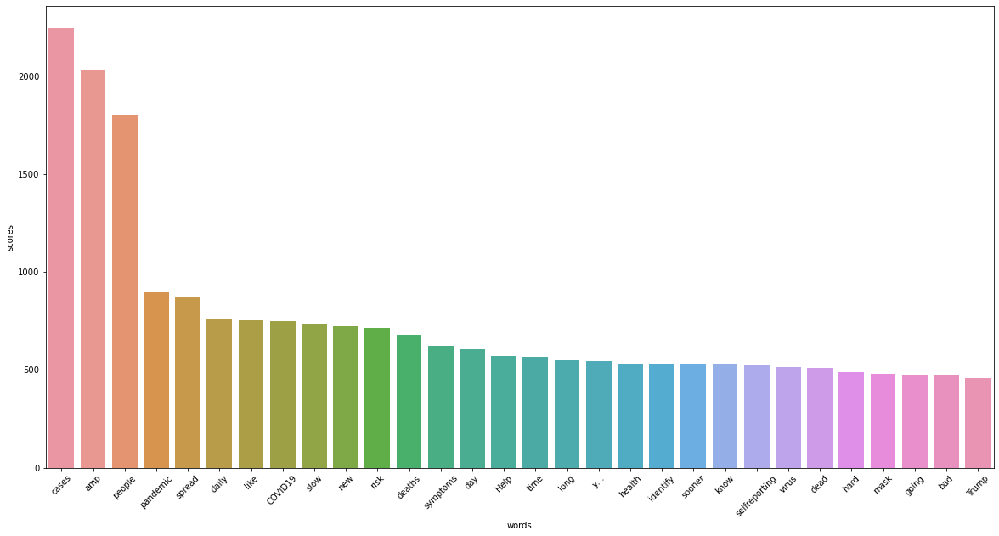

In [64]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neg_df)
plt.xticks(rotation=45)
plt.show()

In [65]:
pos_df = pd.DataFrame(most_common_pos_words.items(), columns=['words', 'scores'])

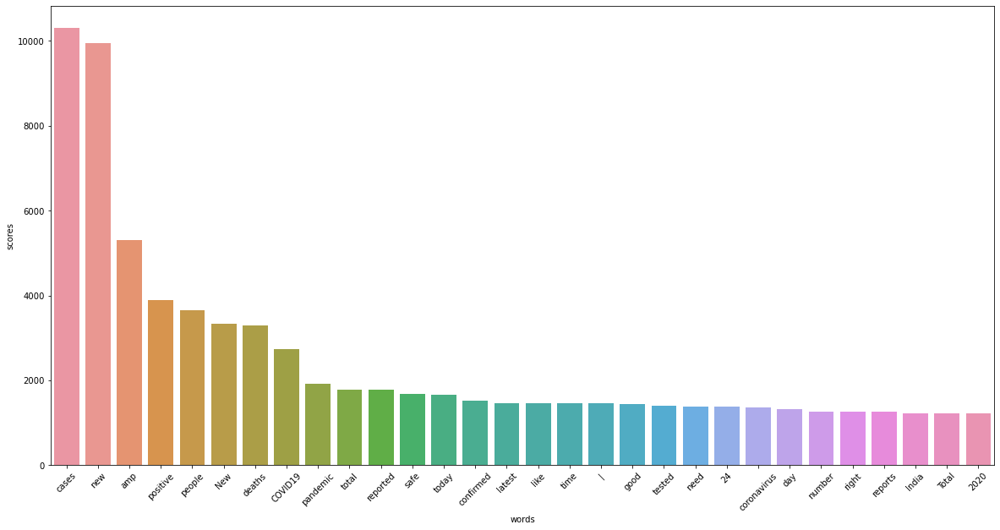

In [66]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=pos_df)
plt.xticks(rotation=45)
plt.show()

In [67]:
from wordcloud import WordCloud

In [68]:
def plot_cloud(docx):
    plt.figure(figsize = (20, 10))
    mywordcloud = WordCloud().generate(docx)
    plt.imshow(mywordcloud)
    plt.axis("off")
    plt.show()

In [73]:
pos_docx = " ".join(pos_tokens)
neg_docx = " ".join(neg_tokens)
neut_docx = " ".join(neut_tokens)


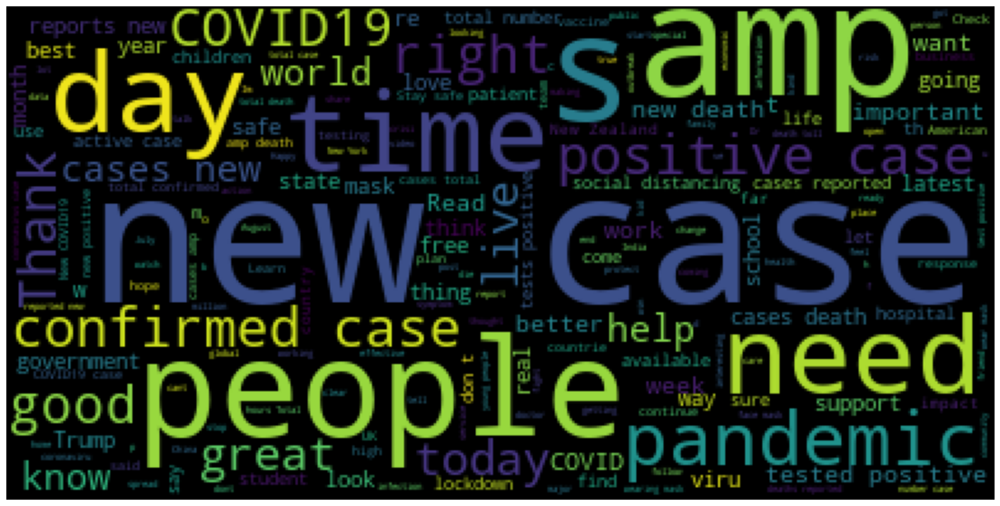

In [75]:
plot_cloud(pos_docx)

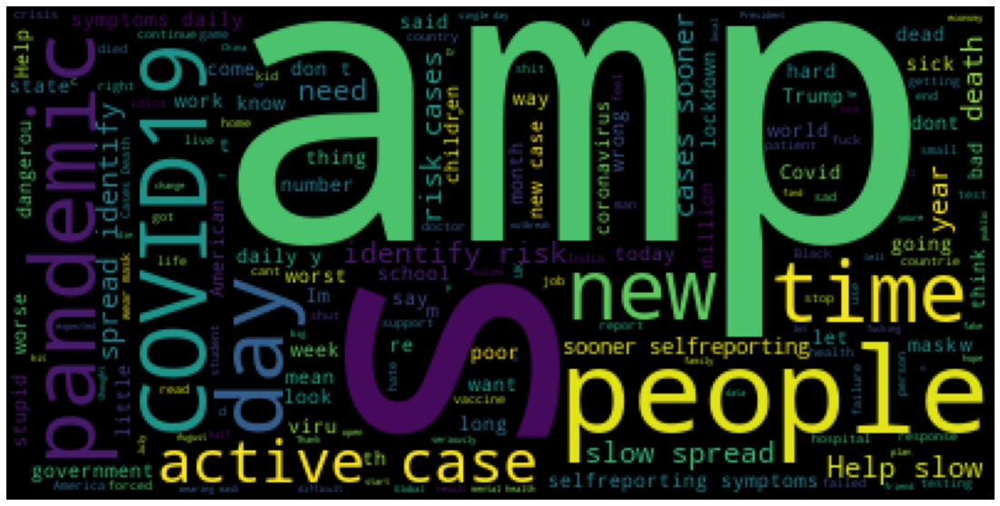

In [76]:

plot_cloud(neg_docx)

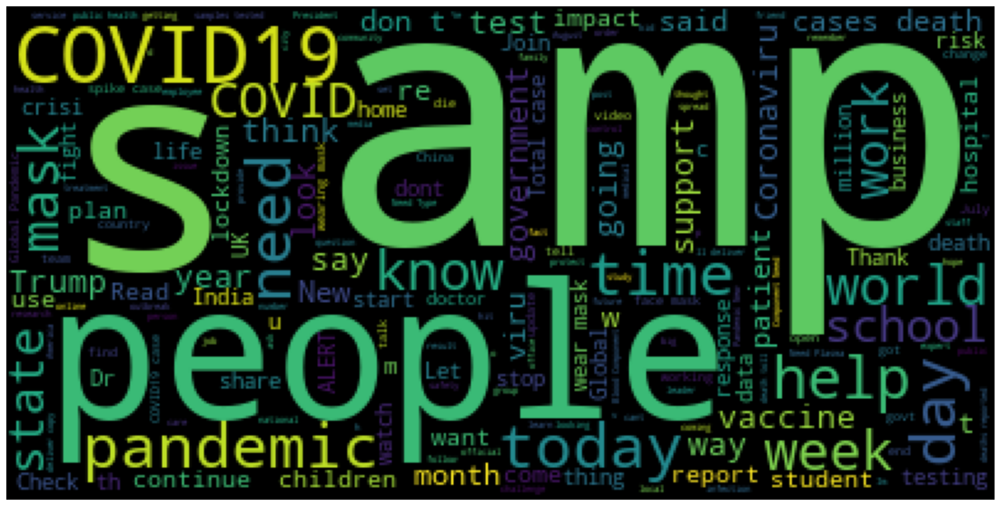

In [77]:

plot_cloud(neut_docx)